In [1]:
#Camera calibration
#Distortion correction
#Color/gradient threshold
#Perspective transform

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [3]:
#Camera calibration


In [4]:
def plot_images(img1, img2, title1, title2, colormap1, colormap2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(img1, cmap=colormap1)
    ax1.set_title(title1, fontsize=30)
    ax2.imshow(img2, cmap=colormap2)
    ax2.set_title(title2, fontsize=30)
    ax1.axis('off');
    ax2.axis('off');
    f.savefig("output_images/" + title2.replace(" ",""), bbox_inches='tight', transparent=True)

In [5]:
def camera_calibration():

    nx = 9
    ny = 6
    cal_images = glob.glob('camera_cal/calibration*.jpg')

    obj_pts = np.zeros((nx*ny, 3), np.float32)
    obj_pts[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    cal_obj_pts = []
    cal_img_pts = []

    for fname in cal_images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            cal_obj_pts.append(obj_pts)
            cal_img_pts.append(corners)
        
    ret, M, dist, rvecs, tvecs = cv2.calibrateCamera(cal_obj_pts, cal_img_pts, gray.shape[::-1], None, None)
    return M, dist

M_cal, dist_cal = camera_calibration()
    
def undistort(img):
    
    return cv2.undistort(img, M_cal, dist_cal, None, M_cal)

In [6]:
print(M_cal, dist_cal)

[[  1.15662906e+03   0.00000000e+00   6.69041438e+02]
 [  0.00000000e+00   1.15169194e+03   3.88137239e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]] [[-0.23157149 -0.1200054  -0.00118338  0.00023305  0.15641575]]


In [7]:
#images = glob.glob('camera_cal/calibration*.jpg')

#img = mpimg.imread(images[0])

#undistort = undistort(img)

#plot_images(img, undistort, 'before', "after", 'gray', 'gray')

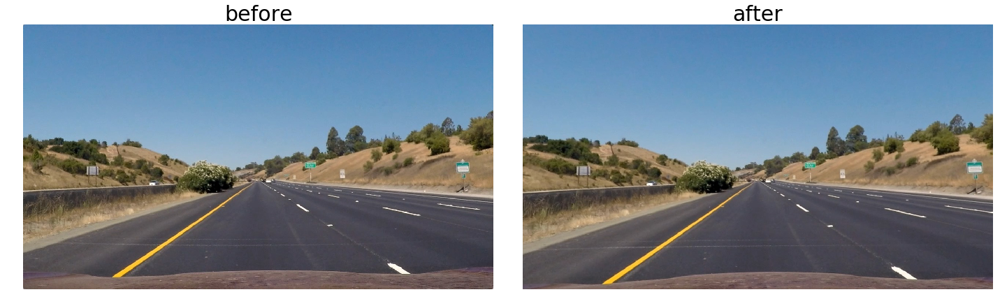

In [8]:
images = glob.glob('test_images/*.jpg')

img_0 = mpimg.imread(images[0])

img_1 = undistort(img_0)

plot_images(img_0, img_1, 'before', "after", 'gray', 'gray')


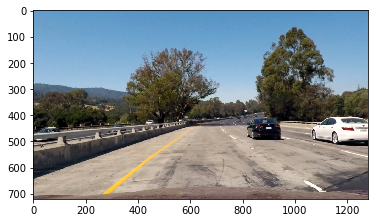

In [9]:
img = mpimg.imread(images[2])

img = undistort(img)
plt.imshow(img)

In [10]:
#Gradient Threshold

#helper function
def r_thresh(img, thresh_min=0, thresh_max=100 ):
    r = img[:, :, 0]
    binary = np.zeros_like(r)
    binary[(r > thresh_min) & (r <= thresh_max)] = 1
    return binary 

def s_thresh(img, thresh_min=0, thresh_max=100 ):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:, :, 2]
    binary = np.zeros_like(s)
    binary[(s > thresh_min) & (s <= thresh_max)] = 1
    return binary 

def l_thresh(img, thresh_min=0, thresh_max=100 ):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l = hls[:, :, 1]
    binary = np.zeros_like(l)
    binary[(l > thresh_min) & (l <= thresh_max)] = 1
    return binary 

def h_thresh(img, thresh_min=0, thresh_max=100 ):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:, :, 0]
    binary = np.zeros_like(h)
    binary[(h > thresh_min) & (h <= thresh_max)] = 1
    return binary 

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def combine_rs(img):
    s_thresh_ = s_thresh(img, thresh_min = 120, thresh_max = 255)
    r_thresh_ = r_thresh(img, thresh_min=140, thresh_max=255)
    pass
    
    


def combine_img_normal(img):
    
    s_thresh_ = s_thresh(img, thresh_min = 150, thresh_max = 255)
    r_thresh_ = r_thresh(img, thresh_min=170, thresh_max=255)
    
    combined = np.zeros_like(s_thresh_)
    
    combined[((s_thresh_==1)|(r_thresh_==1))] = 1
    
    h_thresh_ = h_thresh(img, thresh_min = 120, thresh_max = 255)
    
    combined[((h_thresh_== 1))] =0
    
    return combined



def reduce_car_head(img):
    h_thresh_ = h_thresh(img, thresh_min = 100, thresh_max = 255)
    l_thresh_ = l_thresh(img, thresh_min = 180, thresh_max = 255)
    
    combined = np.zeros_like(s_thresh_)
    combined[((s_thresh_==1)&(l_thresh_==1))] = 1
    
    return combined


def test_combine_img_normal(img):
    warped, M, Minv  = warp(img)
    temp = 0
    shape = warped.shape
    for i in range(500, 700, 1):
        for j in range(shape[1]):
            if warped[i][j] ==1:
                temp += 1
    return temp

    
def combine_img_with_xy(img):
    x_thresh_ = abs_sobel_thresh(img, orient='x', thresh_min=3, thresh_max=40)
    y_thresh_ = abs_sobel_thresh(img, orient='y', thresh_min=3, thresh_max=30)
    
    combined = np.zeros_like(x_thresh_)
    
    combined[((x_thresh_ == 1)&( y_thresh_ ==1))] =1
    
    h_thresh_ = h_thresh(img, thresh_min = 110, thresh_max = 255)

    combined[((h_thresh_== 1))] =0
    
    return combined

def combine_img_with_xy_2nd(img):
    r_thresh_ = r_thresh(img, thresh_min = 120, thresh_max = 255)
    combined = np.zeros_like(r_thresh_)
    
    combined[(r_thresh_ ==1)] =1
    combined[(dir_thresh(img, sobel_kernel=3, thresh=(0.8, 1.6))==1)] = 0
    
    h_thresh_ = h_thresh(img, thresh_min = 110, thresh_max = 255)

    combined[((h_thresh_== 1))] =0
    
    return combined

def reduce_light_hth(img):
    s_thresh_ = s_thresh(img, thresh_min = 150, thresh_max = 255)
    r_thresh_ = r_thresh(img, thresh_min=230, thresh_max=255)
    
    combined = np.zeros_like(s_thresh_)
    
    combined[(s_thresh_==1)|(r_thresh_==1)] = 1
    
    h_thresh_ = h_thresh(img, thresh_min = 100, thresh_max = 255)
    
    combined[(h_thresh_== 1)] =0
    
    return combined

def reduce_light_lth(img):
    s_thresh_ = s_thresh(img, thresh_min = 150, thresh_max = 255)
    r_thresh_ = r_thresh(img, thresh_min=200, thresh_max=255)
    
    combined = np.zeros_like(s_thresh_)
    
    combined[(s_thresh_==1)|(r_thresh_==1)] = 1
    
    h_thresh_ = h_thresh(img, thresh_min = 100, thresh_max = 255)

    
    combined[(h_thresh_== 1)] =0
    
    return combined
    
  
def combine_img(img):
    normal = combine_img_normal(img)
    if test_combine_img_normal(normal) < 800:
        if test_combine_img_normal(combine_img_with_xy(img)) > 4000:
            return combine_img_with_xy_2nd(img)
        else:
            return combine_img_with_xy(img)
        
    if test_combine_img_normal(normal) > 4000:
        if test_combine_img_normal(reduce_light_hth(img))> 1200:
            return reduce_light_hth(img)
        else:
            return reduce_light_lth(img)
        
    else:
        return normal
    
        
    


In [11]:
def find_corners():
    
    straight_line = r_thresh(undistort(mpimg.imread(images[0])), thresh_min=150, thresh_max=255)
    left_upper=[]
    upper = 500
    lower = 690
    for i in range(500, 600, 1):
        if straight_line[upper][i]==1:
            left_upper.append(i)
    c_0 = (np.min(left_upper), upper)
    
    right_upper=[]
    for i in range(650, 780,1):
        if straight_line[upper][i]==1:
            right_upper.append(i)
    c_1 = (np.max(right_upper), upper)

    left_bottom=[]
    for i in range(100, 300,1):
        if straight_line[lower][i]==1:
            left_bottom.append(i)
    c_2 = (np.min(left_bottom), lower)    
    
    right_bottom=[]
    for i in range(900, 1200,1):
        if straight_line[lower][i]==1:
            right_bottom.append(i)
    c_3 = (np.max(right_bottom), lower)
    
    return c_0, c_1, c_2, c_3

In [12]:
def find_corners_2nd():
    
    straight_line = r_thresh(undistort(mpimg.imread(images[1])), thresh_min=150, thresh_max=255)
    left_upper=[]
    upper = 590
    lower = 680
    for i in range(200, 400, 1):
        if straight_line[upper][i]==1:
            left_upper.append(i)
    c_0 = (np.min(left_upper), upper)
    
    right_upper=[]
    for i in range(800, 1200,1):
        if straight_line[upper][i]==1:
            right_upper.append(i)
    c_1 = (np.max(right_upper), upper)

    left_bottom=[]
    for i in range(200, 400,1):
        if straight_line[lower][i]==1:
            left_bottom.append(i)
    c_2 = (np.min(left_bottom), lower)    
    
    right_bottom=[]
    for i in range(800, 1200,1):
        if straight_line[lower][i]==1:
            right_bottom.append(i)
    c_3 = (np.max(right_bottom), lower)
    
    return c_0, c_1, c_2, c_3

In [13]:
def warp(img):
    
    image_height, image_width= img.shape[0:2]
    # Source coordinates
    src = np.float32([find_corners()])
    
    # Destination coordinates
    dst = np.float32([
            [image_width * 0.2, image_height * 0.5],
            [image_width * 0.8, image_height * 0.5],
            [image_width * 0.2, image_height * 1],
            [image_width * 0.8, image_height * 1],
        ])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (image_width, image_height))

    return warped, M, Minv

def warp_2nd(img):
    
    image_height, image_width= img.shape[0:2]
    # Source coordinates
    src = np.float32([find_corners_2nd()])
    
    # Destination coordinates
    dst = np.float32([
            [image_width * 0.2, image_height * 0.8],
            [image_width * 0.8, image_height * 0.8],
            [image_width * 0.2, image_height * 1],
            [image_width * 0.8, image_height * 1],
        ])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (image_width, image_height))

    return warped, M, Minv
    
    
    

In [14]:
print(images)

['test_images\\straight_lines1.jpg', 'test_images\\straight_lines2.jpg', 'test_images\\test1.jpg', 'test_images\\test10.JPG', 'test_images\\test11.JPG', 'test_images\\test12.JPG', 'test_images\\test13.JPG', 'test_images\\test14.JPG', 'test_images\\test15.JPG', 'test_images\\test16.JPG', 'test_images\\test17.JPG', 'test_images\\test18.JPG', 'test_images\\test19.JPG', 'test_images\\test2.jpg', 'test_images\\test20.JPG', 'test_images\\test21.JPG', 'test_images\\test3.jpg', 'test_images\\test4.jpg', 'test_images\\test5.jpg', 'test_images\\test6.jpg', 'test_images\\test7.JPG', 'test_images\\test8.JPG', 'test_images\\test9.JPG']


2426


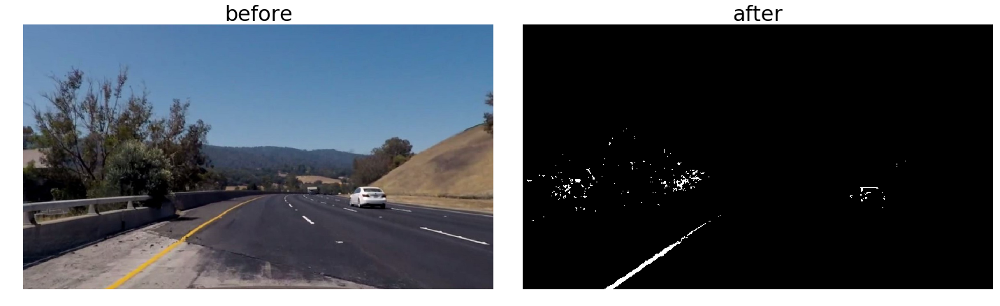

In [15]:
img = undistort(mpimg.imread('test_images\\test21.JPG'))



warped, M, Minv = warp((img))

print(test_combine_img_normal(combine_img(img)))

plot_images(img,  combine_img(img), 'before', "after", 'gray', 'gray')


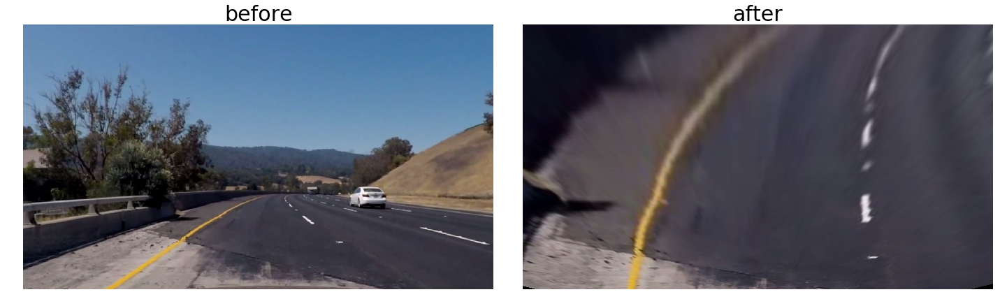

In [16]:
plot_images(img, warped, 'before', "after", 'gray', 'gray')

In [17]:
#Perspective transform


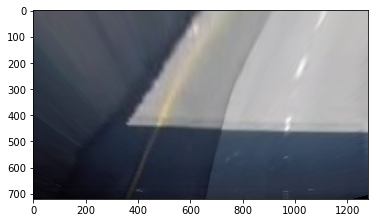

In [18]:
warped, M, Minv = warp(undistort(mpimg.imread(images[8])))


plt.imshow(warped)

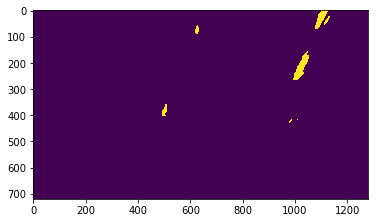

In [19]:
warped, M, Minv = warp(reduce_light_lth(undistort(mpimg.imread(images[8]))))

plt.imshow(warped)

((391, 590), (913, 590), (263, 680), (1058, 680))


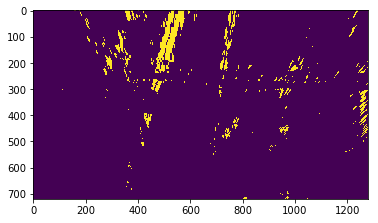

In [20]:
print(find_corners_2nd())

warped, M, Minv = warp_2nd(combine_img(undistort(mpimg.imread(images[8]))))

plt.imshow(warped)

In [21]:
def detect_lane_lines_initial(binary_warped):
    
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Set the width of the windows +/- margin
    margin = 100
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    last_fit = []
    
    # Choose between the two process for searching the lane
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set minimum number of pixels found to recenter window
    minpix = 10
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    #prevent sum of the lower half has zero inds
    
    if len(left_lane_inds) == 0 or len(right_lane_inds) == 0:
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]*3//7:,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        midpoint = np.int(histogram.shape[0]*4//5)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        # Choose the number of sliding windows
        nwindows = 10
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set minimum number of pixels found to recenter window
        minpix = 10
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

            # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        
    
        
    try:
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    except:

        left_fit = [0,0,0]
        right_fit = [0,0,0]

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
      

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
    # Draw polyline on image
    right = np.asarray(tuple(zip(right_fitx, ploty)), np.int32)
    left = np.asarray(tuple(zip(left_fitx, ploty)), np.int32)
    cv2.polylines(out_img, [right], False, (255,255,0), thickness=10)
    cv2.polylines(out_img, [left], False, (255,255,0), thickness=10)
    
    return [left_fit, right_fit], out_img
    

In [22]:
def detect_lane_lines(binary_warped, last_fit):

    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Set the width of the windows +/- margin
    margin = 100
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Choose between the two process for searching the lane

    left_fit = last_fit[0]
    right_fit = last_fit[1]

    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    try:
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    except:
        left_fit = [0,0,0]
        right_fit = [0,0,0]

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    middle_fitx = 1/2.0*((left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2])+(right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]))

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    middle_line_window1 = np.array([np.transpose(np.vstack([middle_fitx-margin, ploty]))])
    middle_line_window2 = np.array([np.flipud(np.transpose(np.vstack([middle_fitx+margin, ploty])))])
    middle_line_pts = np.hstack((middle_line_window1, middle_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([middle_line_pts]), (0,255, 0))
    out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
    # Draw polyline on image
    right = np.asarray(tuple(zip(right_fitx, ploty)), np.int32)
    left = np.asarray(tuple(zip(left_fitx, ploty)), np.int32)
    
    return [left_fit, right_fit, middle_fitx], out_img, nonzeroy[left_lane_inds], nonzerox[left_lane_inds], nonzeroy[right_lane_inds], nonzerox[right_lane_inds]

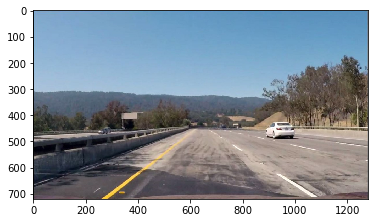

In [23]:
plt.imshow(mpimg.imread(images[14]))

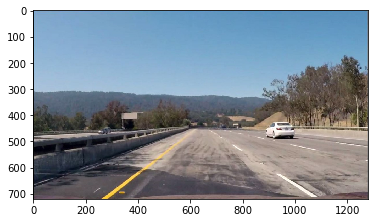

In [24]:

plt.imshow(mpimg.imread(images[14]))




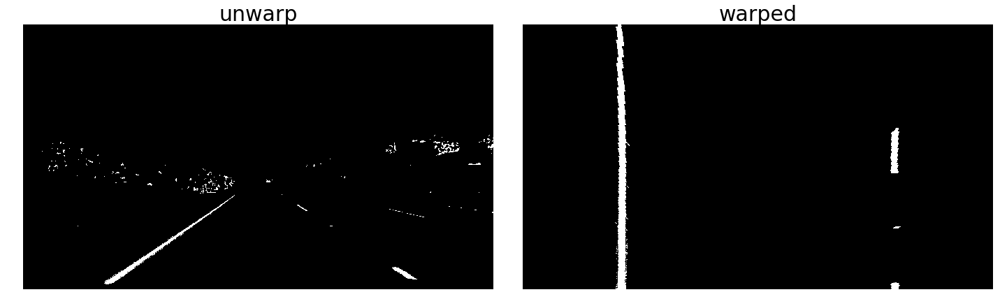

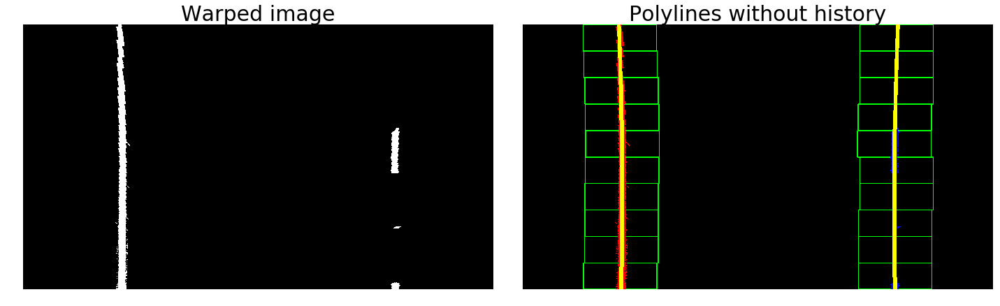

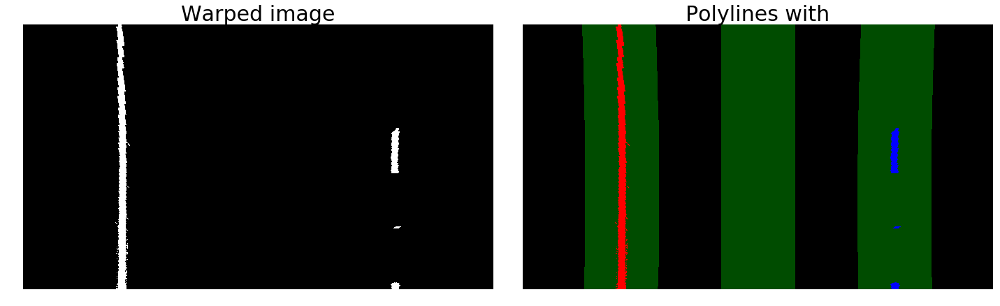

In [25]:
img = combine_img(undistort(mpimg.imread(images[0])))
warped, M, Minv = warp(img)
plot_images(img, warped, 'unwarp', "warped", 'gray', 'gray')


fit, out_img = detect_lane_lines_initial(warped)
plot_images(warped, out_img, 'Warped image', "Polylines without history", 'gray', 'jet')

fit, out_img, leftx, lefty, rightx, righty= detect_lane_lines(warped, fit) 
plot_images(warped, out_img, 'Warped image', "Polylines with", 'gray', 'jet')

In [26]:
#Measuring Curvatures

In [27]:
def curvature(fit, leftx, lefty,rightx, righty):
    
    
    
    ym_per_pix = 25/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    left_fit = fit[0]
    right_fit = fit[1]
    middlex = fit[2]
    shape = [720, 1280]
    ploty = np.linspace(0, shape[0]-1, shape[0] )
    
    try:
        y_eval = max(np.concatenate((lefty, righty), axis=0))
         # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        middle_fit_cr = np.polyfit(ploty*ym_per_pix, middlex*xm_per_pix, 2)
        
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])    
        middle_curverad = ((1 + (2*middle_fit_cr[0]*y_eval*ym_per_pix + middle_fit_cr[1])**2)**1.5) / np.absolute(2*middle_fit_cr[0]) 
        
        # Calculate offset
        offset = ( 640 - ((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]))/2)*xm_per_pix

    except:
        print(leftx, lefty, rightx, righty)
        y_eval = 720
    
        middle_curverad = 0
        left_curverad = 0
        right_curverad = 0
        offset = 0


    
    

    
  
    curvature = round(middle_curverad,2)
    
    if left_curverad > 5000:
        left_curverad = 5000
    if right_curverad > 5000:
        right_curverad = 5000
    if curvature > 5000:
        curvature = 5000
    
    
    # Build outputs


    
    center_offset = round(offset, 2)
    
    # If straight lines

    
    return [left_curverad, right_curverad, curvature], center_offset

curvature(fit, leftx, lefty, rightx, righty)

([5000, 3.5982412066550027, 5000], -0.0)

In [28]:
#Sanity Check

In [29]:
def curvature_check(fit):
    [left_curverad, right_curverad, _],  center_offset = curvature(fit, leftx, lefty,rightx, righty)
    print("curve_diff"+ str(abs(left_curverad - right_curverad)))
    if abs(left_curverad - right_curverad) < 5000:
        return True
    else:
        return False




def parallel(fit):
    left_fit = fit[0]
    right_fit = fit[1]
    lower = left_fit[0]*720**2+left_fit[1]*720 - (right_fit[0]*720**2+right_fit[1]*720)
    print("parallel"+str(abs(lower)))
    if  abs(lower) >350:
        return False
    else:
        return True
    
def good_distance(fit):
    left_fit = fit[0]
    right_fit = fit[1]
    dist = left_fit[0]*360**2+left_fit[1]*360 +left_fit[2] - (right_fit[0]*360**2+right_fit[1]*360+right_fit[2])
    print("distance"+str(dist))
    if 400<abs(dist)<800:
        return True
    else:
        return False

         
def sanity_check(fit):
    if parallel(fit) and good_distance(fit) and curvature_check(fit):
        return True
    else:
        return False

In [30]:
def curvature_check_2nd(fit):
    [left_curverad, right_curverad, _],  center_offset = curvature(fit, leftx, lefty,rightx, righty)
    print("curve_diff"+ str(abs(left_curverad - right_curverad)))
    if abs(left_curverad - right_curverad) < 1000:
        return True
    else:
        return False




def parallel_2nd(fit):
    left_fit = fit[0]
    right_fit = fit[1]
    lower = left_fit[0]*720**2+left_fit[1]*720 - (right_fit[0]*720**2+right_fit[1]*720)
    print("parallel"+str(abs(lower)))
    if  abs(lower) >100:
        return False
    else:
        return True
    
def good_distance_2nd(fit):
    left_fit = fit[0]
    right_fit = fit[1]
    dist = left_fit[0]*360**2+left_fit[1]*360 +left_fit[2] - (right_fit[0]*360**2+right_fit[1]*360+right_fit[2])
    print("distance"+str(dist))
    if 400<abs(dist)<800:
        return True
    else:
        return False

         
def sanity_check_2nd(fit):
    if parallel_2nd(fit) and good_distance_2nd(fit) and curvature_check_2nd(fit):
        return True
    else:
        return False

In [31]:
warped, M, Minv = warp(combine_img(undistort(mpimg.imread(images[9]))))
fit, out_img = detect_lane_lines_initial(warped)
fit, out_img, leftx, lefty, rightx, righty= detect_lane_lines(warped, fit)  
parallel(fit)
good_distance(fit)

print(curvature(fit, leftx, lefty,rightx, righty))

parallel114722.404651
distance-26005.7497393
([105.53398696573417, 35.400959219658759, 1449.8299999999999], 1.25)


In [32]:
def draw_poly(distorted, Minv, fit, left_x, left_y, right_x, right_y):
    undistorted = undistort(distorted)
    # Get left and right polynomial equations
    left_fit = fit[0]
    right_fit = fit[1]
    
    # Draw the polynomial
    ploty = np.linspace(0, undistorted.shape[0], undistorted.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(undistorted[:,:,1]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    

    # Draw the lane onto the warped blank image
    sanity = sanity_check(fit)
    if sanity:
        
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
        # Color in left and right line pixels
    color_warp[left_x, left_y] = [255, 0, 0]
    color_warp[right_x, right_y] = [0, 0, 255]

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (color_warp.shape[1], color_warp.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.6, 0)
    
    return result, sanity


In [33]:
def force_draw_poly(distorted, Minv, fit, left_x, left_y, right_x, right_y):
    undistorted = undistort(distorted)
    # Get left and right polynomial equations
    left_fit = fit[0]
    right_fit = fit[1]
    
    # Draw the polynomial
    ploty = np.linspace(0, undistorted.shape[0], undistorted.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(undistorted[:,:,1]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    

    # Draw the lane onto the warped blank image
    sanity = sanity_check(fit)
        
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
        # Color in left and right line pixels
    color_warp[left_x, left_y] = [255, 0, 0]
    color_warp[right_x, right_y] = [0, 0, 255]

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (color_warp.shape[1], color_warp.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.6, 0)
    
    return result, sanity

In [34]:
def force_draw_poly_2nd(distorted, Minv, fit, left_x, left_y, right_x, right_y):
    undistorted = undistort(distorted)
    # Get left and right polynomial equations
    left_fit = fit[0]
    right_fit = fit[1]
    
    # Draw the polynomial
    ploty = np.linspace(0, undistorted.shape[0], undistorted.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(undistorted[:,:,1]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    

    # Draw the lane onto the warped blank image
    sanity = sanity_check_2nd(fit)
        
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
        # Color in left and right line pixels
    color_warp[left_x, left_y] = [255, 0, 0]
    color_warp[right_x, right_y] = [0, 0, 255]

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (color_warp.shape[1], color_warp.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.6, 0)
    
    return result, sanity

In [35]:
warped, M, Minv =  warp(combine_img(mpimg.imread(images[18])))

In [36]:
history = []

def img_frame(img):
    global history

    warped, M, Minv = warp(combine_img(undistort(img)))
    
    fit, out_img = detect_lane_lines_initial(warped)
    fit, out_img, leftx, lefty, rightx, righty= detect_lane_lines(warped, fit)  
    result, sanity = draw_poly(img, Minv, fit, leftx, lefty, rightx, righty)
    if sanity:
        history = [warped, M, Minv, fit, out_img, leftx, lefty, rightx, righty]
    # Introduce second check
    
    else:  
        warped, M, Minv = warp_2nd(combine_img(undistort(img)))
        fit, out_img = detect_lane_lines_initial(warped)
        fit, out_img, leftx, lefty, rightx, righty= detect_lane_lines(warped, fit)  
        result, sanity_0 = force_draw_poly_2nd(img, Minv, fit, leftx, lefty, rightx, righty)
        if sanity_0:
            history = [warped, M, Minv, fit, out_img, leftx, lefty, rightx, righty]
        
        else:
            [warped, M, Minv, fit, out_img, leftx, lefty, rightx, righty] = history
            result, sanity_1 = force_draw_poly(img, Minv, fit, leftx, lefty, rightx, righty)
        
    
        
    
    [_, _, curv],  center_offset = curvature(fit,leftx, lefty, rightx, righty )
    
    
    return result, curv, center_offset, sanity
    
    
    
        
    

In [37]:
def text_frame(img_in, curvature, offset, sanity):
    
    
    # Text formatting
    fontScale=1
    thickness=2
    fontFace = cv2.FONT_HERSHEY_SIMPLEX
        
    # Curve and center offset text
    if sanity:
        if curvature < 5000:
            curvature = "Curvature: " + str(curvature) + ' m'
        else:
            curvature = "Curvature: Straight Line"
        center_offset = "Center offset: " + str(offset)  + ' m'
    else: 
        curvature = "Curvature: -"
        center_offset = "Center offset: - "
    
    cv2.putText(img_in, curvature, (40,40), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(img_in, center_offset, (40,80), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    
    # Convert to BGR
    result = img_in
    
    return result

In [38]:
def combine_frame(img):
    result, curv, center_offset, sanity = img_frame(img)
    result = text_frame(result, curv, center_offset, sanity)
    
    return result

0
parallel13.9483605277
distance-741.665587601
curve_diff70.1330277461
1
parallel36.1796096936
distance-761.094007321
curve_diff70.1330277461
2
parallel38.3434409902
distance-794.325251866
curve_diff70.1330277461
3
parallel21387.876008
parallel387925.867312
parallel38.3434409902
distance-794.325251866
curve_diff70.1330277461
4
parallel230.284428863
distance-189.515096697
parallel15.7647021411
distance-192.543903578
parallel38.3434409902
distance-794.325251866
curve_diff70.1330277461
5
parallel1712.9767895
parallel43.5430008753
distance-694.803794268
curve_diff70.1330277461
6
parallel324.662526048
distance-496.992270946
curve_diff70.1330277461
7
parallel404.252418544
parallel79.2838279228
distance-579.965760387
curve_diff70.1330277461
8
parallel509.229335224
parallel213.377152915
parallel79.2838279228
distance-579.965760387
curve_diff70.1330277461
9
parallel114722.404651
parallel45460.9299084
parallel79.2838279228
distance-579.965760387
curve_diff70.1330277461
10
parallel0.0
distance0.0

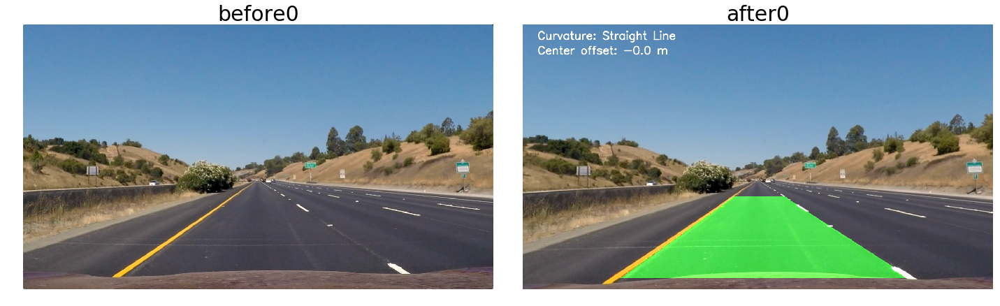

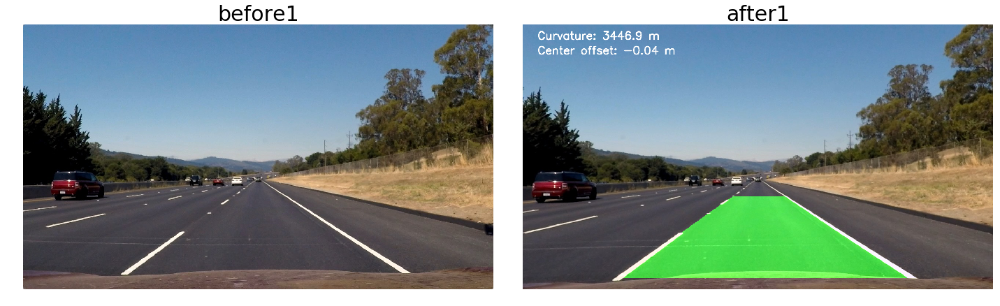

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


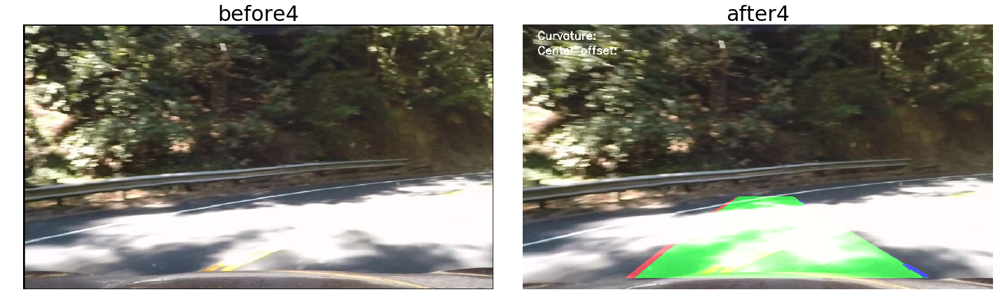

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


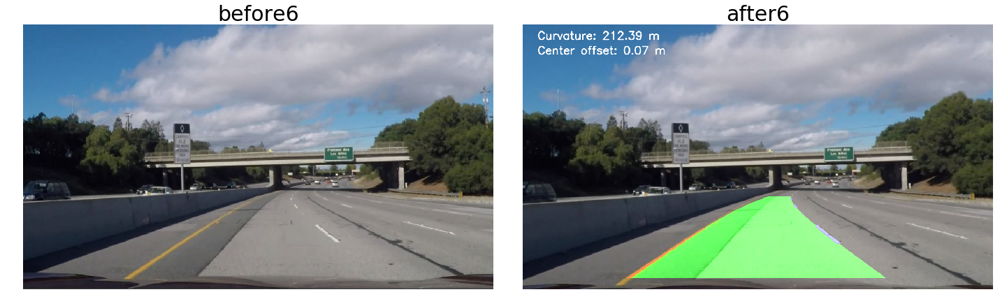

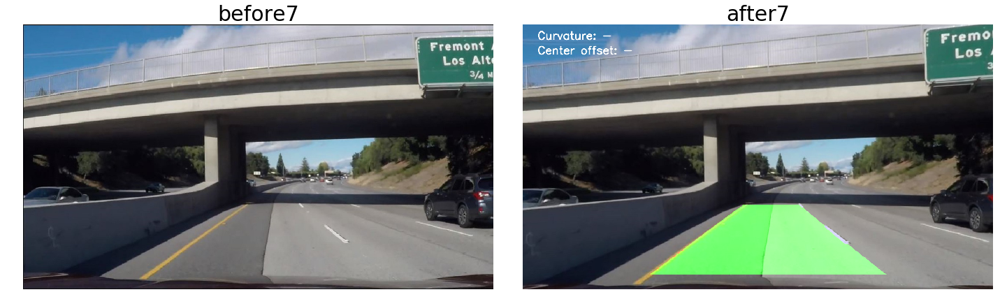

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


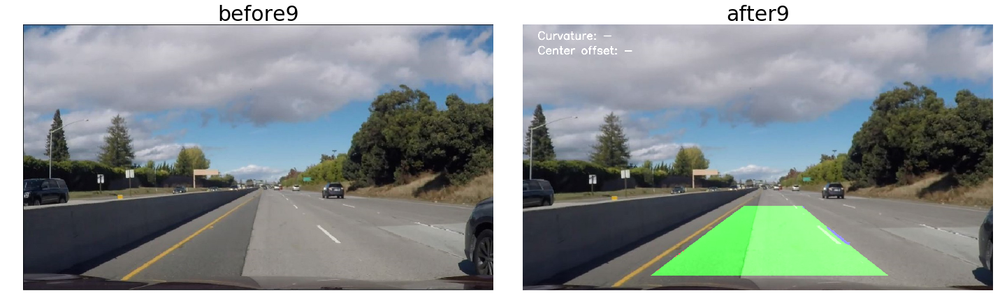

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


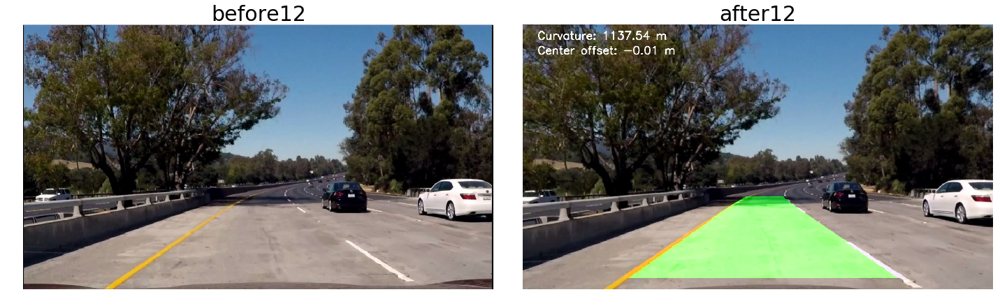

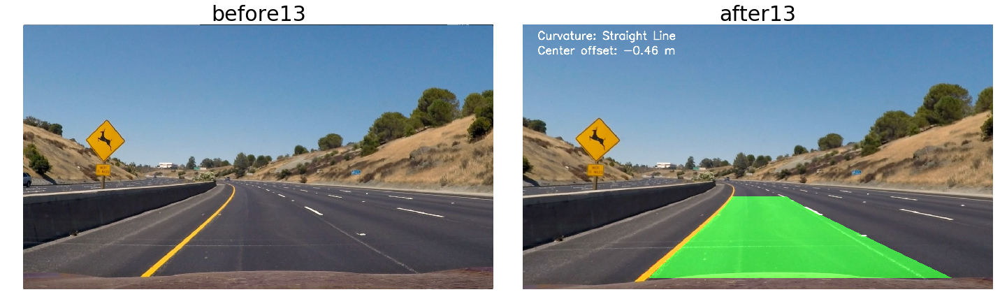

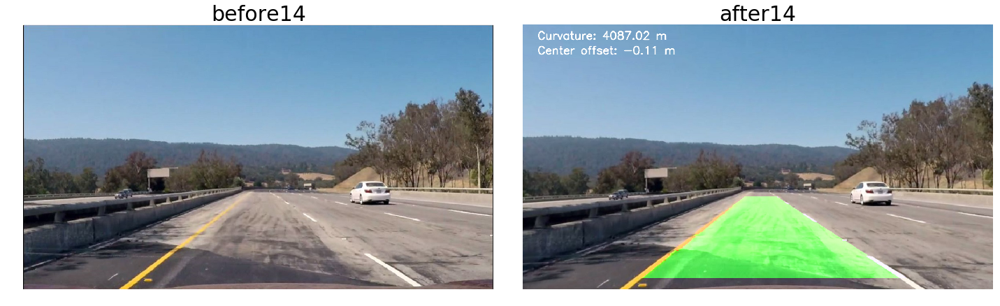

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


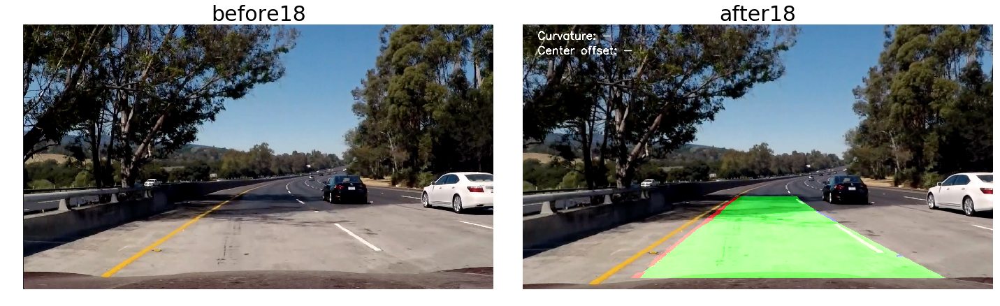

In [39]:
for num in range(19):
    
    print(num)
    plot_images(mpimg.imread(images[num]), combine_frame(mpimg.imread(images[num])), 'before'+str(num), "after"+str(num), 'gray', 'gray')

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel68.9685710021
distance-779.527271571
curve_diff70.1330277461


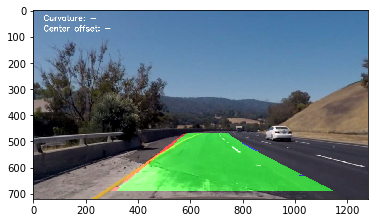

In [40]:
plt.imshow(combine_frame(mpimg.imread('test_images\\test21.JPG')))

parallel230.284428863
distance-189.515096697
parallel15.7647021411
distance-192.543903578
parallel68.9685710021
distance-779.527271571
curve_diff70.1330277461


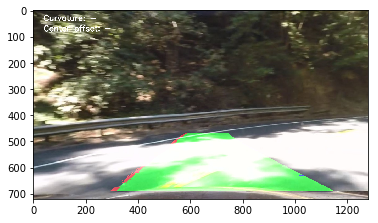

In [41]:
plt.imshow(combine_frame(mpimg.imread(images[4])))

parallel1712.9767895
parallel43.5430008753
distance-694.803794268
curve_diff70.1330277461


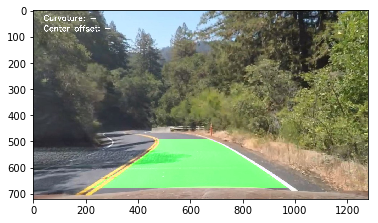

In [42]:
plt.imshow(combine_frame(mpimg.imread(images[5])))

parallel324.662526048
distance-496.992270946
curve_diff70.1330277461


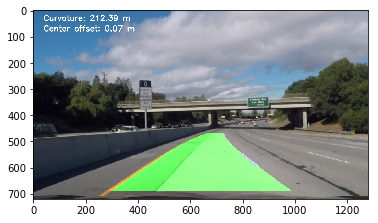

In [43]:
plt.imshow(combine_frame(mpimg.imread(images[6])))

parallel404.252418544
parallel79.2838279228
distance-579.965760387
curve_diff70.1330277461


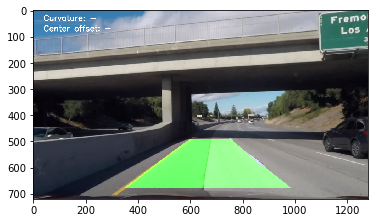

In [44]:
plt.imshow(combine_frame(mpimg.imread(images[7])))

parallel200.921083087
distance-565.680455816
curve_diff70.1330277461


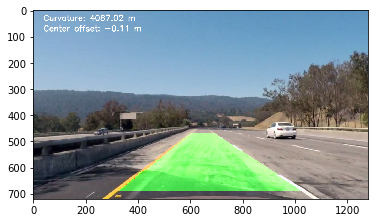

In [45]:
plt.imshow(combine_frame(mpimg.imread(images[14])))

parallel114722.404651
parallel45460.9299084
parallel200.921083087
distance-565.680455816
curve_diff70.1330277461


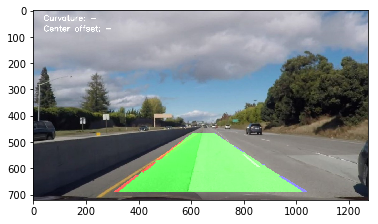

In [46]:
plt.imshow(combine_frame(mpimg.imread(images[9])))

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel200.921083087
distance-565.680455816
curve_diff70.1330277461


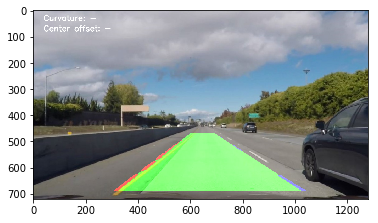

In [47]:
plt.imshow(combine_frame(mpimg.imread(images[10])))

parallel129.122324506
distance-697.127153593
curve_diff70.1330277461


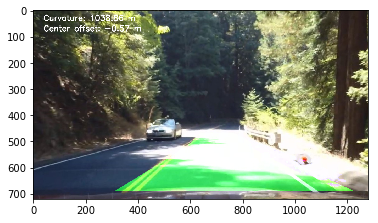

In [48]:
plt.imshow(combine_frame(mpimg.imread(images[11])))

In [49]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [50]:
subclip = VideoFileClip("project_video.mp4").subclip(38, 43)

In [51]:
project_output = 'project_video_output_subclip.mp4'
output_clip = subclip.fl_image(combine_frame)
%time output_clip.write_videofile(project_output, audio=False)



HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

parallel46.1326497787
distance-783.027940945
curve_diff70.1330277461
[MoviePy] >>>> Building video project_video_output_subclip.mp4
[MoviePy] Writing video project_video_output_subclip.mp4


  0%|                                                  | 0/126 [00:00<?, ?it/s]

parallel46.1326497787
distance-783.027940945
curve_diff70.1330277461


  1%|▎                                         | 1/126 [00:01<03:57,  1.90s/it]

parallel64.3590830276
distance-794.659836094
curve_diff70.1330277461


  2%|▋                                         | 2/126 [00:03<03:55,  1.90s/it]

parallel64.0102067382
distance-783.792165985
curve_diff70.1330277461


  2%|█                                         | 3/126 [00:05<03:52,  1.89s/it]

parallel82.3119553813
distance-793.387727267
curve_diff70.1330277461


  3%|█▎                                        | 4/126 [00:07<03:51,  1.89s/it]

parallel45.3524320701
distance-788.08555785
curve_diff70.1330277461


  4%|█▋                                        | 5/126 [00:09<03:49,  1.90s/it]

parallel35.8619591279
distance-781.649457091
curve_diff70.1330277461


  5%|██                                        | 6/126 [00:11<03:48,  1.90s/it]

parallel49.5941828289
distance-790.536914192
curve_diff70.1330277461


  6%|██▎                                       | 7/126 [00:13<03:45,  1.89s/it]

parallel35.7787414105
distance-781.680899889
curve_diff70.1330277461


  6%|██▋                                       | 8/126 [00:15<03:44,  1.91s/it]

parallel42.8915957186
distance-789.864592639
curve_diff70.1330277461


  7%|███                                       | 9/126 [00:17<03:42,  1.90s/it]

parallel23.9504557533
distance-780.05363198
curve_diff70.1330277461


  8%|███▎                                     | 10/126 [00:19<03:45,  1.95s/it]

parallel21.6690984543
distance-779.831160979
curve_diff70.1330277461


  9%|███▌                                     | 11/126 [00:21<03:45,  1.96s/it]

parallel19.6813303356
distance-784.48328051
curve_diff70.1330277461


 10%|███▉                                     | 12/126 [00:23<03:41,  1.94s/it]

parallel3.38081944781
distance-779.144779597
curve_diff70.1330277461


 10%|████▏                                    | 13/126 [00:24<03:37,  1.92s/it]

parallel0.614392702856
distance-783.542105404
curve_diff70.1330277461


 11%|████▌                                    | 14/126 [00:26<03:34,  1.91s/it]

parallel2.87507983379
distance-773.939033857
curve_diff70.1330277461


 12%|████▉                                    | 15/126 [00:28<03:32,  1.91s/it]

parallel16.7133122942
distance-768.521568196
curve_diff70.1330277461


 13%|█████▏                                   | 16/126 [00:30<03:29,  1.91s/it]

parallel20.9644962267
distance-767.913185898
curve_diff70.1330277461


 13%|█████▌                                   | 17/126 [00:32<03:26,  1.89s/it]

parallel39.0051103126
distance-759.786343093
curve_diff70.1330277461


 14%|█████▊                                   | 18/126 [00:34<03:24,  1.89s/it]

parallel42.5200563521
distance-759.692104485
curve_diff70.1330277461


 15%|██████▏                                  | 19/126 [00:36<03:21,  1.88s/it]

parallel23.3594363804
distance-769.189967461
curve_diff70.1330277461


 16%|██████▌                                  | 20/126 [00:38<03:21,  1.90s/it]

parallel15.5910191109
distance-765.478153641
curve_diff70.1330277461


 17%|██████▊                                  | 21/126 [00:40<03:20,  1.91s/it]

parallel16.1472604537
distance-764.866425046
curve_diff70.1330277461


 17%|███████▏                                 | 22/126 [00:42<03:22,  1.94s/it]

parallel26.0067513339
distance-757.577918903
curve_diff70.1330277461


 18%|███████▍                                 | 23/126 [00:44<03:21,  1.96s/it]

parallel21.1797610632
distance-764.06431566
curve_diff70.1330277461


 19%|███████▊                                 | 24/126 [00:46<03:17,  1.94s/it]

parallel23.773755396
distance-763.1834239
curve_diff70.1330277461


 20%|████████▏                                | 25/126 [00:47<03:13,  1.92s/it]

parallel44.4311173948
distance-756.396377624
curve_diff70.1330277461


 21%|████████▍                                | 26/126 [00:49<03:11,  1.92s/it]

parallel58.6113776352
distance-759.31694108
curve_diff70.1330277461


 21%|████████▊                                | 27/126 [00:51<03:08,  1.91s/it]

parallel19.1983123769
distance-751.397935159
curve_diff70.1330277461


 22%|█████████                                | 28/126 [00:53<03:06,  1.90s/it]

parallel1.04762845245
distance-749.068922427
curve_diff70.1330277461


 23%|█████████▍                               | 29/126 [00:55<03:04,  1.91s/it]

parallel5.0575273972
distance-752.806729006
curve_diff70.1330277461


 24%|█████████▊                               | 30/126 [00:57<03:05,  1.93s/it]

parallel11.9074817621
distance-757.651655964
curve_diff70.1330277461


 25%|██████████                               | 31/126 [00:59<03:04,  1.94s/it]

parallel18.4087872152
distance-763.339071666
curve_diff70.1330277461


 25%|██████████▍                              | 32/126 [01:01<03:01,  1.93s/it]

parallel12.2155945025
distance-764.981909716
curve_diff70.1330277461


 26%|██████████▋                              | 33/126 [01:03<02:58,  1.92s/it]

parallel24.7974744051
distance-775.770955647
curve_diff70.1330277461


 27%|███████████                              | 34/126 [01:05<02:56,  1.92s/it]

parallel14.5427787562
distance-773.444451333
curve_diff70.1330277461


 28%|███████████▍                             | 35/126 [01:07<02:54,  1.91s/it]

parallel15.0312397971
distance-769.624226761
curve_diff70.1330277461


 29%|███████████▋                             | 36/126 [01:09<02:53,  1.93s/it]

parallel5.16943920347
distance-772.559806349
curve_diff70.1330277461


 29%|████████████                             | 37/126 [01:10<02:51,  1.93s/it]

parallel28.2395291072
distance-763.505566401
curve_diff70.1330277461


 30%|████████████▎                            | 38/126 [01:12<02:50,  1.93s/it]

parallel31.9277619941
distance-768.960000634
curve_diff70.1330277461


 31%|████████████▋                            | 39/126 [01:14<02:48,  1.94s/it]

parallel44.9135823029
distance-776.466074003
curve_diff70.1330277461


 32%|█████████████                            | 40/126 [01:16<02:44,  1.91s/it]

parallel63.3096444654
distance-778.090250006
curve_diff70.1330277461


 33%|█████████████▎                           | 41/126 [01:18<02:41,  1.90s/it]

parallel84.3281410407
distance-788.135287921
curve_diff70.1330277461


 33%|█████████████▋                           | 42/126 [01:20<02:40,  1.91s/it]

parallel60.7527601591
distance-778.559411448
curve_diff70.1330277461


 34%|█████████████▉                           | 43/126 [01:22<02:39,  1.92s/it]

parallel47.3008526704
distance-774.298124764
curve_diff70.1330277461


 35%|██████████████▎                          | 44/126 [01:24<02:37,  1.92s/it]

parallel42.5980236936
distance-770.743710052
curve_diff70.1330277461


 36%|██████████████▋                          | 45/126 [01:26<02:35,  1.92s/it]

parallel44.2463312044
distance-774.32728592
curve_diff70.1330277461


 37%|██████████████▉                          | 46/126 [01:28<02:34,  1.93s/it]

parallel50.3186388372
distance-785.929765001
curve_diff70.1330277461


 37%|███████████████▎                         | 47/126 [01:30<02:32,  1.93s/it]

parallel50.3701033808
distance-787.008094563
curve_diff70.1330277461


 38%|███████████████▌                         | 48/126 [01:32<02:30,  1.93s/it]

parallel63.9630498232
distance-802.476071049
parallel111.172507728
parallel50.3701033808
distance-787.008094563
curve_diff70.1330277461


 39%|███████████████▉                         | 49/126 [01:35<03:13,  2.51s/it]

parallel50.4938541101
distance-802.840849549
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 40%|████████████████▎                        | 50/126 [01:39<03:40,  2.90s/it]

parallel50.5419020419
distance-808.457525608
parallel14.6992514361
distance-800.493697592
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 40%|████████████████▌                        | 51/126 [01:43<04:00,  3.20s/it]

parallel83.1575747892
distance-837.36949716
parallel4.68910167352
distance-819.512778734
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 41%|████████████████▉                        | 52/126 [01:47<04:12,  3.41s/it]

parallel110.673827955
distance-860.692101898
parallel23.1367246926
distance-834.002597099
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 42%|█████████████████▏                       | 53/126 [01:51<04:19,  3.56s/it]

parallel147.221290838
distance-886.628779367
parallel43.4564887292
distance-853.074090097
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 43%|█████████████████▌                       | 54/126 [01:55<04:23,  3.66s/it]

parallel124.650394871
distance-882.347659089
parallel41.8643456982
distance-852.617721119
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 44%|█████████████████▉                       | 55/126 [01:59<04:25,  3.74s/it]

parallel32.3112595364
distance-814.539825757
parallel15.4037313507
distance-805.872915303
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 44%|██████████████████▏                      | 56/126 [02:03<04:26,  3.81s/it]

parallel48.905463588
distance-821.148799024
parallel2.80612302021
distance-809.850817458
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 45%|██████████████████▌                      | 57/126 [02:07<04:25,  3.84s/it]

parallel0.369673702943
distance-786.226759597
curve_diff70.1330277461


 46%|██████████████████▊                      | 58/126 [02:09<03:42,  3.28s/it]

parallel24.4252530447
distance-791.686792811
curve_diff70.1330277461


 47%|███████████████████▏                     | 59/126 [02:11<03:13,  2.88s/it]

parallel47.30776111
distance-807.906060781
parallel7.61628999166
distance-796.781341746
curve_diff70.1330277461


 48%|███████████████████▌                     | 60/126 [02:15<03:34,  3.26s/it]

parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 48%|███████████████████▊                     | 61/126 [02:17<03:05,  2.86s/it]

parallel106.192362925
distance-830.918506397
parallel3.67388588942
distance-809.078897999
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 49%|████████████████████▏                    | 62/126 [02:21<03:28,  3.26s/it]

parallel110.501510797
distance-832.852577885
parallel17.9822626704
distance-809.871187099
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 50%|████████████████████▌                    | 63/126 [02:25<03:38,  3.46s/it]

parallel115.440387007
distance-832.086236325
parallel19.8222826259
distance-807.88291764
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 51%|████████████████████▊                    | 64/126 [02:29<03:44,  3.63s/it]

parallel126.379874351
distance-839.2529
parallel30.8468123635
distance-810.629312469
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 52%|█████████████████████▏                   | 65/126 [02:33<03:46,  3.71s/it]

parallel134.750823124
distance-838.974490569
parallel35.1095780354
distance-809.998872841
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 52%|█████████████████████▍                   | 66/126 [02:37<03:45,  3.76s/it]

parallel133.26001165
distance-841.596924061
parallel39.6949050539
distance-812.00585777
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 53%|█████████████████████▊                   | 67/126 [02:41<03:48,  3.88s/it]

parallel96.4444848365
distance-832.990618294
parallel34.1133509703
distance-807.478213267
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 54%|██████████████████████▏                  | 68/126 [02:45<03:47,  3.92s/it]

parallel99.4370976109
distance-835.239582187
parallel37.6187610434
distance-810.1517035
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 55%|██████████████████████▍                  | 69/126 [02:49<03:42,  3.90s/it]

parallel110.532123085
distance-844.168003718
parallel55.2396575048
distance-817.452974537
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 56%|██████████████████████▊                  | 70/126 [02:53<03:38,  3.91s/it]

parallel79.6544400587
distance-825.993597623
parallel54.8291998504
distance-807.709115367
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 56%|███████████████████████                  | 71/126 [02:56<03:34,  3.90s/it]

parallel102.725262974
distance-839.965132153
parallel42.4315569062
distance-816.121785253
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 57%|███████████████████████▍                 | 72/126 [03:00<03:31,  3.92s/it]

parallel116.509424675
distance-854.616849929
parallel52.9768920318
distance-828.127351763
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 58%|███████████████████████▊                 | 73/126 [03:04<03:26,  3.89s/it]

parallel82.0602905606
distance-860.175695726
parallel47.1771879664
distance-834.894015473
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 59%|████████████████████████                 | 74/126 [03:08<03:22,  3.90s/it]

parallel78.1831037678
distance-869.762448121
parallel49.8770570267
distance-845.629046003
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 60%|████████████████████████▍                | 75/126 [03:12<03:19,  3.91s/it]

parallel46.369533551
distance-846.191992205
parallel28.2254287547
distance-825.567595208
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 60%|████████████████████████▋                | 76/126 [03:16<03:16,  3.92s/it]

parallel77.7388853101
distance-830.708019631
parallel3.23646688556
distance-817.118523819
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 61%|█████████████████████████                | 77/126 [03:20<03:11,  3.91s/it]

parallel4.28372238835
distance-815.790473445
parallel7.27069589229
distance-806.831766952
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 62%|█████████████████████████▍               | 78/126 [03:24<03:07,  3.91s/it]

parallel100.009568826
distance-820.150471143
parallel1.01409325456
distance-801.090787998
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 63%|█████████████████████████▋               | 79/126 [03:28<03:04,  3.93s/it]

parallel28.949259296
distance-835.908028488
parallel10.6820103361
distance-808.340257258
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 63%|██████████████████████████               | 80/126 [03:32<03:00,  3.91s/it]

parallel69.5724578284
distance-811.235965888
parallel15.3345267669
distance-804.322552382
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 64%|██████████████████████████▎              | 81/126 [03:36<02:55,  3.91s/it]

parallel16.6639464962
distance-807.99388139
parallel27.4180962746
distance-804.74135016
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 65%|██████████████████████████▋              | 82/126 [03:39<02:51,  3.90s/it]

parallel7.00459215639
distance-821.305361274
parallel1.25353220374
distance-811.843569839
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 66%|███████████████████████████              | 83/126 [03:43<02:47,  3.89s/it]

parallel16.4713428972
distance-818.792605
parallel8.83610646854
distance-805.847212307
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 67%|███████████████████████████▎             | 84/126 [03:47<02:44,  3.91s/it]

parallel60.9659659067
distance-796.05596697
curve_diff70.1330277461


 67%|███████████████████████████▋             | 85/126 [03:49<02:15,  3.31s/it]

parallel58.7670064842
distance-776.890321524
curve_diff70.1330277461


 68%|███████████████████████████▉             | 86/126 [03:51<01:55,  2.89s/it]

parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 69%|████████████████████████████▎            | 87/126 [03:53<01:41,  2.59s/it]

parallel217477.867499
parallel45959.1114769
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 70%|████████████████████████████▋            | 88/126 [03:57<01:52,  2.96s/it]

parallel297756.898572
parallel123339.098351
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 71%|████████████████████████████▉            | 89/126 [04:01<01:58,  3.20s/it]

parallel67593.5666637
parallel29780.0122187
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 71%|█████████████████████████████▎           | 90/126 [04:04<02:01,  3.38s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 72%|█████████████████████████████▌           | 91/126 [04:08<02:03,  3.52s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 73%|█████████████████████████████▉           | 92/126 [04:12<02:03,  3.63s/it]

parallel991.660849499
parallel1111.61725779
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 74%|██████████████████████████████▎          | 93/126 [04:16<02:02,  3.72s/it]

parallel1095.55045782
parallel2200.99887479
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 75%|██████████████████████████████▌          | 94/126 [04:20<02:03,  3.87s/it]

parallel98.859004608
distance-801.921572535
parallel1274.15595801
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 75%|██████████████████████████████▉          | 95/126 [04:24<02:00,  3.88s/it]

parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 76%|███████████████████████████████▏         | 96/126 [04:26<01:38,  3.30s/it]

parallel561108.275704
parallel1215.67102067
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 77%|███████████████████████████████▌         | 97/126 [04:30<01:41,  3.49s/it]

parallel142.486483151
distance-829.533577829
parallel601.265179706
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 78%|███████████████████████████████▉         | 98/126 [04:34<01:40,  3.58s/it]

parallel109.944477941
distance-841.401102712
parallel70.3723641173
distance-807.740088231
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 79%|████████████████████████████████▏        | 99/126 [04:38<01:38,  3.66s/it]

parallel87.9623590475
distance-857.00559645
parallel78.6961449358
distance-821.072655803
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 79%|███████████████████████████████▋        | 100/126 [04:41<01:35,  3.69s/it]

parallel92.4581267018
distance-840.890621934
parallel40.382649897
distance-815.899046263
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 80%|████████████████████████████████        | 101/126 [04:45<01:32,  3.72s/it]

parallel45.645644003
distance-838.789343906
parallel20.8155746683
distance-819.111560235
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 81%|████████████████████████████████▍       | 102/126 [04:49<01:29,  3.73s/it]

parallel55.2679082866
distance-847.442704975
parallel32.5422960277
distance-829.048449278
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 82%|████████████████████████████████▋       | 103/126 [04:53<01:26,  3.76s/it]

parallel9.48954765532
distance-806.365826435
parallel3.81138525164
distance-804.445008517
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|█████████████████████████████████       | 104/126 [04:57<01:22,  3.77s/it]

parallel33.6941361496
distance-785.554327889
curve_diff70.1330277461


 83%|█████████████████████████████████▎      | 105/126 [04:59<01:09,  3.32s/it]

parallel37.6417174026
distance-772.361567928
curve_diff70.1330277461


 84%|█████████████████████████████████▋      | 106/126 [05:01<00:57,  2.87s/it]

parallel54.808760824
distance-756.886737485
curve_diff70.1330277461


 85%|█████████████████████████████████▉      | 107/126 [05:02<00:48,  2.57s/it]

parallel51.9837367512
distance-750.834938526
curve_diff70.1330277461


 86%|██████████████████████████████████▎     | 108/126 [05:04<00:42,  2.36s/it]

parallel64.9846587453
distance-733.080873406
curve_diff70.1330277461


 87%|██████████████████████████████████▌     | 109/126 [05:06<00:37,  2.23s/it]

parallel78.8596635292
distance-716.844780945
curve_diff70.1330277461


 87%|██████████████████████████████████▉     | 110/126 [05:08<00:33,  2.12s/it]

parallel90.0069571725
distance-699.53372495
curve_diff70.1330277461


 88%|███████████████████████████████████▏    | 111/126 [05:10<00:30,  2.05s/it]

parallel73.1685258062
distance-701.979715464
curve_diff70.1330277461


 89%|███████████████████████████████████▌    | 112/126 [05:12<00:28,  2.02s/it]

parallel36.131804833
distance-733.982041984
curve_diff70.1330277461


 90%|███████████████████████████████████▊    | 113/126 [05:14<00:26,  2.00s/it]

parallel14.2946423978
distance-749.702716298
curve_diff70.1330277461


 90%|████████████████████████████████████▏   | 114/126 [05:16<00:23,  1.97s/it]

parallel23.0147604424
distance-774.570793989
curve_diff70.1330277461


 91%|████████████████████████████████████▌   | 115/126 [05:18<00:21,  1.97s/it]

parallel42.7641838856
distance-788.942996717
curve_diff70.1330277461


 92%|████████████████████████████████████▊   | 116/126 [05:20<00:19,  1.96s/it]

parallel32.6477286945
distance-783.761111133
curve_diff70.1330277461


 93%|█████████████████████████████████████▏  | 117/126 [05:22<00:17,  1.94s/it]

parallel41.9881888142
distance-785.301406319
curve_diff70.1330277461


 94%|█████████████████████████████████████▍  | 118/126 [05:24<00:15,  1.95s/it]

parallel22.4035744056
distance-775.538623557
curve_diff70.1330277461


 94%|█████████████████████████████████████▊  | 119/126 [05:26<00:13,  1.94s/it]

parallel3.69369234647
distance-774.063289423
curve_diff70.1330277461


 95%|██████████████████████████████████████  | 120/126 [05:27<00:11,  1.93s/it]

parallel33.5828976381
distance-782.448785768
curve_diff70.1330277461


 96%|██████████████████████████████████████▍ | 121/126 [05:29<00:09,  1.94s/it]

parallel47.4622671114
distance-773.009328018
curve_diff70.1330277461


 97%|██████████████████████████████████████▋ | 122/126 [05:31<00:07,  1.92s/it]

parallel45.7324299852
distance-777.670871608
curve_diff70.1330277461


 98%|███████████████████████████████████████ | 123/126 [05:33<00:05,  1.92s/it]

parallel33.3427482807
distance-772.813038097
curve_diff70.1330277461


 98%|███████████████████████████████████████▎| 124/126 [05:35<00:03,  1.92s/it]

parallel34.8713450913
distance-768.149826624
curve_diff70.1330277461


 99%|███████████████████████████████████████▋| 125/126 [05:37<00:01,  1.92s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_subclip.mp4 

Wall time: 5min 39s


In [52]:




project_output = 'project_video_output_1.mp4'
clip = VideoFileClip("project_video.mp4")
output_clip = clip.fl_image(combine_frame)
%time output_clip.write_videofile(project_output, audio=False)



HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

parallel2.58558909455
distance-755.753956662
curve_diff70.1330277461
[MoviePy] >>>> Building video project_video_output_1.mp4
[MoviePy] Writing video project_video_output_1.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

parallel2.58558909455
distance-755.753956662
curve_diff70.1330277461


  0%|                                         | 1/1261 [00:01<40:23,  1.92s/it]

parallel3.65752219866
distance-751.496054397
curve_diff70.1330277461


  0%|                                         | 2/1261 [00:03<40:07,  1.91s/it]

parallel6.03398296014
distance-747.702771534
curve_diff70.1330277461


  0%|                                         | 3/1261 [00:05<40:07,  1.91s/it]

parallel13.7199909999
distance-744.896584689
curve_diff70.1330277461


  0%|▏                                        | 4/1261 [00:07<40:09,  1.92s/it]

parallel10.1759430881
distance-743.676116968
curve_diff70.1330277461


  0%|▏                                        | 5/1261 [00:09<39:56,  1.91s/it]

parallel15.3031016553
distance-739.629587641
curve_diff70.1330277461


  0%|▏                                        | 6/1261 [00:11<39:58,  1.91s/it]

parallel14.1271571696
distance-743.264160235
curve_diff70.1330277461


  1%|▏                                        | 7/1261 [00:13<39:44,  1.90s/it]

parallel22.6953995349
distance-737.033500933
curve_diff70.1330277461


  1%|▎                                        | 8/1261 [00:15<39:38,  1.90s/it]

parallel12.8115311709
distance-740.994202199
curve_diff70.1330277461


  1%|▎                                        | 9/1261 [00:17<39:36,  1.90s/it]

parallel10.3693147985
distance-742.439478898
curve_diff70.1330277461


  1%|▎                                       | 10/1261 [00:18<39:22,  1.89s/it]

parallel12.6566863014
distance-739.721049551
curve_diff70.1330277461


  1%|▎                                       | 11/1261 [00:20<39:26,  1.89s/it]

parallel9.9948743568
distance-755.312369476
curve_diff70.1330277461


  1%|▍                                       | 12/1261 [00:22<39:15,  1.89s/it]

parallel8.35871686095
distance-752.001433724
curve_diff70.1330277461


  1%|▍                                       | 13/1261 [00:24<39:16,  1.89s/it]

parallel6.52136921069
distance-749.438770381
curve_diff70.1330277461


  1%|▍                                       | 14/1261 [00:26<39:02,  1.88s/it]

parallel8.53326726334
distance-738.741971478
curve_diff70.1330277461


  1%|▍                                       | 15/1261 [00:28<39:08,  1.88s/it]

parallel15.0596060215
distance-728.993976837
curve_diff70.1330277461


  1%|▌                                       | 16/1261 [00:30<39:09,  1.89s/it]

parallel18.1667082137
distance-728.689288019
curve_diff70.1330277461


  1%|▌                                       | 17/1261 [00:32<39:14,  1.89s/it]

parallel11.6518432995
distance-724.235157068
curve_diff70.1330277461


  1%|▌                                       | 18/1261 [00:34<38:56,  1.88s/it]

parallel3.35130227642
distance-731.863892593
curve_diff70.1330277461


  2%|▌                                       | 19/1261 [00:35<38:57,  1.88s/it]

parallel3.64545072518
distance-738.944891724
curve_diff70.1330277461


  2%|▋                                       | 20/1261 [00:38<41:20,  2.00s/it]

parallel6.2182275035
distance-747.952616253
curve_diff70.1330277461


  2%|▋                                       | 21/1261 [00:40<40:39,  1.97s/it]

parallel15.5079854758
distance-757.470000722
curve_diff70.1330277461


  2%|▋                                       | 22/1261 [00:42<40:32,  1.96s/it]

parallel20.1694186081
distance-764.765481234
curve_diff70.1330277461


  2%|▋                                       | 23/1261 [00:43<40:19,  1.95s/it]

parallel14.5488111802
distance-760.761584004
curve_diff70.1330277461


  2%|▊                                       | 24/1261 [00:45<40:32,  1.97s/it]

parallel4.93211438281
distance-757.552291612
curve_diff70.1330277461


  2%|▊                                       | 25/1261 [00:47<40:21,  1.96s/it]

parallel17.8275999443
distance-767.747181189
curve_diff70.1330277461


  2%|▊                                       | 26/1261 [00:49<40:05,  1.95s/it]

parallel14.1176479524
distance-770.49277272
curve_diff70.1330277461


  2%|▊                                       | 27/1261 [00:51<39:49,  1.94s/it]

parallel24.354498021
distance-779.32537428
curve_diff70.1330277461


  2%|▉                                       | 28/1261 [00:53<39:32,  1.92s/it]

parallel14.4625752306
distance-774.182554205
curve_diff70.1330277461


  2%|▉                                       | 29/1261 [00:55<39:15,  1.91s/it]

parallel1.74227989151
distance-765.443647446
curve_diff70.1330277461


  2%|▉                                       | 30/1261 [00:57<39:12,  1.91s/it]

parallel19.9705563729
distance-758.33293789
curve_diff70.1330277461


  2%|▉                                       | 31/1261 [00:59<38:52,  1.90s/it]

parallel28.5656731026
distance-745.567105446
curve_diff70.1330277461


  3%|█                                       | 32/1261 [01:01<38:50,  1.90s/it]

parallel16.3391257892
distance-752.440295673
curve_diff70.1330277461


  3%|█                                       | 33/1261 [01:03<38:48,  1.90s/it]

parallel34.6864410061
distance-747.129680726
curve_diff70.1330277461


  3%|█                                       | 34/1261 [01:04<38:40,  1.89s/it]

parallel36.709669767
distance-744.021321106
curve_diff70.1330277461


  3%|█                                       | 35/1261 [01:06<38:26,  1.88s/it]

parallel37.7828572999
distance-737.524620286
curve_diff70.1330277461


  3%|█▏                                      | 36/1261 [01:08<38:31,  1.89s/it]

parallel37.5328450635
distance-733.833418266
curve_diff70.1330277461


  3%|█▏                                      | 37/1261 [01:10<38:51,  1.90s/it]

parallel36.8951619854
distance-730.134096058
curve_diff70.1330277461


  3%|█▏                                      | 38/1261 [01:12<38:53,  1.91s/it]

parallel41.3931200403
distance-723.37061546
curve_diff70.1330277461


  3%|█▏                                      | 39/1261 [01:14<38:41,  1.90s/it]

parallel33.2730237644
distance-725.966450897
curve_diff70.1330277461


  3%|█▎                                      | 40/1261 [01:16<38:38,  1.90s/it]

parallel31.9374430719
distance-724.886437154
curve_diff70.1330277461


  3%|█▎                                      | 41/1261 [01:18<38:27,  1.89s/it]

parallel23.9759003174
distance-725.780515455
curve_diff70.1330277461


  3%|█▎                                      | 42/1261 [01:20<38:14,  1.88s/it]

parallel19.5045354633
distance-730.177980792
curve_diff70.1330277461


  3%|█▎                                      | 43/1261 [01:22<39:11,  1.93s/it]

parallel9.7376598925
distance-738.48762752
curve_diff70.1330277461


  3%|█▍                                      | 44/1261 [01:24<40:45,  2.01s/it]

parallel4.61357968485
distance-743.320757986
curve_diff70.1330277461


  4%|█▍                                      | 45/1261 [01:26<41:20,  2.04s/it]

parallel12.9315550649
distance-743.214886544
curve_diff70.1330277461


  4%|█▍                                      | 46/1261 [01:28<40:58,  2.02s/it]

parallel0.548434607179
distance-747.236519232
curve_diff70.1330277461


  4%|█▍                                      | 47/1261 [01:30<41:06,  2.03s/it]

parallel3.21030464943
distance-743.604827932
curve_diff70.1330277461


  4%|█▌                                      | 48/1261 [01:32<41:13,  2.04s/it]

parallel9.74839091061
distance-751.75426839
curve_diff70.1330277461


  4%|█▌                                      | 49/1261 [01:34<40:54,  2.02s/it]

parallel7.61300287739
distance-751.000630009
curve_diff70.1330277461


  4%|█▌                                      | 50/1261 [01:36<40:21,  2.00s/it]

parallel9.94484449001
distance-751.765249653
curve_diff70.1330277461


  4%|█▌                                      | 51/1261 [01:38<40:30,  2.01s/it]

parallel3.49866304852
distance-747.722375688
curve_diff70.1330277461


  4%|█▋                                      | 52/1261 [01:40<40:15,  2.00s/it]

parallel3.41408140715
distance-743.43302103
curve_diff70.1330277461


  4%|█▋                                      | 53/1261 [01:42<40:54,  2.03s/it]

parallel2.60906299602
distance-742.117079659
curve_diff70.1330277461


  4%|█▋                                      | 54/1261 [01:44<40:13,  2.00s/it]

parallel0.15641932846
distance-746.51928952
curve_diff70.1330277461


  4%|█▋                                      | 55/1261 [01:46<39:54,  1.99s/it]

parallel3.58517287039
distance-751.088254733
curve_diff70.1330277461


  4%|█▊                                      | 56/1261 [01:48<39:32,  1.97s/it]

parallel12.3246090604
distance-751.155676726
curve_diff70.1330277461


  5%|█▊                                      | 57/1261 [01:50<38:59,  1.94s/it]

parallel10.9849658421
distance-751.529214177
curve_diff70.1330277461


  5%|█▊                                      | 58/1261 [01:52<39:06,  1.95s/it]

parallel35.0239535845
distance-740.165704542
curve_diff70.1330277461


  5%|█▊                                      | 59/1261 [01:54<38:38,  1.93s/it]

parallel46.6201426671
distance-729.752061978
curve_diff70.1330277461


  5%|█▉                                      | 60/1261 [01:56<38:29,  1.92s/it]

parallel52.1205005701
distance-726.414715319
curve_diff70.1330277461


  5%|█▉                                      | 61/1261 [01:57<38:28,  1.92s/it]

parallel60.802441864
distance-719.684363139
curve_diff70.1330277461


  5%|█▉                                      | 62/1261 [01:59<38:33,  1.93s/it]

parallel51.6586960749
distance-723.334334375
curve_diff70.1330277461


  5%|█▉                                      | 63/1261 [02:01<38:41,  1.94s/it]

parallel58.015651233
distance-719.45672967
curve_diff70.1330277461


  5%|██                                      | 64/1261 [02:03<38:12,  1.92s/it]

parallel45.923986696
distance-723.434329443
curve_diff70.1330277461


  5%|██                                      | 65/1261 [02:05<37:58,  1.90s/it]

parallel51.1730304292
distance-718.694274791
curve_diff70.1330277461


  5%|██                                      | 66/1261 [02:07<38:05,  1.91s/it]

parallel45.7800106375
distance-719.363960723
curve_diff70.1330277461


  5%|██▏                                     | 67/1261 [02:09<38:05,  1.91s/it]

parallel36.4724140119
distance-721.515862734
curve_diff70.1330277461


  5%|██▏                                     | 68/1261 [02:11<38:06,  1.92s/it]

parallel41.5556306372
distance-715.700133654
curve_diff70.1330277461


  5%|██▏                                     | 69/1261 [02:13<37:45,  1.90s/it]

parallel34.4909488218
distance-722.930755439
curve_diff70.1330277461


  6%|██▏                                     | 70/1261 [02:15<37:42,  1.90s/it]

parallel35.7956828999
distance-720.482019166
curve_diff70.1330277461


  6%|██▎                                     | 71/1261 [02:17<38:01,  1.92s/it]

parallel33.4525654847
distance-724.137864057
curve_diff70.1330277461


  6%|██▎                                     | 72/1261 [02:19<37:51,  1.91s/it]

parallel26.8243039347
distance-726.749304682
curve_diff70.1330277461


  6%|██▎                                     | 73/1261 [02:20<37:41,  1.90s/it]

parallel20.2634348463
distance-728.059426645
curve_diff70.1330277461


  6%|██▎                                     | 74/1261 [02:22<37:31,  1.90s/it]

parallel8.34552449797
distance-735.335757354
curve_diff70.1330277461


  6%|██▍                                     | 75/1261 [02:24<37:16,  1.89s/it]

parallel5.03376538556
distance-737.365473231
curve_diff70.1330277461


  6%|██▍                                     | 76/1261 [02:26<37:19,  1.89s/it]

parallel11.6493884915
distance-751.038278399
curve_diff70.1330277461


  6%|██▍                                     | 77/1261 [02:28<37:24,  1.90s/it]

parallel19.0375539656
distance-757.550736403
curve_diff70.1330277461


  6%|██▍                                     | 78/1261 [02:30<37:35,  1.91s/it]

parallel20.408199943
distance-763.394793035
curve_diff70.1330277461


  6%|██▌                                     | 79/1261 [02:32<37:31,  1.91s/it]

parallel19.8390827106
distance-763.002761141
curve_diff70.1330277461


  6%|██▌                                     | 80/1261 [02:34<37:29,  1.90s/it]

parallel9.81777418979
distance-759.994053607
curve_diff70.1330277461


  6%|██▌                                     | 81/1261 [02:36<37:18,  1.90s/it]

parallel10.3533631871
distance-763.749829947
curve_diff70.1330277461


  7%|██▌                                     | 82/1261 [02:38<39:00,  1.99s/it]

parallel3.62207262543
distance-765.719145976
curve_diff70.1330277461


  7%|██▋                                     | 83/1261 [02:40<38:36,  1.97s/it]

parallel26.63120485
distance-778.56589966
curve_diff70.1330277461


  7%|██▋                                     | 84/1261 [02:42<38:15,  1.95s/it]

parallel25.7426453129
distance-778.483560891
curve_diff70.1330277461


  7%|██▋                                     | 85/1261 [02:43<37:52,  1.93s/it]

parallel7.82166552442
distance-774.709745796
curve_diff70.1330277461


  7%|██▋                                     | 86/1261 [02:45<38:12,  1.95s/it]

parallel30.4285623663
distance-758.035791625
curve_diff70.1330277461


  7%|██▊                                     | 87/1261 [02:47<37:54,  1.94s/it]

parallel43.1715170343
distance-746.070106235
curve_diff70.1330277461


  7%|██▊                                     | 88/1261 [02:49<37:28,  1.92s/it]

parallel51.2160178409
distance-738.475226259
curve_diff70.1330277461


  7%|██▊                                     | 89/1261 [02:51<37:18,  1.91s/it]

parallel65.7911747249
distance-725.289920603
curve_diff70.1330277461


  7%|██▊                                     | 90/1261 [02:53<37:05,  1.90s/it]

parallel50.0536761216
distance-730.633704055
curve_diff70.1330277461


  7%|██▉                                     | 91/1261 [02:55<37:02,  1.90s/it]

parallel45.8875382517
distance-731.801046323
curve_diff70.1330277461


  7%|██▉                                     | 92/1261 [02:57<36:57,  1.90s/it]

parallel48.5818697995
distance-724.62489106
curve_diff70.1330277461


  7%|██▉                                     | 93/1261 [02:59<36:51,  1.89s/it]

parallel30.3995086441
distance-719.5717711
curve_diff70.1330277461


  7%|██▉                                     | 94/1261 [03:01<37:02,  1.90s/it]

parallel35.9133298543
distance-724.835722753
curve_diff70.1330277461


  8%|███                                     | 95/1261 [03:03<37:01,  1.91s/it]

parallel42.8467067278
distance-725.217393492
curve_diff70.1330277461


  8%|███                                     | 96/1261 [03:04<36:47,  1.89s/it]

parallel39.7287040614
distance-724.469828476
curve_diff70.1330277461


  8%|███                                     | 97/1261 [03:06<36:47,  1.90s/it]

parallel29.3445764858
distance-730.932360423
curve_diff70.1330277461


  8%|███                                     | 98/1261 [03:08<36:57,  1.91s/it]

parallel31.4195638083
distance-725.759404058
curve_diff70.1330277461


  8%|███▏                                    | 99/1261 [03:10<37:06,  1.92s/it]

parallel20.5326963894
distance-730.856629272
curve_diff70.1330277461


  8%|███                                    | 100/1261 [03:12<37:02,  1.91s/it]

parallel16.6671936108
distance-732.088992808
curve_diff70.1330277461


  8%|███                                    | 101/1261 [03:14<37:01,  1.92s/it]

parallel23.6439565564
distance-727.994591661
curve_diff70.1330277461


  8%|███▏                                   | 102/1261 [03:16<37:07,  1.92s/it]

parallel22.4707637327
distance-730.96900468
curve_diff70.1330277461


  8%|███▏                                   | 103/1261 [03:18<36:56,  1.91s/it]

parallel23.0959778586
distance-730.911545338
curve_diff70.1330277461


  8%|███▏                                   | 104/1261 [03:20<37:13,  1.93s/it]

parallel13.6179209682
distance-741.090465833
curve_diff70.1330277461


  8%|███▏                                   | 105/1261 [03:22<36:58,  1.92s/it]

parallel7.68249509417
distance-746.150469173
curve_diff70.1330277461


  8%|███▎                                   | 106/1261 [03:24<36:52,  1.92s/it]

parallel0.922344206576
distance-752.223574631
curve_diff70.1330277461


  8%|███▎                                   | 107/1261 [03:26<36:51,  1.92s/it]

parallel19.4696437963
distance-744.824036991
curve_diff70.1330277461


  9%|███▎                                   | 108/1261 [03:27<36:47,  1.91s/it]

parallel18.4165434107
distance-743.790100185
curve_diff70.1330277461


  9%|███▎                                   | 109/1261 [03:29<36:59,  1.93s/it]

parallel17.2938192293
distance-744.992447409
curve_diff70.1330277461


  9%|███▍                                   | 110/1261 [03:31<36:51,  1.92s/it]

parallel14.7420115404
distance-741.678688044
curve_diff70.1330277461


  9%|███▍                                   | 111/1261 [03:33<37:11,  1.94s/it]

parallel0.133534618495
distance-752.644815814
curve_diff70.1330277461


  9%|███▍                                   | 112/1261 [03:35<37:08,  1.94s/it]

parallel10.3543797393
distance-743.842481815
curve_diff70.1330277461


  9%|███▍                                   | 113/1261 [03:37<36:49,  1.92s/it]

parallel8.49549516149
distance-742.878978072
curve_diff70.1330277461


  9%|███▌                                   | 114/1261 [03:39<36:49,  1.93s/it]

parallel17.272289708
distance-735.364767099
curve_diff70.1330277461


  9%|███▌                                   | 115/1261 [03:41<36:46,  1.93s/it]

parallel18.3835987366
distance-732.549492644
curve_diff70.1330277461


  9%|███▌                                   | 116/1261 [03:43<36:50,  1.93s/it]

parallel13.2278459703
distance-732.447000489
curve_diff70.1330277461


  9%|███▌                                   | 117/1261 [03:45<36:54,  1.94s/it]

parallel17.1990093891
distance-733.323651423
curve_diff70.1330277461


  9%|███▋                                   | 118/1261 [03:47<37:09,  1.95s/it]

parallel16.908312242
distance-734.39907173
curve_diff70.1330277461


  9%|███▋                                   | 119/1261 [03:49<37:11,  1.95s/it]

parallel29.5378053666
distance-726.935604204
curve_diff70.1330277461


 10%|███▋                                   | 120/1261 [03:51<36:46,  1.93s/it]

parallel30.9601810328
distance-731.936296098
curve_diff70.1330277461


 10%|███▋                                   | 121/1261 [03:53<36:46,  1.94s/it]

parallel34.6349044604
distance-729.344933658
curve_diff70.1330277461


 10%|███▊                                   | 122/1261 [03:55<36:44,  1.94s/it]

parallel43.861804363
distance-721.61314752
curve_diff70.1330277461


 10%|███▊                                   | 123/1261 [03:56<36:43,  1.94s/it]

parallel42.6891672356
distance-720.62762546
curve_diff70.1330277461


 10%|███▊                                   | 124/1261 [03:58<36:35,  1.93s/it]

parallel44.0215452489
distance-718.710516956
curve_diff70.1330277461


 10%|███▊                                   | 125/1261 [04:00<36:30,  1.93s/it]

parallel25.562668733
distance-728.890285369
curve_diff70.1330277461


 10%|███▉                                   | 126/1261 [04:02<36:36,  1.94s/it]

parallel34.3931680653
distance-725.377602326
curve_diff70.1330277461


 10%|███▉                                   | 127/1261 [04:04<36:35,  1.94s/it]

parallel26.1970589911
distance-730.557776892
curve_diff70.1330277461


 10%|███▉                                   | 128/1261 [04:06<36:16,  1.92s/it]

parallel37.6470659651
distance-719.473329705
curve_diff70.1330277461


 10%|███▉                                   | 129/1261 [04:08<36:19,  1.93s/it]

parallel38.2488444301
distance-722.084465921
curve_diff70.1330277461


 10%|████                                   | 130/1261 [04:10<36:18,  1.93s/it]

parallel38.2597490526
distance-720.600160567
curve_diff70.1330277461


 10%|████                                   | 131/1261 [04:12<36:00,  1.91s/it]

parallel41.6328840092
distance-716.314278173
curve_diff70.1330277461


 10%|████                                   | 132/1261 [04:14<35:54,  1.91s/it]

parallel33.6505966737
distance-720.492567734
curve_diff70.1330277461


 11%|████                                   | 133/1261 [04:16<35:57,  1.91s/it]

parallel35.965030814
distance-719.201637921
curve_diff70.1330277461


 11%|████▏                                  | 134/1261 [04:18<35:53,  1.91s/it]

parallel34.4901594192
distance-722.489443873
curve_diff70.1330277461


 11%|████▏                                  | 135/1261 [04:19<35:45,  1.91s/it]

parallel32.1873798662
distance-726.235295914
curve_diff70.1330277461


 11%|████▏                                  | 136/1261 [04:21<35:57,  1.92s/it]

parallel25.4914756199
distance-731.29882664
curve_diff70.1330277461


 11%|████▏                                  | 137/1261 [04:23<35:56,  1.92s/it]

parallel16.6095145735
distance-739.262602804
curve_diff70.1330277461


 11%|████▎                                  | 138/1261 [04:25<35:44,  1.91s/it]

parallel15.5846012669
distance-740.75611057
curve_diff70.1330277461


 11%|████▎                                  | 139/1261 [04:27<35:47,  1.91s/it]

parallel4.08778893994
distance-748.843485829
curve_diff70.1330277461


 11%|████▎                                  | 140/1261 [04:29<35:22,  1.89s/it]

parallel6.70256246375
distance-745.977106866
curve_diff70.1330277461


 11%|████▎                                  | 141/1261 [04:31<35:23,  1.90s/it]

parallel5.18671210165
distance-745.283503849
curve_diff70.1330277461


 11%|████▍                                  | 142/1261 [04:33<35:16,  1.89s/it]

parallel23.2554317049
distance-737.169175764
curve_diff70.1330277461


 11%|████▍                                  | 143/1261 [04:35<35:14,  1.89s/it]

parallel26.133321615
distance-736.145043537
curve_diff70.1330277461


 11%|████▍                                  | 144/1261 [04:37<36:25,  1.96s/it]

parallel27.1003403922
distance-737.083197292
curve_diff70.1330277461


 11%|████▍                                  | 145/1261 [04:39<36:43,  1.97s/it]

parallel31.8320039607
distance-733.142924286
curve_diff70.1330277461


 12%|████▌                                  | 146/1261 [04:41<36:08,  1.95s/it]

parallel32.4956545713
distance-736.713360172
curve_diff70.1330277461


 12%|████▌                                  | 147/1261 [04:43<35:48,  1.93s/it]

parallel47.2255000023
distance-721.199636337
curve_diff70.1330277461


 12%|████▌                                  | 148/1261 [04:44<35:49,  1.93s/it]

parallel47.2737251166
distance-721.128150263
curve_diff70.1330277461


 12%|████▌                                  | 149/1261 [04:46<36:01,  1.94s/it]

parallel32.4100813248
distance-727.113206772
curve_diff70.1330277461


 12%|████▋                                  | 150/1261 [04:48<35:47,  1.93s/it]

parallel22.898194233
distance-731.677408232
curve_diff70.1330277461


 12%|████▋                                  | 151/1261 [04:50<35:23,  1.91s/it]

parallel14.7506133449
distance-735.109772633
curve_diff70.1330277461


 12%|████▋                                  | 152/1261 [04:52<35:18,  1.91s/it]

parallel21.816507454
distance-729.86792552
curve_diff70.1330277461


 12%|████▋                                  | 153/1261 [04:54<34:59,  1.90s/it]

parallel8.17683700978
distance-740.450554907
curve_diff70.1330277461


 12%|████▊                                  | 154/1261 [04:56<35:00,  1.90s/it]

parallel3.03773427542
distance-746.403149063
curve_diff70.1330277461


 12%|████▊                                  | 155/1261 [04:58<35:02,  1.90s/it]

parallel1.63845060789
distance-745.55900651
curve_diff70.1330277461


 12%|████▊                                  | 156/1261 [05:00<35:05,  1.91s/it]

parallel7.70531797674
distance-747.009479271
curve_diff70.1330277461


 12%|████▊                                  | 157/1261 [05:02<34:58,  1.90s/it]

parallel37.8923173977
distance-737.71045727
curve_diff70.1330277461


 13%|████▉                                  | 158/1261 [05:04<34:57,  1.90s/it]

parallel31.2984415213
distance-741.021374793
curve_diff70.1330277461


 13%|████▉                                  | 159/1261 [05:05<34:53,  1.90s/it]

parallel38.6856447042
distance-736.026863389
curve_diff70.1330277461


 13%|████▉                                  | 160/1261 [05:07<34:52,  1.90s/it]

parallel25.0203992537
distance-743.644399242
curve_diff70.1330277461


 13%|████▉                                  | 161/1261 [05:09<34:51,  1.90s/it]

parallel22.224795872
distance-745.828210085
curve_diff70.1330277461


 13%|█████                                  | 162/1261 [05:11<35:03,  1.91s/it]

parallel14.8853807714
distance-751.277432664
curve_diff70.1330277461


 13%|█████                                  | 163/1261 [05:13<35:00,  1.91s/it]

parallel22.8829370784
distance-742.757865407
curve_diff70.1330277461


 13%|█████                                  | 164/1261 [05:15<35:29,  1.94s/it]

parallel30.773799184
distance-733.052499491
curve_diff70.1330277461


 13%|█████                                  | 165/1261 [05:17<35:31,  1.94s/it]

parallel23.7154870073
distance-735.519649225
curve_diff70.1330277461


 13%|█████▏                                 | 166/1261 [05:19<35:12,  1.93s/it]

parallel32.3935785689
distance-729.702095017
curve_diff70.1330277461


 13%|█████▏                                 | 167/1261 [05:21<35:23,  1.94s/it]

parallel13.9030243062
distance-741.025790858
curve_diff70.1330277461


 13%|█████▏                                 | 168/1261 [05:23<35:15,  1.94s/it]

parallel1.34498317063
distance-745.26737206
curve_diff70.1330277461


 13%|█████▏                                 | 169/1261 [05:25<35:07,  1.93s/it]

parallel18.7339484572
distance-754.701825635
curve_diff70.1330277461


 13%|█████▎                                 | 170/1261 [05:27<35:02,  1.93s/it]

parallel21.3642502264
distance-757.788111599
curve_diff70.1330277461


 14%|█████▎                                 | 171/1261 [05:29<35:04,  1.93s/it]

parallel10.8623559233
distance-757.670891365
curve_diff70.1330277461


 14%|█████▎                                 | 172/1261 [05:31<35:08,  1.94s/it]

parallel0.449955600769
distance-753.851299826
curve_diff70.1330277461


 14%|█████▎                                 | 173/1261 [05:33<35:14,  1.94s/it]

parallel11.8199954696
distance-744.974505939
curve_diff70.1330277461


 14%|█████▍                                 | 174/1261 [05:34<35:03,  1.94s/it]

parallel22.7224887728
distance-741.220731699
curve_diff70.1330277461


 14%|█████▍                                 | 175/1261 [05:36<34:59,  1.93s/it]

parallel23.6192698504
distance-744.939128703
curve_diff70.1330277461


 14%|█████▍                                 | 176/1261 [05:38<34:41,  1.92s/it]

parallel8.10989313905
distance-756.028549484
curve_diff70.1330277461


 14%|█████▍                                 | 177/1261 [05:40<34:25,  1.91s/it]

parallel8.05221961286
distance-760.471370857
curve_diff70.1330277461


 14%|█████▌                                 | 178/1261 [05:42<34:20,  1.90s/it]

parallel8.71328884825
distance-763.526652908
curve_diff70.1330277461


 14%|█████▌                                 | 179/1261 [05:44<34:13,  1.90s/it]

parallel9.83472385332
distance-769.69673072
curve_diff70.1330277461


 14%|█████▌                                 | 180/1261 [05:46<34:22,  1.91s/it]

parallel36.9185782167
distance-765.224766319
curve_diff70.1330277461


 14%|█████▌                                 | 181/1261 [05:48<34:07,  1.90s/it]

parallel28.6648837916
distance-770.507359734
curve_diff70.1330277461


 14%|█████▋                                 | 182/1261 [05:50<34:05,  1.90s/it]

parallel60.4169639534
distance-762.069369435
curve_diff70.1330277461


 15%|█████▋                                 | 183/1261 [05:51<34:02,  1.90s/it]

parallel67.3048250806
distance-752.044176825
curve_diff70.1330277461


 15%|█████▋                                 | 184/1261 [05:53<34:09,  1.90s/it]

parallel83.3756067865
distance-743.844256399
curve_diff70.1330277461


 15%|█████▋                                 | 185/1261 [05:55<33:57,  1.89s/it]

parallel105.90428607
distance-723.02091147
curve_diff70.1330277461


 15%|█████▊                                 | 186/1261 [05:57<34:06,  1.90s/it]

parallel110.297974189
distance-719.603583294
curve_diff70.1330277461


 15%|█████▊                                 | 187/1261 [05:59<33:51,  1.89s/it]

parallel112.61774028
distance-711.787556559
curve_diff70.1330277461


 15%|█████▊                                 | 188/1261 [06:01<34:13,  1.91s/it]

parallel107.26724302
distance-711.69122027
curve_diff70.1330277461


 15%|█████▊                                 | 189/1261 [06:03<34:21,  1.92s/it]

parallel105.327815968
distance-708.23833877
curve_diff70.1330277461


 15%|█████▉                                 | 190/1261 [06:05<34:17,  1.92s/it]

parallel108.456924239
distance-701.551433503
curve_diff70.1330277461


 15%|█████▉                                 | 191/1261 [06:07<33:57,  1.90s/it]

parallel98.1294213794
distance-706.481939013
curve_diff70.1330277461


 15%|█████▉                                 | 192/1261 [06:09<33:56,  1.91s/it]

parallel95.8503000197
distance-700.204609525
curve_diff70.1330277461


 15%|█████▉                                 | 193/1261 [06:11<33:52,  1.90s/it]

parallel81.1572807915
distance-701.745231181
curve_diff70.1330277461


 15%|██████                                 | 194/1261 [06:13<34:02,  1.91s/it]

parallel86.8196662276
distance-703.075686186
curve_diff70.1330277461


 15%|██████                                 | 195/1261 [06:14<33:56,  1.91s/it]

parallel56.3951694517
distance-725.284346912
curve_diff70.1330277461


 16%|██████                                 | 196/1261 [06:16<33:45,  1.90s/it]

parallel28.5616894474
distance-744.598813251
curve_diff70.1330277461


 16%|██████                                 | 197/1261 [06:18<33:53,  1.91s/it]

parallel2.88191816764
distance-764.156967821
curve_diff70.1330277461


 16%|██████                                 | 198/1261 [06:20<33:34,  1.90s/it]

parallel24.6136656118
distance-779.447479376
curve_diff70.1330277461


 16%|██████▏                                | 199/1261 [06:22<33:42,  1.90s/it]

parallel21.5269284138
distance-776.812601251
curve_diff70.1330277461


 16%|██████▏                                | 200/1261 [06:24<33:30,  1.89s/it]

parallel24.6032840365
distance-780.574736668
curve_diff70.1330277461


 16%|██████▏                                | 201/1261 [06:26<33:38,  1.90s/it]

parallel10.124475614
distance-773.609357213
curve_diff70.1330277461


 16%|██████▏                                | 202/1261 [06:28<33:40,  1.91s/it]

parallel1.87722173551
distance-766.416548753
curve_diff70.1330277461


 16%|██████▎                                | 203/1261 [06:30<33:33,  1.90s/it]

parallel1.55105237372
distance-765.614229409
curve_diff70.1330277461


 16%|██████▎                                | 204/1261 [06:31<33:25,  1.90s/it]

parallel20.6862317162
distance-757.174058953
curve_diff70.1330277461


 16%|██████▎                                | 205/1261 [06:34<34:12,  1.94s/it]

parallel23.7228735687
distance-753.633573433
curve_diff70.1330277461


 16%|██████▎                                | 206/1261 [06:35<34:04,  1.94s/it]

parallel46.4273837725
distance-737.909372661
curve_diff70.1330277461


 16%|██████▍                                | 207/1261 [06:38<35:28,  2.02s/it]

parallel61.3956121658
distance-730.488947187
curve_diff70.1330277461


 16%|██████▍                                | 208/1261 [06:40<35:05,  2.00s/it]

parallel54.1580321658
distance-737.901235024
curve_diff70.1330277461


 17%|██████▍                                | 209/1261 [06:42<34:29,  1.97s/it]

parallel40.5065012191
distance-743.346576152
curve_diff70.1330277461


 17%|██████▍                                | 210/1261 [06:43<34:03,  1.94s/it]

parallel23.6285010459
distance-755.709924996
curve_diff70.1330277461


 17%|██████▌                                | 211/1261 [06:45<34:12,  1.96s/it]

parallel26.4149740188
distance-751.634410421
curve_diff70.1330277461


 17%|██████▌                                | 212/1261 [06:47<34:00,  1.95s/it]

parallel21.5864689806
distance-752.287522028
curve_diff70.1330277461


 17%|██████▌                                | 213/1261 [06:49<33:48,  1.94s/it]

parallel30.273170776
distance-746.761798915
curve_diff70.1330277461


 17%|██████▌                                | 214/1261 [06:51<33:31,  1.92s/it]

parallel29.8583588836
distance-742.714651166
curve_diff70.1330277461


 17%|██████▋                                | 215/1261 [06:53<33:22,  1.91s/it]

parallel30.5262264767
distance-740.116693744
curve_diff70.1330277461


 17%|██████▋                                | 216/1261 [06:55<33:15,  1.91s/it]

parallel37.265132723
distance-738.287085045
curve_diff70.1330277461


 17%|██████▋                                | 217/1261 [06:57<33:06,  1.90s/it]

parallel24.1346137685
distance-745.069652195
curve_diff70.1330277461


 17%|██████▋                                | 218/1261 [06:59<33:06,  1.90s/it]

parallel45.3656071056
distance-735.461223181
curve_diff70.1330277461


 17%|██████▊                                | 219/1261 [07:01<33:08,  1.91s/it]

parallel47.8347249265
distance-743.78666724
curve_diff70.1330277461


 17%|██████▊                                | 220/1261 [07:03<33:16,  1.92s/it]

parallel24.4618924908
distance-743.200235894
curve_diff70.1330277461


 18%|██████▊                                | 221/1261 [07:04<33:00,  1.90s/it]

parallel16.2138424912
distance-744.145528873
curve_diff70.1330277461


 18%|██████▊                                | 222/1261 [07:06<32:56,  1.90s/it]

parallel8.02447544635
distance-746.8249324
curve_diff70.1330277461


 18%|██████▉                                | 223/1261 [07:08<32:53,  1.90s/it]

parallel20.8133117908
distance-734.517473516
curve_diff70.1330277461


 18%|██████▉                                | 224/1261 [07:10<32:49,  1.90s/it]

parallel12.327460104
distance-737.897363915
curve_diff70.1330277461


 18%|██████▉                                | 225/1261 [07:12<32:35,  1.89s/it]

parallel20.8872446091
distance-729.274365183
curve_diff70.1330277461


 18%|██████▉                                | 226/1261 [07:14<32:52,  1.91s/it]

parallel9.28912843801
distance-732.360982126
curve_diff70.1330277461


 18%|███████                                | 227/1261 [07:16<33:25,  1.94s/it]

parallel2.6142746824
distance-737.563687565
curve_diff70.1330277461


 18%|███████                                | 228/1261 [07:18<33:19,  1.94s/it]

parallel9.91203817956
distance-737.681841554
curve_diff70.1330277461


 18%|███████                                | 229/1261 [07:20<33:13,  1.93s/it]

parallel15.6503833187
distance-747.216404575
curve_diff70.1330277461


 18%|███████                                | 230/1261 [07:22<32:58,  1.92s/it]

parallel12.6873364566
distance-745.183921986
curve_diff70.1330277461


 18%|███████▏                               | 231/1261 [07:24<32:55,  1.92s/it]

parallel16.9011438341
distance-753.647845618
curve_diff70.1330277461


 18%|███████▏                               | 232/1261 [07:26<32:46,  1.91s/it]

parallel5.45669571399
distance-753.643581645
curve_diff70.1330277461


 18%|███████▏                               | 233/1261 [07:27<32:56,  1.92s/it]

parallel1.28647424506
distance-752.142507578
curve_diff70.1330277461


 19%|███████▏                               | 234/1261 [07:29<32:48,  1.92s/it]

parallel1.61070744986
distance-752.762274835
curve_diff70.1330277461


 19%|███████▎                               | 235/1261 [07:31<33:03,  1.93s/it]

parallel20.6048911025
distance-741.121230189
curve_diff70.1330277461


 19%|███████▎                               | 236/1261 [07:33<32:57,  1.93s/it]

parallel16.760700405
distance-743.517311761
curve_diff70.1330277461


 19%|███████▎                               | 237/1261 [07:35<32:33,  1.91s/it]

parallel22.4591530189
distance-740.668994006
curve_diff70.1330277461


 19%|███████▎                               | 238/1261 [07:37<32:28,  1.90s/it]

parallel30.3100329061
distance-736.627001497
curve_diff70.1330277461


 19%|███████▍                               | 239/1261 [07:39<32:22,  1.90s/it]

parallel26.0175922341
distance-740.328561452
curve_diff70.1330277461


 19%|███████▍                               | 240/1261 [07:41<32:26,  1.91s/it]

parallel22.4745142675
distance-739.598085819
curve_diff70.1330277461


 19%|███████▍                               | 241/1261 [07:43<32:08,  1.89s/it]

parallel12.1496170767
distance-750.401187948
curve_diff70.1330277461


 19%|███████▍                               | 242/1261 [07:45<32:27,  1.91s/it]

parallel25.8285823032
distance-740.890174998
curve_diff70.1330277461


 19%|███████▌                               | 243/1261 [07:47<32:15,  1.90s/it]

parallel25.4802927185
distance-744.557851772
curve_diff70.1330277461


 19%|███████▌                               | 244/1261 [07:48<32:15,  1.90s/it]

parallel44.6643703232
distance-737.434556825
curve_diff70.1330277461


 19%|███████▌                               | 245/1261 [07:50<32:05,  1.89s/it]

parallel56.5396148528
distance-732.955415994
curve_diff70.1330277461


 20%|███████▌                               | 246/1261 [07:52<32:04,  1.90s/it]

parallel52.9214026243
distance-735.239065046
curve_diff70.1330277461


 20%|███████▋                               | 247/1261 [07:54<31:54,  1.89s/it]

parallel64.1125418645
distance-724.538375401
curve_diff70.1330277461


 20%|███████▋                               | 248/1261 [07:56<32:07,  1.90s/it]

parallel47.1875192026
distance-734.11507615
curve_diff70.1330277461


 20%|███████▋                               | 249/1261 [07:58<31:57,  1.89s/it]

parallel49.0176231993
distance-731.463529518
curve_diff70.1330277461


 20%|███████▋                               | 250/1261 [08:00<32:02,  1.90s/it]

parallel38.9485174049
distance-736.666400957
curve_diff70.1330277461


 20%|███████▊                               | 251/1261 [08:02<31:57,  1.90s/it]

parallel31.9553705181
distance-739.666545822
curve_diff70.1330277461


 20%|███████▊                               | 252/1261 [08:04<31:57,  1.90s/it]

parallel36.9553428701
distance-739.031630594
curve_diff70.1330277461


 20%|███████▊                               | 253/1261 [08:05<31:51,  1.90s/it]

parallel27.6453300777
distance-746.307600287
curve_diff70.1330277461


 20%|███████▊                               | 254/1261 [08:07<31:59,  1.91s/it]

parallel36.2746419418
distance-739.164389569
curve_diff70.1330277461


 20%|███████▉                               | 255/1261 [08:09<31:48,  1.90s/it]

parallel34.9914092931
distance-740.777103025
curve_diff70.1330277461


 20%|███████▉                               | 256/1261 [08:11<31:52,  1.90s/it]

parallel52.7112458187
distance-736.365505532
curve_diff70.1330277461


 20%|███████▉                               | 257/1261 [08:13<31:37,  1.89s/it]

parallel50.0988410154
distance-732.393732435
curve_diff70.1330277461


 20%|███████▉                               | 258/1261 [08:15<31:39,  1.89s/it]

parallel47.3383952255
distance-735.884784067
curve_diff70.1330277461


 21%|████████                               | 259/1261 [08:17<31:39,  1.90s/it]

parallel50.3551954039
distance-730.233682685
curve_diff70.1330277461


 21%|████████                               | 260/1261 [08:19<31:26,  1.88s/it]

parallel30.1898244994
distance-742.148097659
curve_diff70.1330277461


 21%|████████                               | 261/1261 [08:21<31:30,  1.89s/it]

parallel32.598400854
distance-741.207383983
curve_diff70.1330277461


 21%|████████                               | 262/1261 [08:23<31:28,  1.89s/it]

parallel28.4467726283
distance-743.362866957
curve_diff70.1330277461


 21%|████████▏                              | 263/1261 [08:24<31:34,  1.90s/it]

parallel26.2840844286
distance-747.142695032
curve_diff70.1330277461


 21%|████████▏                              | 264/1261 [08:26<31:52,  1.92s/it]

parallel20.8920409182
distance-747.397668799
curve_diff70.1330277461


 21%|████████▏                              | 265/1261 [08:28<31:40,  1.91s/it]

parallel12.891891718
distance-758.134305244
curve_diff70.1330277461


 21%|████████▏                              | 266/1261 [08:30<31:50,  1.92s/it]

parallel21.0138553467
distance-753.365487171
curve_diff70.1330277461


 21%|████████▎                              | 267/1261 [08:32<31:56,  1.93s/it]

parallel29.1016069896
distance-756.345561132
curve_diff70.1330277461


 21%|████████▎                              | 268/1261 [08:34<31:43,  1.92s/it]

parallel13.5084116125
distance-764.418160045
curve_diff70.1330277461


 21%|████████▎                              | 269/1261 [08:36<32:21,  1.96s/it]

parallel23.714962015
distance-762.024133331
curve_diff70.1330277461


 21%|████████▎                              | 270/1261 [08:38<33:39,  2.04s/it]

parallel29.3291161554
distance-756.245844431
curve_diff70.1330277461


 21%|████████▍                              | 271/1261 [08:40<33:14,  2.01s/it]

parallel49.60452179
distance-743.348745179
curve_diff70.1330277461


 22%|████████▍                              | 272/1261 [08:42<32:41,  1.98s/it]

parallel45.9956621553
distance-741.665210812
curve_diff70.1330277461


 22%|████████▍                              | 273/1261 [08:44<32:29,  1.97s/it]

parallel57.0604718878
distance-731.249900379
curve_diff70.1330277461


 22%|████████▍                              | 274/1261 [08:46<32:19,  1.97s/it]

parallel45.7645505508
distance-736.017264996
curve_diff70.1330277461


 22%|████████▌                              | 275/1261 [08:48<32:16,  1.96s/it]

parallel33.674475695
distance-743.184908367
curve_diff70.1330277461


 22%|████████▌                              | 276/1261 [08:50<31:55,  1.94s/it]

parallel32.9500573962
distance-744.268809708
curve_diff70.1330277461


 22%|████████▌                              | 277/1261 [08:52<31:57,  1.95s/it]

parallel18.1178221558
distance-750.540705789
curve_diff70.1330277461


 22%|████████▌                              | 278/1261 [08:54<31:45,  1.94s/it]

parallel23.1078111602
distance-742.86284688
curve_diff70.1330277461


 22%|████████▋                              | 279/1261 [08:56<31:21,  1.92s/it]

parallel39.7217389164
distance-743.205665699
curve_diff70.1330277461


 22%|████████▋                              | 280/1261 [08:58<31:21,  1.92s/it]

parallel35.8812918411
distance-743.556281537
curve_diff70.1330277461


 22%|████████▋                              | 281/1261 [09:00<31:09,  1.91s/it]

parallel43.862557312
distance-737.954623918
curve_diff70.1330277461


 22%|████████▋                              | 282/1261 [09:01<31:15,  1.92s/it]

parallel33.7833718742
distance-744.244047319
curve_diff70.1330277461


 22%|████████▊                              | 283/1261 [09:03<31:04,  1.91s/it]

parallel35.1057766848
distance-742.416225557
curve_diff70.1330277461


 23%|████████▊                              | 284/1261 [09:05<31:09,  1.91s/it]

parallel24.9992274213
distance-747.669940689
curve_diff70.1330277461


 23%|████████▊                              | 285/1261 [09:07<30:55,  1.90s/it]

parallel16.6936103743
distance-754.659781756
curve_diff70.1330277461


 23%|████████▊                              | 286/1261 [09:09<31:03,  1.91s/it]

parallel14.4106465939
distance-754.033938506
curve_diff70.1330277461


 23%|████████▉                              | 287/1261 [09:11<30:54,  1.90s/it]

parallel7.65835199552
distance-761.06312044
curve_diff70.1330277461


 23%|████████▉                              | 288/1261 [09:13<30:52,  1.90s/it]

parallel20.9393038861
distance-749.677145121
curve_diff70.1330277461


 23%|████████▉                              | 289/1261 [09:15<30:40,  1.89s/it]

parallel16.6989579924
distance-753.672343232
curve_diff70.1330277461


 23%|████████▉                              | 290/1261 [09:17<30:54,  1.91s/it]

parallel25.6359605846
distance-743.943328354
curve_diff70.1330277461


 23%|█████████                              | 291/1261 [09:19<30:34,  1.89s/it]

parallel40.1021768945
distance-740.760989102
curve_diff70.1330277461


 23%|█████████                              | 292/1261 [09:20<30:35,  1.89s/it]

parallel34.8492276596
distance-743.969516637
curve_diff70.1330277461


 23%|█████████                              | 293/1261 [09:22<30:27,  1.89s/it]

parallel41.9204936248
distance-738.624829401
curve_diff70.1330277461


 23%|█████████                              | 294/1261 [09:24<30:31,  1.89s/it]

parallel35.2362699516
distance-741.853246357
curve_diff70.1330277461


 23%|█████████                              | 295/1261 [09:26<30:21,  1.89s/it]

parallel41.8869134241
distance-738.698245611
curve_diff70.1330277461


 23%|█████████▏                             | 296/1261 [09:28<30:29,  1.90s/it]

parallel35.7703618086
distance-741.802020228
curve_diff70.1330277461


 24%|█████████▏                             | 297/1261 [09:30<30:41,  1.91s/it]

parallel31.6456076591
distance-745.394582228
curve_diff70.1330277461


 24%|█████████▏                             | 298/1261 [09:32<30:34,  1.91s/it]

parallel26.0926180315
distance-747.676232903
curve_diff70.1330277461


 24%|█████████▏                             | 299/1261 [09:34<30:22,  1.89s/it]

parallel18.8041132501
distance-752.841862968
curve_diff70.1330277461


 24%|█████████▎                             | 300/1261 [09:36<30:32,  1.91s/it]

parallel21.9299033546
distance-750.292208072
curve_diff70.1330277461


 24%|█████████▎                             | 301/1261 [09:38<30:23,  1.90s/it]

parallel10.6816001048
distance-760.843150603
curve_diff70.1330277461


 24%|█████████▎                             | 302/1261 [09:39<30:32,  1.91s/it]

parallel14.0490270771
distance-758.904526039
curve_diff70.1330277461


 24%|█████████▎                             | 303/1261 [09:41<30:19,  1.90s/it]

parallel24.0188571859
distance-757.372891638
curve_diff70.1330277461


 24%|█████████▍                             | 304/1261 [09:43<30:33,  1.92s/it]

parallel20.0721161208
distance-763.448108664
curve_diff70.1330277461


 24%|█████████▍                             | 305/1261 [09:45<30:24,  1.91s/it]

parallel36.924856767
distance-750.699525565
curve_diff70.1330277461


 24%|█████████▍                             | 306/1261 [09:47<30:19,  1.91s/it]

parallel26.0279218766
distance-759.109598676
curve_diff70.1330277461


 24%|█████████▍                             | 307/1261 [09:49<30:10,  1.90s/it]

parallel49.827212673
distance-742.136269471
curve_diff70.1330277461


 24%|█████████▌                             | 308/1261 [09:51<30:06,  1.90s/it]

parallel45.4865182893
distance-744.285249695
curve_diff70.1330277461


 25%|█████████▌                             | 309/1261 [09:53<30:06,  1.90s/it]

parallel46.5878583864
distance-740.5329541
curve_diff70.1330277461


 25%|█████████▌                             | 310/1261 [09:55<30:04,  1.90s/it]

parallel54.0504812476
distance-730.897738283
curve_diff70.1330277461


 25%|█████████▌                             | 311/1261 [09:57<30:02,  1.90s/it]

parallel47.1918071695
distance-730.94148562
curve_diff70.1330277461


 25%|█████████▋                             | 312/1261 [09:58<30:08,  1.91s/it]

parallel67.7330406337
distance-716.289447221
curve_diff70.1330277461


 25%|█████████▋                             | 313/1261 [10:00<30:09,  1.91s/it]

parallel55.0076971872
distance-720.575843949
curve_diff70.1330277461


 25%|█████████▋                             | 314/1261 [10:02<30:06,  1.91s/it]

parallel41.334986486
distance-721.19996736
curve_diff70.1330277461


 25%|█████████▋                             | 315/1261 [10:04<29:57,  1.90s/it]

parallel42.764883708
distance-727.959985071
curve_diff70.1330277461


 25%|█████████▊                             | 316/1261 [10:06<29:56,  1.90s/it]

parallel32.0116335659
distance-732.087941836
curve_diff70.1330277461


 25%|█████████▊                             | 317/1261 [10:08<30:01,  1.91s/it]

parallel53.6567539906
distance-719.739113027
curve_diff70.1330277461


 25%|█████████▊                             | 318/1261 [10:10<30:08,  1.92s/it]

parallel42.5928060239
distance-724.404768321
curve_diff70.1330277461


 25%|█████████▊                             | 319/1261 [10:12<30:19,  1.93s/it]

parallel50.6710719324
distance-717.513607061
curve_diff70.1330277461


 25%|█████████▉                             | 320/1261 [10:14<30:18,  1.93s/it]

parallel36.7553007905
distance-723.715120497
curve_diff70.1330277461


 25%|█████████▉                             | 321/1261 [10:16<30:21,  1.94s/it]

parallel32.0314371754
distance-726.679246948
curve_diff70.1330277461


 26%|█████████▉                             | 322/1261 [10:18<30:09,  1.93s/it]

parallel30.4204386703
distance-725.933091866
curve_diff70.1330277461


 26%|█████████▉                             | 323/1261 [10:20<29:52,  1.91s/it]

parallel15.5493048389
distance-738.523361747
curve_diff70.1330277461


 26%|██████████                             | 324/1261 [10:21<29:44,  1.90s/it]

parallel20.3315762985
distance-734.779882142
curve_diff70.1330277461


 26%|██████████                             | 325/1261 [10:23<29:44,  1.91s/it]

parallel21.4558203594
distance-735.559896527
curve_diff70.1330277461


 26%|██████████                             | 326/1261 [10:25<29:36,  1.90s/it]

parallel19.2633754038
distance-743.813841162
curve_diff70.1330277461


 26%|██████████                             | 327/1261 [10:27<29:37,  1.90s/it]

parallel14.9829354036
distance-744.938849136
curve_diff70.1330277461


 26%|██████████▏                            | 328/1261 [10:29<29:32,  1.90s/it]

parallel12.9288955164
distance-759.497933828
curve_diff70.1330277461


 26%|██████████▏                            | 329/1261 [10:31<29:36,  1.91s/it]

parallel22.2853304032
distance-750.945150271
curve_diff70.1330277461


 26%|██████████▏                            | 330/1261 [10:33<29:37,  1.91s/it]

parallel37.0056495051
distance-745.82922692
curve_diff70.1330277461


 26%|██████████▏                            | 331/1261 [10:35<29:30,  1.90s/it]

parallel61.3138602166
distance-728.354320636
curve_diff70.1330277461


 26%|██████████▎                            | 332/1261 [10:37<30:15,  1.95s/it]

parallel65.0541569932
distance-723.139111456
curve_diff70.1330277461


 26%|██████████▎                            | 333/1261 [10:39<30:50,  1.99s/it]

parallel60.7674328742
distance-724.976073598
curve_diff70.1330277461


 26%|██████████▎                            | 334/1261 [10:41<30:23,  1.97s/it]

parallel62.8272986013
distance-724.302147385
curve_diff70.1330277461


 27%|██████████▎                            | 335/1261 [10:43<29:58,  1.94s/it]

parallel35.1703006522
distance-741.338021706
curve_diff70.1330277461


 27%|██████████▍                            | 336/1261 [10:45<30:07,  1.95s/it]

parallel33.2148835028
distance-741.26671549
curve_diff70.1330277461


 27%|██████████▍                            | 337/1261 [10:47<30:02,  1.95s/it]

parallel26.1162827391
distance-742.044414199
curve_diff70.1330277461


 27%|██████████▍                            | 338/1261 [10:49<29:40,  1.93s/it]

parallel28.1944429994
distance-739.676635768
curve_diff70.1330277461


 27%|██████████▍                            | 339/1261 [10:50<29:31,  1.92s/it]

parallel42.8403787229
distance-730.583851927
curve_diff70.1330277461


 27%|██████████▌                            | 340/1261 [10:52<29:17,  1.91s/it]

parallel44.6881290579
distance-731.550403601
curve_diff70.1330277461


 27%|██████████▌                            | 341/1261 [10:54<29:20,  1.91s/it]

parallel63.1693134206
distance-718.6218271
curve_diff70.1330277461


 27%|██████████▌                            | 342/1261 [10:56<29:05,  1.90s/it]

parallel49.9985780744
distance-725.445619422
curve_diff70.1330277461


 27%|██████████▌                            | 343/1261 [10:58<29:01,  1.90s/it]

parallel38.3658911786
distance-732.291770275
curve_diff70.1330277461


 27%|██████████▋                            | 344/1261 [11:00<28:58,  1.90s/it]

parallel27.8841774376
distance-734.884801782
curve_diff70.1330277461


 27%|██████████▋                            | 345/1261 [11:02<29:01,  1.90s/it]

parallel14.0684992407
distance-743.580929012
curve_diff70.1330277461


 27%|██████████▋                            | 346/1261 [11:04<28:54,  1.90s/it]

parallel24.235203599
distance-737.120596348
curve_diff70.1330277461


 28%|██████████▋                            | 347/1261 [11:06<29:06,  1.91s/it]

parallel11.7756802777
distance-746.955196365
curve_diff70.1330277461


 28%|██████████▊                            | 348/1261 [11:07<28:51,  1.90s/it]

parallel20.7646222599
distance-740.714695003
curve_diff70.1330277461


 28%|██████████▊                            | 349/1261 [11:09<28:35,  1.88s/it]

parallel10.6735020013
distance-748.31974366
curve_diff70.1330277461


 28%|██████████▊                            | 350/1261 [11:11<28:43,  1.89s/it]

parallel6.54224375207
distance-745.667984594
curve_diff70.1330277461


 28%|██████████▊                            | 351/1261 [11:13<28:40,  1.89s/it]

parallel10.5793503771
distance-746.554647912
curve_diff70.1330277461


 28%|██████████▉                            | 352/1261 [11:15<28:48,  1.90s/it]

parallel11.6856425174
distance-754.963991153
curve_diff70.1330277461


 28%|██████████▉                            | 353/1261 [11:17<29:07,  1.92s/it]

parallel20.4484964935
distance-749.558684092
curve_diff70.1330277461


 28%|██████████▉                            | 354/1261 [11:19<29:40,  1.96s/it]

parallel17.8734188084
distance-751.705712683
curve_diff70.1330277461


 28%|██████████▉                            | 355/1261 [11:21<29:19,  1.94s/it]

parallel15.4565936189
distance-749.816315267
curve_diff70.1330277461


 28%|███████████                            | 356/1261 [11:23<29:00,  1.92s/it]

parallel18.5757765403
distance-740.588303679
curve_diff70.1330277461


 28%|███████████                            | 357/1261 [11:25<28:49,  1.91s/it]

parallel9.84326641229
distance-743.85686966
curve_diff70.1330277461


 28%|███████████                            | 358/1261 [11:27<28:43,  1.91s/it]

parallel15.2594519774
distance-736.351509913
curve_diff70.1330277461


 28%|███████████                            | 359/1261 [11:29<28:48,  1.92s/it]

parallel4.37477784798
distance-741.279702622
curve_diff70.1330277461


 29%|███████████▏                           | 360/1261 [11:30<28:42,  1.91s/it]

parallel5.16803377876
distance-743.410159795
curve_diff70.1330277461


 29%|███████████▏                           | 361/1261 [11:32<28:42,  1.91s/it]

parallel7.02805207956
distance-737.965587422
curve_diff70.1330277461


 29%|███████████▏                           | 362/1261 [11:34<28:33,  1.91s/it]

parallel2.3073143625
distance-741.394693059
curve_diff70.1330277461


 29%|███████████▏                           | 363/1261 [11:36<28:25,  1.90s/it]

parallel28.3260921786
distance-729.845202519
curve_diff70.1330277461


 29%|███████████▎                           | 364/1261 [11:38<28:22,  1.90s/it]

parallel23.4216589774
distance-735.746947406
curve_diff70.1330277461


 29%|███████████▎                           | 365/1261 [11:40<28:20,  1.90s/it]

parallel26.4775377793
distance-735.665539636
curve_diff70.1330277461


 29%|███████████▎                           | 366/1261 [11:42<28:20,  1.90s/it]

parallel20.4868861038
distance-741.106082842
curve_diff70.1330277461


 29%|███████████▎                           | 367/1261 [11:44<28:30,  1.91s/it]

parallel14.0332108863
distance-747.923302682
curve_diff70.1330277461


 29%|███████████▍                           | 368/1261 [11:46<28:21,  1.91s/it]

parallel28.3074807555
distance-739.66489683
curve_diff70.1330277461


 29%|███████████▍                           | 369/1261 [11:48<28:24,  1.91s/it]

parallel24.3376716208
distance-746.184390534
curve_diff70.1330277461


 29%|███████████▍                           | 370/1261 [11:50<28:20,  1.91s/it]

parallel31.3666981768
distance-745.946176711
curve_diff70.1330277461


 29%|███████████▍                           | 371/1261 [11:51<28:11,  1.90s/it]

parallel20.1483734029
distance-751.57306315
curve_diff70.1330277461


 30%|███████████▌                           | 372/1261 [11:53<28:04,  1.89s/it]

parallel20.6349791349
distance-754.542642129
curve_diff70.1330277461


 30%|███████████▌                           | 373/1261 [11:55<27:50,  1.88s/it]

parallel35.1532684501
distance-747.084402261
curve_diff70.1330277461


 30%|███████████▌                           | 374/1261 [11:57<28:02,  1.90s/it]

parallel43.9902146406
distance-742.476487119
curve_diff70.1330277461


 30%|███████████▌                           | 375/1261 [11:59<28:00,  1.90s/it]

parallel67.1731291802
distance-728.602476689
curve_diff70.1330277461


 30%|███████████▋                           | 376/1261 [12:01<28:07,  1.91s/it]

parallel74.8913528564
distance-729.114863918
curve_diff70.1330277461


 30%|███████████▋                           | 377/1261 [12:03<27:55,  1.90s/it]

parallel73.9847229669
distance-725.677947655
curve_diff70.1330277461


 30%|███████████▋                           | 378/1261 [12:05<27:58,  1.90s/it]

parallel63.6871620007
distance-730.637008396
curve_diff70.1330277461


 30%|███████████▋                           | 379/1261 [12:07<27:47,  1.89s/it]

parallel54.8227076664
distance-734.553419114
curve_diff70.1330277461


 30%|███████████▊                           | 380/1261 [12:09<27:58,  1.91s/it]

parallel44.7743776356
distance-737.743389465
curve_diff70.1330277461


 30%|███████████▊                           | 381/1261 [12:10<27:52,  1.90s/it]

parallel35.4681046923
distance-738.172364579
curve_diff70.1330277461


 30%|███████████▊                           | 382/1261 [12:12<28:15,  1.93s/it]

parallel39.154499726
distance-734.479107319
curve_diff70.1330277461


 30%|███████████▊                           | 383/1261 [12:14<28:27,  1.94s/it]

parallel34.7080676404
distance-732.042237941
curve_diff70.1330277461


 30%|███████████▉                           | 384/1261 [12:16<28:39,  1.96s/it]

parallel29.343781595
distance-733.6028167
curve_diff70.1330277461


 31%|███████████▉                           | 385/1261 [12:18<28:45,  1.97s/it]

parallel25.1402661145
distance-738.073931815
curve_diff70.1330277461


 31%|███████████▉                           | 386/1261 [12:20<28:43,  1.97s/it]

parallel5.19232296225
distance-746.450458529
curve_diff70.1330277461


 31%|███████████▉                           | 387/1261 [12:22<28:28,  1.95s/it]

parallel2.1689666357
distance-742.04420255
curve_diff70.1330277461


 31%|████████████                           | 388/1261 [12:24<28:04,  1.93s/it]

parallel10.4211335495
distance-748.562900788
curve_diff70.1330277461


 31%|████████████                           | 389/1261 [12:26<27:52,  1.92s/it]

parallel6.60966421335
distance-752.342589365
curve_diff70.1330277461


 31%|████████████                           | 390/1261 [12:28<27:41,  1.91s/it]

parallel4.21893886044
distance-752.118027557
curve_diff70.1330277461


 31%|████████████                           | 391/1261 [12:30<27:48,  1.92s/it]

parallel1.65934145154
distance-755.76060653
curve_diff70.1330277461


 31%|████████████                           | 392/1261 [12:32<27:42,  1.91s/it]

parallel8.49423277668
distance-746.629283607
curve_diff70.1330277461


 31%|████████████▏                          | 393/1261 [12:34<27:50,  1.92s/it]

parallel1.24919480321
distance-753.3158452
curve_diff70.1330277461


 31%|████████████▏                          | 394/1261 [12:36<27:35,  1.91s/it]

parallel1.45864880989
distance-750.308659465
curve_diff70.1330277461


 31%|████████████▏                          | 395/1261 [12:38<29:17,  2.03s/it]

parallel1.86295907258
distance-750.624528595
curve_diff70.1330277461


 31%|████████████▏                          | 396/1261 [12:40<29:27,  2.04s/it]

parallel9.21281653726
distance-755.850058799
curve_diff70.1330277461


 31%|████████████▎                          | 397/1261 [12:42<29:06,  2.02s/it]

parallel5.13181080683
distance-754.193489729
curve_diff70.1330277461


 32%|████████████▎                          | 398/1261 [12:44<28:25,  1.98s/it]

parallel15.9084095212
distance-756.869198459
curve_diff70.1330277461


 32%|████████████▎                          | 399/1261 [12:46<28:28,  1.98s/it]

parallel17.7202929743
distance-755.482162017
curve_diff70.1330277461


 32%|████████████▎                          | 400/1261 [12:48<28:06,  1.96s/it]

parallel26.4961488197
distance-759.344583388
curve_diff70.1330277461


 32%|████████████▍                          | 401/1261 [12:50<27:51,  1.94s/it]

parallel7.15166363675
distance-758.458478664
curve_diff70.1330277461


 32%|████████████▍                          | 402/1261 [12:52<27:41,  1.93s/it]

parallel9.71743792021
distance-753.409730682
curve_diff70.1330277461


 32%|████████████▍                          | 403/1261 [12:53<27:25,  1.92s/it]

parallel18.7056015245
distance-757.817096414
curve_diff70.1330277461


 32%|████████████▍                          | 404/1261 [12:55<27:17,  1.91s/it]

parallel13.8193974771
distance-752.298677401
curve_diff70.1330277461


 32%|████████████▌                          | 405/1261 [12:57<27:09,  1.90s/it]

parallel26.7741351621
distance-758.914024333
curve_diff70.1330277461


 32%|████████████▌                          | 406/1261 [12:59<27:13,  1.91s/it]

parallel28.8164575063
distance-761.109653823
curve_diff70.1330277461


 32%|████████████▌                          | 407/1261 [13:01<27:10,  1.91s/it]

parallel29.6013556657
distance-760.260673143
curve_diff70.1330277461


 32%|████████████▌                          | 408/1261 [13:03<27:08,  1.91s/it]

parallel33.1740114471
distance-761.34182198
curve_diff70.1330277461


 32%|████████████▋                          | 409/1261 [13:05<27:02,  1.90s/it]

parallel24.0109604036
distance-758.094223109
curve_diff70.1330277461


 33%|████████████▋                          | 410/1261 [13:07<27:01,  1.90s/it]

parallel23.8634290319
distance-761.107395286
curve_diff70.1330277461


 33%|████████████▋                          | 411/1261 [13:09<26:58,  1.90s/it]

parallel25.0563244458
distance-759.389507535
curve_diff70.1330277461


 33%|████████████▋                          | 412/1261 [13:10<26:52,  1.90s/it]

parallel19.1356839049
distance-760.038956169
curve_diff70.1330277461


 33%|████████████▊                          | 413/1261 [13:12<26:51,  1.90s/it]

parallel5.92933595272
distance-759.690038758
curve_diff70.1330277461


 33%|████████████▊                          | 414/1261 [13:14<26:53,  1.90s/it]

parallel8.8615130894
distance-749.108566685
curve_diff70.1330277461


 33%|████████████▊                          | 415/1261 [13:16<26:48,  1.90s/it]

parallel6.60837892037
distance-758.320568864
curve_diff70.1330277461


 33%|████████████▊                          | 416/1261 [13:18<26:41,  1.89s/it]

parallel2.35881045587
distance-752.382645004
curve_diff70.1330277461


 33%|████████████▉                          | 417/1261 [13:20<26:41,  1.90s/it]

parallel4.81021982621
distance-753.976615693
curve_diff70.1330277461


 33%|████████████▉                          | 418/1261 [13:22<26:40,  1.90s/it]

parallel9.9138558403
distance-756.241031061
curve_diff70.1330277461


 33%|████████████▉                          | 419/1261 [13:24<26:37,  1.90s/it]

parallel3.9111016302
distance-749.432897551
curve_diff70.1330277461


 33%|████████████▉                          | 420/1261 [13:26<26:42,  1.91s/it]

parallel6.07790339788
distance-748.60849943
curve_diff70.1330277461


 33%|█████████████                          | 421/1261 [13:28<26:39,  1.90s/it]

parallel0.409537756282
distance-739.680751763
curve_diff70.1330277461


 33%|█████████████                          | 422/1261 [13:30<26:38,  1.90s/it]

parallel13.202576701
distance-745.369824239
curve_diff70.1330277461


 34%|█████████████                          | 423/1261 [13:32<26:57,  1.93s/it]

parallel13.1938619083
distance-747.907881312
curve_diff70.1330277461


 34%|█████████████                          | 424/1261 [13:33<26:48,  1.92s/it]

parallel12.0186003403
distance-748.323013111
curve_diff70.1330277461


 34%|█████████████▏                         | 425/1261 [13:35<26:45,  1.92s/it]

parallel38.7786785595
distance-759.580739016
curve_diff70.1330277461


 34%|█████████████▏                         | 426/1261 [13:37<26:37,  1.91s/it]

parallel15.350896911
distance-755.014108299
curve_diff70.1330277461


 34%|█████████████▏                         | 427/1261 [13:39<26:25,  1.90s/it]

parallel19.0975847485
distance-755.38857241
curve_diff70.1330277461


 34%|█████████████▏                         | 428/1261 [13:41<26:21,  1.90s/it]

parallel14.1568470378
distance-751.21798659
curve_diff70.1330277461


 34%|█████████████▎                         | 429/1261 [13:43<26:17,  1.90s/it]

parallel18.7076400001
distance-753.252708448
curve_diff70.1330277461


 34%|█████████████▎                         | 430/1261 [13:45<26:23,  1.91s/it]

parallel32.592534128
distance-762.724241599
curve_diff70.1330277461


 34%|█████████████▎                         | 431/1261 [13:47<26:31,  1.92s/it]

parallel28.2698822863
distance-761.860332978
curve_diff70.1330277461


 34%|█████████████▎                         | 432/1261 [13:49<26:33,  1.92s/it]

parallel46.2966355768
distance-773.104083004
curve_diff70.1330277461


 34%|█████████████▍                         | 433/1261 [13:51<26:16,  1.90s/it]

parallel35.5116498523
distance-769.495548336
curve_diff70.1330277461


 34%|█████████████▍                         | 434/1261 [13:52<26:17,  1.91s/it]

parallel38.0986630804
distance-769.599507201
curve_diff70.1330277461


 34%|█████████████▍                         | 435/1261 [13:54<26:09,  1.90s/it]

parallel41.8676981655
distance-765.238599052
curve_diff70.1330277461


 35%|█████████████▍                         | 436/1261 [13:56<26:10,  1.90s/it]

parallel16.8590584801
distance-756.247087688
curve_diff70.1330277461


 35%|█████████████▌                         | 437/1261 [13:58<26:09,  1.90s/it]

parallel29.9195342473
distance-764.497545059
curve_diff70.1330277461


 35%|█████████████▌                         | 438/1261 [14:00<26:01,  1.90s/it]

parallel1.81294923615
distance-753.492394972
curve_diff70.1330277461


 35%|█████████████▌                         | 439/1261 [14:02<26:08,  1.91s/it]

parallel16.6590927751
distance-744.218426611
curve_diff70.1330277461


 35%|█████████████▌                         | 440/1261 [14:04<25:53,  1.89s/it]

parallel8.7719199468
distance-750.605671099
curve_diff70.1330277461


 35%|█████████████▋                         | 441/1261 [14:06<26:01,  1.90s/it]

parallel7.45890242896
distance-751.903189883
curve_diff70.1330277461


 35%|█████████████▋                         | 442/1261 [14:08<25:52,  1.90s/it]

parallel20.0799531515
distance-769.414914722
curve_diff70.1330277461


 35%|█████████████▋                         | 443/1261 [14:10<26:01,  1.91s/it]

parallel14.3675348772
distance-768.726319262
curve_diff70.1330277461


 35%|█████████████▋                         | 444/1261 [14:11<26:02,  1.91s/it]

parallel19.4656758236
distance-774.525313258
curve_diff70.1330277461


 35%|█████████████▊                         | 445/1261 [14:13<25:53,  1.90s/it]

parallel9.94678715072
distance-770.097854323
curve_diff70.1330277461


 35%|█████████████▊                         | 446/1261 [14:15<26:00,  1.91s/it]

parallel5.09363522857
distance-759.628971797
curve_diff70.1330277461


 35%|█████████████▊                         | 447/1261 [14:17<26:05,  1.92s/it]

parallel12.7632650398
distance-763.639940997
curve_diff70.1330277461


 36%|█████████████▊                         | 448/1261 [14:19<26:07,  1.93s/it]

parallel28.6059308769
distance-757.280109266
curve_diff70.1330277461


 36%|█████████████▉                         | 449/1261 [14:21<26:00,  1.92s/it]

parallel27.7463101951
distance-757.977553784
curve_diff70.1330277461


 36%|█████████████▉                         | 450/1261 [14:23<25:54,  1.92s/it]

parallel29.2035781943
distance-756.029779821
curve_diff70.1330277461


 36%|█████████████▉                         | 451/1261 [14:25<25:53,  1.92s/it]

parallel23.656249107
distance-757.293427947
curve_diff70.1330277461


 36%|█████████████▉                         | 452/1261 [14:27<25:51,  1.92s/it]

parallel16.7130498423
distance-761.904235744
curve_diff70.1330277461


 36%|██████████████                         | 453/1261 [14:29<25:53,  1.92s/it]

parallel30.924514872
distance-752.239110896
curve_diff70.1330277461


 36%|██████████████                         | 454/1261 [14:31<25:58,  1.93s/it]

parallel31.300068543
distance-751.817432455
curve_diff70.1330277461


 36%|██████████████                         | 455/1261 [14:33<25:59,  1.93s/it]

parallel31.0619106744
distance-752.019739827
curve_diff70.1330277461


 36%|██████████████                         | 456/1261 [14:35<25:54,  1.93s/it]

parallel34.6331122388
distance-749.285345289
curve_diff70.1330277461


 36%|██████████████▏                        | 457/1261 [14:37<26:25,  1.97s/it]

parallel30.0883393694
distance-750.995771631
curve_diff70.1330277461


 36%|██████████████▏                        | 458/1261 [14:39<27:23,  2.05s/it]

parallel42.1998762285
distance-739.692444719
curve_diff70.1330277461


 36%|██████████████▏                        | 459/1261 [14:41<26:49,  2.01s/it]

parallel35.7190624438
distance-743.412881194
curve_diff70.1330277461


 36%|██████████████▏                        | 460/1261 [14:43<26:37,  1.99s/it]

parallel42.9555438205
distance-743.960350938
curve_diff70.1330277461


 37%|██████████████▎                        | 461/1261 [14:45<26:36,  2.00s/it]

parallel32.4256113422
distance-751.432212744
curve_diff70.1330277461


 37%|██████████████▎                        | 462/1261 [14:47<26:37,  2.00s/it]

parallel17.6753630486
distance-758.96923695
curve_diff70.1330277461


 37%|██████████████▎                        | 463/1261 [14:49<26:20,  1.98s/it]

parallel32.6553603512
distance-746.291144919
curve_diff70.1330277461


 37%|██████████████▎                        | 464/1261 [14:51<26:01,  1.96s/it]

parallel26.9981911133
distance-745.970477515
curve_diff70.1330277461


 37%|██████████████▍                        | 465/1261 [14:53<25:57,  1.96s/it]

parallel35.0186619922
distance-738.800448956
curve_diff70.1330277461


 37%|██████████████▍                        | 466/1261 [14:54<25:45,  1.94s/it]

parallel28.6459261642
distance-739.19040341
curve_diff70.1330277461


 37%|██████████████▍                        | 467/1261 [14:56<25:31,  1.93s/it]

parallel21.5464548764
distance-738.748746816
curve_diff70.1330277461


 37%|██████████████▍                        | 468/1261 [14:58<25:35,  1.94s/it]

parallel20.3842419713
distance-736.387287937
curve_diff70.1330277461


 37%|██████████████▌                        | 469/1261 [15:00<25:29,  1.93s/it]

parallel2.3505121053
distance-747.923381561
curve_diff70.1330277461


 37%|██████████████▌                        | 470/1261 [15:02<25:29,  1.93s/it]

parallel0.343189465012
distance-739.12832156
curve_diff70.1330277461


 37%|██████████████▌                        | 471/1261 [15:04<25:23,  1.93s/it]

parallel4.75949078047
distance-742.738380331
curve_diff70.1330277461


 37%|██████████████▌                        | 472/1261 [15:06<25:16,  1.92s/it]

parallel1.54634999094
distance-743.94536238
curve_diff70.1330277461


 38%|██████████████▋                        | 473/1261 [15:08<25:21,  1.93s/it]

parallel4.38742667466
distance-739.881565955
curve_diff70.1330277461


 38%|██████████████▋                        | 474/1261 [15:10<25:32,  1.95s/it]

parallel20.4473762761
distance-752.285022809
curve_diff70.1330277461


 38%|██████████████▋                        | 475/1261 [15:12<25:18,  1.93s/it]

parallel23.8171566348
distance-750.637469135
curve_diff70.1330277461


 38%|██████████████▋                        | 476/1261 [15:14<25:07,  1.92s/it]

parallel40.5783879272
distance-761.929297391
curve_diff70.1330277461


 38%|██████████████▊                        | 477/1261 [15:16<25:14,  1.93s/it]

parallel44.2627779213
distance-766.729078724
curve_diff70.1330277461


 38%|██████████████▊                        | 478/1261 [15:18<25:18,  1.94s/it]

parallel48.8241518522
distance-770.348670307
curve_diff70.1330277461


 38%|██████████████▊                        | 479/1261 [15:20<25:21,  1.95s/it]

parallel58.0699677236
distance-779.580029151
curve_diff70.1330277461


 38%|██████████████▊                        | 480/1261 [15:22<25:16,  1.94s/it]

parallel50.1189740481
distance-773.944568025
curve_diff70.1330277461


 38%|██████████████▉                        | 481/1261 [15:24<25:20,  1.95s/it]

parallel58.6549341709
distance-784.013532345
curve_diff70.1330277461


 38%|██████████████▉                        | 482/1261 [15:25<25:10,  1.94s/it]

parallel58.8755961071
distance-788.842334006
curve_diff70.1330277461


 38%|██████████████▉                        | 483/1261 [15:27<25:13,  1.95s/it]

parallel39.6743690142
distance-784.080643145
curve_diff70.1330277461


 38%|██████████████▉                        | 484/1261 [15:29<25:06,  1.94s/it]

parallel41.3003490901
distance-784.494604422
curve_diff70.1330277461


 38%|███████████████                        | 485/1261 [15:31<24:54,  1.93s/it]

parallel20.2975937394
distance-774.572622115
curve_diff70.1330277461


 39%|███████████████                        | 486/1261 [15:33<24:52,  1.93s/it]

parallel15.9459149309
distance-773.418745295
curve_diff70.1330277461


 39%|███████████████                        | 487/1261 [15:35<24:44,  1.92s/it]

parallel4.25293329758
distance-763.023871297
curve_diff70.1330277461


 39%|███████████████                        | 488/1261 [15:37<24:48,  1.93s/it]

parallel4.45178236781
distance-755.764262616
curve_diff70.1330277461


 39%|███████████████                        | 489/1261 [15:39<24:38,  1.91s/it]

parallel0.917228401926
distance-757.523776983
curve_diff70.1330277461


 39%|███████████████▏                       | 490/1261 [15:41<24:34,  1.91s/it]

parallel2.10180865123
distance-753.927520783
curve_diff70.1330277461


 39%|███████████████▏                       | 491/1261 [15:43<24:37,  1.92s/it]

parallel11.0363122599
distance-761.336137669
curve_diff70.1330277461


 39%|███████████████▏                       | 492/1261 [15:45<24:41,  1.93s/it]

parallel11.402537335
distance-760.161576213
curve_diff70.1330277461


 39%|███████████████▏                       | 493/1261 [15:47<24:47,  1.94s/it]

parallel26.6676261695
distance-769.058372942
curve_diff70.1330277461


 39%|███████████████▎                       | 494/1261 [15:49<24:44,  1.94s/it]

parallel31.7817775682
distance-773.014576359
curve_diff70.1330277461


 39%|███████████████▎                       | 495/1261 [15:50<24:38,  1.93s/it]

parallel20.9265519724
distance-771.491740091
curve_diff70.1330277461


 39%|███████████████▎                       | 496/1261 [15:52<24:47,  1.94s/it]

parallel14.8402671953
distance-771.589681296
curve_diff70.1330277461


 39%|███████████████▎                       | 497/1261 [15:54<24:44,  1.94s/it]

parallel7.29257360462
distance-765.120250633
curve_diff70.1330277461


 39%|███████████████▍                       | 498/1261 [15:56<24:32,  1.93s/it]

parallel11.4497179433
distance-771.680743676
curve_diff70.1330277461


 40%|███████████████▍                       | 499/1261 [15:58<24:39,  1.94s/it]

parallel27.4056836569
distance-782.083195439
curve_diff70.1330277461


 40%|███████████████▍                       | 500/1261 [16:00<24:41,  1.95s/it]

parallel35.564541559
distance-789.073400124
curve_diff70.1330277461


 40%|███████████████▍                       | 501/1261 [16:02<24:45,  1.95s/it]

parallel46.7293235887
distance-798.576078384
curve_diff70.1330277461


 40%|███████████████▌                       | 502/1261 [16:04<24:40,  1.95s/it]

parallel32.63420738
distance-787.529814184
curve_diff70.1330277461


 40%|███████████████▌                       | 503/1261 [16:06<24:28,  1.94s/it]

parallel33.8314489196
distance-788.434119271
curve_diff70.1330277461


 40%|███████████████▌                       | 504/1261 [16:08<24:22,  1.93s/it]

parallel32.3453366222
distance-787.896267471
curve_diff70.1330277461


 40%|███████████████▌                       | 505/1261 [16:10<24:25,  1.94s/it]

parallel33.0630610828
distance-785.440712569
curve_diff70.1330277461


 40%|███████████████▋                       | 506/1261 [16:12<24:15,  1.93s/it]

parallel34.6085824021
distance-791.874300338
curve_diff70.1330277461


 40%|███████████████▋                       | 507/1261 [16:14<24:13,  1.93s/it]

parallel29.8303743987
distance-787.79354334
curve_diff70.1330277461


 40%|███████████████▋                       | 508/1261 [16:16<24:31,  1.95s/it]

parallel39.0026996596
distance-791.025549334
curve_diff70.1330277461


 40%|███████████████▋                       | 509/1261 [16:18<24:36,  1.96s/it]

parallel39.8167155641
distance-787.548316484
curve_diff70.1330277461


 40%|███████████████▊                       | 510/1261 [16:20<24:28,  1.95s/it]

parallel18.4073082556
distance-783.63476369
curve_diff70.1330277461


 41%|███████████████▊                       | 511/1261 [16:22<24:25,  1.95s/it]

parallel22.7502197426
distance-779.107262004
curve_diff70.1330277461


 41%|███████████████▊                       | 512/1261 [16:24<24:18,  1.95s/it]

parallel19.8556701177
distance-770.495543518
curve_diff70.1330277461


 41%|███████████████▊                       | 513/1261 [16:25<24:01,  1.93s/it]

parallel27.4344764999
distance-774.80142736
curve_diff70.1330277461


 41%|███████████████▉                       | 514/1261 [16:27<24:06,  1.94s/it]

parallel22.5996781221
distance-771.636115409
curve_diff70.1330277461


 41%|███████████████▉                       | 515/1261 [16:29<24:07,  1.94s/it]

parallel31.2887406304
distance-778.583091204
curve_diff70.1330277461


 41%|███████████████▉                       | 516/1261 [16:31<23:59,  1.93s/it]

parallel41.8992623682
distance-784.476620713
curve_diff70.1330277461


 41%|███████████████▉                       | 517/1261 [16:33<24:10,  1.95s/it]

parallel40.7489062261
distance-782.287427558
curve_diff70.1330277461


 41%|████████████████                       | 518/1261 [16:35<24:39,  1.99s/it]

parallel47.4494139067
distance-788.530831833
curve_diff70.1330277461


 41%|████████████████                       | 519/1261 [16:38<25:28,  2.06s/it]

parallel39.3600071827
distance-781.62629151
curve_diff70.1330277461


 41%|████████████████                       | 520/1261 [16:40<25:35,  2.07s/it]

parallel33.926799838
distance-781.66205553
curve_diff70.1330277461


 41%|████████████████                       | 521/1261 [16:42<25:05,  2.03s/it]

parallel31.1772319276
distance-781.660689715
curve_diff70.1330277461


 41%|████████████████▏                      | 522/1261 [16:44<24:54,  2.02s/it]

parallel31.3427832326
distance-778.481899703
curve_diff70.1330277461


 41%|████████████████▏                      | 523/1261 [16:46<24:51,  2.02s/it]

parallel25.7835789052
distance-773.166785295
curve_diff70.1330277461


 42%|████████████████▏                      | 524/1261 [16:48<24:48,  2.02s/it]

parallel11.6205561293
distance-766.737829903
curve_diff70.1330277461


 42%|████████████████▏                      | 525/1261 [16:50<24:24,  1.99s/it]

parallel27.6079161955
distance-778.47046094
curve_diff70.1330277461


 42%|████████████████▎                      | 526/1261 [16:51<24:03,  1.96s/it]

parallel32.7294081998
distance-784.16231186
curve_diff70.1330277461


 42%|████████████████▎                      | 527/1261 [16:53<23:49,  1.95s/it]

parallel48.6140013599
distance-795.080227163
curve_diff70.1330277461


 42%|████████████████▎                      | 528/1261 [16:55<23:30,  1.92s/it]

parallel41.4040067629
distance-790.234183993
curve_diff70.1330277461


 42%|████████████████▎                      | 529/1261 [16:57<23:29,  1.93s/it]

parallel21.2924591802
distance-774.530350195
curve_diff70.1330277461


 42%|████████████████▍                      | 530/1261 [16:59<23:12,  1.90s/it]

parallel7.91724293132
distance-766.504338243
curve_diff70.1330277461


 42%|████████████████▍                      | 531/1261 [17:01<23:12,  1.91s/it]

parallel27.6530118964
distance-748.711635858
curve_diff70.1330277461


 42%|████████████████▍                      | 532/1261 [17:03<23:02,  1.90s/it]

parallel25.8972604687
distance-750.664168127
curve_diff70.1330277461


 42%|████████████████▍                      | 533/1261 [17:04<21:12,  1.75s/it]

parallel33.5840064543
distance-755.853821692
curve_diff70.1330277461


 42%|████████████████▌                      | 534/1261 [17:06<19:42,  1.63s/it]

parallel10.0520405268
distance-765.309089747
curve_diff70.1330277461


 42%|████████████████▌                      | 535/1261 [17:07<18:41,  1.55s/it]

parallel3.3688440238
distance-765.151716621
curve_diff70.1330277461


 43%|████████████████▌                      | 536/1261 [17:09<19:54,  1.65s/it]

parallel6.28034181351
distance-763.136666451
curve_diff70.1330277461


 43%|████████████████▌                      | 537/1261 [17:11<20:42,  1.72s/it]

parallel20.8974442166
distance-772.235178759
curve_diff70.1330277461


 43%|████████████████▋                      | 538/1261 [17:13<21:19,  1.77s/it]

parallel24.7493400134
distance-767.388979331
curve_diff70.1330277461


 43%|████████████████▋                      | 539/1261 [17:14<21:38,  1.80s/it]

parallel27.478868892
distance-769.676882801
curve_diff70.1330277461


 43%|████████████████▋                      | 540/1261 [17:16<22:00,  1.83s/it]

parallel17.6912235056
distance-765.830888887
curve_diff70.1330277461


 43%|████████████████▋                      | 541/1261 [17:18<22:15,  1.85s/it]

parallel21.9089047939
distance-759.856116042
curve_diff70.1330277461


 43%|████████████████▊                      | 542/1261 [17:20<22:22,  1.87s/it]

parallel29.6382022506
distance-762.060254776
curve_diff70.1330277461


 43%|████████████████▊                      | 543/1261 [17:22<22:20,  1.87s/it]

parallel26.4503363749
distance-755.99702884
curve_diff70.1330277461


 43%|████████████████▊                      | 544/1261 [17:24<22:25,  1.88s/it]

parallel33.5527424799
distance-760.116812058
curve_diff70.1330277461


 43%|████████████████▊                      | 545/1261 [17:26<22:28,  1.88s/it]

parallel41.8632445967
distance-760.19349872
curve_diff70.1330277461


 43%|████████████████▉                      | 546/1261 [17:28<22:30,  1.89s/it]

parallel50.0693128315
distance-765.364090763
curve_diff70.1330277461


 43%|████████████████▉                      | 547/1261 [17:30<22:33,  1.90s/it]

parallel61.7658090547
distance-768.773987739
curve_diff70.1330277461


 43%|████████████████▉                      | 548/1261 [17:32<22:44,  1.91s/it]

parallel66.8314974042
distance-774.72500415
curve_diff70.1330277461


 44%|████████████████▉                      | 549/1261 [17:33<22:40,  1.91s/it]

parallel88.7962374282
distance-795.762355274
curve_diff70.1330277461


 44%|█████████████████                      | 550/1261 [17:35<22:34,  1.90s/it]

parallel85.0964303573
distance-797.968389851
curve_diff70.1330277461


 44%|█████████████████                      | 551/1261 [17:37<22:35,  1.91s/it]

parallel95.4048303718
distance-806.927061321
parallel31.9087810051
distance-780.800138726
curve_diff70.1330277461


 44%|█████████████████                      | 552/1261 [17:41<29:05,  2.46s/it]

parallel103.249393705
distance-807.01472391
parallel31.7551333076
distance-781.775911447
curve_diff70.1330277461


 44%|█████████████████                      | 553/1261 [17:45<33:42,  2.86s/it]

parallel98.2316854207
distance-810.65281013
parallel32.7190260321
distance-785.2940591
curve_diff70.1330277461


 44%|█████████████████▏                     | 554/1261 [17:49<37:10,  3.16s/it]

parallel73.7759702044
distance-806.626103809
parallel29.2419586081
distance-783.802579643
curve_diff70.1330277461


 44%|█████████████████▏                     | 555/1261 [17:53<39:31,  3.36s/it]

parallel53.1211595519
distance-795.230578032
curve_diff70.1330277461


 44%|█████████████████▏                     | 556/1261 [17:54<34:22,  2.93s/it]

parallel47.9653682717
distance-789.720843937
curve_diff70.1330277461


 44%|█████████████████▏                     | 557/1261 [17:56<31:04,  2.65s/it]

parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 44%|█████████████████▎                     | 558/1261 [17:58<28:37,  2.44s/it]

parallel94.5946424328
distance-831.410519393
parallel37.0274482388
distance-808.590451342
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 44%|█████████████████▎                     | 559/1261 [18:02<33:48,  2.89s/it]

parallel168.766726977
distance-886.234361218
parallel80.0391710277
distance-851.339413084
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 44%|█████████████████▎                     | 560/1261 [18:06<37:15,  3.19s/it]

parallel192.700021743
distance-902.622044348
parallel91.4747087686
distance-863.249553029
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 44%|█████████████████▎                     | 561/1261 [18:10<39:40,  3.40s/it]

parallel213.816951123
distance-923.19423088
parallel99.1045464063
distance-879.057924582
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 45%|█████████████████▍                     | 562/1261 [18:14<41:37,  3.57s/it]

parallel148.024170968
distance-875.122645902
parallel48.2182971815
distance-846.350108002
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 45%|█████████████████▍                     | 563/1261 [18:18<42:43,  3.67s/it]

parallel81.5997908668
distance-832.149584806
parallel15.3204606985
distance-811.624126992
parallel54.3583096592
distance-796.286473407
curve_diff70.1330277461


 45%|█████████████████▍                     | 564/1261 [18:22<43:39,  3.76s/it]

parallel68.1453377431
distance-809.471792216
parallel6.7560407078
distance-794.770622358
curve_diff70.1330277461


 45%|█████████████████▍                     | 565/1261 [18:26<43:59,  3.79s/it]

parallel30.2432616884
distance-784.540475348
curve_diff70.1330277461


 45%|█████████████████▌                     | 566/1261 [18:28<37:30,  3.24s/it]

parallel1.64242326078
distance-771.940087201
curve_diff70.1330277461


 45%|█████████████████▌                     | 567/1261 [18:30<33:06,  2.86s/it]

parallel1.10136634664
distance-770.153167615
curve_diff70.1330277461


 45%|█████████████████▌                     | 568/1261 [18:32<29:56,  2.59s/it]

parallel21.5001122071
distance-786.316964326
curve_diff70.1330277461


 45%|█████████████████▌                     | 569/1261 [18:34<27:45,  2.41s/it]

parallel35.6577791769
distance-796.016283965
curve_diff70.1330277461


 45%|█████████████████▋                     | 570/1261 [18:36<26:11,  2.27s/it]

parallel67.1272321943
distance-813.281708575
parallel23.140780282
distance-795.84297305
curve_diff70.1330277461


 45%|█████████████████▋                     | 571/1261 [18:40<33:24,  2.90s/it]

parallel73.7924860384
distance-810.832077043
parallel33.4829917798
distance-794.98140186
curve_diff70.1330277461


 45%|█████████████████▋                     | 572/1261 [18:44<36:32,  3.18s/it]

parallel79.0444388798
distance-821.172042399
parallel34.1828675394
distance-801.694506909
parallel33.4829917798
distance-794.98140186
curve_diff70.1330277461


 45%|█████████████████▋                     | 573/1261 [18:48<39:19,  3.43s/it]

parallel80.3856946086
distance-818.516742692
parallel17.3678176109
distance-798.377389992
curve_diff70.1330277461


 46%|█████████████████▊                     | 574/1261 [18:52<40:28,  3.54s/it]

parallel75.0667982358
distance-817.269879973
parallel17.9438538412
distance-799.180007452
curve_diff70.1330277461


 46%|█████████████████▊                     | 575/1261 [18:55<41:21,  3.62s/it]

parallel54.0959487034
distance-811.04943185
parallel10.0944535512
distance-795.605785457
curve_diff70.1330277461


 46%|█████████████████▊                     | 576/1261 [18:59<41:49,  3.66s/it]

parallel18.3954252538
distance-802.856270413
parallel8.65066891138
distance-791.418691654
curve_diff70.1330277461


 46%|█████████████████▊                     | 577/1261 [19:03<42:15,  3.71s/it]

parallel10.981905989
distance-791.931974597
curve_diff70.1330277461


 46%|█████████████████▉                     | 578/1261 [19:05<35:58,  3.16s/it]

parallel29.1793212068
distance-782.354681334
curve_diff70.1330277461


 46%|█████████████████▉                     | 579/1261 [19:07<31:54,  2.81s/it]

parallel34.2749320631
distance-783.585734473
curve_diff70.1330277461


 46%|█████████████████▉                     | 580/1261 [19:09<28:51,  2.54s/it]

parallel35.049667683
distance-782.86342832
curve_diff70.1330277461


 46%|█████████████████▉                     | 581/1261 [19:11<26:45,  2.36s/it]

parallel27.7855903864
distance-784.585516641
curve_diff70.1330277461


 46%|██████████████████                     | 582/1261 [19:13<25:20,  2.24s/it]

parallel15.9718554382
distance-781.539900688
curve_diff70.1330277461


 46%|██████████████████                     | 583/1261 [19:15<24:22,  2.16s/it]

parallel22.3115278761
distance-770.064761956
curve_diff70.1330277461


 46%|██████████████████                     | 584/1261 [19:17<23:51,  2.11s/it]

parallel0.528946160725
distance-783.112403019
curve_diff70.1330277461


 46%|██████████████████                     | 585/1261 [19:19<23:15,  2.06s/it]

parallel24.9364726534
distance-770.493036049
curve_diff70.1330277461


 46%|██████████████████                     | 586/1261 [19:21<22:39,  2.01s/it]

parallel1.45042795655
distance-774.814210377
curve_diff70.1330277461


 47%|██████████████████▏                    | 587/1261 [19:22<22:09,  1.97s/it]

parallel6.09640360088
distance-767.909856801
curve_diff70.1330277461


 47%|██████████████████▏                    | 588/1261 [19:24<21:46,  1.94s/it]

parallel15.019444145
distance-771.007096546
curve_diff70.1330277461


 47%|██████████████████▏                    | 589/1261 [19:26<21:34,  1.93s/it]

parallel26.553553107
distance-782.433481077
curve_diff70.1330277461


 47%|██████████████████▏                    | 590/1261 [19:28<21:32,  1.93s/it]

parallel48.2375146001
distance-798.080261071
curve_diff70.1330277461


 47%|██████████████████▎                    | 591/1261 [19:30<21:27,  1.92s/it]

parallel64.209224456
distance-797.631908017
curve_diff70.1330277461


 47%|██████████████████▎                    | 592/1261 [19:32<21:26,  1.92s/it]

parallel78.3728216304
distance-803.281491973
parallel0.889066251615
distance-784.497688706
curve_diff70.1330277461


 47%|██████████████████▎                    | 593/1261 [19:36<27:34,  2.48s/it]

parallel81.2207272794
distance-807.610393429
parallel8.46576925623
distance-788.1815995
curve_diff70.1330277461


 47%|██████████████████▎                    | 594/1261 [19:39<31:48,  2.86s/it]

parallel80.8877895657
distance-802.80523125
parallel14.0964872016
distance-782.792034613
curve_diff70.1330277461


 47%|██████████████████▍                    | 595/1261 [19:43<34:54,  3.15s/it]

parallel75.2018684819
distance-812.416401666
parallel8.20885265082
distance-790.629781611
curve_diff70.1330277461


 47%|██████████████████▍                    | 596/1261 [19:47<37:01,  3.34s/it]

parallel88.8904505335
distance-819.362286661
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 47%|██████████████████▍                    | 597/1261 [19:51<38:08,  3.45s/it]

parallel84.0801403357
distance-823.450242993
parallel24.3412446578
distance-800.247472782
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 47%|██████████████████▍                    | 598/1261 [19:55<39:23,  3.57s/it]

parallel78.5572191335
distance-826.822091805
parallel26.4157598166
distance-803.913429807
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▌                    | 599/1261 [19:58<40:03,  3.63s/it]

parallel91.2079894693
distance-826.93145978
parallel27.890706441
distance-803.981078834
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▌                    | 600/1261 [20:02<40:45,  3.70s/it]

parallel116.097477741
distance-844.854371138
parallel58.1430205343
distance-814.389685121
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▌                    | 601/1261 [20:06<41:37,  3.78s/it]

parallel116.875377192
distance-854.577340414
parallel46.7442701036
distance-825.398800251
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▌                    | 602/1261 [20:10<41:45,  3.80s/it]

parallel121.976951372
distance-856.550273636
parallel44.5847603339
distance-826.981632812
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▋                    | 603/1261 [20:14<42:05,  3.84s/it]

parallel80.6932985525
distance-850.649301805
parallel31.24380301
distance-827.585630359
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▋                    | 604/1261 [20:18<42:23,  3.87s/it]

parallel80.825657376
distance-834.3441445
parallel15.5362445377
distance-814.115624916
parallel25.1560582087
distance-789.598985885
curve_diff70.1330277461


 48%|██████████████████▋                    | 605/1261 [20:22<42:05,  3.85s/it]

parallel36.6129825501
distance-809.355884157
parallel5.02208237512
distance-797.783565917
curve_diff70.1330277461


 48%|██████████████████▋                    | 606/1261 [20:26<41:45,  3.83s/it]

parallel54.8701200924
distance-803.41349215
parallel6.55594048044
distance-790.009829491
curve_diff70.1330277461


 48%|██████████████████▊                    | 607/1261 [20:29<41:25,  3.80s/it]

parallel22.9236382337
distance-804.838941543
parallel13.3803438973
distance-794.594661351
curve_diff70.1330277461


 48%|██████████████████▊                    | 608/1261 [20:33<41:06,  3.78s/it]

parallel42.5872562095
distance-796.735474079
curve_diff70.1330277461


 48%|██████████████████▊                    | 609/1261 [20:35<34:55,  3.21s/it]

parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 48%|██████████████████▊                    | 610/1261 [20:37<31:28,  2.90s/it]

parallel2329.92332699
parallel943.652102232
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 48%|██████████████████▉                    | 611/1261 [20:41<34:58,  3.23s/it]

parallel3225.51669798
parallel28138.3516993
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|██████████████████▉                    | 612/1261 [20:45<36:36,  3.38s/it]

parallel0
distance0
parallel0
distance0
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|██████████████████▉                    | 613/1261 [20:49<38:04,  3.53s/it]

parallel0
distance0
parallel0
distance0
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|██████████████████▉                    | 614/1261 [20:52<38:57,  3.61s/it]

parallel765.662565194
parallel826.438376781
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|███████████████████                    | 615/1261 [20:56<39:31,  3.67s/it]

parallel306.606454861
distance-7.3988903458
parallel30604.6849321
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|███████████████████                    | 616/1261 [21:00<39:54,  3.71s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|███████████████████                    | 617/1261 [21:04<40:01,  3.73s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|███████████████████                    | 618/1261 [21:08<40:00,  3.73s/it]

parallel555.418934851
parallel126.871130705
parallel50.6486189725
distance-796.536841099
curve_diff70.1330277461


 49%|███████████████████▏                   | 619/1261 [21:11<40:00,  3.74s/it]

parallel102.023557093
distance-757.973228848
curve_diff70.1330277461


 49%|███████████████████▏                   | 620/1261 [21:13<33:58,  3.18s/it]

parallel28.4966718332
distance-768.576428623
curve_diff70.1330277461


 49%|███████████████████▏                   | 621/1261 [21:15<29:45,  2.79s/it]

parallel10.5058340939
distance-773.682026378
curve_diff70.1330277461


 49%|███████████████████▏                   | 622/1261 [21:17<26:53,  2.53s/it]

parallel93.8955631401
distance-786.701089546
curve_diff70.1330277461


 49%|███████████████████▎                   | 623/1261 [21:19<24:49,  2.33s/it]

parallel92.3919463672
distance-786.671025495
curve_diff70.1330277461


 49%|███████████████████▎                   | 624/1261 [21:21<23:25,  2.21s/it]

parallel49.8025873753
distance-759.583908709
curve_diff70.1330277461


 50%|███████████████████▎                   | 625/1261 [21:23<22:30,  2.12s/it]

parallel8.87017316501
distance-754.435955174
curve_diff70.1330277461


 50%|███████████████████▎                   | 626/1261 [21:25<21:45,  2.06s/it]

parallel75.5948545023
distance-746.811514209
curve_diff70.1330277461


 50%|███████████████████▍                   | 627/1261 [21:27<21:11,  2.01s/it]

parallel164.934447194
distance-723.959791307
curve_diff70.1330277461


 50%|███████████████████▍                   | 628/1261 [21:28<20:48,  1.97s/it]

parallel80.157382412
distance-733.078154261
curve_diff70.1330277461


 50%|███████████████████▍                   | 629/1261 [21:30<20:32,  1.95s/it]

parallel72.8460311334
distance-770.281724115
curve_diff70.1330277461


 50%|███████████████████▍                   | 630/1261 [21:32<20:20,  1.93s/it]

parallel16.2010672774
distance-796.630169282
curve_diff70.1330277461


 50%|███████████████████▌                   | 631/1261 [21:34<20:10,  1.92s/it]

parallel21.4528609623
distance-813.11235413
parallel1.30302698186
distance-800.561664583
parallel16.2010672774
distance-796.630169282
curve_diff70.1330277461


 50%|███████████████████▌                   | 632/1261 [21:38<26:10,  2.50s/it]

parallel89.5860792575
distance-819.981449005
parallel6.31513992049
distance-800.656704601
parallel16.2010672774
distance-796.630169282
curve_diff70.1330277461


 50%|███████████████████▌                   | 633/1261 [21:42<30:16,  2.89s/it]

parallel18.2017499597
distance-799.175470998
curve_diff70.1330277461


 50%|███████████████████▌                   | 634/1261 [21:44<27:09,  2.60s/it]

parallel29.1785349249
distance-769.783262315
curve_diff70.1330277461


 50%|███████████████████▋                   | 635/1261 [21:46<24:55,  2.39s/it]

parallel88.746110277
distance-738.32912348
curve_diff70.1330277461


 50%|███████████████████▋                   | 636/1261 [21:47<23:25,  2.25s/it]

parallel145.052769082
distance-703.308650221
curve_diff70.1330277461


 51%|███████████████████▋                   | 637/1261 [21:49<22:21,  2.15s/it]

parallel51.2778453319
distance-720.071104574
curve_diff70.1330277461


 51%|███████████████████▋                   | 638/1261 [21:51<21:34,  2.08s/it]

parallel105.184807901
distance-713.969927084
curve_diff70.1330277461


 51%|███████████████████▊                   | 639/1261 [21:53<21:03,  2.03s/it]

parallel41.6640994275
distance-742.63235746
curve_diff70.1330277461


 51%|███████████████████▊                   | 640/1261 [21:55<20:39,  2.00s/it]

parallel15.1274115863
distance-769.676393203
curve_diff70.1330277461


 51%|███████████████████▊                   | 641/1261 [21:57<20:19,  1.97s/it]

parallel19.8380946726
distance-776.550115757
curve_diff70.1330277461


 51%|███████████████████▊                   | 642/1261 [21:59<20:00,  1.94s/it]

parallel33.3633146893
distance-768.962678174
curve_diff70.1330277461


 51%|███████████████████▉                   | 643/1261 [22:01<19:55,  1.93s/it]

parallel7.26279580681
distance-756.536461672
curve_diff70.1330277461


 51%|███████████████████▉                   | 644/1261 [22:03<19:56,  1.94s/it]

parallel24.8414916072
distance-747.704346194
curve_diff70.1330277461


 51%|███████████████████▉                   | 645/1261 [22:05<19:55,  1.94s/it]

parallel57.8424083956
distance-735.188332586
curve_diff70.1330277461


 51%|███████████████████▉                   | 646/1261 [22:07<19:51,  1.94s/it]

parallel43.61379616
distance-738.234620858
curve_diff70.1330277461


 51%|████████████████████                   | 647/1261 [22:09<19:52,  1.94s/it]

parallel35.4252445924
distance-738.854943806
curve_diff70.1330277461


 51%|████████████████████                   | 648/1261 [22:11<19:50,  1.94s/it]

parallel23.7610021512
distance-735.689500875
curve_diff70.1330277461


 51%|████████████████████                   | 649/1261 [22:12<19:46,  1.94s/it]

parallel9.24328432006
distance-742.714374389
curve_diff70.1330277461


 52%|████████████████████                   | 650/1261 [22:14<19:48,  1.95s/it]

parallel8.54978541361
distance-739.593510455
curve_diff70.1330277461


 52%|████████████████████▏                  | 651/1261 [22:16<19:36,  1.93s/it]

parallel5.17052317203
distance-739.244701188
curve_diff70.1330277461


 52%|████████████████████▏                  | 652/1261 [22:18<20:00,  1.97s/it]

parallel5.15972827674
distance-734.613514251
curve_diff70.1330277461


 52%|████████████████████▏                  | 653/1261 [22:20<19:50,  1.96s/it]

parallel27.6359034538
distance-735.623303594
curve_diff70.1330277461


 52%|████████████████████▏                  | 654/1261 [22:22<19:40,  1.94s/it]

parallel21.3555329136
distance-735.172842632
curve_diff70.1330277461


 52%|████████████████████▎                  | 655/1261 [22:24<19:31,  1.93s/it]

parallel42.5820916728
distance-740.226260607
curve_diff70.1330277461


 52%|████████████████████▎                  | 656/1261 [22:26<19:28,  1.93s/it]

parallel48.3707515742
distance-741.397592819
curve_diff70.1330277461


 52%|████████████████████▎                  | 657/1261 [22:28<19:25,  1.93s/it]

parallel51.1538883074
distance-738.7243051
curve_diff70.1330277461


 52%|████████████████████▎                  | 658/1261 [22:30<19:27,  1.94s/it]

parallel61.9276749533
distance-747.132278111
curve_diff70.1330277461


 52%|████████████████████▍                  | 659/1261 [22:32<19:37,  1.96s/it]

parallel47.0947197001
distance-744.940702319
curve_diff70.1330277461


 52%|████████████████████▍                  | 660/1261 [22:34<19:32,  1.95s/it]

parallel4.66499639379
distance-742.850146718
curve_diff70.1330277461


 52%|████████████████████▍                  | 661/1261 [22:36<19:31,  1.95s/it]

parallel12.713433586
distance-748.79934385
curve_diff70.1330277461


 52%|████████████████████▍                  | 662/1261 [22:38<20:42,  2.07s/it]

parallel6.74334607224
distance-749.273517608
curve_diff70.1330277461


 53%|████████████████████▌                  | 663/1261 [22:40<20:49,  2.09s/it]

parallel14.9726275245
distance-750.318384688
curve_diff70.1330277461


 53%|████████████████████▌                  | 664/1261 [22:42<20:19,  2.04s/it]

parallel8.60058045034
distance-747.060916085
curve_diff70.1330277461


 53%|████████████████████▌                  | 665/1261 [22:44<19:59,  2.01s/it]

parallel1.91202987293
distance-741.360510872
curve_diff70.1330277461


 53%|████████████████████▌                  | 666/1261 [22:46<19:53,  2.01s/it]

parallel2.27444410878
distance-738.501719595
curve_diff70.1330277461


 53%|████████████████████▋                  | 667/1261 [22:48<19:38,  1.98s/it]

parallel10.1922606253
distance-745.869694569
curve_diff70.1330277461


 53%|████████████████████▋                  | 668/1261 [22:50<19:23,  1.96s/it]

parallel22.9105285238
distance-745.891636433
curve_diff70.1330277461


 53%|████████████████████▋                  | 669/1261 [22:52<19:06,  1.94s/it]

parallel17.2997794769
distance-746.92867336
curve_diff70.1330277461


 53%|████████████████████▋                  | 670/1261 [22:54<19:11,  1.95s/it]

parallel10.368422355
distance-751.740440306
curve_diff70.1330277461


 53%|████████████████████▊                  | 671/1261 [22:56<19:09,  1.95s/it]

parallel26.7214634859
distance-744.309379026
curve_diff70.1330277461


 53%|████████████████████▊                  | 672/1261 [22:58<19:00,  1.94s/it]

parallel30.3875471676
distance-745.524042495
curve_diff70.1330277461


 53%|████████████████████▊                  | 673/1261 [23:00<19:01,  1.94s/it]

parallel30.0321537859
distance-743.100865726
curve_diff70.1330277461


 53%|████████████████████▊                  | 674/1261 [23:02<19:03,  1.95s/it]

parallel30.0604889092
distance-739.819012872
curve_diff70.1330277461


 54%|████████████████████▉                  | 675/1261 [23:04<18:54,  1.94s/it]

parallel34.0431641535
distance-735.140330993
curve_diff70.1330277461


 54%|████████████████████▉                  | 676/1261 [23:05<18:43,  1.92s/it]

parallel34.4559746549
distance-733.213345624
curve_diff70.1330277461


 54%|████████████████████▉                  | 677/1261 [23:07<18:39,  1.92s/it]

parallel21.4790514651
distance-735.566710204
curve_diff70.1330277461


 54%|████████████████████▉                  | 678/1261 [23:09<18:31,  1.91s/it]

parallel21.0091701314
distance-731.327656454
curve_diff70.1330277461


 54%|█████████████████████                  | 679/1261 [23:11<18:24,  1.90s/it]

parallel33.8188867018
distance-732.519356354
curve_diff70.1330277461


 54%|█████████████████████                  | 680/1261 [23:13<18:20,  1.89s/it]

parallel32.1886489315
distance-729.782207092
curve_diff70.1330277461


 54%|█████████████████████                  | 681/1261 [23:15<18:19,  1.90s/it]

parallel25.8138284897
distance-731.217873274
curve_diff70.1330277461


 54%|█████████████████████                  | 682/1261 [23:17<18:17,  1.90s/it]

parallel22.8587630459
distance-732.103468792
curve_diff70.1330277461


 54%|█████████████████████                  | 683/1261 [23:19<18:20,  1.90s/it]

parallel15.1195036751
distance-734.67106568
curve_diff70.1330277461


 54%|█████████████████████▏                 | 684/1261 [23:21<18:16,  1.90s/it]

parallel13.4377558052
distance-735.024271035
curve_diff70.1330277461


 54%|█████████████████████▏                 | 685/1261 [23:23<18:11,  1.89s/it]

parallel15.3522346179
distance-728.266548734
curve_diff70.1330277461


 54%|█████████████████████▏                 | 686/1261 [23:24<18:08,  1.89s/it]

parallel16.8297630571
distance-729.806608971
curve_diff70.1330277461


 54%|█████████████████████▏                 | 687/1261 [23:26<18:06,  1.89s/it]

parallel6.93263048862
distance-734.313518408
curve_diff70.1330277461


 55%|█████████████████████▎                 | 688/1261 [23:28<18:08,  1.90s/it]

parallel12.366640332
distance-743.593935631
curve_diff70.1330277461


 55%|█████████████████████▎                 | 689/1261 [23:30<18:09,  1.90s/it]

parallel6.02001222487
distance-742.833868568
curve_diff70.1330277461


 55%|█████████████████████▎                 | 690/1261 [23:32<18:03,  1.90s/it]

parallel2.0746577234
distance-741.269211545
curve_diff70.1330277461


 55%|█████████████████████▎                 | 691/1261 [23:34<18:01,  1.90s/it]

parallel6.23627952143
distance-736.812661386
curve_diff70.1330277461


 55%|█████████████████████▍                 | 692/1261 [23:36<17:56,  1.89s/it]

parallel6.25751181016
distance-736.88550506
curve_diff70.1330277461


 55%|█████████████████████▍                 | 693/1261 [23:38<18:02,  1.91s/it]

parallel7.32063720325
distance-738.613386711
curve_diff70.1330277461


 55%|█████████████████████▍                 | 694/1261 [23:40<18:02,  1.91s/it]

parallel7.67168693234
distance-739.021026759
curve_diff70.1330277461


 55%|█████████████████████▍                 | 695/1261 [23:42<17:59,  1.91s/it]

parallel2.8554891142
distance-741.452509407
curve_diff70.1330277461


 55%|█████████████████████▌                 | 696/1261 [23:43<18:00,  1.91s/it]

parallel11.513120443
distance-737.617824718
curve_diff70.1330277461


 55%|█████████████████████▌                 | 697/1261 [23:45<18:08,  1.93s/it]

parallel22.5416202845
distance-734.341993963
curve_diff70.1330277461


 55%|█████████████████████▌                 | 698/1261 [23:47<18:07,  1.93s/it]

parallel32.1533362996
distance-734.538439929
curve_diff70.1330277461


 55%|█████████████████████▌                 | 699/1261 [23:49<18:03,  1.93s/it]

parallel40.8404004555
distance-726.161865825
curve_diff70.1330277461


 56%|█████████████████████▋                 | 700/1261 [23:51<18:08,  1.94s/it]

parallel57.1537812925
distance-724.923990647
curve_diff70.1330277461


 56%|█████████████████████▋                 | 701/1261 [23:53<17:54,  1.92s/it]

parallel41.9797435874
distance-728.568905681
curve_diff70.1330277461


 56%|█████████████████████▋                 | 702/1261 [23:55<17:54,  1.92s/it]

parallel45.2867838745
distance-726.91201662
curve_diff70.1330277461


 56%|█████████████████████▋                 | 703/1261 [23:57<17:54,  1.93s/it]

parallel42.5954964244
distance-725.990028797
curve_diff70.1330277461


 56%|█████████████████████▊                 | 704/1261 [23:59<17:48,  1.92s/it]

parallel52.6010822079
distance-722.176658582
curve_diff70.1330277461


 56%|█████████████████████▊                 | 705/1261 [24:01<17:55,  1.93s/it]

parallel50.2691781909
distance-723.309520597
curve_diff70.1330277461


 56%|█████████████████████▊                 | 706/1261 [24:03<17:58,  1.94s/it]

parallel43.7580091079
distance-725.120272289
curve_diff70.1330277461


 56%|█████████████████████▊                 | 707/1261 [24:05<17:50,  1.93s/it]

parallel42.518765107
distance-724.227487919
curve_diff70.1330277461


 56%|█████████████████████▉                 | 708/1261 [24:07<17:51,  1.94s/it]

parallel45.315918773
distance-719.583266177
curve_diff70.1330277461


 56%|█████████████████████▉                 | 709/1261 [24:09<17:50,  1.94s/it]

parallel44.90405179
distance-717.870092901
curve_diff70.1330277461


 56%|█████████████████████▉                 | 710/1261 [24:11<17:45,  1.93s/it]

parallel40.272944587
distance-719.044803912
curve_diff70.1330277461


 56%|█████████████████████▉                 | 711/1261 [24:13<17:50,  1.95s/it]

parallel32.2295949248
distance-723.526973033
curve_diff70.1330277461


 56%|██████████████████████                 | 712/1261 [24:15<17:54,  1.96s/it]

parallel21.1251817173
distance-725.37679791
curve_diff70.1330277461


 57%|██████████████████████                 | 713/1261 [24:16<17:45,  1.94s/it]

parallel31.5310081113
distance-719.910709451
curve_diff70.1330277461


 57%|██████████████████████                 | 714/1261 [24:19<18:11,  2.00s/it]

parallel38.5740569005
distance-715.643982187
curve_diff70.1330277461


 57%|██████████████████████                 | 715/1261 [24:20<18:01,  1.98s/it]

parallel42.3207461128
distance-716.731792688
curve_diff70.1330277461


 57%|██████████████████████▏                | 716/1261 [24:22<17:49,  1.96s/it]

parallel27.9750906261
distance-722.432929069
curve_diff70.1330277461


 57%|██████████████████████▏                | 717/1261 [24:24<17:42,  1.95s/it]

parallel18.2761625004
distance-727.824582776
curve_diff70.1330277461


 57%|██████████████████████▏                | 718/1261 [24:26<17:44,  1.96s/it]

parallel16.9652132912
distance-728.048280879
curve_diff70.1330277461


 57%|██████████████████████▏                | 719/1261 [24:28<17:39,  1.95s/it]

parallel11.0731137896
distance-731.551101202
curve_diff70.1330277461


 57%|██████████████████████▎                | 720/1261 [24:30<17:31,  1.94s/it]

parallel8.9263241301
distance-734.142942906
curve_diff70.1330277461


 57%|██████████████████████▎                | 721/1261 [24:32<17:31,  1.95s/it]

parallel4.3982468908
distance-736.806762617
curve_diff70.1330277461


 57%|██████████████████████▎                | 722/1261 [24:34<17:29,  1.95s/it]

parallel1.2367779944
distance-738.185318101
curve_diff70.1330277461


 57%|██████████████████████▎                | 723/1261 [24:36<17:37,  1.97s/it]

parallel3.31218720612
distance-740.432454666
curve_diff70.1330277461


 57%|██████████████████████▍                | 724/1261 [24:38<18:25,  2.06s/it]

parallel14.5522876156
distance-748.858826413
curve_diff70.1330277461


 57%|██████████████████████▍                | 725/1261 [24:40<18:13,  2.04s/it]

parallel10.6136580498
distance-745.804545165
curve_diff70.1330277461


 58%|██████████████████████▍                | 726/1261 [24:42<17:55,  2.01s/it]

parallel12.6263756265
distance-744.798789739
curve_diff70.1330277461


 58%|██████████████████████▍                | 727/1261 [24:44<17:42,  1.99s/it]

parallel11.360714276
distance-742.935035269
curve_diff70.1330277461


 58%|██████████████████████▌                | 728/1261 [24:46<17:40,  1.99s/it]

parallel5.97884279999
distance-741.57045926
curve_diff70.1330277461


 58%|██████████████████████▌                | 729/1261 [24:48<17:31,  1.98s/it]

parallel2.19066620698
distance-742.134658536
curve_diff70.1330277461


 58%|██████████████████████▌                | 730/1261 [24:50<17:22,  1.96s/it]

parallel10.9568782767
distance-738.20082946
curve_diff70.1330277461


 58%|██████████████████████▌                | 731/1261 [24:52<17:11,  1.95s/it]

parallel18.4599689941
distance-731.064622114
curve_diff70.1330277461


 58%|██████████████████████▋                | 732/1261 [24:54<17:02,  1.93s/it]

parallel25.41413255
distance-726.759035861
curve_diff70.1330277461


 58%|██████████████████████▋                | 733/1261 [24:56<17:00,  1.93s/it]

parallel28.7762022507
distance-724.534729592
curve_diff70.1330277461


 58%|██████████████████████▋                | 734/1261 [24:58<16:59,  1.94s/it]

parallel26.7004944046
distance-727.856603675
curve_diff70.1330277461


 58%|██████████████████████▋                | 735/1261 [25:00<16:58,  1.94s/it]

parallel25.5651748145
distance-726.882890483
curve_diff70.1330277461


 58%|██████████████████████▊                | 736/1261 [25:02<16:59,  1.94s/it]

parallel27.8961013293
distance-729.364681062
curve_diff70.1330277461


 58%|██████████████████████▊                | 737/1261 [25:04<16:57,  1.94s/it]

parallel34.8989343104
distance-726.221618028
curve_diff70.1330277461


 59%|██████████████████████▊                | 738/1261 [25:06<16:59,  1.95s/it]

parallel36.9348691915
distance-730.016505295
curve_diff70.1330277461


 59%|██████████████████████▊                | 739/1261 [25:08<16:55,  1.94s/it]

parallel45.6330735083
distance-722.088507423
curve_diff70.1330277461


 59%|██████████████████████▉                | 740/1261 [25:09<16:52,  1.94s/it]

parallel45.528653775
distance-720.394212226
curve_diff70.1330277461


 59%|██████████████████████▉                | 741/1261 [25:11<16:43,  1.93s/it]

parallel47.6676047467
distance-715.721425953
curve_diff70.1330277461


 59%|██████████████████████▉                | 742/1261 [25:13<16:39,  1.93s/it]

parallel47.6928438211
distance-714.012196098
curve_diff70.1330277461


 59%|██████████████████████▉                | 743/1261 [25:15<16:38,  1.93s/it]

parallel49.2824074894
distance-710.42918185
curve_diff70.1330277461


 59%|███████████████████████                | 744/1261 [25:17<16:33,  1.92s/it]

parallel38.5666305337
distance-713.135912977
curve_diff70.1330277461


 59%|███████████████████████                | 745/1261 [25:19<16:39,  1.94s/it]

parallel31.8707682462
distance-717.015136702
curve_diff70.1330277461


 59%|███████████████████████                | 746/1261 [25:21<16:34,  1.93s/it]

parallel24.9166046363
distance-718.924197805
curve_diff70.1330277461


 59%|███████████████████████                | 747/1261 [25:23<16:51,  1.97s/it]

parallel14.9874711011
distance-722.455815434
curve_diff70.1330277461


 59%|███████████████████████▏               | 748/1261 [25:25<16:53,  1.98s/it]

parallel0.415999191188
distance-726.047045911
curve_diff70.1330277461


 59%|███████████████████████▏               | 749/1261 [25:27<17:11,  2.01s/it]

parallel10.7300738295
distance-726.352244732
curve_diff70.1330277461


 59%|███████████████████████▏               | 750/1261 [25:29<17:33,  2.06s/it]

parallel0.921132382153
distance-726.725320202
curve_diff70.1330277461


 60%|███████████████████████▏               | 751/1261 [25:31<17:24,  2.05s/it]

parallel7.17204043035
distance-730.064038648
curve_diff70.1330277461


 60%|███████████████████████▎               | 752/1261 [25:34<17:46,  2.10s/it]

parallel9.45067117089
distance-727.812464117
curve_diff70.1330277461


 60%|███████████████████████▎               | 753/1261 [25:36<17:36,  2.08s/it]

parallel17.09356355
distance-719.555843419
curve_diff70.1330277461


 60%|███████████████████████▎               | 754/1261 [25:38<17:31,  2.07s/it]

parallel17.0476443919
distance-717.719237993
curve_diff70.1330277461


 60%|███████████████████████▎               | 755/1261 [25:40<17:10,  2.04s/it]

parallel6.13283641259
distance-725.557065505
curve_diff70.1330277461


 60%|███████████████████████▍               | 756/1261 [25:42<16:54,  2.01s/it]

parallel2.89624658001
distance-728.095932589
curve_diff70.1330277461


 60%|███████████████████████▍               | 757/1261 [25:43<16:39,  1.98s/it]

parallel10.38630349
distance-732.285659592
curve_diff70.1330277461


 60%|███████████████████████▍               | 758/1261 [25:45<16:34,  1.98s/it]

parallel21.5255051276
distance-734.237128215
curve_diff70.1330277461


 60%|███████████████████████▍               | 759/1261 [25:47<16:30,  1.97s/it]

parallel24.0090567096
distance-734.671922993
curve_diff70.1330277461


 60%|███████████████████████▌               | 760/1261 [25:49<16:24,  1.97s/it]

parallel30.2717335919
distance-733.753348653
curve_diff70.1330277461


 60%|███████████████████████▌               | 761/1261 [25:51<16:17,  1.96s/it]

parallel43.0457333457
distance-740.724231542
curve_diff70.1330277461


 60%|███████████████████████▌               | 762/1261 [25:53<16:05,  1.93s/it]

parallel49.2754861616
distance-741.778503483
curve_diff70.1330277461


 61%|███████████████████████▌               | 763/1261 [25:55<16:01,  1.93s/it]

parallel54.8909535662
distance-746.092441171
curve_diff70.1330277461


 61%|███████████████████████▋               | 764/1261 [25:57<15:58,  1.93s/it]

parallel31.2055839533
distance-747.78968923
curve_diff70.1330277461


 61%|███████████████████████▋               | 765/1261 [25:59<15:52,  1.92s/it]

parallel14.9636248325
distance-744.028378224
curve_diff70.1330277461


 61%|███████████████████████▋               | 766/1261 [26:01<16:01,  1.94s/it]

parallel17.2219667258
distance-746.479097325
curve_diff70.1330277461


 61%|███████████████████████▋               | 767/1261 [26:03<15:52,  1.93s/it]

parallel15.8754942584
distance-745.839978227
curve_diff70.1330277461


 61%|███████████████████████▊               | 768/1261 [26:05<15:50,  1.93s/it]

parallel6.17378041103
distance-742.883416109
curve_diff70.1330277461


 61%|███████████████████████▊               | 769/1261 [26:07<15:48,  1.93s/it]

parallel1.81554059374
distance-741.579410588
curve_diff70.1330277461


 61%|███████████████████████▊               | 770/1261 [26:09<15:44,  1.92s/it]

parallel4.71081108731
distance-744.408595983
curve_diff70.1330277461


 61%|███████████████████████▊               | 771/1261 [26:11<15:47,  1.93s/it]

parallel0.354858193303
distance-753.059534171
curve_diff70.1330277461


 61%|███████████████████████▉               | 772/1261 [26:12<15:45,  1.93s/it]

parallel4.9085643908
distance-754.562408254
curve_diff70.1330277461


 61%|███████████████████████▉               | 773/1261 [26:14<15:37,  1.92s/it]

parallel7.91527725022
distance-751.227702435
curve_diff70.1330277461


 61%|███████████████████████▉               | 774/1261 [26:16<15:39,  1.93s/it]

parallel7.50764315512
distance-753.56964107
curve_diff70.1330277461


 61%|███████████████████████▉               | 775/1261 [26:18<15:39,  1.93s/it]

parallel22.7986026251
distance-746.62575397
curve_diff70.1330277461


 62%|████████████████████████               | 776/1261 [26:20<15:37,  1.93s/it]

parallel26.4768431574
distance-742.322985919
curve_diff70.1330277461


 62%|████████████████████████               | 777/1261 [26:22<15:40,  1.94s/it]

parallel38.7226841954
distance-733.661645635
curve_diff70.1330277461


 62%|████████████████████████               | 778/1261 [26:24<15:40,  1.95s/it]

parallel41.3569315471
distance-732.572046669
curve_diff70.1330277461


 62%|████████████████████████               | 779/1261 [26:26<15:31,  1.93s/it]

parallel32.9220010273
distance-734.968036431
curve_diff70.1330277461


 62%|████████████████████████               | 780/1261 [26:28<15:27,  1.93s/it]

parallel33.0090357106
distance-737.3666944
curve_diff70.1330277461


 62%|████████████████████████▏              | 781/1261 [26:30<15:22,  1.92s/it]

parallel18.1480375264
distance-746.702539677
curve_diff70.1330277461


 62%|████████████████████████▏              | 782/1261 [26:32<15:23,  1.93s/it]

parallel21.800573165
distance-743.432277845
curve_diff70.1330277461


 62%|████████████████████████▏              | 783/1261 [26:34<15:26,  1.94s/it]

parallel17.5905018674
distance-744.695751863
curve_diff70.1330277461


 62%|████████████████████████▏              | 784/1261 [26:36<16:04,  2.02s/it]

parallel10.3886643905
distance-748.670297052
curve_diff70.1330277461


 62%|████████████████████████▎              | 785/1261 [26:38<16:51,  2.12s/it]

parallel18.7541899894
distance-743.288876603
curve_diff70.1330277461


 62%|████████████████████████▎              | 786/1261 [26:40<16:42,  2.11s/it]

parallel20.3832605632
distance-743.726005437
curve_diff70.1330277461


 62%|████████████████████████▎              | 787/1261 [26:42<16:24,  2.08s/it]

parallel25.1232970582
distance-738.831600633
curve_diff70.1330277461


 62%|████████████████████████▎              | 788/1261 [26:44<15:54,  2.02s/it]

parallel28.4492810715
distance-732.195883205
curve_diff70.1330277461


 63%|████████████████████████▍              | 789/1261 [26:46<15:44,  2.00s/it]

parallel34.4409875872
distance-728.034311008
curve_diff70.1330277461


 63%|████████████████████████▍              | 790/1261 [26:48<15:36,  1.99s/it]

parallel28.4973890618
distance-730.504736277
curve_diff70.1330277461


 63%|████████████████████████▍              | 791/1261 [26:50<15:24,  1.97s/it]

parallel18.744198221
distance-733.582449322
curve_diff70.1330277461


 63%|████████████████████████▍              | 792/1261 [26:52<15:16,  1.95s/it]

parallel19.408748911
distance-730.648827245
curve_diff70.1330277461


 63%|████████████████████████▌              | 793/1261 [26:54<15:10,  1.95s/it]

parallel19.7805603858
distance-727.58744244
curve_diff70.1330277461


 63%|████████████████████████▌              | 794/1261 [26:56<15:09,  1.95s/it]

parallel24.0234689766
distance-722.590444998
curve_diff70.1330277461


 63%|████████████████████████▌              | 795/1261 [26:58<14:54,  1.92s/it]

parallel28.5329361552
distance-717.729228943
curve_diff70.1330277461


 63%|████████████████████████▌              | 796/1261 [27:00<14:54,  1.92s/it]

parallel23.2938184659
distance-720.309260198
curve_diff70.1330277461


 63%|████████████████████████▋              | 797/1261 [27:02<14:45,  1.91s/it]

parallel17.1590444207
distance-720.780420541
curve_diff70.1330277461


 63%|████████████████████████▋              | 798/1261 [27:03<14:43,  1.91s/it]

parallel11.343324722
distance-729.149112767
curve_diff70.1330277461


 63%|████████████████████████▋              | 799/1261 [27:05<14:34,  1.89s/it]

parallel6.53413709708
distance-734.047457146
curve_diff70.1330277461


 63%|████████████████████████▋              | 800/1261 [27:07<14:35,  1.90s/it]

parallel0.53862587628
distance-737.235766263
curve_diff70.1330277461


 64%|████████████████████████▊              | 801/1261 [27:09<14:29,  1.89s/it]

parallel3.84156547783
distance-740.703528101
curve_diff70.1330277461


 64%|████████████████████████▊              | 802/1261 [27:11<14:30,  1.90s/it]

parallel5.07860168569
distance-741.071047485
curve_diff70.1330277461


 64%|████████████████████████▊              | 803/1261 [27:13<14:29,  1.90s/it]

parallel9.17022698122
distance-729.822597035
curve_diff70.1330277461


 64%|████████████████████████▊              | 804/1261 [27:15<14:36,  1.92s/it]

parallel20.3239763146
distance-721.902571734
curve_diff70.1330277461


 64%|████████████████████████▉              | 805/1261 [27:17<14:30,  1.91s/it]

parallel19.9125840306
distance-721.162233613
curve_diff70.1330277461


 64%|████████████████████████▉              | 806/1261 [27:19<14:29,  1.91s/it]

parallel13.8328002072
distance-723.816131657
curve_diff70.1330277461


 64%|████████████████████████▉              | 807/1261 [27:21<14:24,  1.90s/it]

parallel18.7753787734
distance-722.13400502
curve_diff70.1330277461


 64%|████████████████████████▉              | 808/1261 [27:22<14:20,  1.90s/it]

parallel3.71407075111
distance-732.484275062
curve_diff70.1330277461


 64%|█████████████████████████              | 809/1261 [27:24<14:14,  1.89s/it]

parallel2.51800635636
distance-740.309003385
curve_diff70.1330277461


 64%|█████████████████████████              | 810/1261 [27:26<14:12,  1.89s/it]

parallel3.36857264775
distance-743.897340122
curve_diff70.1330277461


 64%|█████████████████████████              | 811/1261 [27:28<14:10,  1.89s/it]

parallel4.36936764443
distance-755.605335454
curve_diff70.1330277461


 64%|█████████████████████████              | 812/1261 [27:30<14:14,  1.90s/it]

parallel9.35160870581
distance-759.237140819
curve_diff70.1330277461


 64%|█████████████████████████▏             | 813/1261 [27:32<14:11,  1.90s/it]

parallel7.46558457954
distance-761.328635866
curve_diff70.1330277461


 65%|█████████████████████████▏             | 814/1261 [27:34<14:10,  1.90s/it]

parallel1.6676226481
distance-759.143856233
curve_diff70.1330277461


 65%|█████████████████████████▏             | 815/1261 [27:36<14:09,  1.90s/it]

parallel23.1355805994
distance-745.093934792
curve_diff70.1330277461


 65%|█████████████████████████▏             | 816/1261 [27:38<14:06,  1.90s/it]

parallel41.0383782457
distance-731.763062981
curve_diff70.1330277461


 65%|█████████████████████████▎             | 817/1261 [27:40<14:01,  1.90s/it]

parallel47.4397327978
distance-729.509727506
curve_diff70.1330277461


 65%|█████████████████████████▎             | 818/1261 [27:42<14:09,  1.92s/it]

parallel36.555698095
distance-733.804974463
curve_diff70.1330277461


 65%|█████████████████████████▎             | 819/1261 [27:43<14:03,  1.91s/it]

parallel34.784821212
distance-735.669487332
curve_diff70.1330277461


 65%|█████████████████████████▎             | 820/1261 [27:45<14:11,  1.93s/it]

parallel20.4167940355
distance-738.899603606
curve_diff70.1330277461


 65%|█████████████████████████▍             | 821/1261 [27:47<14:18,  1.95s/it]

parallel11.1661382827
distance-749.510263009
curve_diff70.1330277461


 65%|█████████████████████████▍             | 822/1261 [27:49<14:13,  1.95s/it]

parallel7.51131669117
distance-748.109460154
curve_diff70.1330277461


 65%|█████████████████████████▍             | 823/1261 [27:51<14:05,  1.93s/it]

parallel6.04680889574
distance-747.424612464
curve_diff70.1330277461


 65%|█████████████████████████▍             | 824/1261 [27:53<14:01,  1.92s/it]

parallel10.1970619385
distance-743.26883832
curve_diff70.1330277461


 65%|█████████████████████████▌             | 825/1261 [27:55<13:55,  1.92s/it]

parallel8.75501225103
distance-737.401875854
curve_diff70.1330277461


 66%|█████████████████████████▌             | 826/1261 [27:57<13:55,  1.92s/it]

parallel8.55417862887
distance-734.73777581
curve_diff70.1330277461


 66%|█████████████████████████▌             | 827/1261 [27:59<13:56,  1.93s/it]

parallel4.92496292082
distance-734.846155312
curve_diff70.1330277461


 66%|█████████████████████████▌             | 828/1261 [28:01<13:56,  1.93s/it]

parallel5.30328430309
distance-732.292740425
curve_diff70.1330277461


 66%|█████████████████████████▋             | 829/1261 [28:03<13:59,  1.94s/it]

parallel0.217419210526
distance-734.817604471
curve_diff70.1330277461


 66%|█████████████████████████▋             | 830/1261 [28:05<13:58,  1.95s/it]

parallel7.80584960634
distance-736.421561876
curve_diff70.1330277461


 66%|█████████████████████████▋             | 831/1261 [28:07<13:54,  1.94s/it]

parallel15.5414454376
distance-740.191870629
curve_diff70.1330277461


 66%|█████████████████████████▋             | 832/1261 [28:09<13:50,  1.94s/it]

parallel21.3831061771
distance-739.773755757
curve_diff70.1330277461


 66%|█████████████████████████▊             | 833/1261 [28:11<13:44,  1.93s/it]

parallel25.718349233
distance-749.201778376
curve_diff70.1330277461


 66%|█████████████████████████▊             | 834/1261 [28:12<13:38,  1.92s/it]

parallel35.1465171711
distance-751.382199497
curve_diff70.1330277461


 66%|█████████████████████████▊             | 835/1261 [28:14<13:43,  1.93s/it]

parallel39.4974111567
distance-760.601521197
curve_diff70.1330277461


 66%|█████████████████████████▊             | 836/1261 [28:16<13:41,  1.93s/it]

parallel54.8926414234
distance-769.06416306
curve_diff70.1330277461


 66%|█████████████████████████▉             | 837/1261 [28:18<13:33,  1.92s/it]

parallel50.4813824303
distance-765.872578394
curve_diff70.1330277461


 66%|█████████████████████████▉             | 838/1261 [28:20<13:30,  1.92s/it]

parallel47.5338522704
distance-763.685330443
curve_diff70.1330277461


 67%|█████████████████████████▉             | 839/1261 [28:22<13:22,  1.90s/it]

parallel43.8991144914
distance-761.115505996
curve_diff70.1330277461


 67%|█████████████████████████▉             | 840/1261 [28:24<13:23,  1.91s/it]

parallel50.2671753108
distance-766.553120805
curve_diff70.1330277461


 67%|██████████████████████████             | 841/1261 [28:26<13:17,  1.90s/it]

parallel66.4357706448
distance-777.939510581
curve_diff70.1330277461


 67%|██████████████████████████             | 842/1261 [28:28<13:21,  1.91s/it]

parallel71.2312216483
distance-780.662615613
curve_diff70.1330277461


 67%|██████████████████████████             | 843/1261 [28:30<13:14,  1.90s/it]

parallel73.2336613241
distance-789.610114207
curve_diff70.1330277461


 67%|██████████████████████████             | 844/1261 [28:32<13:23,  1.93s/it]

parallel71.3598563878
distance-788.93844961
curve_diff70.1330277461


 67%|██████████████████████████▏            | 845/1261 [28:34<13:19,  1.92s/it]

parallel53.568565056
distance-782.768639175
curve_diff70.1330277461


 67%|██████████████████████████▏            | 846/1261 [28:35<13:21,  1.93s/it]

parallel63.2064633284
distance-784.465543624
curve_diff70.1330277461


 67%|██████████████████████████▏            | 847/1261 [28:38<14:00,  2.03s/it]

parallel79.6112392358
distance-793.692018699
curve_diff70.1330277461


 67%|██████████████████████████▏            | 848/1261 [28:40<14:11,  2.06s/it]

parallel51.78680806
distance-794.052107502
curve_diff70.1330277461


 67%|██████████████████████████▎            | 849/1261 [28:42<13:55,  2.03s/it]

parallel49.4770119735
distance-793.449447624
curve_diff70.1330277461


 67%|██████████████████████████▎            | 850/1261 [28:44<13:41,  2.00s/it]

parallel53.587032394
distance-794.502335655
curve_diff70.1330277461


 67%|██████████████████████████▎            | 851/1261 [28:46<13:31,  1.98s/it]

parallel51.8926213825
distance-797.304075358
curve_diff70.1330277461


 68%|██████████████████████████▎            | 852/1261 [28:48<13:27,  1.97s/it]

parallel41.581071119
distance-790.914635731
curve_diff70.1330277461


 68%|██████████████████████████▍            | 853/1261 [28:50<13:22,  1.97s/it]

parallel48.3022448929
distance-796.294416787
curve_diff70.1330277461


 68%|██████████████████████████▍            | 854/1261 [28:52<13:19,  1.96s/it]

parallel52.0731680935
distance-800.237779407
parallel12.4559902702
distance-785.554276534
curve_diff70.1330277461


 68%|██████████████████████████▍            | 855/1261 [28:55<16:55,  2.50s/it]

parallel44.4131481594
distance-798.45751246
curve_diff70.1330277461


 68%|██████████████████████████▍            | 856/1261 [28:57<15:44,  2.33s/it]

parallel46.8541333109
distance-796.716761349
curve_diff70.1330277461


 68%|██████████████████████████▌            | 857/1261 [28:59<14:58,  2.22s/it]

parallel34.8261364853
distance-789.909721675
curve_diff70.1330277461


 68%|██████████████████████████▌            | 858/1261 [29:01<14:22,  2.14s/it]

parallel28.6723859893
distance-784.165731156
curve_diff70.1330277461


 68%|██████████████████████████▌            | 859/1261 [29:03<13:53,  2.07s/it]

parallel28.8761819932
distance-784.301401772
curve_diff70.1330277461


 68%|██████████████████████████▌            | 860/1261 [29:05<13:36,  2.04s/it]

parallel26.1049654651
distance-779.812235535
curve_diff70.1330277461


 68%|██████████████████████████▋            | 861/1261 [29:07<13:22,  2.01s/it]

parallel35.5421510024
distance-783.337142508
curve_diff70.1330277461


 68%|██████████████████████████▋            | 862/1261 [29:09<13:10,  1.98s/it]

parallel37.6070813479
distance-783.045017065
curve_diff70.1330277461


 68%|██████████████████████████▋            | 863/1261 [29:11<13:03,  1.97s/it]

parallel50.7914118801
distance-790.020620057
curve_diff70.1330277461


 69%|██████████████████████████▋            | 864/1261 [29:13<12:56,  1.96s/it]

parallel66.1133984983
distance-799.113891379
curve_diff70.1330277461


 69%|██████████████████████████▊            | 865/1261 [29:15<13:00,  1.97s/it]

parallel61.6503060618
distance-793.281818052
curve_diff70.1330277461


 69%|██████████████████████████▊            | 866/1261 [29:17<12:55,  1.96s/it]

parallel81.7891433689
distance-802.774830102
parallel24.1868038369
distance-785.063420442
curve_diff70.1330277461


 69%|██████████████████████████▊            | 867/1261 [29:21<16:33,  2.52s/it]

parallel78.0350807753
distance-801.378828186
parallel19.8176938988
distance-786.310724838
curve_diff70.1330277461


 69%|██████████████████████████▊            | 868/1261 [29:24<18:58,  2.90s/it]

parallel74.2996664141
distance-795.932507495
curve_diff70.1330277461


 69%|██████████████████████████▉            | 869/1261 [29:26<17:01,  2.61s/it]

parallel81.6514399487
distance-799.022944858
curve_diff70.1330277461


 69%|██████████████████████████▉            | 870/1261 [29:28<15:37,  2.40s/it]

parallel83.1695241834
distance-795.906762665
curve_diff70.1330277461


 69%|██████████████████████████▉            | 871/1261 [29:30<14:40,  2.26s/it]

parallel106.466174496
distance-806.544625798
parallel9.14318437491
distance-785.872031635
curve_diff70.1330277461


 69%|██████████████████████████▉            | 872/1261 [29:34<17:40,  2.73s/it]

parallel82.4748966964
distance-805.198280381
parallel16.3103893723
distance-783.811611086
curve_diff70.1330277461


 69%|███████████████████████████            | 873/1261 [29:38<19:41,  3.05s/it]

parallel93.6525277619
distance-812.569198151
parallel26.303010981
distance-788.371526073
curve_diff70.1330277461


 69%|███████████████████████████            | 874/1261 [29:41<21:06,  3.27s/it]

parallel98.0079492237
distance-813.56552849
parallel32.5113436162
distance-787.517845177
curve_diff70.1330277461


 69%|███████████████████████████            | 875/1261 [29:45<22:05,  3.44s/it]

parallel88.4996798655
distance-807.590841853
parallel39.7116908422
distance-784.037792405
curve_diff70.1330277461


 69%|███████████████████████████            | 876/1261 [29:49<22:51,  3.56s/it]

parallel97.6093071471
distance-814.245341747
parallel47.9616095569
distance-789.759664586
curve_diff70.1330277461


 70%|███████████████████████████            | 877/1261 [29:53<23:11,  3.62s/it]

parallel98.3508946075
distance-817.301496474
parallel57.6667297036
distance-794.925614467
curve_diff70.1330277461


 70%|███████████████████████████▏           | 878/1261 [29:57<23:25,  3.67s/it]

parallel82.7614357211
distance-814.778675022
parallel53.3836287662
distance-794.981648718
curve_diff70.1330277461


 70%|███████████████████████████▏           | 879/1261 [30:01<23:41,  3.72s/it]

parallel83.2716274864
distance-813.480526019
parallel31.9622263585
distance-796.271719478
curve_diff70.1330277461


 70%|███████████████████████████▏           | 880/1261 [30:04<23:49,  3.75s/it]

parallel80.8510514857
distance-811.687782272
parallel24.6309814349
distance-792.483072137
curve_diff70.1330277461


 70%|███████████████████████████▏           | 881/1261 [30:08<23:48,  3.76s/it]

parallel87.0486371551
distance-818.63355065
parallel13.8259701412
distance-800.120212804
parallel24.6309814349
distance-792.483072137
curve_diff70.1330277461


 70%|███████████████████████████▎           | 882/1261 [30:12<24:00,  3.80s/it]

parallel84.9915176203
distance-815.494893781
parallel13.2394248502
distance-796.223218992
curve_diff70.1330277461


 70%|███████████████████████████▎           | 883/1261 [30:16<24:08,  3.83s/it]

parallel81.4590956757
distance-809.898139143
parallel4.95306965081
distance-791.293565534
curve_diff70.1330277461


 70%|███████████████████████████▎           | 884/1261 [30:20<24:00,  3.82s/it]

parallel44.8336574807
distance-803.839959783
parallel8.53528519586
distance-786.88668336
curve_diff70.1330277461


 70%|███████████████████████████▎           | 885/1261 [30:24<23:56,  3.82s/it]

parallel23.9886857409
distance-788.57934931
curve_diff70.1330277461


 70%|███████████████████████████▍           | 886/1261 [30:25<20:20,  3.25s/it]

parallel23.7817745619
distance-788.387654144
curve_diff70.1330277461


 70%|███████████████████████████▍           | 887/1261 [30:27<17:46,  2.85s/it]

parallel18.8082457209
distance-782.014505497
curve_diff70.1330277461


 70%|███████████████████████████▍           | 888/1261 [30:29<15:57,  2.57s/it]

parallel19.54527084
distance-777.668375126
curve_diff70.1330277461


 70%|███████████████████████████▍           | 889/1261 [30:31<14:50,  2.39s/it]

parallel30.4239446378
distance-786.658555053
curve_diff70.1330277461


 71%|███████████████████████████▌           | 890/1261 [30:33<13:57,  2.26s/it]

parallel36.9021632461
distance-786.975005461
curve_diff70.1330277461


 71%|███████████████████████████▌           | 891/1261 [30:35<13:21,  2.17s/it]

parallel48.3276174799
distance-790.39458732
curve_diff70.1330277461


 71%|███████████████████████████▌           | 892/1261 [30:37<13:31,  2.20s/it]

parallel52.8898779908
distance-787.267310933
curve_diff70.1330277461


 71%|███████████████████████████▌           | 893/1261 [30:40<13:24,  2.19s/it]

parallel54.9491890755
distance-784.727621877
curve_diff70.1330277461


 71%|███████████████████████████▋           | 894/1261 [30:42<12:56,  2.12s/it]

parallel79.0307107123
distance-779.799484652
curve_diff70.1330277461


 71%|███████████████████████████▋           | 895/1261 [30:43<12:31,  2.05s/it]

parallel26.5876546609
distance-774.17538284
curve_diff70.1330277461


 71%|███████████████████████████▋           | 896/1261 [30:45<12:27,  2.05s/it]

parallel37.4424350093
distance-780.112900626
curve_diff70.1330277461


 71%|███████████████████████████▋           | 897/1261 [30:47<12:17,  2.03s/it]

parallel51.3841582539
distance-783.506078135
curve_diff70.1330277461


 71%|███████████████████████████▊           | 898/1261 [30:49<12:08,  2.01s/it]

parallel49.9583223719
distance-783.698143058
curve_diff70.1330277461


 71%|███████████████████████████▊           | 899/1261 [30:51<12:00,  1.99s/it]

parallel41.0624165586
distance-779.255402767
curve_diff70.1330277461


 71%|███████████████████████████▊           | 900/1261 [30:53<11:54,  1.98s/it]

parallel32.942088174
distance-771.302364999
curve_diff70.1330277461


 71%|███████████████████████████▊           | 901/1261 [30:55<11:44,  1.96s/it]

parallel41.1996574132
distance-777.734074537
curve_diff70.1330277461


 72%|███████████████████████████▉           | 902/1261 [30:57<11:43,  1.96s/it]

parallel46.0909960919
distance-778.580293884
curve_diff70.1330277461


 72%|███████████████████████████▉           | 903/1261 [30:59<11:39,  1.95s/it]

parallel53.6718834478
distance-784.739383264
curve_diff70.1330277461


 72%|███████████████████████████▉           | 904/1261 [31:01<11:35,  1.95s/it]

parallel56.0706180842
distance-789.447470906
curve_diff70.1330277461


 72%|███████████████████████████▉           | 905/1261 [31:03<11:31,  1.94s/it]

parallel62.4567925527
distance-785.87438277
curve_diff70.1330277461


 72%|████████████████████████████           | 906/1261 [31:05<11:30,  1.95s/it]

parallel82.4026168863
distance-790.555379871
curve_diff70.1330277461


 72%|████████████████████████████           | 907/1261 [31:07<11:23,  1.93s/it]

parallel51.6401928098
distance-781.754298337
curve_diff70.1330277461


 72%|████████████████████████████           | 908/1261 [31:09<11:21,  1.93s/it]

parallel55.9569498119
distance-780.214366292
curve_diff70.1330277461


 72%|████████████████████████████           | 909/1261 [31:11<11:18,  1.93s/it]

parallel52.0711455583
distance-774.459859953
curve_diff70.1330277461


 72%|████████████████████████████▏          | 910/1261 [31:13<11:17,  1.93s/it]

parallel56.1741189348
distance-775.352796003
curve_diff70.1330277461


 72%|████████████████████████████▏          | 911/1261 [31:15<11:12,  1.92s/it]

parallel63.5627374895
distance-782.226518278
curve_diff70.1330277461


 72%|████████████████████████████▏          | 912/1261 [31:16<11:11,  1.92s/it]

parallel58.2790872748
distance-777.115588458
curve_diff70.1330277461


 72%|████████████████████████████▏          | 913/1261 [31:18<11:15,  1.94s/it]

parallel61.8650446955
distance-777.743884565
curve_diff70.1330277461


 72%|████████████████████████████▎          | 914/1261 [31:20<11:17,  1.95s/it]

parallel67.0507712363
distance-783.830350438
curve_diff70.1330277461


 73%|████████████████████████████▎          | 915/1261 [31:22<11:11,  1.94s/it]

parallel70.2013888502
distance-781.257660237
curve_diff70.1330277461


 73%|████████████████████████████▎          | 916/1261 [31:24<11:07,  1.93s/it]

parallel75.9141130611
distance-788.318084134
curve_diff70.1330277461


 73%|████████████████████████████▎          | 917/1261 [31:26<11:09,  1.95s/it]

parallel75.4101487371
distance-786.223589241
curve_diff70.1330277461


 73%|████████████████████████████▍          | 918/1261 [31:28<11:05,  1.94s/it]

parallel82.474742278
distance-790.873729264
curve_diff70.1330277461


 73%|████████████████████████████▍          | 919/1261 [31:30<11:02,  1.94s/it]

parallel56.0665350226
distance-785.487675232
curve_diff70.1330277461


 73%|████████████████████████████▍          | 920/1261 [31:32<11:04,  1.95s/it]

parallel48.5805431445
distance-782.245651722
curve_diff70.1330277461


 73%|████████████████████████████▍          | 921/1261 [31:34<11:00,  1.94s/it]

parallel50.7800407705
distance-786.575706115
curve_diff70.1330277461


 73%|████████████████████████████▌          | 922/1261 [31:36<10:58,  1.94s/it]

parallel41.4372535489
distance-785.362858261
curve_diff70.1330277461


 73%|████████████████████████████▌          | 923/1261 [31:38<10:50,  1.93s/it]

parallel38.0852835758
distance-784.543714081
curve_diff70.1330277461


 73%|████████████████████████████▌          | 924/1261 [31:40<10:46,  1.92s/it]

parallel22.5044799663
distance-775.40951681
curve_diff70.1330277461


 73%|████████████████████████████▌          | 925/1261 [31:42<10:44,  1.92s/it]

parallel16.8521283558
distance-771.784664841
curve_diff70.1330277461


 73%|████████████████████████████▋          | 926/1261 [31:44<10:41,  1.92s/it]

parallel20.7185178932
distance-779.047227476
curve_diff70.1330277461


 74%|████████████████████████████▋          | 927/1261 [31:46<10:42,  1.92s/it]

parallel17.2208751305
distance-778.027752182
curve_diff70.1330277461


 74%|████████████████████████████▋          | 928/1261 [31:47<10:39,  1.92s/it]

parallel20.0091937657
distance-782.112946484
curve_diff70.1330277461


 74%|████████████████████████████▋          | 929/1261 [31:49<10:32,  1.90s/it]

parallel18.3455495259
distance-778.203270554
curve_diff70.1330277461


 74%|████████████████████████████▊          | 930/1261 [31:51<10:38,  1.93s/it]

parallel4.94056136357
distance-773.515399915
curve_diff70.1330277461


 74%|████████████████████████████▊          | 931/1261 [31:53<10:34,  1.92s/it]

parallel6.01775832098
distance-773.043237866
curve_diff70.1330277461


 74%|████████████████████████████▊          | 932/1261 [31:55<10:27,  1.91s/it]

parallel4.24135791178
distance-768.639714494
curve_diff70.1330277461


 74%|████████████████████████████▊          | 933/1261 [31:57<10:24,  1.90s/it]

parallel10.0470635124
distance-770.950844123
curve_diff70.1330277461


 74%|████████████████████████████▉          | 934/1261 [31:59<10:21,  1.90s/it]

parallel6.39954947262
distance-763.246735924
curve_diff70.1330277461


 74%|████████████████████████████▉          | 935/1261 [32:01<10:23,  1.91s/it]

parallel11.3173565006
distance-761.48830238
curve_diff70.1330277461


 74%|████████████████████████████▉          | 936/1261 [32:03<10:19,  1.91s/it]

parallel20.2080755491
distance-764.197541545
curve_diff70.1330277461


 74%|████████████████████████████▉          | 937/1261 [32:05<10:19,  1.91s/it]

parallel17.8110945739
distance-760.733266685
curve_diff70.1330277461


 74%|█████████████████████████████          | 938/1261 [32:06<10:15,  1.90s/it]

parallel24.8324515104
distance-762.553877941
curve_diff70.1330277461


 74%|█████████████████████████████          | 939/1261 [32:08<10:13,  1.90s/it]

parallel23.9437787013
distance-762.282466798
curve_diff70.1330277461


 75%|█████████████████████████████          | 940/1261 [32:10<10:12,  1.91s/it]

parallel29.4596796903
distance-762.207955525
curve_diff70.1330277461


 75%|█████████████████████████████          | 941/1261 [32:12<10:12,  1.91s/it]

parallel18.7236554174
distance-765.29205079
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 942/1261 [32:14<10:13,  1.92s/it]

parallel20.5772230405
distance-761.276666454
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 943/1261 [32:16<10:15,  1.94s/it]

parallel39.7752002015
distance-774.366499491
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 944/1261 [32:18<10:18,  1.95s/it]

parallel33.8506611985
distance-769.135383455
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 945/1261 [32:20<10:14,  1.95s/it]

parallel42.0612147905
distance-771.248887906
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 946/1261 [32:22<10:12,  1.94s/it]

parallel49.7507091781
distance-777.864382961
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 947/1261 [32:24<10:08,  1.94s/it]

parallel39.8265713763
distance-772.51112146
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 948/1261 [32:26<10:08,  1.94s/it]

parallel52.0350279396
distance-778.486574358
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 949/1261 [32:28<10:06,  1.94s/it]

parallel50.964197666
distance-776.982840989
curve_diff70.1330277461


 75%|█████████████████████████████▍         | 950/1261 [32:30<10:02,  1.94s/it]

parallel46.1326497787
distance-783.027940945
curve_diff70.1330277461


 75%|█████████████████████████████▍         | 951/1261 [32:32<09:58,  1.93s/it]

parallel64.3590830276
distance-794.659836094
curve_diff70.1330277461


 75%|█████████████████████████████▍         | 952/1261 [32:34<10:00,  1.94s/it]

parallel64.0102067382
distance-783.792165985
curve_diff70.1330277461


 76%|█████████████████████████████▍         | 953/1261 [32:36<09:58,  1.94s/it]

parallel82.3119553813
distance-793.387727267
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 954/1261 [32:38<10:30,  2.05s/it]

parallel45.3524320701
distance-788.08555785
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 955/1261 [32:40<10:31,  2.07s/it]

parallel35.8619591279
distance-781.649457091
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 956/1261 [32:42<10:21,  2.04s/it]

parallel49.5941828289
distance-790.536914192
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 957/1261 [32:44<10:03,  1.99s/it]

parallel35.7787414105
distance-781.680899889
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 958/1261 [32:46<09:57,  1.97s/it]

parallel42.8915957186
distance-789.864592639
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 959/1261 [32:48<09:49,  1.95s/it]

parallel23.9504557533
distance-780.05363198
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 960/1261 [32:50<09:44,  1.94s/it]

parallel21.6690984543
distance-779.831160979
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 961/1261 [32:51<09:40,  1.93s/it]

parallel19.6813303356
distance-784.48328051
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 962/1261 [32:53<09:36,  1.93s/it]

parallel3.38081944781
distance-779.144779597
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 963/1261 [32:55<09:30,  1.91s/it]

parallel0.614392702856
distance-783.542105404
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 964/1261 [32:57<09:27,  1.91s/it]

parallel2.87507983379
distance-773.939033857
curve_diff70.1330277461


 77%|█████████████████████████████▊         | 965/1261 [32:59<09:25,  1.91s/it]

parallel16.7133122942
distance-768.521568196
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 966/1261 [33:01<09:25,  1.92s/it]

parallel20.9644962267
distance-767.913185898
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 967/1261 [33:03<09:26,  1.93s/it]

parallel39.0051103126
distance-759.786343093
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 968/1261 [33:05<09:20,  1.91s/it]

parallel42.5200563521
distance-759.692104485
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 969/1261 [33:07<09:18,  1.91s/it]

parallel23.3594363804
distance-769.189967461
curve_diff70.1330277461


 77%|██████████████████████████████         | 970/1261 [33:09<09:14,  1.91s/it]

parallel15.5910191109
distance-765.478153641
curve_diff70.1330277461


 77%|██████████████████████████████         | 971/1261 [33:11<09:13,  1.91s/it]

parallel16.1472604537
distance-764.866425046
curve_diff70.1330277461


 77%|██████████████████████████████         | 972/1261 [33:12<09:11,  1.91s/it]

parallel26.0067513339
distance-757.577918903
curve_diff70.1330277461


 77%|██████████████████████████████         | 973/1261 [33:14<09:08,  1.91s/it]

parallel21.1797610632
distance-764.06431566
curve_diff70.1330277461


 77%|██████████████████████████████         | 974/1261 [33:16<09:05,  1.90s/it]

parallel23.773755396
distance-763.1834239
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 975/1261 [33:18<09:03,  1.90s/it]

parallel44.4311173948
distance-756.396377624
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 976/1261 [33:20<09:02,  1.91s/it]

parallel58.6113776352
distance-759.31694108
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 977/1261 [33:22<08:59,  1.90s/it]

parallel19.1983123769
distance-751.397935159
curve_diff70.1330277461


 78%|██████████████████████████████▏        | 978/1261 [33:24<08:57,  1.90s/it]

parallel1.04762845245
distance-749.068922427
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 979/1261 [33:26<08:55,  1.90s/it]

parallel5.0575273972
distance-752.806729006
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 980/1261 [33:28<08:56,  1.91s/it]

parallel11.9074817621
distance-757.651655964
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 981/1261 [33:30<08:54,  1.91s/it]

parallel18.4087872152
distance-763.339071666
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 982/1261 [33:31<08:50,  1.90s/it]

parallel12.2155945025
distance-764.981909716
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 983/1261 [33:34<08:58,  1.94s/it]

parallel24.7974744051
distance-775.770955647
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 984/1261 [33:35<08:57,  1.94s/it]

parallel14.5427787562
distance-773.444451333
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 985/1261 [33:37<08:59,  1.95s/it]

parallel15.0312397971
distance-769.624226761
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 986/1261 [33:39<08:55,  1.95s/it]

parallel5.16943920347
distance-772.559806349
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 987/1261 [33:41<08:53,  1.95s/it]

parallel28.2395291072
distance-763.505566401
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 988/1261 [33:43<08:48,  1.94s/it]

parallel31.9277619941
distance-768.960000634
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 989/1261 [33:45<08:47,  1.94s/it]

parallel44.9135823029
distance-776.466074003
curve_diff70.1330277461


 79%|██████████████████████████████▌        | 990/1261 [33:47<08:42,  1.93s/it]

parallel63.3096444654
distance-778.090250006
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 991/1261 [33:49<08:39,  1.93s/it]

parallel84.3281410407
distance-788.135287921
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 992/1261 [33:51<08:38,  1.93s/it]

parallel60.7527601591
distance-778.559411448
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 993/1261 [33:53<08:32,  1.91s/it]

parallel47.3008526704
distance-774.298124764
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 994/1261 [33:55<08:30,  1.91s/it]

parallel42.5980236936
distance-770.743710052
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 995/1261 [33:57<08:29,  1.92s/it]

parallel44.2463312044
distance-774.32728592
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 996/1261 [33:59<08:33,  1.94s/it]

parallel50.3186388372
distance-785.929765001
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 997/1261 [34:01<08:31,  1.94s/it]

parallel50.3701033808
distance-787.008094563
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 998/1261 [34:03<08:32,  1.95s/it]

parallel63.9630498232
distance-802.476071049
parallel111.172507728
parallel50.3701033808
distance-787.008094563
curve_diff70.1330277461


 79%|██████████████████████████████▉        | 999/1261 [34:06<11:01,  2.53s/it]

parallel50.4938541101
distance-802.840849549
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 79%|██████████████████████████████▏       | 1000/1261 [34:10<12:44,  2.93s/it]

parallel50.5419020419
distance-808.457525608
parallel14.6992514361
distance-800.493697592
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 79%|██████████████████████████████▏       | 1001/1261 [34:14<13:56,  3.22s/it]

parallel83.1575747892
distance-837.36949716
parallel4.68910167352
distance-819.512778734
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 79%|██████████████████████████████▏       | 1002/1261 [34:18<14:56,  3.46s/it]

parallel110.673827955
distance-860.692101898
parallel23.1367246926
distance-834.002597099
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 80%|██████████████████████████████▏       | 1003/1261 [34:22<15:36,  3.63s/it]

parallel147.221290838
distance-886.628779367
parallel43.4564887292
distance-853.074090097
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 80%|██████████████████████████████▎       | 1004/1261 [34:26<16:03,  3.75s/it]

parallel124.650394871
distance-882.347659089
parallel41.8643456982
distance-852.617721119
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 80%|██████████████████████████████▎       | 1005/1261 [34:30<16:20,  3.83s/it]

parallel32.3112595364
distance-814.539825757
parallel15.4037313507
distance-805.872915303
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 80%|██████████████████████████████▎       | 1006/1261 [34:34<16:32,  3.89s/it]

parallel48.905463588
distance-821.148799024
parallel2.80612302021
distance-809.850817458
parallel16.2076569603
distance-794.748906175
curve_diff70.1330277461


 80%|██████████████████████████████▎       | 1007/1261 [34:39<17:10,  4.06s/it]

parallel0.369673702943
distance-786.226759597
curve_diff70.1330277461


 80%|██████████████████████████████▍       | 1008/1261 [34:41<14:40,  3.48s/it]

parallel24.4252530447
distance-791.686792811
curve_diff70.1330277461


 80%|██████████████████████████████▍       | 1009/1261 [34:43<12:45,  3.04s/it]

parallel47.30776111
distance-807.906060781
parallel7.61628999166
distance-796.781341746
curve_diff70.1330277461


 80%|██████████████████████████████▍       | 1010/1261 [34:47<13:55,  3.33s/it]

parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 80%|██████████████████████████████▍       | 1011/1261 [34:49<12:14,  2.94s/it]

parallel106.192362925
distance-830.918506397
parallel3.67388588942
distance-809.078897999
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 80%|██████████████████████████████▍       | 1012/1261 [34:53<13:29,  3.25s/it]

parallel110.501510797
distance-832.852577885
parallel17.9822626704
distance-809.871187099
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 80%|██████████████████████████████▌       | 1013/1261 [34:57<14:18,  3.46s/it]

parallel115.440387007
distance-832.086236325
parallel19.8222826259
distance-807.88291764
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 80%|██████████████████████████████▌       | 1014/1261 [35:01<14:54,  3.62s/it]

parallel126.379874351
distance-839.2529
parallel30.8468123635
distance-810.629312469
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 80%|██████████████████████████████▌       | 1015/1261 [35:05<15:13,  3.71s/it]

parallel134.750823124
distance-838.974490569
parallel35.1095780354
distance-809.998872841
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▌       | 1016/1261 [35:09<15:25,  3.78s/it]

parallel133.26001165
distance-841.596924061
parallel39.6949050539
distance-812.00585777
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▋       | 1017/1261 [35:13<15:29,  3.81s/it]

parallel96.4444848365
distance-832.990618294
parallel34.1133509703
distance-807.478213267
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▋       | 1018/1261 [35:16<15:32,  3.84s/it]

parallel99.4370976109
distance-835.239582187
parallel37.6187610434
distance-810.1517035
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▋       | 1019/1261 [35:20<15:38,  3.88s/it]

parallel110.532123085
distance-844.168003718
parallel55.2396575048
distance-817.452974537
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▋       | 1020/1261 [35:24<15:40,  3.90s/it]

parallel79.6544400587
distance-825.993597623
parallel54.8291998504
distance-807.709115367
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▊       | 1021/1261 [35:28<15:36,  3.90s/it]

parallel102.725262974
distance-839.965132153
parallel42.4315569062
distance-816.121785253
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▊       | 1022/1261 [35:32<15:35,  3.91s/it]

parallel116.509424675
distance-854.616849929
parallel52.9768920318
distance-828.127351763
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▊       | 1023/1261 [35:36<15:30,  3.91s/it]

parallel82.0602905606
distance-860.175695726
parallel47.1771879664
distance-834.894015473
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▊       | 1024/1261 [35:40<15:27,  3.91s/it]

parallel78.1831037678
distance-869.762448121
parallel49.8770570267
distance-845.629046003
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▉       | 1025/1261 [35:44<15:21,  3.91s/it]

parallel46.369533551
distance-846.191992205
parallel28.2254287547
distance-825.567595208
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▉       | 1026/1261 [35:48<15:18,  3.91s/it]

parallel77.7388853101
distance-830.708019631
parallel3.23646688556
distance-817.118523819
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 81%|██████████████████████████████▉       | 1027/1261 [35:52<15:13,  3.91s/it]

parallel4.28372238835
distance-815.790473445
parallel7.27069589229
distance-806.831766952
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|██████████████████████████████▉       | 1028/1261 [35:56<15:11,  3.91s/it]

parallel100.009568826
distance-820.150471143
parallel1.01409325456
distance-801.090787998
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████       | 1029/1261 [36:00<15:09,  3.92s/it]

parallel28.949259296
distance-835.908028488
parallel10.6820103361
distance-808.340257258
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████       | 1030/1261 [36:04<15:08,  3.93s/it]

parallel69.5724578284
distance-811.235965888
parallel15.3345267669
distance-804.322552382
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████       | 1031/1261 [36:08<15:03,  3.93s/it]

parallel16.6639464962
distance-807.99388139
parallel27.4180962746
distance-804.74135016
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████       | 1032/1261 [36:11<15:01,  3.94s/it]

parallel7.00459215639
distance-821.305361274
parallel1.25353220374
distance-811.843569839
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████▏      | 1033/1261 [36:15<14:59,  3.94s/it]

parallel16.4713428972
distance-818.792605
parallel8.83610646854
distance-805.847212307
parallel48.5748276458
distance-799.395545358
curve_diff70.1330277461


 82%|███████████████████████████████▏      | 1034/1261 [36:19<14:58,  3.96s/it]

parallel60.9659659067
distance-796.05596697
curve_diff70.1330277461


 82%|███████████████████████████████▏      | 1035/1261 [36:21<12:37,  3.35s/it]

parallel58.7670064842
distance-776.890321524
curve_diff70.1330277461


 82%|███████████████████████████████▏      | 1036/1261 [36:23<10:58,  2.93s/it]

parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 82%|███████████████████████████████▏      | 1037/1261 [36:25<09:49,  2.63s/it]

parallel217477.867499
parallel45959.1114769
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 82%|███████████████████████████████▎      | 1038/1261 [36:29<11:09,  3.00s/it]

parallel297756.898572
parallel123339.098351
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 82%|███████████████████████████████▎      | 1039/1261 [36:33<12:06,  3.27s/it]

parallel67593.5666637
parallel29780.0122187
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 82%|███████████████████████████████▎      | 1040/1261 [36:37<13:05,  3.55s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 83%|███████████████████████████████▎      | 1041/1261 [36:42<13:56,  3.80s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 83%|███████████████████████████████▍      | 1042/1261 [36:46<14:10,  3.89s/it]

parallel991.660849499
parallel1111.61725779
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 83%|███████████████████████████████▍      | 1043/1261 [36:50<14:13,  3.91s/it]

parallel1095.55045782
parallel2200.99887479
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 83%|███████████████████████████████▍      | 1044/1261 [36:54<14:10,  3.92s/it]

parallel98.859004608
distance-801.921572535
parallel1274.15595801
parallel249.319718982
distance-737.334966644
curve_diff70.1330277461


 83%|███████████████████████████████▍      | 1045/1261 [36:58<14:11,  3.94s/it]

parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▌      | 1046/1261 [37:00<11:59,  3.35s/it]

parallel561108.275704
parallel1215.67102067
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▌      | 1047/1261 [37:03<12:28,  3.50s/it]

parallel142.486483151
distance-829.533577829
parallel601.265179706
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▌      | 1048/1261 [37:07<12:47,  3.60s/it]

parallel109.944477941
distance-841.401102712
parallel70.3723641173
distance-807.740088231
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▌      | 1049/1261 [37:11<12:58,  3.67s/it]

parallel87.9623590475
distance-857.00559645
parallel78.6961449358
distance-821.072655803
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▋      | 1050/1261 [37:15<13:06,  3.73s/it]

parallel92.4581267018
distance-840.890621934
parallel40.382649897
distance-815.899046263
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▋      | 1051/1261 [37:19<13:08,  3.76s/it]

parallel45.645644003
distance-838.789343906
parallel20.8155746683
distance-819.111560235
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 83%|███████████████████████████████▋      | 1052/1261 [37:23<13:07,  3.77s/it]

parallel55.2679082866
distance-847.442704975
parallel32.5422960277
distance-829.048449278
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 84%|███████████████████████████████▋      | 1053/1261 [37:26<13:04,  3.77s/it]

parallel9.48954765532
distance-806.365826435
parallel3.81138525164
distance-804.445008517
parallel70.5472359385
distance-787.99702972
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1054/1261 [37:30<13:04,  3.79s/it]

parallel33.6941361496
distance-785.554327889
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1055/1261 [37:32<11:03,  3.22s/it]

parallel37.6417174026
distance-772.361567928
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1056/1261 [37:34<09:41,  2.84s/it]

parallel54.808760824
distance-756.886737485
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1057/1261 [37:36<08:46,  2.58s/it]

parallel51.9837367512
distance-750.834938526
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1058/1261 [37:38<08:03,  2.38s/it]

parallel64.9846587453
distance-733.080873406
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1059/1261 [37:40<07:34,  2.25s/it]

parallel78.8596635292
distance-716.844780945
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1060/1261 [37:42<07:13,  2.16s/it]

parallel90.0069571725
distance-699.53372495
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1061/1261 [37:44<06:55,  2.08s/it]

parallel73.1685258062
distance-701.979715464
curve_diff70.1330277461


 84%|████████████████████████████████      | 1062/1261 [37:46<06:45,  2.04s/it]

parallel36.131804833
distance-733.982041984
curve_diff70.1330277461


 84%|████████████████████████████████      | 1063/1261 [37:48<06:39,  2.02s/it]

parallel14.2946423978
distance-749.702716298
curve_diff70.1330277461


 84%|████████████████████████████████      | 1064/1261 [37:49<06:28,  1.97s/it]

parallel23.0147604424
distance-774.570793989
curve_diff70.1330277461


 84%|████████████████████████████████      | 1065/1261 [37:51<06:23,  1.96s/it]

parallel42.7641838856
distance-788.942996717
curve_diff70.1330277461


 85%|████████████████████████████████      | 1066/1261 [37:53<06:17,  1.93s/it]

parallel32.6477286945
distance-783.761111133
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1067/1261 [37:55<06:17,  1.94s/it]

parallel41.9881888142
distance-785.301406319
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1068/1261 [37:57<06:10,  1.92s/it]

parallel22.4035744056
distance-775.538623557
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1069/1261 [37:59<06:10,  1.93s/it]

parallel3.69369234647
distance-774.063289423
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1070/1261 [38:01<06:08,  1.93s/it]

parallel33.5828976381
distance-782.448785768
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1071/1261 [38:03<06:05,  1.92s/it]

parallel47.4622671114
distance-773.009328018
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1072/1261 [38:05<06:02,  1.92s/it]

parallel45.7324299852
distance-777.670871608
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1073/1261 [38:07<06:00,  1.92s/it]

parallel33.3427482807
distance-772.813038097
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1074/1261 [38:09<05:59,  1.92s/it]

parallel34.8713450913
distance-768.149826624
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1075/1261 [38:11<05:56,  1.91s/it]

parallel50.7846085074
distance-772.908686252
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1076/1261 [38:12<05:53,  1.91s/it]

parallel32.8095954544
distance-755.158959131
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1077/1261 [38:14<05:50,  1.90s/it]

parallel35.4516520629
distance-753.327335853
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1078/1261 [38:16<05:47,  1.90s/it]

parallel45.7450244784
distance-759.273532911
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1079/1261 [38:18<05:48,  1.92s/it]

parallel53.8022318359
distance-764.86762568
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1080/1261 [38:20<05:46,  1.91s/it]

parallel67.0606413753
distance-787.623660583
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1081/1261 [38:22<05:44,  1.92s/it]

parallel46.5814684633
distance-786.011665714
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1082/1261 [38:24<05:40,  1.90s/it]

parallel58.7630967661
distance-786.582037589
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1083/1261 [38:26<05:38,  1.90s/it]

parallel73.2935147403
distance-792.232386285
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1084/1261 [38:28<05:38,  1.91s/it]

parallel90.0684673829
distance-788.888212418
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1085/1261 [38:30<05:35,  1.90s/it]

parallel112.271222407
distance-803.348908417
parallel10.0700436282
distance-781.734255189
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1086/1261 [38:33<07:09,  2.45s/it]

parallel49.2191332709
distance-790.457747002
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1087/1261 [38:35<06:38,  2.29s/it]

parallel43.3733086138
distance-783.692047812
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1088/1261 [38:37<06:31,  2.26s/it]

parallel45.2612431204
distance-781.891269242
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1089/1261 [38:40<06:22,  2.22s/it]

parallel26.6912313606
distance-767.130401063
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1090/1261 [38:41<06:03,  2.12s/it]

parallel38.8217045663
distance-775.869242329
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1091/1261 [38:43<05:50,  2.06s/it]

parallel41.5657137894
distance-777.703497672
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1092/1261 [38:45<05:43,  2.03s/it]

parallel44.1448103349
distance-779.212381418
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1093/1261 [38:47<05:35,  2.00s/it]

parallel60.3428189573
distance-786.116700816
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1094/1261 [38:49<05:31,  1.98s/it]

parallel55.1291159106
distance-771.77846208
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1095/1261 [38:51<05:24,  1.95s/it]

parallel63.4742889293
distance-768.26780196
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1096/1261 [38:53<05:20,  1.94s/it]

parallel24.9905114128
distance-761.557262269
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1097/1261 [38:55<05:16,  1.93s/it]

parallel19.9995535879
distance-757.727720372
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1098/1261 [38:57<05:14,  1.93s/it]

parallel32.8768499211
distance-762.587376022
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1099/1261 [38:59<05:10,  1.92s/it]

parallel35.5318146319
distance-759.673576343
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1100/1261 [39:01<05:10,  1.93s/it]

parallel35.3141739665
distance-754.562754278
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1101/1261 [39:03<05:09,  1.93s/it]

parallel69.2106048689
distance-779.84166797
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1102/1261 [39:05<05:08,  1.94s/it]

parallel60.1877173312
distance-774.86112763
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1103/1261 [39:06<05:04,  1.92s/it]

parallel67.3842691447
distance-782.96877452
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1104/1261 [39:08<05:03,  1.93s/it]

parallel66.6270776432
distance-784.897993694
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1105/1261 [39:10<04:59,  1.92s/it]

parallel42.2816203637
distance-771.500680873
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1106/1261 [39:12<04:56,  1.91s/it]

parallel68.8424949089
distance-787.217662131
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1107/1261 [39:14<04:52,  1.90s/it]

parallel40.6502560281
distance-777.364048697
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1108/1261 [39:16<04:51,  1.90s/it]

parallel51.8111016054
distance-786.270703537
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1109/1261 [39:18<04:50,  1.91s/it]

parallel39.0507542952
distance-782.367098717
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1110/1261 [39:20<04:49,  1.92s/it]

parallel17.2046247837
distance-766.911623844
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1111/1261 [39:22<04:45,  1.91s/it]

parallel30.5417363187
distance-773.357544323
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1112/1261 [39:24<04:43,  1.90s/it]

parallel19.1797693498
distance-762.288433035
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1113/1261 [39:26<04:41,  1.90s/it]

parallel23.2622954843
distance-762.525489196
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1114/1261 [39:27<04:39,  1.90s/it]

parallel36.7463163823
distance-769.24211219
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1115/1261 [39:29<04:38,  1.91s/it]

parallel12.0218002104
distance-749.151019844
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1116/1261 [39:31<04:35,  1.90s/it]

parallel12.4820253295
distance-742.463533227
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1117/1261 [39:33<04:32,  1.90s/it]

parallel24.3588362727
distance-740.391202835
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1118/1261 [39:35<04:32,  1.90s/it]

parallel25.9405624268
distance-743.224333545
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1119/1261 [39:37<04:30,  1.91s/it]

parallel45.3602223871
distance-753.42443374
curve_diff70.1330277461


 89%|█████████████████████████████████▊    | 1120/1261 [39:39<04:28,  1.90s/it]

parallel60.4896118812
distance-760.420879965
curve_diff70.1330277461


 89%|█████████████████████████████████▊    | 1121/1261 [39:41<04:26,  1.90s/it]

parallel84.0386516879
distance-772.918712719
curve_diff70.1330277461


 89%|█████████████████████████████████▊    | 1122/1261 [39:43<04:24,  1.90s/it]

parallel101.124790842
distance-788.396951931
curve_diff70.1330277461


 89%|█████████████████████████████████▊    | 1123/1261 [39:45<04:21,  1.89s/it]

parallel89.5988684537
distance-778.195691231
curve_diff70.1330277461


 89%|█████████████████████████████████▊    | 1124/1261 [39:46<04:21,  1.91s/it]

parallel108.575997818
distance-791.20248118
curve_diff70.1330277461


 89%|█████████████████████████████████▉    | 1125/1261 [39:48<04:20,  1.91s/it]

parallel109.213192978
distance-790.377677088
curve_diff70.1330277461


 89%|█████████████████████████████████▉    | 1126/1261 [39:50<04:20,  1.93s/it]

parallel99.4977181277
distance-785.953443977
curve_diff70.1330277461


 89%|█████████████████████████████████▉    | 1127/1261 [39:52<04:18,  1.93s/it]

parallel104.514507455
distance-796.197960738
curve_diff70.1330277461


 89%|█████████████████████████████████▉    | 1128/1261 [39:54<04:17,  1.94s/it]

parallel80.0114000452
distance-782.644535652
curve_diff70.1330277461


 90%|██████████████████████████████████    | 1129/1261 [39:56<04:13,  1.92s/it]

parallel87.7301345599
distance-780.770401641
curve_diff70.1330277461


 90%|██████████████████████████████████    | 1130/1261 [39:58<04:12,  1.92s/it]

parallel100.20752735
distance-783.996882321
curve_diff70.1330277461


 90%|██████████████████████████████████    | 1131/1261 [40:00<04:11,  1.94s/it]

parallel37.2133825595
distance-766.268048217
curve_diff70.1330277461


 90%|██████████████████████████████████    | 1132/1261 [40:02<04:09,  1.94s/it]

parallel59.4849526159
distance-781.232345672
curve_diff70.1330277461


 90%|██████████████████████████████████▏   | 1133/1261 [40:04<04:08,  1.94s/it]

parallel50.3778039822
distance-777.610859603
curve_diff70.1330277461


 90%|██████████████████████████████████▏   | 1134/1261 [40:06<04:11,  1.98s/it]

parallel45.3639330248
distance-776.449535907
curve_diff70.1330277461


 90%|██████████████████████████████████▏   | 1135/1261 [40:08<04:08,  1.98s/it]

parallel38.4783573609
distance-770.803097968
curve_diff70.1330277461


 90%|██████████████████████████████████▏   | 1136/1261 [40:10<04:06,  1.97s/it]

parallel23.6285760688
distance-759.854345478
curve_diff70.1330277461


 90%|██████████████████████████████████▎   | 1137/1261 [40:12<04:04,  1.97s/it]

parallel29.5066329117
distance-763.592926128
curve_diff70.1330277461


 90%|██████████████████████████████████▎   | 1138/1261 [40:14<04:01,  1.97s/it]

parallel18.47333485
distance-761.361007418
curve_diff70.1330277461


 90%|██████████████████████████████████▎   | 1139/1261 [40:16<03:58,  1.96s/it]

parallel6.80946221556
distance-756.903400002
curve_diff70.1330277461


 90%|██████████████████████████████████▎   | 1140/1261 [40:18<03:58,  1.97s/it]

parallel29.9890093225
distance-768.515352139
curve_diff70.1330277461


 90%|██████████████████████████████████▍   | 1141/1261 [40:20<03:56,  1.97s/it]

parallel21.7140600874
distance-763.4989141
curve_diff70.1330277461


 91%|██████████████████████████████████▍   | 1142/1261 [40:22<03:54,  1.97s/it]

parallel25.1684086257
distance-761.214196523
curve_diff70.1330277461


 91%|██████████████████████████████████▍   | 1143/1261 [40:24<03:52,  1.97s/it]

parallel22.752144689
distance-760.195914341
curve_diff70.1330277461


 91%|██████████████████████████████████▍   | 1144/1261 [40:26<03:49,  1.97s/it]

parallel7.56264497707
distance-747.359064371
curve_diff70.1330277461


 91%|██████████████████████████████████▌   | 1145/1261 [40:28<03:46,  1.95s/it]

parallel25.1812239456
distance-754.375229703
curve_diff70.1330277461


 91%|██████████████████████████████████▌   | 1146/1261 [40:30<03:45,  1.96s/it]

parallel27.776422924
distance-754.843387917
curve_diff70.1330277461


 91%|██████████████████████████████████▌   | 1147/1261 [40:32<03:45,  1.98s/it]

parallel29.0725408342
distance-751.230570749
curve_diff70.1330277461


 91%|██████████████████████████████████▌   | 1148/1261 [40:34<03:45,  2.00s/it]

parallel53.0042582784
distance-765.76238725
curve_diff70.1330277461


 91%|██████████████████████████████████▌   | 1149/1261 [40:36<03:41,  1.98s/it]

parallel38.9521120036
distance-760.402718793
curve_diff70.1330277461


 91%|██████████████████████████████████▋   | 1150/1261 [40:38<03:51,  2.09s/it]

parallel44.1904964981
distance-762.617240829
curve_diff70.1330277461


 91%|██████████████████████████████████▋   | 1151/1261 [40:40<03:52,  2.11s/it]

parallel50.1169122843
distance-763.106623577
curve_diff70.1330277461


 91%|██████████████████████████████████▋   | 1152/1261 [40:42<03:44,  2.06s/it]

parallel63.5960762311
distance-761.14343899
curve_diff70.1330277461


 91%|██████████████████████████████████▋   | 1153/1261 [40:44<03:37,  2.01s/it]

parallel55.9625665692
distance-776.006737412
curve_diff70.1330277461


 92%|██████████████████████████████████▊   | 1154/1261 [40:46<03:34,  2.01s/it]

parallel54.9946416858
distance-771.874254582
curve_diff70.1330277461


 92%|██████████████████████████████████▊   | 1155/1261 [40:48<03:29,  1.98s/it]

parallel65.3717485733
distance-775.874619429
curve_diff70.1330277461


 92%|██████████████████████████████████▊   | 1156/1261 [40:50<03:24,  1.95s/it]

parallel83.9910738688
distance-792.003521605
curve_diff70.1330277461


 92%|██████████████████████████████████▊   | 1157/1261 [40:52<03:23,  1.95s/it]

parallel74.29057734
distance-786.722265911
curve_diff70.1330277461


 92%|██████████████████████████████████▉   | 1158/1261 [40:54<03:18,  1.93s/it]

parallel77.4703492935
distance-788.561063304
curve_diff70.1330277461


 92%|██████████████████████████████████▉   | 1159/1261 [40:55<03:15,  1.92s/it]

parallel66.2374654858
distance-781.100270996
curve_diff70.1330277461


 92%|██████████████████████████████████▉   | 1160/1261 [40:57<03:12,  1.91s/it]

parallel43.3520050831
distance-770.652948223
curve_diff70.1330277461


 92%|██████████████████████████████████▉   | 1161/1261 [40:59<03:10,  1.91s/it]

parallel57.1480187043
distance-778.887482225
curve_diff70.1330277461


 92%|███████████████████████████████████   | 1162/1261 [41:01<03:09,  1.91s/it]

parallel45.9119499627
distance-770.125763367
curve_diff70.1330277461


 92%|███████████████████████████████████   | 1163/1261 [41:03<03:06,  1.91s/it]

parallel56.1196195462
distance-769.925590605
curve_diff70.1330277461


 92%|███████████████████████████████████   | 1164/1261 [41:05<03:05,  1.91s/it]

parallel45.369533355
distance-783.128897393
curve_diff70.1330277461


 92%|███████████████████████████████████   | 1165/1261 [41:07<03:02,  1.90s/it]

parallel45.9580808516
distance-780.074509011
curve_diff70.1330277461


 92%|███████████████████████████████████▏  | 1166/1261 [41:09<03:01,  1.91s/it]

parallel51.053007846
distance-783.480307069
curve_diff70.1330277461


 93%|███████████████████████████████████▏  | 1167/1261 [41:11<02:59,  1.91s/it]

parallel47.7832006515
distance-782.835329154
curve_diff70.1330277461


 93%|███████████████████████████████████▏  | 1168/1261 [41:13<02:56,  1.90s/it]

parallel34.4338494593
distance-773.032311149
curve_diff70.1330277461


 93%|███████████████████████████████████▏  | 1169/1261 [41:14<02:55,  1.91s/it]

parallel37.9789377503
distance-773.784344378
curve_diff70.1330277461


 93%|███████████████████████████████████▎  | 1170/1261 [41:16<02:53,  1.90s/it]

parallel22.9085359102
distance-763.906650339
curve_diff70.1330277461


 93%|███████████████████████████████████▎  | 1171/1261 [41:18<02:52,  1.92s/it]

parallel25.4977625007
distance-762.886470282
curve_diff70.1330277461


 93%|███████████████████████████████████▎  | 1172/1261 [41:20<02:51,  1.93s/it]

parallel34.230920441
distance-766.533225466
curve_diff70.1330277461


 93%|███████████████████████████████████▎  | 1173/1261 [41:22<02:47,  1.91s/it]

parallel23.9094935575
distance-755.823095542
curve_diff70.1330277461


 93%|███████████████████████████████████▍  | 1174/1261 [41:24<02:46,  1.91s/it]

parallel57.4958745311
distance-760.561272418
curve_diff70.1330277461


 93%|███████████████████████████████████▍  | 1175/1261 [41:26<02:43,  1.90s/it]

parallel33.6962579937
distance-764.08615874
curve_diff70.1330277461


 93%|███████████████████████████████████▍  | 1176/1261 [41:28<02:41,  1.90s/it]

parallel24.5566171561
distance-757.920989546
curve_diff70.1330277461


 93%|███████████████████████████████████▍  | 1177/1261 [41:30<02:39,  1.89s/it]

parallel42.7851789107
distance-767.957676703
curve_diff70.1330277461


 93%|███████████████████████████████████▍  | 1178/1261 [41:32<02:39,  1.92s/it]

parallel42.625080783
distance-765.438902198
curve_diff70.1330277461


 93%|███████████████████████████████████▌  | 1179/1261 [41:34<02:36,  1.91s/it]

parallel39.6246352625
distance-766.663648657
curve_diff70.1330277461


 94%|███████████████████████████████████▌  | 1180/1261 [41:35<02:34,  1.91s/it]

parallel46.6847311119
distance-771.508345094
curve_diff70.1330277461


 94%|███████████████████████████████████▌  | 1181/1261 [41:37<02:32,  1.90s/it]

parallel43.5408455433
distance-767.451687018
curve_diff70.1330277461


 94%|███████████████████████████████████▌  | 1182/1261 [41:39<02:30,  1.91s/it]

parallel45.542890094
distance-774.061937951
curve_diff70.1330277461


 94%|███████████████████████████████████▋  | 1183/1261 [41:41<02:28,  1.91s/it]

parallel33.6795189421
distance-772.762832563
curve_diff70.1330277461


 94%|███████████████████████████████████▋  | 1184/1261 [41:43<02:35,  2.02s/it]

parallel8.20665101544
distance-760.429611665
curve_diff70.1330277461


 94%|███████████████████████████████████▋  | 1185/1261 [41:46<02:36,  2.06s/it]

parallel39.9271713531
distance-768.583197437
curve_diff70.1330277461


 94%|███████████████████████████████████▋  | 1186/1261 [41:48<02:33,  2.04s/it]

parallel46.0842099555
distance-766.090696452
curve_diff70.1330277461


 94%|███████████████████████████████████▊  | 1187/1261 [41:50<02:29,  2.02s/it]

parallel38.8082192093
distance-764.036148314
curve_diff70.1330277461


 94%|███████████████████████████████████▊  | 1188/1261 [41:51<02:25,  1.99s/it]

parallel56.3944729313
distance-773.170657367
curve_diff70.1330277461


 94%|███████████████████████████████████▊  | 1189/1261 [41:53<02:23,  1.99s/it]

parallel48.9411107684
distance-766.392924627
curve_diff70.1330277461


 94%|███████████████████████████████████▊  | 1190/1261 [41:55<02:20,  1.98s/it]

parallel53.7476277275
distance-766.230646729
curve_diff70.1330277461


 94%|███████████████████████████████████▉  | 1191/1261 [41:57<02:15,  1.94s/it]

parallel48.9675622218
distance-759.772379779
curve_diff70.1330277461


 95%|███████████████████████████████████▉  | 1192/1261 [41:59<02:14,  1.94s/it]

parallel43.4155862775
distance-753.650483408
curve_diff70.1330277461


 95%|███████████████████████████████████▉  | 1193/1261 [42:01<02:11,  1.94s/it]

parallel51.8864816416
distance-764.754334255
curve_diff70.1330277461


 95%|███████████████████████████████████▉  | 1194/1261 [42:03<02:13,  1.99s/it]

parallel34.9869724906
distance-754.448228707
curve_diff70.1330277461


 95%|████████████████████████████████████  | 1195/1261 [42:05<02:10,  1.97s/it]

parallel24.9860824836
distance-750.701404635
curve_diff70.1330277461


 95%|████████████████████████████████████  | 1196/1261 [42:07<02:06,  1.95s/it]

parallel41.3311661502
distance-758.46333915
curve_diff70.1330277461


 95%|████████████████████████████████████  | 1197/1261 [42:09<02:04,  1.94s/it]

parallel60.3475214474
distance-768.318365232
curve_diff70.1330277461


 95%|████████████████████████████████████  | 1198/1261 [42:11<02:01,  1.93s/it]

parallel62.4079029093
distance-790.014122647
curve_diff70.1330277461


 95%|████████████████████████████████████▏ | 1199/1261 [42:13<01:59,  1.92s/it]

parallel81.5854722629
distance-805.816918153
parallel26.4607920034
distance-784.560437187
curve_diff70.1330277461


 95%|████████████████████████████████████▏ | 1200/1261 [42:17<02:32,  2.50s/it]

parallel67.9547874991
distance-797.005495546
curve_diff70.1330277461


 95%|████████████████████████████████████▏ | 1201/1261 [42:19<02:20,  2.35s/it]

parallel68.7475644254
distance-799.024000299
curve_diff70.1330277461


 95%|████████████████████████████████████▏ | 1202/1261 [42:21<02:10,  2.22s/it]

parallel59.1149929653
distance-791.30467244
curve_diff70.1330277461


 95%|████████████████████████████████████▎ | 1203/1261 [42:23<02:03,  2.13s/it]

parallel48.5241382919
distance-779.578679339
curve_diff70.1330277461


 95%|████████████████████████████████████▎ | 1204/1261 [42:24<01:57,  2.06s/it]

parallel41.4408890824
distance-776.189133756
curve_diff70.1330277461


 96%|████████████████████████████████████▎ | 1205/1261 [42:26<01:52,  2.01s/it]

parallel25.3407917428
distance-758.37394344
curve_diff70.1330277461


 96%|████████████████████████████████████▎ | 1206/1261 [42:28<01:49,  2.00s/it]

parallel10.4431363076
distance-749.299658969
curve_diff70.1330277461


 96%|████████████████████████████████████▎ | 1207/1261 [42:30<01:46,  1.97s/it]

parallel28.5282559669
distance-753.152570125
curve_diff70.1330277461


 96%|████████████████████████████████████▍ | 1208/1261 [42:32<01:43,  1.94s/it]

parallel2.72528195051
distance-740.23218353
curve_diff70.1330277461


 96%|████████████████████████████████████▍ | 1209/1261 [42:34<01:40,  1.92s/it]

parallel14.3057173437
distance-745.056425726
curve_diff70.1330277461


 96%|████████████████████████████████████▍ | 1210/1261 [42:36<01:40,  1.97s/it]

parallel20.0163391126
distance-745.409499338
curve_diff70.1330277461


 96%|████████████████████████████████████▍ | 1211/1261 [42:38<01:41,  2.03s/it]

parallel30.433216015
distance-748.249333649
curve_diff70.1330277461


 96%|████████████████████████████████████▌ | 1212/1261 [42:40<01:41,  2.06s/it]

parallel54.058471117
distance-765.748394321
curve_diff70.1330277461


 96%|████████████████████████████████████▌ | 1213/1261 [42:42<01:36,  2.02s/it]

parallel54.2119632525
distance-763.219466733
curve_diff70.1330277461


 96%|████████████████████████████████████▌ | 1214/1261 [42:44<01:32,  1.98s/it]

parallel51.9895644057
distance-759.795221749
curve_diff70.1330277461


 96%|████████████████████████████████████▌ | 1215/1261 [42:46<01:30,  1.98s/it]

parallel62.164620231
distance-770.077314855
curve_diff70.1330277461


 96%|████████████████████████████████████▋ | 1216/1261 [42:48<01:28,  1.97s/it]

parallel49.656390831
distance-765.640123149
curve_diff70.1330277461


 97%|████████████████████████████████████▋ | 1217/1261 [42:50<01:26,  1.96s/it]

parallel62.4585934357
distance-768.115819133
curve_diff70.1330277461


 97%|████████████████████████████████████▋ | 1218/1261 [42:52<01:23,  1.94s/it]

parallel52.3170601045
distance-771.183267584
curve_diff70.1330277461


 97%|████████████████████████████████████▋ | 1219/1261 [42:54<01:20,  1.93s/it]

parallel55.9502054572
distance-763.086776883
curve_diff70.1330277461


 97%|████████████████████████████████████▊ | 1220/1261 [42:56<01:19,  1.93s/it]

parallel38.6377943896
distance-770.140593478
curve_diff70.1330277461


 97%|████████████████████████████████████▊ | 1221/1261 [42:58<01:17,  1.93s/it]

parallel34.8220503077
distance-763.112671142
curve_diff70.1330277461


 97%|████████████████████████████████████▊ | 1222/1261 [43:00<01:14,  1.92s/it]

parallel21.3271032222
distance-750.078272465
curve_diff70.1330277461


 97%|████████████████████████████████████▊ | 1223/1261 [43:02<01:13,  1.93s/it]

parallel28.6955010809
distance-752.163570016
curve_diff70.1330277461


 97%|████████████████████████████████████▉ | 1224/1261 [43:03<01:10,  1.91s/it]

parallel24.5623824037
distance-743.404782221
curve_diff70.1330277461


 97%|████████████████████████████████████▉ | 1225/1261 [43:05<01:08,  1.92s/it]

parallel45.6393280355
distance-756.189105661
curve_diff70.1330277461


 97%|████████████████████████████████████▉ | 1226/1261 [43:07<01:06,  1.91s/it]

parallel59.2345161149
distance-771.469534151
curve_diff70.1330277461


 97%|████████████████████████████████████▉ | 1227/1261 [43:09<01:05,  1.91s/it]

parallel64.435680059
distance-773.280208664
curve_diff70.1330277461


 97%|█████████████████████████████████████ | 1228/1261 [43:11<01:03,  1.92s/it]

parallel78.9333045076
distance-782.423736554
curve_diff70.1330277461


 97%|█████████████████████████████████████ | 1229/1261 [43:13<01:01,  1.92s/it]

parallel74.9179881727
distance-781.767199445
curve_diff70.1330277461


 98%|█████████████████████████████████████ | 1230/1261 [43:15<00:59,  1.91s/it]

parallel92.5459490611
distance-774.355280883
curve_diff70.1330277461


 98%|█████████████████████████████████████ | 1231/1261 [43:17<00:57,  1.92s/it]

parallel95.6540517367
distance-776.145672633
curve_diff70.1330277461


 98%|█████████████████████████████████████▏| 1232/1261 [43:19<00:55,  1.90s/it]

parallel40.2230136018
distance-760.639577251
curve_diff70.1330277461


 98%|█████████████████████████████████████▏| 1233/1261 [43:21<00:53,  1.91s/it]

parallel45.6667370671
distance-762.439187195
curve_diff70.1330277461


 98%|█████████████████████████████████████▏| 1234/1261 [43:22<00:51,  1.91s/it]

parallel62.4595669955
distance-772.781233263
curve_diff70.1330277461


 98%|█████████████████████████████████████▏| 1235/1261 [43:24<00:49,  1.91s/it]

parallel62.2975119797
distance-774.182094718
curve_diff70.1330277461


 98%|█████████████████████████████████████▏| 1236/1261 [43:26<00:47,  1.91s/it]

parallel73.4702257052
distance-783.112018429
curve_diff70.1330277461


 98%|█████████████████████████████████████▎| 1237/1261 [43:28<00:46,  1.92s/it]

parallel69.8183156133
distance-786.222662669
curve_diff70.1330277461


 98%|█████████████████████████████████████▎| 1238/1261 [43:30<00:44,  1.92s/it]

parallel57.0871174152
distance-775.981799735
curve_diff70.1330277461


 98%|█████████████████████████████████████▎| 1239/1261 [43:32<00:42,  1.93s/it]

parallel53.3500241273
distance-779.644036765
curve_diff70.1330277461


 98%|█████████████████████████████████████▎| 1240/1261 [43:34<00:40,  1.93s/it]

parallel37.350568404
distance-773.736427359
curve_diff70.1330277461


 98%|█████████████████████████████████████▍| 1241/1261 [43:36<00:38,  1.93s/it]

parallel46.0857364815
distance-770.126792112
curve_diff70.1330277461


 98%|█████████████████████████████████████▍| 1242/1261 [43:38<00:36,  1.93s/it]

parallel68.574360253
distance-781.25284164
curve_diff70.1330277461


 99%|█████████████████████████████████████▍| 1243/1261 [43:40<00:34,  1.93s/it]

parallel36.6898624771
distance-771.848208798
curve_diff70.1330277461


 99%|█████████████████████████████████████▍| 1244/1261 [43:42<00:32,  1.93s/it]

parallel49.4480201025
distance-776.534117094
curve_diff70.1330277461


 99%|█████████████████████████████████████▌| 1245/1261 [43:44<00:30,  1.92s/it]

parallel55.1005809248
distance-781.558871574
curve_diff70.1330277461


 99%|█████████████████████████████████████▌| 1246/1261 [43:46<00:28,  1.91s/it]

parallel29.5983353169
distance-759.713515929
curve_diff70.1330277461


 99%|█████████████████████████████████████▌| 1247/1261 [43:48<00:26,  1.92s/it]

parallel40.1090487698
distance-768.36886163
curve_diff70.1330277461


 99%|█████████████████████████████████████▌| 1248/1261 [43:49<00:25,  1.93s/it]

parallel32.0182042178
distance-765.821752135
curve_diff70.1330277461


 99%|█████████████████████████████████████▋| 1249/1261 [43:51<00:23,  1.92s/it]

parallel25.3280067422
distance-759.165023619
curve_diff70.1330277461


 99%|█████████████████████████████████████▋| 1250/1261 [43:53<00:21,  1.91s/it]

parallel32.4129495517
distance-774.538151601
curve_diff70.1330277461


 99%|█████████████████████████████████████▋| 1251/1261 [43:55<00:19,  1.91s/it]

parallel24.5032396337
distance-775.187989394
curve_diff70.1330277461


 99%|█████████████████████████████████████▋| 1252/1261 [43:57<00:17,  1.90s/it]

parallel45.0188835318
distance-774.134357015
curve_diff70.1330277461


 99%|█████████████████████████████████████▊| 1253/1261 [43:59<00:15,  1.91s/it]

parallel66.130700071
distance-782.574734697
curve_diff70.1330277461


 99%|█████████████████████████████████████▊| 1254/1261 [44:01<00:13,  1.92s/it]

parallel19.8824745333
distance-772.655525969
curve_diff70.1330277461


100%|█████████████████████████████████████▊| 1255/1261 [44:03<00:11,  1.93s/it]

parallel22.8654809784
distance-774.536429925
curve_diff70.1330277461


100%|█████████████████████████████████████▊| 1256/1261 [44:05<00:09,  1.93s/it]

parallel20.9290403354
distance-774.545676648
curve_diff70.1330277461


100%|█████████████████████████████████████▉| 1257/1261 [44:07<00:07,  1.92s/it]

parallel10.5531408225
distance-765.258599502
curve_diff70.1330277461


100%|█████████████████████████████████████▉| 1258/1261 [44:09<00:05,  1.92s/it]

parallel25.6040908953
distance-774.368429051
curve_diff70.1330277461


100%|█████████████████████████████████████▉| 1259/1261 [44:11<00:03,  1.92s/it]

parallel20.1587285995
distance-774.550020045
curve_diff70.1330277461


100%|█████████████████████████████████████▉| 1260/1261 [44:12<00:01,  1.92s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_1.mp4 

Wall time: 44min 14s


In [53]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML



project_output = 'harder_challenge_video_output_0.mp4'
clip = VideoFileClip("harder_challenge_video.mp4")
output_clip = clip.fl_image(combine_frame)
%time output_clip.write_videofile(project_output, audio=False)



HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

parallel47.9505176721
distance-731.155796221
curve_diff70.1330277461
[MoviePy] >>>> Building video harder_challenge_video_output_0.mp4
[MoviePy] Writing video harder_challenge_video_output_0.mp4


  0%|                                                 | 0/1200 [00:00<?, ?it/s]

parallel47.9505176721
distance-731.155796221
curve_diff70.1330277461


  0%|                                         | 1/1200 [00:01<38:31,  1.93s/it]

parallel71.1192333973
distance-750.555765341
curve_diff70.1330277461


  0%|                                         | 2/1200 [00:03<38:22,  1.92s/it]

parallel80.6694610399
distance-760.450509799
curve_diff70.1330277461


  0%|                                         | 3/1200 [00:05<38:22,  1.92s/it]

parallel84.9654563261
distance-765.59197715
curve_diff70.1330277461


  0%|▏                                        | 4/1200 [00:07<38:11,  1.92s/it]

parallel86.1602705556
distance-768.687877296
curve_diff70.1330277461


  0%|▏                                        | 5/1200 [00:09<38:08,  1.92s/it]

parallel87.2268007792
distance-771.859392987
curve_diff70.1330277461


  0%|▏                                        | 6/1200 [00:11<37:51,  1.90s/it]

parallel78.1589382406
distance-766.08780994
curve_diff70.1330277461


  1%|▏                                        | 7/1200 [00:13<38:11,  1.92s/it]

parallel50.9622522766
distance-749.494685404
curve_diff70.1330277461


  1%|▎                                        | 8/1200 [00:15<38:08,  1.92s/it]

parallel25.4099260317
distance-736.012401767
curve_diff70.1330277461


  1%|▎                                        | 9/1200 [00:17<37:53,  1.91s/it]

parallel9.97322718223
distance-729.85413017
curve_diff70.1330277461


  1%|▎                                       | 10/1200 [00:19<38:43,  1.95s/it]

parallel19.6690931879
distance-738.820477609
curve_diff70.1330277461


  1%|▎                                       | 11/1200 [00:21<40:50,  2.06s/it]

parallel18.5188698227
distance-744.295240173
curve_diff70.1330277461


  1%|▍                                       | 12/1200 [00:23<41:40,  2.10s/it]

parallel25.4101264481
distance-751.134693233
curve_diff70.1330277461


  1%|▍                                       | 13/1200 [00:25<40:46,  2.06s/it]

parallel14.9430723516
distance-748.307406668
curve_diff70.1330277461


  1%|▍                                       | 14/1200 [00:27<39:45,  2.01s/it]

parallel3.29069945242
distance-741.262531183
curve_diff70.1330277461


  1%|▌                                       | 15/1200 [00:29<39:41,  2.01s/it]

parallel18.3878130283
distance-735.191873026
curve_diff70.1330277461


  1%|▌                                       | 16/1200 [00:31<39:04,  1.98s/it]

parallel37.2755330779
distance-723.919668313
curve_diff70.1330277461


  1%|▌                                       | 17/1200 [00:33<38:23,  1.95s/it]

parallel52.4998329767
distance-715.811797077
curve_diff70.1330277461


  2%|▌                                       | 18/1200 [00:35<38:05,  1.93s/it]

parallel79.9624689133
distance-703.040652333
curve_diff70.1330277461


  2%|▋                                       | 19/1200 [00:37<37:44,  1.92s/it]

parallel94.4725302212
distance-689.952379378
curve_diff70.1330277461


  2%|▋                                       | 20/1200 [00:39<37:42,  1.92s/it]

parallel69.1526679846
distance-682.565858572
curve_diff70.1330277461


  2%|▋                                       | 21/1200 [00:41<37:26,  1.91s/it]

parallel57.5397129795
distance-688.600328091
curve_diff70.1330277461


  2%|▋                                       | 22/1200 [00:42<37:29,  1.91s/it]

parallel82.6914261817
distance-705.074776348
curve_diff70.1330277461


  2%|▊                                       | 23/1200 [00:44<37:24,  1.91s/it]

parallel39.5871186785
distance-694.701411338
curve_diff70.1330277461


  2%|▊                                       | 24/1200 [00:46<37:49,  1.93s/it]

parallel78.4614781164
distance-713.644375774
curve_diff70.1330277461


  2%|▊                                       | 25/1200 [00:48<37:35,  1.92s/it]

parallel79.4704144227
distance-714.91031928
curve_diff70.1330277461


  2%|▊                                       | 26/1200 [00:50<37:29,  1.92s/it]

parallel70.7732200096
distance-724.97362599
curve_diff70.1330277461


  2%|▉                                       | 27/1200 [00:52<37:34,  1.92s/it]

parallel58.2270429738
distance-731.576450428
curve_diff70.1330277461


  2%|▉                                       | 28/1200 [00:54<37:30,  1.92s/it]

parallel50.6426565908
distance-737.131670298
curve_diff70.1330277461


  2%|▉                                       | 29/1200 [00:56<37:11,  1.91s/it]

parallel42.5286759311
distance-743.310576808
curve_diff70.1330277461


  2%|█                                       | 30/1200 [00:58<37:00,  1.90s/it]

parallel16.0224716768
distance-749.66942422
curve_diff70.1330277461


  3%|█                                       | 31/1200 [01:00<36:56,  1.90s/it]

parallel7.92298473585
distance-756.379098104
curve_diff70.1330277461


  3%|█                                       | 32/1200 [01:02<37:05,  1.90s/it]

parallel6.13774827142
distance-762.95524512
curve_diff70.1330277461


  3%|█                                       | 33/1200 [01:03<37:01,  1.90s/it]

parallel18.509156719
distance-764.53888596
curve_diff70.1330277461


  3%|█▏                                      | 34/1200 [01:05<36:53,  1.90s/it]

parallel22.7913294158
distance-755.542192851
curve_diff70.1330277461


  3%|█▏                                      | 35/1200 [01:07<36:54,  1.90s/it]

parallel27.79282702
distance-745.881134446
curve_diff70.1330277461


  3%|█▏                                      | 36/1200 [01:09<36:45,  1.89s/it]

parallel107.97271716
distance-719.945577536
curve_diff70.1330277461


  3%|█▏                                      | 37/1200 [01:11<36:42,  1.89s/it]

parallel213.789335038
distance-699.995032946
curve_diff70.1330277461


  3%|█▎                                      | 38/1200 [01:13<36:46,  1.90s/it]

parallel293.228763099
distance-694.069115296
curve_diff70.1330277461


  3%|█▎                                      | 39/1200 [01:15<36:45,  1.90s/it]

parallel380.640927973
parallel35.5082946367
distance-699.576990199
curve_diff70.1330277461


  3%|█▎                                      | 40/1200 [01:19<47:24,  2.45s/it]

parallel439.817524801
parallel33.3802606609
distance-689.890787383
curve_diff70.1330277461


  3%|█▎                                      | 41/1200 [01:22<54:53,  2.84s/it]

parallel386.751683244
parallel27.3549587758
distance-686.43271896
curve_diff70.1330277461


  4%|█▎                                    | 42/1200 [01:26<1:00:11,  3.12s/it]

parallel536.350435358
parallel21.93846669
distance-684.554538883
curve_diff70.1330277461


  4%|█▎                                    | 43/1200 [01:30<1:04:18,  3.33s/it]

parallel627.908852837
parallel18.4077938785
distance-683.490460804
curve_diff70.1330277461


  4%|█▍                                    | 44/1200 [01:34<1:06:47,  3.47s/it]

parallel195.291548576
distance-708.874009576
curve_diff70.1330277461


  4%|█▌                                      | 45/1200 [01:36<57:40,  3.00s/it]

parallel202.356192525
distance-711.77447928
curve_diff70.1330277461


  4%|█▌                                      | 46/1200 [01:37<51:21,  2.67s/it]

parallel238.65059959
distance-714.961440268
curve_diff70.1330277461


  4%|█▌                                      | 47/1200 [01:39<46:54,  2.44s/it]

parallel534.679453486
parallel9.78052456387
distance-683.862706395
curve_diff70.1330277461


  4%|█▌                                      | 48/1200 [01:43<54:25,  2.83s/it]

parallel550.017505054
parallel2.07570791441
distance-685.370591322
curve_diff70.1330277461


  4%|█▋                                      | 49/1200 [01:47<59:45,  3.12s/it]

parallel637.086872878
parallel11.2665195502
distance-688.499633152
curve_diff70.1330277461


  4%|█▌                                    | 50/1200 [01:51<1:03:49,  3.33s/it]

parallel300.074471548
distance-740.296821231
curve_diff70.1330277461


  4%|█▋                                      | 51/1200 [01:53<55:53,  2.92s/it]

parallel315.374157456
distance-742.104325891
curve_diff70.1330277461


  4%|█▋                                      | 52/1200 [01:55<50:12,  2.62s/it]

parallel304.619153781
distance-745.168136558
curve_diff70.1330277461


  4%|█▊                                      | 53/1200 [01:57<45:56,  2.40s/it]

parallel278.246700897
distance-748.187169108
curve_diff70.1330277461


  4%|█▊                                      | 54/1200 [01:59<43:26,  2.27s/it]

parallel288.999685718
distance-751.42451345
curve_diff70.1330277461


  5%|█▊                                      | 55/1200 [02:00<41:21,  2.17s/it]

parallel953.500128131
parallel61.6607212422
distance-696.696388333
curve_diff70.1330277461


  5%|█▊                                      | 56/1200 [02:04<50:55,  2.67s/it]

parallel1046.99432305
parallel70.8257061822
distance-696.390257557
curve_diff70.1330277461


  5%|█▉                                      | 57/1200 [02:08<57:00,  2.99s/it]

parallel1111.14789826
parallel79.3735579257
distance-697.76097181
curve_diff70.1330277461


  5%|█▊                                    | 58/1200 [02:12<1:01:29,  3.23s/it]

parallel1136.73416919
parallel88.4273993462
distance-704.28516263
curve_diff70.1330277461


  5%|█▊                                    | 59/1200 [02:16<1:04:46,  3.41s/it]

parallel1200.07495574
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|█▉                                    | 60/1200 [02:20<1:08:01,  3.58s/it]

parallel1239.26165303
parallel105.254660015
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|█▉                                    | 61/1200 [02:24<1:13:22,  3.87s/it]

parallel1310.69835391
parallel112.182316825
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|█▉                                    | 62/1200 [02:28<1:13:47,  3.89s/it]

parallel1376.14370516
parallel117.48525608
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|█▉                                    | 63/1200 [02:32<1:13:54,  3.90s/it]

parallel1445.89010701
parallel118.47807969
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|██                                    | 64/1200 [02:36<1:14:07,  3.92s/it]

parallel1527.538023
parallel121.480893092
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  5%|██                                    | 65/1200 [02:40<1:14:12,  3.92s/it]

parallel1571.20037352
parallel123.853507389
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  6%|██                                    | 66/1200 [02:44<1:14:25,  3.94s/it]

parallel1428.37504601
parallel129.646384385
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  6%|██                                    | 67/1200 [02:48<1:14:46,  3.96s/it]

parallel1492.73747907
parallel132.226301011
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  6%|██▏                                   | 68/1200 [02:52<1:14:17,  3.94s/it]

parallel1344.05482371
parallel128.175760694
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  6%|██▏                                   | 69/1200 [02:56<1:13:55,  3.92s/it]

parallel1346.85682523
parallel130.45708495
parallel98.356766187
distance-708.177558224
curve_diff70.1330277461


  6%|██▏                                   | 70/1200 [03:00<1:13:47,  3.92s/it]

parallel203.437581499
distance-786.786514691
curve_diff70.1330277461


  6%|██▏                                   | 71/1200 [03:01<1:02:33,  3.32s/it]

parallel177.925450033
distance-790.259275827
curve_diff70.1330277461


  6%|██▍                                     | 72/1200 [03:03<54:39,  2.91s/it]

parallel154.587939923
distance-794.632221408
curve_diff70.1330277461


  6%|██▍                                     | 73/1200 [03:05<49:02,  2.61s/it]

parallel115.743057096
distance-796.595472099
curve_diff70.1330277461


  6%|██▍                                     | 74/1200 [03:07<45:19,  2.42s/it]

parallel83.4836976082
distance-798.885270153
curve_diff70.1330277461


  6%|██▌                                     | 75/1200 [03:09<42:52,  2.29s/it]

parallel416.187848786
parallel122.164111098
parallel83.4836976082
distance-798.885270153
curve_diff70.1330277461


  6%|██▌                                     | 76/1200 [03:13<51:25,  2.74s/it]

parallel1485.59914266
parallel430.0763733
parallel83.4836976082
distance-798.885270153
curve_diff70.1330277461


  6%|██▌                                     | 77/1200 [03:17<57:45,  3.09s/it]

parallel12.5617135747
distance-799.086548513
curve_diff70.1330277461


  6%|██▌                                     | 78/1200 [03:19<51:11,  2.74s/it]

parallel16.9810646004
distance-796.357171032
curve_diff70.1330277461


  7%|██▋                                     | 79/1200 [03:21<46:43,  2.50s/it]

parallel12.4347058964
distance-795.194690664
curve_diff70.1330277461


  7%|██▋                                     | 80/1200 [03:23<43:20,  2.32s/it]

parallel37.0800479171
distance-791.127605473
curve_diff70.1330277461


  7%|██▋                                     | 81/1200 [03:25<41:13,  2.21s/it]

parallel57.7516731611
distance-793.091906276
curve_diff70.1330277461


  7%|██▋                                     | 82/1200 [03:27<39:19,  2.11s/it]

parallel703.715237443
parallel53.5210983903
distance-774.716299374
curve_diff70.1330277461


  7%|██▊                                     | 83/1200 [03:30<48:48,  2.62s/it]

parallel704.413608842
parallel35.9732687954
distance-774.212951296
curve_diff70.1330277461


  7%|██▊                                     | 84/1200 [03:34<55:57,  3.01s/it]

parallel731.769268182
parallel21.5013366765
distance-770.853083062
curve_diff70.1330277461


  7%|██▋                                   | 85/1200 [03:38<1:00:15,  3.24s/it]

parallel206.374635243
distance-750.531519257
curve_diff70.1330277461


  7%|██▊                                     | 86/1200 [03:40<52:44,  2.84s/it]

parallel5.10483484201
distance-739.768184046
curve_diff70.1330277461


  7%|██▉                                     | 87/1200 [03:42<47:26,  2.56s/it]

parallel65.2446237901
distance-738.159847471
curve_diff70.1330277461


  7%|██▉                                     | 88/1200 [03:44<43:55,  2.37s/it]

parallel95.0737628331
distance-726.197951419
curve_diff70.1330277461


  7%|██▉                                     | 89/1200 [03:46<41:25,  2.24s/it]

parallel1031.87067297
parallel116.807305977
parallel95.0737628331
distance-726.197951419
curve_diff70.1330277461


  8%|███                                     | 90/1200 [03:50<50:16,  2.72s/it]

parallel24.9511286279
distance-660.818109322
curve_diff70.1330277461


  8%|███                                     | 91/1200 [03:52<45:54,  2.48s/it]

parallel136.809172809
distance-687.849846812
curve_diff70.1330277461


  8%|███                                     | 92/1200 [03:53<42:46,  2.32s/it]

parallel68.5380829442
distance-704.546599897
curve_diff70.1330277461


  8%|███                                     | 93/1200 [03:55<40:29,  2.19s/it]

parallel1405.7523136
parallel140.266535971
parallel68.5380829442
distance-704.546599897
curve_diff70.1330277461


  8%|███▏                                    | 94/1200 [03:59<49:49,  2.70s/it]

parallel1277.97379979
parallel70.3461386896
distance-728.527366595
curve_diff70.1330277461


  8%|███▏                                    | 95/1200 [04:03<55:26,  3.01s/it]

parallel123.912319855
distance-741.363668872
curve_diff70.1330277461


  8%|███▏                                    | 96/1200 [04:05<49:25,  2.69s/it]

parallel66.9829622303
distance-713.818387552
curve_diff70.1330277461


  8%|███▏                                    | 97/1200 [04:07<45:04,  2.45s/it]

parallel161.71945365
distance-672.146060477
curve_diff70.1330277461


  8%|███▎                                    | 98/1200 [04:09<42:12,  2.30s/it]

parallel182.146279072
distance-662.252921704
curve_diff70.1330277461


  8%|███▎                                    | 99/1200 [04:11<40:00,  2.18s/it]

parallel49.635573182
distance-665.865684586
curve_diff70.1330277461


  8%|███▎                                   | 100/1200 [04:13<38:34,  2.10s/it]

parallel79.8810140053
distance-657.4123556
curve_diff70.1330277461


  8%|███▎                                   | 101/1200 [04:15<37:34,  2.05s/it]

parallel60.2991713362
distance-670.288570449
curve_diff70.1330277461


  8%|███▎                                   | 102/1200 [04:16<36:56,  2.02s/it]

parallel336.738609669
distance-1293.47703723
parallel77.9174367649
distance-675.361716582
curve_diff70.1330277461


  9%|███▎                                   | 103/1200 [04:21<48:20,  2.64s/it]

parallel169.960950631
distance-1279.95693306
parallel53.5721827122
distance-674.416997197
curve_diff70.1330277461


  9%|███▍                                   | 104/1200 [04:25<55:44,  3.05s/it]

parallel137.555972656
distance-1276.28309733
parallel41.2381400063
distance-675.405268174
curve_diff70.1330277461


  9%|███▏                                 | 105/1200 [04:29<1:00:28,  3.31s/it]

parallel215.818667577
distance-1277.79059689
parallel32.1916385781
distance-675.854260588
curve_diff70.1330277461


  9%|███▎                                 | 106/1200 [04:32<1:03:25,  3.48s/it]

parallel1658.28139117
parallel11.980065163
distance-675.250471319
curve_diff70.1330277461


  9%|███▎                                 | 107/1200 [04:36<1:05:24,  3.59s/it]

parallel961.089025059
parallel12.3109442853
distance-672.18735946
curve_diff70.1330277461


  9%|███▎                                 | 108/1200 [04:40<1:06:41,  3.66s/it]

parallel1969.25295041
parallel50.3241088453
distance-664.519619192
curve_diff70.1330277461


  9%|███▎                                 | 109/1200 [04:44<1:07:47,  3.73s/it]

parallel1530.16704284
parallel42.5749527869
distance-660.860225342
curve_diff70.1330277461


  9%|███▍                                 | 110/1200 [04:48<1:08:25,  3.77s/it]

parallel2327.69014509
parallel45.8154416147
distance-666.003001049
curve_diff70.1330277461


  9%|███▍                                 | 111/1200 [04:52<1:09:05,  3.81s/it]

parallel102.905924493
distance-651.169797692
curve_diff70.1330277461


  9%|███▋                                   | 112/1200 [04:54<59:01,  3.26s/it]

parallel204.765351492
distance-699.288233287
curve_diff70.1330277461


  9%|███▋                                   | 113/1200 [04:56<51:39,  2.85s/it]

parallel113.403830802
distance-686.042704932
curve_diff70.1330277461


 10%|███▋                                   | 114/1200 [04:57<46:29,  2.57s/it]

parallel163.541331758
distance-709.537922641
curve_diff70.1330277461


 10%|███▋                                   | 115/1200 [04:59<42:52,  2.37s/it]

parallel108.516728625
distance-709.511882511
curve_diff70.1330277461


 10%|███▊                                   | 116/1200 [05:01<40:28,  2.24s/it]

parallel228.486638436
distance-731.882989384
curve_diff70.1330277461


 10%|███▊                                   | 117/1200 [05:03<38:38,  2.14s/it]

parallel364.097299981
parallel43.3710565538
distance-674.57393012
curve_diff70.1330277461


 10%|███▊                                   | 118/1200 [05:07<47:45,  2.65s/it]

parallel303.979281644
distance-764.848869173
curve_diff70.1330277461


 10%|███▊                                   | 119/1200 [05:09<44:13,  2.45s/it]

parallel429.144704823
parallel77.3281010755
distance-683.431054818
curve_diff70.1330277461


 10%|███▉                                   | 120/1200 [05:13<51:30,  2.86s/it]

parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▉                                   | 121/1200 [05:15<46:48,  2.60s/it]

parallel128.866471288
distance-872.318351246
parallel106.262553506
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▉                                   | 122/1200 [05:19<53:45,  2.99s/it]

parallel69.0903240572
distance-872.364265225
parallel16.5880984471
distance-847.711540606
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▉                                   | 123/1200 [05:23<58:55,  3.28s/it]

parallel35.5291764517
distance-882.504918239
parallel6.25935106675
distance-856.454344916
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▊                                 | 124/1200 [05:27<1:02:34,  3.49s/it]

parallel619.224120476
parallel8.07363144586
distance-866.581424562
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▊                                 | 125/1200 [05:31<1:04:49,  3.62s/it]

parallel668.52932757
parallel26.6565266943
distance-851.073487393
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 10%|███▉                                 | 126/1200 [05:35<1:06:45,  3.73s/it]

parallel522.023388055
parallel55.8391913892
distance-879.384193536
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|███▉                                 | 127/1200 [05:39<1:08:04,  3.81s/it]

parallel707.474827353
parallel207.565059793
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|███▉                                 | 128/1200 [05:43<1:08:40,  3.84s/it]

parallel721.890110669
parallel207.682028443
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|███▉                                 | 129/1200 [05:47<1:09:17,  3.88s/it]

parallel699.583537606
parallel220.621344785
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████                                 | 130/1200 [05:50<1:09:29,  3.90s/it]

parallel703.166527458
parallel232.613142748
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████                                 | 131/1200 [05:54<1:09:31,  3.90s/it]

parallel664.104100394
parallel232.199100011
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████                                 | 132/1200 [05:58<1:09:32,  3.91s/it]

parallel712.166297651
parallel289.111021034
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████                                 | 133/1200 [06:02<1:09:36,  3.91s/it]

parallel766.777174426
parallel266.230714311
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████▏                                | 134/1200 [06:06<1:09:20,  3.90s/it]

parallel800.495611913
parallel283.139840349
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████▏                                | 135/1200 [06:10<1:08:51,  3.88s/it]

parallel728.225973639
parallel299.136215232
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████▏                                | 136/1200 [06:14<1:08:35,  3.87s/it]

parallel586.665911486
parallel233.928098275
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 11%|████▏                                | 137/1200 [06:18<1:08:28,  3.87s/it]

parallel396.465801812
parallel180.644849143
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▎                                | 138/1200 [06:22<1:10:28,  3.98s/it]

parallel1084.25493532
parallel328.029393435
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▎                                | 139/1200 [06:26<1:10:26,  3.98s/it]

parallel771.844155272
parallel366.693939138
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▎                                | 140/1200 [06:30<1:10:02,  3.96s/it]

parallel804.211905563
parallel309.835417373
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▎                                | 141/1200 [06:34<1:09:42,  3.95s/it]

parallel838.329222799
parallel304.944812794
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▍                                | 142/1200 [06:37<1:08:57,  3.91s/it]

parallel1110.35812182
parallel307.745643422
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▍                                | 143/1200 [06:41<1:08:26,  3.89s/it]

parallel1068.67075166
parallel79.300966831
distance-817.406302689
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▍                                | 144/1200 [06:45<1:07:53,  3.86s/it]

parallel1109.40448725
parallel322.647191632
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▍                                | 145/1200 [06:49<1:07:42,  3.85s/it]

parallel961.266704996
parallel356.76819919
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▌                                | 146/1200 [06:53<1:07:34,  3.85s/it]

parallel2081.85502958
parallel146.795102808
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▌                                | 147/1200 [06:57<1:07:42,  3.86s/it]

parallel3110.76258001
parallel671.029231643
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▌                                | 148/1200 [07:01<1:07:34,  3.85s/it]

parallel1196.639348
parallel883.361056535
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▌                                | 149/1200 [07:04<1:07:21,  3.85s/it]

parallel1188.74665086
parallel839.139647581
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 12%|████▋                                | 150/1200 [07:08<1:07:00,  3.83s/it]

parallel1049.41488971
parallel1174.60963276
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▋                                | 151/1200 [07:12<1:07:01,  3.83s/it]

parallel8.49690964387
distance-1.84678498396
parallel335.035081693
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▋                                | 152/1200 [07:16<1:07:30,  3.87s/it]

parallel6.155441172
distance-1.79082402211
parallel445.921532616
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▋                                | 153/1200 [07:20<1:07:43,  3.88s/it]

parallel4.12380721977
distance-0.143828869359
parallel326.442643571
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▋                                | 154/1200 [07:24<1:07:44,  3.89s/it]

parallel2.35880878402
distance-0.043491001195
parallel346.46804572
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▊                                | 155/1200 [07:28<1:08:03,  3.91s/it]

parallel1.30481341175
distance0.00448686376194
parallel407.8742929
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▊                                | 156/1200 [07:32<1:08:06,  3.91s/it]

parallel1.06762659265
distance0.837387053902
parallel1698.69571423
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▊                                | 157/1200 [07:36<1:08:15,  3.93s/it]

parallel2.93056542585
distance0.80299685454
parallel2176.17001236
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▊                                | 158/1200 [07:40<1:08:14,  3.93s/it]

parallel7.04705506751
distance1.21254924886
parallel1750.22958385
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▉                                | 159/1200 [07:43<1:08:14,  3.93s/it]

parallel7.03007908246
distance0.780847399844
parallel2659.7905718
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▉                                | 160/1200 [07:47<1:07:51,  3.92s/it]

parallel27.7615391473
distance0.0700333705171
parallel1493.74528803
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 13%|████▉                                | 161/1200 [07:51<1:07:50,  3.92s/it]

parallel0.0
distance0.0
parallel1238.58362538
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|████▉                                | 162/1200 [07:55<1:07:28,  3.90s/it]

parallel1.42957003597
distance-0.0705271844632
parallel2208.02198585
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████                                | 163/1200 [07:59<1:06:55,  3.87s/it]

parallel3.60104678248
distance-0.252643927058
parallel4837.02584351
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████                                | 164/1200 [08:03<1:07:09,  3.89s/it]

parallel76.0646749759
distance-3.95181769722
parallel928.863656249
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████                                | 165/1200 [08:07<1:07:14,  3.90s/it]

parallel120.760282778
distance-7.3089701028
parallel529.539429593
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████                                | 166/1200 [08:11<1:06:27,  3.86s/it]

parallel9393.36939309
parallel3053.86470104
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▏                               | 167/1200 [08:14<1:06:03,  3.84s/it]

parallel13585.3505608
parallel3475.2234212
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▏                               | 168/1200 [08:18<1:05:56,  3.83s/it]

parallel2364.31905701
parallel338.138447709
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▏                               | 169/1200 [08:23<1:08:43,  4.00s/it]

parallel892.830643248
parallel376.914058469
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▏                               | 170/1200 [08:26<1:07:57,  3.96s/it]

parallel10431.019403
parallel2336.71314756
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▎                               | 171/1200 [08:30<1:07:49,  3.95s/it]

parallel8056.18421866
parallel1721.21484297
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▎                               | 172/1200 [08:34<1:07:59,  3.97s/it]

parallel11392.3468721
parallel3200.91475308
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▎                               | 173/1200 [08:38<1:08:54,  4.03s/it]

parallel11734.7555752
parallel2373.53643928
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 14%|█████▎                               | 174/1200 [08:42<1:08:41,  4.02s/it]

parallel4261.76299325
parallel2299.137689
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▍                               | 175/1200 [08:47<1:09:42,  4.08s/it]

parallel9902.47140331
parallel2619.61848575
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▍                               | 176/1200 [08:51<1:08:35,  4.02s/it]

parallel10050.7476272
parallel2557.80572191
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▍                               | 177/1200 [08:55<1:07:59,  3.99s/it]

parallel10800.2116249
parallel4510.39977714
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▍                               | 178/1200 [08:58<1:07:19,  3.95s/it]

parallel417.355924146
parallel3349.86338058
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▌                               | 179/1200 [09:02<1:07:01,  3.94s/it]

parallel5887.87054288
parallel875.439106757
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▌                               | 180/1200 [09:06<1:06:42,  3.92s/it]

parallel5251.35324955
parallel4037.13471554
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▌                               | 181/1200 [09:10<1:06:23,  3.91s/it]

parallel3498.84801547
parallel4532.8700749
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▌                               | 182/1200 [09:14<1:05:56,  3.89s/it]

parallel1803.45398168
parallel881.074771452
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▋                               | 183/1200 [09:17<1:00:15,  3.55s/it]

parallel3559.08329695
parallel477.022758529
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|█████▉                                 | 184/1200 [09:19<56:08,  3.32s/it]

parallel20932.2678945
parallel3086.85693885
parallel127.106353305
distance-744.195378552
curve_diff70.1330277461


 15%|██████                                 | 185/1200 [09:22<53:21,  3.15s/it]

parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████                                 | 186/1200 [09:24<45:23,  2.69s/it]

parallel257.172134832
distance-803.250720831
parallel3384.79637332
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████                                 | 187/1200 [09:27<47:16,  2.80s/it]

parallel774.485097897
parallel173.74843539
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████                                 | 188/1200 [09:30<48:32,  2.88s/it]

parallel1907.78343604
parallel268.098112321
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▏                                | 189/1200 [09:33<49:19,  2.93s/it]

parallel827.107762567
parallel583.450295277
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▏                                | 190/1200 [09:36<49:58,  2.97s/it]

parallel973.990076199
parallel813.377725195
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▏                                | 191/1200 [09:39<50:16,  2.99s/it]

parallel1597.46359791
parallel825.205761473
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▏                                | 192/1200 [09:42<50:17,  2.99s/it]

parallel3148.0559784
parallel138.363237544
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▎                                | 193/1200 [09:45<50:33,  3.01s/it]

parallel606.689070005
parallel399.285985757
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▎                                | 194/1200 [09:48<50:34,  3.02s/it]

parallel72.0285337101
distance7.95460237371
parallel220.436276121
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▎                                | 195/1200 [09:51<50:33,  3.02s/it]

parallel522.72493187
parallel208.334432387
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▎                                | 196/1200 [09:54<50:45,  3.03s/it]

parallel598.77013564
parallel230.079270257
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▍                                | 197/1200 [09:57<50:41,  3.03s/it]

parallel848.847931097
parallel195.002557201
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 16%|██████▍                                | 198/1200 [10:00<50:49,  3.04s/it]

parallel2564.0178042
parallel844.866983274
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 17%|██████▍                                | 199/1200 [10:03<49:42,  2.98s/it]

parallel50408.2364089
parallel1131.01813467
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 17%|██████▌                                | 200/1200 [10:07<54:36,  3.28s/it]

parallel2256.15643469
parallel805.85905951
parallel81.7646423745
distance-705.19884187
curve_diff70.1330277461


 17%|██████▌                                | 201/1200 [10:11<57:13,  3.44s/it]

parallel212.609820717
distance-699.288392966
curve_diff70.1330277461


 17%|██████▌                                | 202/1200 [10:13<49:54,  3.00s/it]

parallel105.406024576
distance-681.396379756
curve_diff70.1330277461


 17%|██████▌                                | 203/1200 [10:15<44:49,  2.70s/it]

parallel15.1098921411
distance-712.601386019
curve_diff70.1330277461


 17%|██████▋                                | 204/1200 [10:17<41:08,  2.48s/it]

parallel96.0910884616
distance-734.776065621
curve_diff70.1330277461


 17%|██████▋                                | 205/1200 [10:19<39:10,  2.36s/it]

parallel299.228478468
distance-732.85279034
curve_diff70.1330277461


 17%|██████▋                                | 206/1200 [10:21<38:45,  2.34s/it]

parallel509.567730698
parallel83.2975298423
distance-759.72655242
curve_diff70.1330277461


 17%|██████▋                                | 207/1200 [10:25<47:28,  2.87s/it]

parallel331.820645376
distance-796.76169172
curve_diff70.1330277461


 17%|██████▊                                | 208/1200 [10:27<42:59,  2.60s/it]

parallel875.204963251
parallel13.4359787761
distance-724.00239317
curve_diff70.1330277461


 17%|██████▊                                | 209/1200 [10:31<49:48,  3.02s/it]

parallel1009.96641266
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                                | 210/1200 [10:35<54:43,  3.32s/it]

parallel522.267219343
parallel111.942717984
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                                | 211/1200 [10:39<58:41,  3.56s/it]

parallel690.505225621
parallel162.385484981
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▌                              | 212/1200 [10:44<1:01:19,  3.72s/it]

parallel1583.24370913
parallel295.047236387
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▌                              | 213/1200 [10:48<1:03:30,  3.86s/it]

parallel1857.52069841
parallel243.584051491
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▌                              | 214/1200 [10:52<1:05:03,  3.96s/it]

parallel1940.16497938
parallel102.373891302
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▋                              | 215/1200 [10:56<1:05:09,  3.97s/it]

parallel2025.89022221
parallel31.3380615912
distance-810.467711926
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▋                              | 216/1200 [11:00<1:04:52,  3.96s/it]

parallel2114.20967977
parallel46.2694142061
distance-821.635558253
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▋                              | 217/1200 [11:04<1:04:57,  3.96s/it]

parallel324.001920934
distance-828.34336372
parallel85.4085013377
distance-814.650930403
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▋                              | 218/1200 [11:08<1:04:56,  3.97s/it]

parallel455.573009752
parallel141.069332824
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                              | 219/1200 [11:12<1:04:52,  3.97s/it]

parallel409.956542293
parallel370.822325979
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                              | 220/1200 [11:16<1:04:50,  3.97s/it]

parallel2367.99497798
parallel279.986576657
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                              | 221/1200 [11:20<1:04:29,  3.95s/it]

parallel2334.98734631
parallel310.14384098
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 18%|██████▊                              | 222/1200 [11:24<1:04:09,  3.94s/it]

parallel928.626019901
parallel361.228277027
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|██████▉                              | 223/1200 [11:28<1:04:04,  3.93s/it]

parallel1507.51467072
parallel410.580824404
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|██████▉                              | 224/1200 [11:31<1:03:53,  3.93s/it]

parallel1462.34448386
parallel453.312058569
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|██████▉                              | 225/1200 [11:35<1:04:02,  3.94s/it]

parallel1459.32828423
parallel518.774908368
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|██████▉                              | 226/1200 [11:39<1:03:44,  3.93s/it]

parallel1497.82341783
parallel564.831535111
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|██████▉                              | 227/1200 [11:43<1:03:38,  3.92s/it]

parallel1460.09641889
parallel608.242084415
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████                              | 228/1200 [11:47<1:03:27,  3.92s/it]

parallel712.663437514
parallel641.936842494
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████                              | 229/1200 [11:51<1:03:16,  3.91s/it]

parallel723.104625927
parallel663.636974588
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████                              | 230/1200 [11:55<1:03:11,  3.91s/it]

parallel750.730646572
parallel667.145894364
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████                              | 231/1200 [11:59<1:03:11,  3.91s/it]

parallel2349.30727357
parallel678.204776149
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████▏                             | 232/1200 [12:03<1:03:12,  3.92s/it]

parallel2250.89052745
parallel670.871902043
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 19%|███████▏                             | 233/1200 [12:07<1:02:58,  3.91s/it]

parallel1191.27286402
parallel607.995186095
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▏                             | 234/1200 [12:11<1:03:00,  3.91s/it]

parallel687.313825745
parallel327.864968734
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▏                             | 235/1200 [12:15<1:03:02,  3.92s/it]

parallel686.923739635
parallel194.231208423
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▎                             | 236/1200 [12:19<1:03:19,  3.94s/it]

parallel734.164869167
parallel300.456623623
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▎                             | 237/1200 [12:23<1:07:01,  4.18s/it]

parallel764.385217318
parallel284.730553284
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▎                             | 238/1200 [12:27<1:07:10,  4.19s/it]

parallel984.91747091
parallel354.401342457
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▎                             | 239/1200 [12:31<1:06:20,  4.14s/it]

parallel809.306864015
parallel174.064862749
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▍                             | 240/1200 [12:35<1:05:38,  4.10s/it]

parallel991.761228811
parallel222.693977996
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▍                             | 241/1200 [12:39<1:04:58,  4.07s/it]

parallel987.48265013
parallel248.532351516
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▍                             | 242/1200 [12:44<1:04:46,  4.06s/it]

parallel1004.54720716
parallel280.518737816
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▍                             | 243/1200 [12:48<1:04:51,  4.07s/it]

parallel812.532011826
parallel300.070239779
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▌                             | 244/1200 [12:52<1:04:42,  4.06s/it]

parallel826.770589878
parallel321.726328254
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▌                             | 245/1200 [12:56<1:05:03,  4.09s/it]

parallel851.155475514
parallel338.548842642
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 20%|███████▌                             | 246/1200 [13:00<1:04:43,  4.07s/it]

parallel833.852882075
parallel359.384009521
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▌                             | 247/1200 [13:04<1:04:27,  4.06s/it]

parallel776.122393296
parallel359.165594128
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▋                             | 248/1200 [13:08<1:04:16,  4.05s/it]

parallel777.658939579
parallel353.958643846
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▋                             | 249/1200 [13:12<1:03:57,  4.03s/it]

parallel823.678303281
parallel354.095191565
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▋                             | 250/1200 [13:16<1:04:07,  4.05s/it]

parallel837.181304836
parallel343.234708002
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▋                             | 251/1200 [13:20<1:04:18,  4.07s/it]

parallel842.86349423
parallel333.898755936
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▊                             | 252/1200 [13:24<1:04:05,  4.06s/it]

parallel851.962896233
parallel318.208353095
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▊                             | 253/1200 [13:28<1:04:13,  4.07s/it]

parallel806.530668142
parallel294.426329393
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▊                             | 254/1200 [13:32<1:04:00,  4.06s/it]

parallel840.288662038
parallel285.579978973
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▊                             | 255/1200 [13:36<1:03:52,  4.06s/it]

parallel878.080524656
parallel291.007270682
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▉                             | 256/1200 [13:40<1:03:28,  4.03s/it]

parallel793.264344917
parallel293.471617914
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 21%|███████▉                             | 257/1200 [13:44<1:03:20,  4.03s/it]

parallel195.769891055
distance-984.922434421
parallel319.951821947
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|███████▉                             | 258/1200 [13:49<1:06:27,  4.23s/it]

parallel985.803178721
parallel337.713483634
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|███████▉                             | 259/1200 [13:53<1:07:14,  4.29s/it]

parallel949.137224284
parallel342.439628811
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████                             | 260/1200 [13:58<1:07:24,  4.30s/it]

parallel1014.32931827
parallel348.174422282
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████                             | 261/1200 [14:02<1:07:57,  4.34s/it]

parallel963.824526235
parallel348.810123459
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████                             | 262/1200 [14:07<1:09:20,  4.44s/it]

parallel940.657237777
parallel340.116819266
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████                             | 263/1200 [14:11<1:09:12,  4.43s/it]

parallel965.418673912
parallel364.32987143
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▏                            | 264/1200 [14:16<1:11:09,  4.56s/it]

parallel1094.02305329
parallel368.001700047
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▏                            | 265/1200 [14:21<1:11:45,  4.61s/it]

parallel1171.49873894
parallel395.043823042
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▏                            | 266/1200 [14:26<1:12:20,  4.65s/it]

parallel1175.24745515
parallel404.213442442
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▏                            | 267/1200 [14:30<1:10:41,  4.55s/it]

parallel1124.86764612
parallel417.459792743
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▎                            | 268/1200 [14:34<1:09:46,  4.49s/it]

parallel434.917015334
parallel305.996139471
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▎                            | 269/1200 [14:38<1:08:04,  4.39s/it]

parallel462.117868974
parallel163.769925715
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 22%|████████▎                            | 270/1200 [14:43<1:07:13,  4.34s/it]

parallel144.809707044
distance-831.596345094
parallel218.84030708
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▎                            | 271/1200 [14:47<1:07:52,  4.38s/it]

parallel711.722990348
parallel122.636710431
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▍                            | 272/1200 [14:52<1:08:06,  4.40s/it]

parallel129.448713868
distance-834.158671578
parallel164.997854235
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▍                            | 273/1200 [14:56<1:08:59,  4.47s/it]

parallel2575.29739305
parallel1179.55177331
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▍                            | 274/1200 [15:00<1:07:44,  4.39s/it]

parallel15910.7465976
parallel8787.49111479
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▍                            | 275/1200 [15:04<1:05:43,  4.26s/it]

parallel54972.0929595
parallel43356.0267151
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▌                            | 276/1200 [15:08<1:04:09,  4.17s/it]

parallel29363.4987256
parallel2000.05496484
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▌                            | 277/1200 [15:12<1:02:59,  4.09s/it]

parallel837.940993523
parallel3218.6939156
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▌                            | 278/1200 [15:16<1:02:16,  4.05s/it]

parallel352.525475672
parallel508.765759681
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▌                            | 279/1200 [15:20<1:01:49,  4.03s/it]

parallel2368.72358887
parallel2964.95649768
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▋                            | 280/1200 [15:24<1:01:28,  4.01s/it]

parallel706.581895702
parallel162.463080726
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 23%|████████▋                            | 281/1200 [15:28<1:01:27,  4.01s/it]

parallel499.370823476
parallel2084.63596326
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 24%|████████▋                            | 282/1200 [15:34<1:08:39,  4.49s/it]

parallel870.799156939
parallel101.453616517
parallel29.2454689709
distance-702.422832318
curve_diff70.1330277461


 24%|████████▋                            | 283/1200 [15:38<1:07:33,  4.42s/it]

parallel640.482042193
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▊                            | 284/1200 [15:43<1:08:08,  4.46s/it]

parallel6042.02740963
parallel2282.12722951
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▊                            | 285/1200 [15:48<1:10:49,  4.64s/it]

parallel1142.53043428
parallel773.280359801
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▊                            | 286/1200 [15:52<1:10:07,  4.60s/it]

parallel8977.69860852
parallel1518.95888135
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▊                            | 287/1200 [15:56<1:08:44,  4.52s/it]

parallel2493.91734311
parallel687.105054619
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▉                            | 288/1200 [16:00<1:06:02,  4.35s/it]

parallel565.522277994
parallel388.443480657
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▉                            | 289/1200 [16:05<1:06:38,  4.39s/it]

parallel1326.67015935
parallel442.603486169
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▉                            | 290/1200 [16:09<1:07:04,  4.42s/it]

parallel1823.27248189
parallel540.612243666
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|████████▉                            | 291/1200 [16:15<1:11:37,  4.73s/it]

parallel1641.40104183
parallel497.559159112
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|█████████                            | 292/1200 [16:20<1:14:37,  4.93s/it]

parallel1412.4495965
parallel489.451557275
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|█████████                            | 293/1200 [16:26<1:17:48,  5.15s/it]

parallel194.828448219
distance-917.954216026
parallel490.378521224
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 24%|█████████                            | 294/1200 [16:31<1:17:19,  5.12s/it]

parallel318.992146183
distance-924.701864407
parallel1078.23766327
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████                            | 295/1200 [16:36<1:15:48,  5.03s/it]

parallel335.642678909
distance-963.908843038
parallel1137.65677967
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▏                           | 296/1200 [16:40<1:13:58,  4.91s/it]

parallel352.146213326
parallel1573.12220777
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▏                           | 297/1200 [16:45<1:13:00,  4.85s/it]

parallel302.383141595
distance-1054.70341082
parallel1977.08393736
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▏                           | 298/1200 [16:50<1:12:34,  4.83s/it]

parallel289.397096954
distance-1063.68318348
parallel2033.68545229
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▏                           | 299/1200 [16:55<1:11:43,  4.78s/it]

parallel5260.50755756
parallel2090.80249295
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▎                           | 300/1200 [16:59<1:11:51,  4.79s/it]

parallel7954.52233483
parallel3136.2889608
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▎                           | 301/1200 [17:04<1:11:08,  4.75s/it]

parallel8332.54870372
parallel3828.13324088
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▎                           | 302/1200 [17:09<1:10:19,  4.70s/it]

parallel5687.31834266
parallel2487.74333626
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▎                           | 303/1200 [17:13<1:10:28,  4.71s/it]

parallel1752.17389332
parallel2447.11366675
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▎                           | 304/1200 [17:18<1:10:11,  4.70s/it]

parallel2013.99688503
parallel2107.05866902
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 25%|█████████▍                           | 305/1200 [17:23<1:09:25,  4.65s/it]

parallel25790.79326
parallel56191.7058526
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 26%|█████████▍                           | 306/1200 [17:27<1:09:36,  4.67s/it]

parallel5390.18186004
parallel10048.4030513
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 26%|█████████▍                           | 307/1200 [17:32<1:09:26,  4.67s/it]

parallel19407.6612328
parallel2258.81315224
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 26%|█████████▍                           | 308/1200 [17:37<1:09:02,  4.64s/it]

parallel13696.4631038
parallel461.757817452
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 26%|█████████▌                           | 309/1200 [17:41<1:09:01,  4.65s/it]

parallel2202.83148673
parallel1201.94332045
parallel92.427543427
distance-774.786385705
curve_diff70.1330277461


 26%|█████████▌                           | 310/1200 [17:46<1:09:25,  4.68s/it]

parallel445.826396849
parallel59.3037590575
distance-606.309541191
curve_diff70.1330277461


 26%|█████████▌                           | 311/1200 [17:49<1:02:33,  4.22s/it]

parallel533.796795955
parallel57.8182448802
distance-637.789925788
curve_diff70.1330277461


 26%|██████████▏                            | 312/1200 [17:53<59:14,  4.00s/it]

parallel42.7040867135
distance-676.644007512
curve_diff70.1330277461


 26%|██████████▏                            | 313/1200 [17:54<48:49,  3.30s/it]

parallel14264.0498902
parallel4437.44243474
parallel42.7040867135
distance-676.644007512
curve_diff70.1330277461


 26%|██████████▏                            | 314/1200 [17:59<55:36,  3.77s/it]

parallel269.772354514
distance-715.906976146
curve_diff70.1330277461


 26%|██████████▏                            | 315/1200 [18:01<47:43,  3.24s/it]

parallel107.844816931
distance-678.255854543
curve_diff70.1330277461


 26%|██████████▎                            | 316/1200 [18:03<41:41,  2.83s/it]

parallel538.011696718
parallel40.9403429372
distance-705.76331873
curve_diff70.1330277461


 26%|██████████▎                            | 317/1200 [18:06<43:11,  2.94s/it]

parallel599.34887374
parallel21.2021181834
distance-674.025848076
curve_diff70.1330277461


 26%|██████████▎                            | 318/1200 [18:09<43:22,  2.95s/it]

parallel476.357258092
parallel702.35149201
parallel21.2021181834
distance-674.025848076
curve_diff70.1330277461


 27%|██████████▎                            | 319/1200 [18:12<43:52,  2.99s/it]

parallel23.1330743624
distance-730.819508043
curve_diff70.1330277461


 27%|██████████▍                            | 320/1200 [18:14<37:20,  2.55s/it]

parallel625.876968691
parallel278.095642303
parallel23.1330743624
distance-730.819508043
curve_diff70.1330277461


 27%|██████████▍                            | 321/1200 [18:17<40:07,  2.74s/it]

parallel997.162025533
parallel996.203709527
parallel23.1330743624
distance-730.819508043
curve_diff70.1330277461


 27%|██████████▍                            | 322/1200 [18:20<43:22,  2.96s/it]

parallel1232.71668428
parallel241.37503627
parallel23.1330743624
distance-730.819508043
curve_diff70.1330277461


 27%|██████████▍                            | 323/1200 [18:24<45:55,  3.14s/it]

parallel594.530441863
parallel1561.66120379
parallel23.1330743624
distance-730.819508043
curve_diff70.1330277461


 27%|██████████▌                            | 324/1200 [18:27<46:10,  3.16s/it]

parallel207.838622225
distance-618.651486796
curve_diff70.1330277461


 27%|██████████▌                            | 325/1200 [18:29<39:42,  2.72s/it]

parallel160.752848583
distance-620.987908392
curve_diff70.1330277461


 27%|██████████▌                            | 326/1200 [18:31<35:01,  2.40s/it]

parallel1016.98755159
parallel3470.04130022
parallel160.752848583
distance-620.987908392
curve_diff70.1330277461


 27%|██████████▋                            | 327/1200 [18:34<38:37,  2.65s/it]

parallel1656.77328415
parallel554.568530668
parallel160.752848583
distance-620.987908392
curve_diff70.1330277461


 27%|██████████▋                            | 328/1200 [18:37<39:52,  2.74s/it]

parallel264.045691242
distance-592.976395442
curve_diff70.1330277461


 27%|██████████▋                            | 329/1200 [18:38<34:13,  2.36s/it]

parallel241.807537934
distance-622.459944174
curve_diff70.1330277461


 28%|██████████▋                            | 330/1200 [18:40<30:15,  2.09s/it]

parallel64.9020134078
distance-691.154715183
curve_diff70.1330277461


 28%|██████████▊                            | 331/1200 [18:41<27:23,  1.89s/it]

parallel283.779389478
distance-713.228314369
curve_diff70.1330277461


 28%|██████████▊                            | 332/1200 [18:43<25:28,  1.76s/it]

parallel292.389654849
distance-696.321498819
curve_diff70.1330277461


 28%|██████████▊                            | 333/1200 [18:44<24:37,  1.70s/it]

parallel76.9426767022
distance-534.843537549
curve_diff70.1330277461


 28%|██████████▊                            | 334/1200 [18:46<24:35,  1.70s/it]

parallel588.027262759
parallel262.152271518
parallel76.9426767022
distance-534.843537549
curve_diff70.1330277461


 28%|██████████▉                            | 335/1200 [18:49<30:00,  2.08s/it]

parallel211.83284265
distance-583.772973187
curve_diff70.1330277461


 28%|██████████▉                            | 336/1200 [18:50<27:04,  1.88s/it]

parallel344.646567795
distance-709.267042726
curve_diff70.1330277461


 28%|██████████▉                            | 337/1200 [18:52<24:55,  1.73s/it]

parallel464.920996012
parallel1760.46732982
parallel344.646567795
distance-709.267042726
curve_diff70.1330277461


 28%|██████████▉                            | 338/1200 [18:54<30:05,  2.09s/it]

parallel591.373482033
parallel5294.71617486
parallel344.646567795
distance-709.267042726
curve_diff70.1330277461


 28%|███████████                            | 339/1200 [18:58<34:23,  2.40s/it]

parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 28%|███████████                            | 340/1200 [18:59<30:15,  2.11s/it]

parallel6454.13194497
parallel1008.10914622
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 28%|███████████                            | 341/1200 [19:04<40:40,  2.84s/it]

parallel925.556958634
parallel360.320955263
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 28%|███████████                            | 342/1200 [19:08<48:40,  3.40s/it]

parallel786.656614337
parallel428.662078946
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▏                           | 343/1200 [19:13<55:13,  3.87s/it]

parallel21389.3801615
parallel4719.20544866
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▏                           | 344/1200 [19:18<57:03,  4.00s/it]

parallel6730.14277641
parallel454.513745748
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▏                           | 345/1200 [19:22<58:02,  4.07s/it]

parallel11218.3679541
parallel2065.08941241
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▏                           | 346/1200 [19:26<57:52,  4.07s/it]

parallel9293.99247464
parallel177.940708947
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▎                           | 347/1200 [19:30<57:42,  4.06s/it]

parallel433.747741922
parallel75.4351286214
distance-860.906752425
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▎                           | 348/1200 [19:34<58:39,  4.13s/it]

parallel1621.58765604
parallel138.655284013
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▎                           | 349/1200 [19:38<58:47,  4.14s/it]

parallel1024.34350114
parallel14.732981872
distance-869.59884818
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▍                           | 350/1200 [19:43<58:54,  4.16s/it]

parallel104.475732784
distance-875.05569079
parallel130.474344834
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▍                           | 351/1200 [19:47<59:10,  4.18s/it]

parallel715.839033192
parallel249.271004766
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▍                           | 352/1200 [19:51<59:08,  4.18s/it]

parallel1063.57732378
parallel289.029055265
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 29%|███████████▍                           | 353/1200 [19:55<59:11,  4.19s/it]

parallel2434.7906546
parallel672.219452596
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▌                           | 354/1200 [19:59<58:57,  4.18s/it]

parallel3540.75118585
parallel981.077358638
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▌                           | 355/1200 [20:03<58:35,  4.16s/it]

parallel6777.55262172
parallel1807.12178217
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▌                           | 356/1200 [20:08<58:02,  4.13s/it]

parallel6438.15065031
parallel103.64989281
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▌                           | 357/1200 [20:12<57:27,  4.09s/it]

parallel687.470841078
parallel1605.12804296
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▋                           | 358/1200 [20:16<57:01,  4.06s/it]

parallel1175.92984344
parallel330.319868457
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▋                           | 359/1200 [20:20<57:38,  4.11s/it]

parallel17671.5343491
parallel6573.9290002
parallel164.580460829
distance-689.321399494
curve_diff70.1330277461


 30%|███████████▋                           | 360/1200 [20:24<59:35,  4.26s/it]

parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▋                           | 361/1200 [20:26<50:20,  3.60s/it]

parallel693.428652753
parallel574.09507963
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▊                           | 362/1200 [20:31<52:36,  3.77s/it]

parallel2342.36984273
parallel859.207144011
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▊                           | 363/1200 [20:35<53:44,  3.85s/it]

parallel8400.6440303
parallel1846.78841
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▊                           | 364/1200 [20:39<54:12,  3.89s/it]

parallel478.593196317
parallel157.773771556
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▊                           | 365/1200 [20:43<54:14,  3.90s/it]

parallel1306.79944195
parallel229.533197824
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 30%|███████████▉                           | 366/1200 [20:46<54:18,  3.91s/it]

parallel1246.64625024
parallel525.260777167
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|███████████▉                           | 367/1200 [20:50<54:35,  3.93s/it]

parallel1677.34956374
parallel579.330548945
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|███████████▉                           | 368/1200 [20:54<54:30,  3.93s/it]

parallel1474.34810869
parallel675.34904993
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|███████████▉                           | 369/1200 [20:58<54:31,  3.94s/it]

parallel589.47230601
parallel221.703530857
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|████████████                           | 370/1200 [21:02<54:56,  3.97s/it]

parallel974.963466312
parallel314.395062514
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|████████████                           | 371/1200 [21:06<55:21,  4.01s/it]

parallel975.327379479
parallel348.9858508
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|████████████                           | 372/1200 [21:10<55:22,  4.01s/it]

parallel513.976746883
parallel309.624226694
parallel46.3647411078
distance-796.839795944
curve_diff70.1330277461


 31%|████████████                           | 373/1200 [21:14<55:16,  4.01s/it]

parallel138.047597713
distance-727.19822817
curve_diff70.1330277461


 31%|████████████▏                          | 374/1200 [21:17<47:48,  3.47s/it]

parallel125.068354641
distance-721.202643305
curve_diff70.1330277461


 31%|████████████▏                          | 375/1200 [21:19<42:01,  3.06s/it]

parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 31%|████████████▏                          | 376/1200 [21:21<38:04,  2.77s/it]

parallel12.0954153286
distance-802.634023328
parallel154.164030785
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 31%|████████████▎                          | 377/1200 [21:25<44:42,  3.26s/it]

parallel53.3796771005
distance-814.974136395
parallel141.902227786
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▎                          | 378/1200 [21:29<47:54,  3.50s/it]

parallel70.0474971607
distance-825.34285776
parallel157.484505744
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▎                          | 379/1200 [21:34<50:45,  3.71s/it]

parallel71.6411310494
distance-847.091862457
parallel143.254480809
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▎                          | 380/1200 [21:38<52:20,  3.83s/it]

parallel122.698410351
distance-865.091316312
parallel125.115847867
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▍                          | 381/1200 [21:42<53:27,  3.92s/it]

parallel232.47395592
distance-881.016591766
parallel103.284959168
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▍                          | 382/1200 [21:46<54:11,  3.98s/it]

parallel255.442080606
distance-896.789944827
parallel92.7826553636
distance-896.294641646
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▍                          | 383/1200 [21:50<54:40,  4.02s/it]

parallel290.71530965
distance-916.133712873
parallel76.1866714511
distance-904.850824657
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▍                          | 384/1200 [21:54<54:34,  4.01s/it]

parallel311.216302048
distance-930.392929973
parallel69.1609988891
distance-914.358346017
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▌                          | 385/1200 [21:58<54:23,  4.00s/it]

parallel333.242397129
distance-937.910838707
parallel63.426475019
distance-909.224306402
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▌                          | 386/1200 [22:02<54:40,  4.03s/it]

parallel373.950296948
parallel26.6054748732
distance-908.224960909
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▌                          | 387/1200 [22:06<54:43,  4.04s/it]

parallel386.757641753
parallel4.15574925577
distance-909.891281053
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▌                          | 388/1200 [22:10<54:33,  4.03s/it]

parallel459.733417578
parallel22.9931608799
distance-897.481151405
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▋                          | 389/1200 [22:14<54:24,  4.02s/it]

parallel204.528762637
distance-1002.47421634
parallel57.6445409305
distance-887.51308496
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 32%|████████████▋                          | 390/1200 [22:18<55:24,  4.10s/it]

parallel261.351849872
distance-990.91681502
parallel58.1745568249
distance-879.30235455
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████                         | 391/1200 [22:24<1:02:08,  4.61s/it]

parallel255.226353129
distance-1010.10322084
parallel158.024939884
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████                         | 392/1200 [22:30<1:05:11,  4.84s/it]

parallel217.955573646
distance-995.958806502
parallel226.405836388
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████                         | 393/1200 [22:34<1:02:52,  4.67s/it]

parallel171.448299922
distance-999.515377499
parallel243.992204725
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▏                        | 394/1200 [22:38<1:00:27,  4.50s/it]

parallel129.808156846
distance-1007.69255051
parallel246.917714412
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▊                          | 395/1200 [22:42<58:46,  4.38s/it]

parallel43.4758254884
distance-989.817550104
parallel142.49316506
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▊                          | 396/1200 [22:46<57:40,  4.30s/it]

parallel13.1380440248
distance-1015.11810321
parallel169.661900364
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▉                          | 397/1200 [22:50<56:58,  4.26s/it]

parallel1.84781044109
distance-1030.91932292
parallel166.581695727
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▉                          | 398/1200 [22:55<56:27,  4.22s/it]

parallel549.463052722
parallel166.751490318
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|████████████▉                          | 399/1200 [22:59<55:59,  4.19s/it]

parallel536.46719844
parallel191.803276776
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|█████████████                          | 400/1200 [23:03<55:48,  4.19s/it]

parallel143.597520971
distance-991.360804871
parallel199.846642285
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 33%|█████████████                          | 401/1200 [23:07<55:31,  4.17s/it]

parallel88.6321475113
distance-1017.04860303
parallel206.743022472
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████                          | 402/1200 [23:11<55:18,  4.16s/it]

parallel570.387915846
parallel212.024360738
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████                          | 403/1200 [23:15<55:07,  4.15s/it]

parallel567.989914522
parallel197.144044394
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▏                         | 404/1200 [23:19<54:57,  4.14s/it]

parallel568.365329907
parallel202.781351264
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▏                         | 405/1200 [23:23<54:48,  4.14s/it]

parallel581.306351835
parallel227.787231518
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▏                         | 406/1200 [23:28<54:46,  4.14s/it]

parallel586.550065669
parallel205.898242919
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▏                         | 407/1200 [23:32<54:45,  4.14s/it]

parallel573.638081752
parallel197.397163525
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▎                         | 408/1200 [23:36<54:48,  4.15s/it]

parallel577.896603707
parallel195.283236632
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▎                         | 409/1200 [23:40<54:38,  4.14s/it]

parallel578.646003245
parallel182.112790802
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▎                         | 410/1200 [23:44<54:36,  4.15s/it]

parallel610.430930798
parallel211.718321782
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▎                         | 411/1200 [23:48<54:56,  4.18s/it]

parallel631.901599705
parallel214.322684927
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▍                         | 412/1200 [23:53<54:52,  4.18s/it]

parallel635.35668912
parallel230.485683101
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▍                         | 413/1200 [23:57<54:43,  4.17s/it]

parallel696.659841925
parallel242.330872874
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 34%|█████████████▍                         | 414/1200 [24:01<54:40,  4.17s/it]

parallel292.144121259
distance-978.198489163
parallel225.247528112
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▍                         | 415/1200 [24:05<55:09,  4.22s/it]

parallel760.629416966
parallel259.975547412
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▌                         | 416/1200 [24:10<55:22,  4.24s/it]

parallel1383.21018587
parallel267.073869577
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▌                         | 417/1200 [24:14<55:14,  4.23s/it]

parallel166.306181652
distance-1158.88444699
parallel279.85547588
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▌                         | 418/1200 [24:18<54:55,  4.21s/it]

parallel103.796548304
distance-1172.75136911
parallel297.167983474
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▌                         | 419/1200 [24:23<57:30,  4.42s/it]

parallel52.825312569
distance-1182.86943459
parallel317.472158114
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▋                         | 420/1200 [24:27<57:35,  4.43s/it]

parallel60.952601848
distance-1190.58722197
parallel330.169162229
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▋                         | 421/1200 [24:32<57:20,  4.42s/it]

parallel37.308975401
distance-1172.23664001
parallel343.162480831
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▋                         | 422/1200 [24:36<56:24,  4.35s/it]

parallel79.6034042423
distance-1183.42846816
parallel387.977373036
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▋                         | 423/1200 [24:40<55:39,  4.30s/it]

parallel379.729640678
parallel389.749079061
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▊                         | 424/1200 [24:44<55:47,  4.31s/it]

parallel543.244765588
parallel404.480459774
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 35%|█████████████▊                         | 425/1200 [24:49<55:27,  4.29s/it]

parallel625.462133021
parallel415.172581529
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|█████████████▊                         | 426/1200 [24:53<55:18,  4.29s/it]

parallel707.289051647
parallel432.518822339
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|█████████████▉                         | 427/1200 [24:57<54:54,  4.26s/it]

parallel781.575010165
parallel429.03603478
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|█████████████▉                         | 428/1200 [25:01<54:36,  4.24s/it]

parallel166.889763385
distance-1209.04072526
parallel425.455876362
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|█████████████▉                         | 429/1200 [25:06<54:42,  4.26s/it]

parallel19.5898658483
distance-1178.91743119
parallel429.823326535
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|█████████████▉                         | 430/1200 [25:10<54:52,  4.28s/it]

parallel31.9266595735
distance-1169.14809164
parallel378.243175051
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████                         | 431/1200 [25:14<55:01,  4.29s/it]

parallel1018.86917599
parallel375.724822233
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████                         | 432/1200 [25:19<54:41,  4.27s/it]

parallel1077.86264844
parallel350.742770323
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████                         | 433/1200 [25:23<54:53,  4.29s/it]

parallel16.4630539841
distance-1113.49667756
parallel380.363847708
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████                         | 434/1200 [25:27<54:44,  4.29s/it]

parallel129.273994667
distance-1143.33255291
parallel411.870555822
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████▏                        | 435/1200 [25:31<54:17,  4.26s/it]

parallel1244.88829999
parallel462.381747309
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████▏                        | 436/1200 [25:36<54:00,  4.24s/it]

parallel1253.89305331
parallel533.344393488
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████▏                        | 437/1200 [25:40<54:13,  4.26s/it]

parallel64.7914383444
distance-1165.9250261
parallel608.294009634
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 36%|██████████████▏                        | 438/1200 [25:44<54:04,  4.26s/it]

parallel120.888305611
distance-1188.59272222
parallel661.861306484
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▎                        | 439/1200 [25:48<53:28,  4.22s/it]

parallel80.4344716528
distance-1158.69161698
parallel687.257584189
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▎                        | 440/1200 [25:53<53:50,  4.25s/it]

parallel1413.60219396
parallel704.747710718
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▎                        | 441/1200 [25:57<53:25,  4.22s/it]

parallel1343.37769962
parallel524.964152874
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▎                        | 442/1200 [26:01<52:49,  4.18s/it]

parallel1485.78206379
parallel454.396354688
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▍                        | 443/1200 [26:05<52:07,  4.13s/it]

parallel1341.87205956
parallel659.870071792
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▍                        | 444/1200 [26:09<51:43,  4.11s/it]

parallel1499.59040154
parallel674.189100142
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▍                        | 445/1200 [26:13<51:00,  4.05s/it]

parallel1808.0532346
parallel742.661158827
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▍                        | 446/1200 [26:17<50:42,  4.04s/it]

parallel1429.95492546
parallel758.573145478
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▌                        | 447/1200 [26:21<52:48,  4.21s/it]

parallel1459.45584173
parallel796.548567206
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▌                        | 448/1200 [26:26<53:20,  4.26s/it]

parallel1532.29069023
parallel817.105566796
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 37%|██████████████▌                        | 449/1200 [26:30<52:48,  4.22s/it]

parallel1532.70057786
parallel804.720568564
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 38%|██████████████▋                        | 450/1200 [26:34<52:19,  4.19s/it]

parallel473.273921261
parallel836.280189731
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 38%|██████████████▋                        | 451/1200 [26:38<51:51,  4.15s/it]

parallel243.224847707
distance-1162.01582766
parallel765.470805992
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 38%|██████████████▋                        | 452/1200 [26:42<51:28,  4.13s/it]

parallel275.990227424
distance-1179.63879394
parallel790.634996406
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 38%|██████████████▋                        | 453/1200 [26:46<51:12,  4.11s/it]

parallel2815.56795526
parallel860.731165817
parallel151.755781814
distance-786.025676812
curve_diff70.1330277461


 38%|██████████████▊                        | 454/1200 [26:50<50:44,  4.08s/it]

parallel176.957738744
distance-771.668600826
curve_diff70.1330277461


 38%|██████████████▊                        | 455/1200 [26:52<42:50,  3.45s/it]

parallel221.777858832
distance-1381.46400204
parallel75.9084845591
distance-747.562071871
curve_diff70.1330277461


 38%|██████████████▊                        | 456/1200 [26:56<44:29,  3.59s/it]

parallel278.817099225
distance-799.313748682
curve_diff70.1330277461


 38%|██████████████▊                        | 457/1200 [26:58<38:22,  3.10s/it]

parallel272.791173924
distance-795.497282812
curve_diff70.1330277461


 38%|██████████████▉                        | 458/1200 [27:00<33:59,  2.75s/it]

parallel214.951087869
distance-790.313614486
curve_diff70.1330277461


 38%|██████████████▉                        | 459/1200 [27:02<31:06,  2.52s/it]

parallel1910.22948232
parallel54.5365534476
distance-738.277277988
curve_diff70.1330277461


 38%|██████████████▉                        | 460/1200 [27:06<36:07,  2.93s/it]

parallel1892.68620708
parallel65.2958698532
distance-739.067517271
curve_diff70.1330277461


 38%|██████████████▉                        | 461/1200 [27:10<39:30,  3.21s/it]

parallel1439.99906618
parallel67.7694234465
distance-741.03096141
curve_diff70.1330277461


 38%|███████████████                        | 462/1200 [27:14<41:52,  3.40s/it]

parallel140.855466367
distance-777.178980725
curve_diff70.1330277461


 39%|███████████████                        | 463/1200 [27:16<36:38,  2.98s/it]

parallel847.929772843
parallel87.0146553537
distance-744.216051162
curve_diff70.1330277461


 39%|███████████████                        | 464/1200 [27:19<39:51,  3.25s/it]

parallel235.744452075
distance-789.754465853
curve_diff70.1330277461


 39%|███████████████                        | 465/1200 [27:21<35:10,  2.87s/it]

parallel1115.33635729
parallel80.2382682894
distance-743.841620974
curve_diff70.1330277461


 39%|███████████████▏                       | 466/1200 [27:25<38:47,  3.17s/it]

parallel1138.2157767
parallel71.998233288
distance-745.581553324
curve_diff70.1330277461


 39%|███████████████▏                       | 467/1200 [27:29<41:27,  3.39s/it]

parallel429.652347355
parallel69.9311320242
distance-746.034969145
curve_diff70.1330277461


 39%|███████████████▏                       | 468/1200 [27:33<43:59,  3.61s/it]

parallel1092.84357388
parallel48.4453346966
distance-746.347085152
curve_diff70.1330277461


 39%|███████████████▏                       | 469/1200 [27:37<45:31,  3.74s/it]

parallel1033.07695825
parallel54.9301264893
distance-751.213882424
curve_diff70.1330277461


 39%|███████████████▎                       | 470/1200 [27:41<46:34,  3.83s/it]

parallel960.312218075
parallel57.4397938118
distance-757.241295538
curve_diff70.1330277461


 39%|███████████████▎                       | 471/1200 [27:45<47:15,  3.89s/it]

parallel824.610399127
parallel57.2732987138
distance-764.477101588
curve_diff70.1330277461


 39%|███████████████▎                       | 472/1200 [27:49<47:07,  3.88s/it]

parallel70.3416773081
distance-802.417362823
parallel55.4674620797
distance-772.686778453
curve_diff70.1330277461


 39%|███████████████▎                       | 473/1200 [27:53<47:17,  3.90s/it]

parallel47.1478811573
distance-804.98591848
parallel47.7576374265
distance-780.090282741
curve_diff70.1330277461


 40%|███████████████▍                       | 474/1200 [27:57<47:01,  3.89s/it]

parallel747.236171706
parallel45.1869190329
distance-784.418358675
curve_diff70.1330277461


 40%|███████████████▍                       | 475/1200 [28:01<46:37,  3.86s/it]

parallel27.0696561602
distance-804.719497799
parallel39.0040643392
distance-787.925424921
curve_diff70.1330277461


 40%|███████████████▍                       | 476/1200 [28:05<46:43,  3.87s/it]

parallel33.1767052905
distance-804.671412568
parallel33.3898435924
distance-789.447659364
curve_diff70.1330277461


 40%|███████████████▌                       | 477/1200 [28:09<46:38,  3.87s/it]

parallel13.7278426389
distance-811.187111482
parallel35.8438111958
distance-792.623120429
curve_diff70.1330277461


 40%|███████████████▌                       | 478/1200 [28:13<46:26,  3.86s/it]

parallel12.8673201579
distance-815.964197135
parallel48.4351712055
distance-795.661960608
curve_diff70.1330277461


 40%|███████████████▌                       | 479/1200 [28:16<46:32,  3.87s/it]

parallel58.4975888359
distance-814.132526921
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▌                       | 480/1200 [28:21<47:57,  4.00s/it]

parallel39.9681224497
distance-816.980141156
parallel34.9853129852
distance-806.154192531
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▋                       | 481/1200 [28:25<49:02,  4.09s/it]

parallel68.697351084
distance-816.091014946
parallel25.6966046089
distance-810.500674621
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▋                       | 482/1200 [28:29<49:10,  4.11s/it]

parallel49.4473281865
distance-822.247312318
parallel29.1362303157
distance-813.532991459
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▋                       | 483/1200 [28:33<49:04,  4.11s/it]

parallel54.8959477237
distance-825.602675148
parallel36.3818059802
distance-817.629610789
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▋                       | 484/1200 [28:37<48:59,  4.11s/it]

parallel61.5406560036
distance-826.613777611
parallel28.0426668494
distance-820.167143895
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▊                       | 485/1200 [28:41<48:54,  4.10s/it]

parallel73.4218856583
distance-825.869186788
parallel19.0073220281
distance-822.226409878
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 40%|███████████████▊                       | 486/1200 [28:46<49:03,  4.12s/it]

parallel96.8176348185
distance-821.185875642
parallel11.8772910422
distance-821.595715831
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 41%|███████████████▊                       | 487/1200 [28:50<48:15,  4.06s/it]

parallel141.75022838
distance-811.763311251
parallel4.47533688239
distance-820.444014506
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 41%|███████████████▊                       | 488/1200 [28:54<47:55,  4.04s/it]

parallel122.104059315
distance-816.905756386
parallel2.31231747226
distance-821.153578487
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 41%|███████████████▉                       | 489/1200 [28:58<47:36,  4.02s/it]

parallel152.144051943
distance-804.36370183
parallel26.1710983083
distance-817.655718159
parallel33.6839999218
distance-799.936238741
curve_diff70.1330277461


 41%|███████████████▉                       | 490/1200 [29:02<47:40,  4.03s/it]

parallel195.393071143
distance-795.377981783
curve_diff70.1330277461


 41%|███████████████▉                       | 491/1200 [29:04<40:43,  3.45s/it]

parallel200.313041279
distance-790.107628617
curve_diff70.1330277461


 41%|███████████████▉                       | 492/1200 [29:06<35:32,  3.01s/it]

parallel212.787642282
distance-783.924087183
curve_diff70.1330277461


 41%|████████████████                       | 493/1200 [29:08<32:12,  2.73s/it]

parallel174.346101678
distance-781.291519962
curve_diff70.1330277461


 41%|████████████████                       | 494/1200 [29:10<29:39,  2.52s/it]

parallel167.881893558
distance-782.172310581
curve_diff70.1330277461


 41%|████████████████                       | 495/1200 [29:12<27:31,  2.34s/it]

parallel183.106096173
distance-777.812611675
curve_diff70.1330277461


 41%|████████████████                       | 496/1200 [29:14<26:05,  2.22s/it]

parallel350.431510147
parallel48.751903968
distance-787.709217745
curve_diff70.1330277461


 41%|████████████████▏                      | 497/1200 [29:18<31:56,  2.73s/it]

parallel330.207815914
distance-1375.44103028
parallel49.0614022457
distance-785.497902966
curve_diff70.1330277461


 42%|████████████████▏                      | 498/1200 [29:21<35:49,  3.06s/it]

parallel158.785315283
distance-1369.57507493
parallel57.5732343599
distance-779.496318242
curve_diff70.1330277461


 42%|████████████████▏                      | 499/1200 [29:25<38:40,  3.31s/it]

parallel125.619253136
distance-1358.66400751
parallel57.5254598872
distance-772.57420008
curve_diff70.1330277461


 42%|████████████████▎                      | 500/1200 [29:29<40:35,  3.48s/it]

parallel73.723902637
distance-1360.05445844
parallel47.3736597874
distance-769.446805823
curve_diff70.1330277461


 42%|████████████████▎                      | 501/1200 [29:33<41:56,  3.60s/it]

parallel115.001906296
distance-1356.41297448
parallel41.0206974383
distance-768.589146573
curve_diff70.1330277461


 42%|████████████████▎                      | 502/1200 [29:37<42:54,  3.69s/it]

parallel126.839938546
distance-1348.42700068
parallel42.712171985
distance-767.262999954
curve_diff70.1330277461


 42%|████████████████▎                      | 503/1200 [29:41<43:31,  3.75s/it]

parallel180.756372175
distance-1353.45788504
parallel35.9163713157
distance-766.80210731
curve_diff70.1330277461


 42%|████████████████▍                      | 504/1200 [29:45<44:17,  3.82s/it]

parallel227.912434425
distance-1360.99828534
parallel24.9864345001
distance-770.890861162
curve_diff70.1330277461


 42%|████████████████▍                      | 505/1200 [29:49<44:53,  3.88s/it]

parallel160.052289965
distance-764.838407115
curve_diff70.1330277461


 42%|████████████████▍                      | 506/1200 [29:51<38:22,  3.32s/it]

parallel172.039542115
distance-765.255180074
curve_diff70.1330277461


 42%|████████████████▍                      | 507/1200 [29:53<33:53,  2.93s/it]

parallel152.52696973
distance-762.757928318
curve_diff70.1330277461


 42%|████████████████▌                      | 508/1200 [29:55<30:38,  2.66s/it]

parallel174.431371934
distance-756.231147554
curve_diff70.1330277461


 42%|████████████████▌                      | 509/1200 [29:57<28:22,  2.46s/it]

parallel150.446202229
distance-753.756916634
curve_diff70.1330277461


 42%|████████████████▌                      | 510/1200 [29:59<26:41,  2.32s/it]

parallel244.43655217
distance-1331.08146657
parallel26.0267274198
distance-759.930118646
curve_diff70.1330277461


 43%|████████████████▌                      | 511/1200 [30:03<32:27,  2.83s/it]

parallel174.159062599
distance-751.493658374
curve_diff70.1330277461


 43%|████████████████▋                      | 512/1200 [30:05<29:36,  2.58s/it]

parallel169.389342808
distance-760.70093766
curve_diff70.1330277461


 43%|████████████████▋                      | 513/1200 [30:07<27:33,  2.41s/it]

parallel147.162009569
distance-766.647673822
curve_diff70.1330277461


 43%|████████████████▋                      | 514/1200 [30:09<26:12,  2.29s/it]

parallel154.088621152
distance-769.051525192
curve_diff70.1330277461


 43%|████████████████▋                      | 515/1200 [30:11<25:13,  2.21s/it]

parallel131.989549073
distance-778.563473978
curve_diff70.1330277461


 43%|████████████████▊                      | 516/1200 [30:13<24:25,  2.14s/it]

parallel138.363155196
distance-781.216053731
curve_diff70.1330277461


 43%|████████████████▊                      | 517/1200 [30:15<23:51,  2.10s/it]

parallel152.567610985
distance-779.346761196
curve_diff70.1330277461


 43%|████████████████▊                      | 518/1200 [30:17<23:19,  2.05s/it]

parallel136.546361489
distance-774.237152633
curve_diff70.1330277461


 43%|████████████████▊                      | 519/1200 [30:19<23:18,  2.05s/it]

parallel132.590040583
distance-777.122093209
curve_diff70.1330277461


 43%|████████████████▉                      | 520/1200 [30:21<24:22,  2.15s/it]

parallel146.47289966
distance-776.459055596
curve_diff70.1330277461


 43%|████████████████▉                      | 521/1200 [30:24<24:50,  2.19s/it]

parallel125.200363315
distance-768.768778489
curve_diff70.1330277461


 44%|████████████████▉                      | 522/1200 [30:25<23:53,  2.11s/it]

parallel123.293456774
distance-757.813461096
curve_diff70.1330277461


 44%|████████████████▉                      | 523/1200 [30:27<23:28,  2.08s/it]

parallel117.146394195
distance-743.982044189
curve_diff70.1330277461


 44%|█████████████████                      | 524/1200 [30:29<23:10,  2.06s/it]

parallel135.584342735
distance-730.624285944
curve_diff70.1330277461


 44%|█████████████████                      | 525/1200 [30:31<22:41,  2.02s/it]

parallel163.094534565
distance-710.735185941
curve_diff70.1330277461


 44%|█████████████████                      | 526/1200 [30:33<22:31,  2.00s/it]

parallel185.885052344
distance-690.552476949
curve_diff70.1330277461


 44%|█████████████████▏                     | 527/1200 [30:35<22:24,  2.00s/it]

parallel212.476092674
distance-669.718903961
curve_diff70.1330277461


 44%|█████████████████▏                     | 528/1200 [30:37<22:12,  1.98s/it]

parallel238.325704516
distance-651.37356322
curve_diff70.1330277461


 44%|█████████████████▏                     | 529/1200 [30:39<22:05,  1.98s/it]

parallel254.277732335
distance-637.280048601
curve_diff70.1330277461


 44%|█████████████████▏                     | 530/1200 [30:41<21:55,  1.96s/it]

parallel280.495093098
distance-629.926439678
curve_diff70.1330277461


 44%|█████████████████▎                     | 531/1200 [30:43<21:49,  1.96s/it]

parallel288.609448729
distance-622.034915193
curve_diff70.1330277461


 44%|█████████████████▎                     | 532/1200 [30:45<21:56,  1.97s/it]

parallel276.087568454
distance-630.77720238
curve_diff70.1330277461


 44%|█████████████████▎                     | 533/1200 [30:47<21:44,  1.96s/it]

parallel253.127592639
distance-637.263135505
curve_diff70.1330277461


 44%|█████████████████▎                     | 534/1200 [30:49<21:41,  1.95s/it]

parallel240.631676086
distance-641.544680236
curve_diff70.1330277461


 45%|█████████████████▍                     | 535/1200 [30:51<21:40,  1.95s/it]

parallel229.287976087
distance-645.578382844
curve_diff70.1330277461


 45%|█████████████████▍                     | 536/1200 [30:53<21:33,  1.95s/it]

parallel232.089461316
distance-641.226490795
curve_diff70.1330277461


 45%|█████████████████▍                     | 537/1200 [30:55<21:26,  1.94s/it]

parallel242.759584696
distance-630.608320831
curve_diff70.1330277461


 45%|█████████████████▍                     | 538/1200 [30:57<21:34,  1.96s/it]

parallel252.651486104
distance-627.592195674
curve_diff70.1330277461


 45%|█████████████████▌                     | 539/1200 [30:59<21:34,  1.96s/it]

parallel239.838416941
distance-629.25817412
curve_diff70.1330277461


 45%|█████████████████▌                     | 540/1200 [31:01<21:31,  1.96s/it]

parallel227.27680902
distance-631.834596727
curve_diff70.1330277461


 45%|█████████████████▌                     | 541/1200 [31:03<21:32,  1.96s/it]

parallel202.264832243
distance-638.494764182
curve_diff70.1330277461


 45%|█████████████████▌                     | 542/1200 [31:05<21:22,  1.95s/it]

parallel180.253513653
distance-645.677045004
curve_diff70.1330277461


 45%|█████████████████▋                     | 543/1200 [31:07<21:24,  1.96s/it]

parallel170.082356734
distance-649.29884753
curve_diff70.1330277461


 45%|█████████████████▋                     | 544/1200 [31:09<21:33,  1.97s/it]

parallel168.779461099
distance-643.228189267
curve_diff70.1330277461


 45%|█████████████████▋                     | 545/1200 [31:11<21:44,  1.99s/it]

parallel177.141193602
distance-641.339179886
curve_diff70.1330277461


 46%|█████████████████▋                     | 546/1200 [31:13<21:53,  2.01s/it]

parallel187.636010861
distance-636.364508223
curve_diff70.1330277461


 46%|█████████████████▊                     | 547/1200 [31:15<21:58,  2.02s/it]

parallel168.343731357
distance-637.907960825
curve_diff70.1330277461


 46%|█████████████████▊                     | 548/1200 [31:17<21:55,  2.02s/it]

parallel168.235547059
distance-643.870112819
curve_diff70.1330277461


 46%|█████████████████▊                     | 549/1200 [31:19<21:51,  2.01s/it]

parallel150.369201448
distance-651.193825733
curve_diff70.1330277461


 46%|█████████████████▉                     | 550/1200 [31:21<21:53,  2.02s/it]

parallel131.364825357
distance-660.81904113
curve_diff70.1330277461


 46%|█████████████████▉                     | 551/1200 [31:23<21:59,  2.03s/it]

parallel107.955190928
distance-670.099900304
curve_diff70.1330277461


 46%|█████████████████▉                     | 552/1200 [31:25<21:55,  2.03s/it]

parallel99.6892556142
distance-674.189003236
curve_diff70.1330277461


 46%|█████████████████▉                     | 553/1200 [31:27<21:40,  2.01s/it]

parallel77.4482326145
distance-678.960558727
curve_diff70.1330277461


 46%|██████████████████                     | 554/1200 [31:29<21:26,  1.99s/it]

parallel56.9555316713
distance-676.113201479
curve_diff70.1330277461


 46%|██████████████████                     | 555/1200 [31:31<21:17,  1.98s/it]

parallel71.5651832053
distance-670.576610986
curve_diff70.1330277461


 46%|██████████████████                     | 556/1200 [31:33<21:15,  1.98s/it]

parallel16.1829747408
distance-672.199216353
curve_diff70.1330277461


 46%|██████████████████                     | 557/1200 [31:35<21:03,  1.97s/it]

parallel45.6791192521
distance-668.481573439
curve_diff70.1330277461


 46%|██████████████████▏                    | 558/1200 [31:37<20:55,  1.96s/it]

parallel76.911910659
distance-664.735607885
curve_diff70.1330277461


 47%|██████████████████▏                    | 559/1200 [31:39<20:56,  1.96s/it]

parallel181.605819687
distance-648.682689516
curve_diff70.1330277461


 47%|██████████████████▏                    | 560/1200 [31:41<20:47,  1.95s/it]

parallel68.0396384624
distance-664.063895468
curve_diff70.1330277461


 47%|██████████████████▏                    | 561/1200 [31:42<20:38,  1.94s/it]

parallel23.5689212606
distance-683.59905273
curve_diff70.1330277461


 47%|██████████████████▎                    | 562/1200 [31:44<20:50,  1.96s/it]

parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▎                    | 563/1200 [31:46<20:54,  1.97s/it]

parallel719.279133355
parallel268.708951456
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▎                    | 564/1200 [31:50<27:25,  2.59s/it]

parallel2033.52783425
parallel846.591417133
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▎                    | 565/1200 [31:54<31:29,  2.98s/it]

parallel4728.9555893
parallel1509.42024537
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▍                    | 566/1200 [31:59<35:37,  3.37s/it]

parallel4206.8997581
parallel1298.42437643
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▍                    | 567/1200 [32:03<38:13,  3.62s/it]

parallel10358.6615059
parallel5134.05351306
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▍                    | 568/1200 [32:07<39:02,  3.71s/it]

parallel18072.4426752
parallel12595.2423025
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 47%|██████████████████▍                    | 569/1200 [32:11<39:35,  3.76s/it]

parallel2336.33014942
parallel556.294827843
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▌                    | 570/1200 [32:13<36:24,  3.47s/it]

parallel2436.6460016
parallel599.965772384
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▌                    | 571/1200 [32:16<34:12,  3.26s/it]

parallel8897.8660973
parallel2636.03959353
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▌                    | 572/1200 [32:19<32:52,  3.14s/it]

parallel1378.16309437
parallel513.155915365
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▌                    | 573/1200 [32:22<32:56,  3.15s/it]

parallel26372.0334836
parallel8033.79784344
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▋                    | 574/1200 [32:25<32:25,  3.11s/it]

parallel4458.65301836
parallel2437.94042529
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▋                    | 575/1200 [32:28<32:18,  3.10s/it]

parallel2160.71291797
parallel7593.50030933
parallel314.250767849
distance-735.998482742
curve_diff70.1330277461


 48%|██████████████████▋                    | 576/1200 [32:31<31:27,  3.02s/it]

parallel349.496175678
distance-692.425872682
curve_diff70.1330277461


 48%|██████████████████▊                    | 577/1200 [32:33<26:23,  2.54s/it]

parallel2202.02995509
parallel2065.17648413
parallel349.496175678
distance-692.425872682
curve_diff70.1330277461


 48%|██████████████████▊                    | 578/1200 [32:35<26:54,  2.60s/it]

parallel354.628804474
parallel15.0178789907
distance-451.696723378
curve_diff70.1330277461


 48%|██████████████████▊                    | 579/1200 [32:38<27:13,  2.63s/it]

parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 48%|██████████████████▊                    | 580/1200 [32:39<23:11,  2.24s/it]

parallel1373.45394633
parallel158.779857852
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 48%|██████████████████▉                    | 581/1200 [32:42<24:45,  2.40s/it]

parallel1021.72778524
parallel570.745040776
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 48%|██████████████████▉                    | 582/1200 [32:45<25:54,  2.52s/it]

parallel8790.8793053
parallel2553.19959493
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|██████████████████▉                    | 583/1200 [32:48<26:31,  2.58s/it]

parallel5780.05299129
parallel2288.55340807
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|██████████████████▉                    | 584/1200 [32:50<27:11,  2.65s/it]

parallel2393.85937262
parallel575.391583411
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████                    | 585/1200 [32:53<27:30,  2.68s/it]

parallel5558.18682159
parallel329.01805838
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████                    | 586/1200 [32:56<27:40,  2.70s/it]

parallel9696.04097918
parallel532.410717108
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████                    | 587/1200 [32:59<27:53,  2.73s/it]

parallel12139.6859949
parallel429.597221696
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████                    | 588/1200 [33:02<28:09,  2.76s/it]

parallel48392.0429334
parallel444.671646054
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████▏                   | 589/1200 [33:04<28:25,  2.79s/it]

parallel408242.79576
parallel611185.209732
parallel333.287295675
distance-419.328411488
curve_diff70.1330277461


 49%|███████████████████▏                   | 590/1200 [33:07<28:28,  2.80s/it]

parallel2052.91419189
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 49%|███████████████████▏                   | 591/1200 [33:10<29:16,  2.88s/it]

parallel13974.3499975
parallel28253.9497049
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 49%|███████████████████▏                   | 592/1200 [33:13<29:48,  2.94s/it]

parallel58476.7659893
parallel236.098809623
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 49%|███████████████████▎                   | 593/1200 [33:16<29:59,  2.96s/it]

parallel7055.32697188
parallel12408.4242656
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▎                   | 594/1200 [33:19<29:13,  2.89s/it]

parallel798.561666077
parallel157.609571822
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▎                   | 595/1200 [33:22<29:29,  2.93s/it]

parallel628.509528279
parallel213.99368526
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▎                   | 596/1200 [33:25<28:52,  2.87s/it]

parallel499.022891961
parallel263.651082125
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▍                   | 597/1200 [33:28<28:24,  2.83s/it]

parallel733.33058604
parallel170.015938148
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▍                   | 598/1200 [33:31<29:01,  2.89s/it]

parallel4541.94361404
parallel825.429197175
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▍                   | 599/1200 [33:33<28:36,  2.86s/it]

parallel3531.13540775
parallel879.725105476
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▌                   | 600/1200 [33:36<28:09,  2.82s/it]

parallel2466858.69345
parallel10369549.4222
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▌                   | 601/1200 [33:39<28:46,  2.88s/it]

parallel275654.608392
parallel13609.5198633
parallel24.8735194881
distance-715.119882828
curve_diff70.1330277461


 50%|███████████████████▌                   | 602/1200 [33:42<28:55,  2.90s/it]

parallel470.170727482
parallel70.8131760017
distance-469.104986026
curve_diff70.1330277461


 50%|███████████████████▌                   | 603/1200 [33:45<29:24,  2.95s/it]

parallel208961.015688
parallel2600526.70584
parallel70.8131760017
distance-469.104986026
curve_diff70.1330277461


 50%|███████████████████▋                   | 604/1200 [33:48<29:50,  3.00s/it]

parallel1026.88733825
parallel168.466119587
parallel70.8131760017
distance-469.104986026
curve_diff70.1330277461


 50%|███████████████████▋                   | 605/1200 [33:51<30:03,  3.03s/it]

parallel99.9492181449
distance-725.65310461
curve_diff70.1330277461


 50%|███████████████████▋                   | 606/1200 [33:53<25:13,  2.55s/it]

parallel446.640924422
parallel141.556800824
parallel99.9492181449
distance-725.65310461
curve_diff70.1330277461


 51%|███████████████████▋                   | 607/1200 [33:56<26:10,  2.65s/it]

parallel22.6374694843
distance-775.407169253
curve_diff70.1330277461


 51%|███████████████████▊                   | 608/1200 [33:57<22:30,  2.28s/it]

parallel203.920992414
distance-891.523455131
parallel257.699857903
parallel22.6374694843
distance-775.407169253
curve_diff70.1330277461


 51%|███████████████████▊                   | 609/1200 [34:00<24:20,  2.47s/it]

parallel458.6183307
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▊                   | 610/1200 [34:03<25:33,  2.60s/it]

parallel388.63146162
parallel542.767550819
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▊                   | 611/1200 [34:06<26:17,  2.68s/it]

parallel454.022877283
parallel573.091732669
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▉                   | 612/1200 [34:10<30:11,  3.08s/it]

parallel451.402172085
parallel616.275553852
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▉                   | 613/1200 [34:14<32:58,  3.37s/it]

parallel312.670460858
distance-821.295435298
parallel509.519326211
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▉                   | 614/1200 [34:18<34:52,  3.57s/it]

parallel311.743338743
distance-843.736092064
parallel444.054016495
parallel75.6232708551
distance-651.044355992
curve_diff70.1330277461


 51%|███████████████████▉                   | 615/1200 [34:23<37:50,  3.88s/it]

parallel173.100449624
distance-872.544177256
parallel7.35400830761
distance-684.150511396
curve_diff70.1330277461


 51%|████████████████████                   | 616/1200 [34:27<38:09,  3.92s/it]

parallel213.880915783
distance-864.960208958
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 51%|████████████████████                   | 617/1200 [34:31<38:14,  3.94s/it]

parallel269.510660366
distance-846.4646732
parallel287.91390675
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████                   | 618/1200 [34:35<38:38,  3.98s/it]

parallel162.209784039
distance-848.246340032
parallel284.053116892
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████                   | 619/1200 [34:39<39:01,  4.03s/it]

parallel448.504950292
parallel266.554416193
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████▏                  | 620/1200 [34:43<38:54,  4.03s/it]

parallel1716.81946367
parallel368.914722416
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████▏                  | 621/1200 [34:47<38:28,  3.99s/it]

parallel500.758947592
parallel168.333459085
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████▏                  | 622/1200 [34:51<38:16,  3.97s/it]

parallel641.34715709
parallel147.576761713
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████▏                  | 623/1200 [34:55<38:02,  3.96s/it]

parallel1381.4948539
parallel205.556344327
parallel6.18556216682
distance-685.273716072
curve_diff70.1330277461


 52%|████████████████████▎                  | 624/1200 [34:59<38:06,  3.97s/it]

parallel194.945614991
distance-715.689259314
curve_diff70.1330277461


 52%|████████████████████▎                  | 625/1200 [35:01<32:25,  3.38s/it]

parallel193.530889357
distance-770.624383102
curve_diff70.1330277461


 52%|████████████████████▎                  | 626/1200 [35:03<28:25,  2.97s/it]

parallel242.885849934
distance-751.899244081
curve_diff70.1330277461


 52%|████████████████████▍                  | 627/1200 [35:05<25:29,  2.67s/it]

parallel272.070114256
distance-743.859187792
curve_diff70.1330277461


 52%|████████████████████▍                  | 628/1200 [35:07<23:27,  2.46s/it]

parallel813.875858977
parallel140.697390424
parallel272.070114256
distance-743.859187792
curve_diff70.1330277461


 52%|████████████████████▍                  | 629/1200 [35:10<27:39,  2.91s/it]

parallel249.374897419
distance-772.24133333
curve_diff70.1330277461


 52%|████████████████████▍                  | 630/1200 [35:12<24:58,  2.63s/it]

parallel174.602033677
distance-678.817228782
curve_diff70.1330277461


 53%|████████████████████▌                  | 631/1200 [35:14<23:10,  2.44s/it]

parallel124.785379292
distance-661.707405965
curve_diff70.1330277461


 53%|████████████████████▌                  | 632/1200 [35:17<22:02,  2.33s/it]

parallel1152.61029647
parallel168.144393792
parallel124.785379292
distance-661.707405965
curve_diff70.1330277461


 53%|████████████████████▌                  | 633/1200 [35:20<26:38,  2.82s/it]

parallel334.989561031
distance-838.294421791
parallel130.761213786
parallel124.785379292
distance-661.707405965
curve_diff70.1330277461


 53%|████████████████████▌                  | 634/1200 [35:24<29:44,  3.15s/it]

parallel567.648936743
parallel202.199671225
parallel124.785379292
distance-661.707405965
curve_diff70.1330277461


 53%|████████████████████▋                  | 635/1200 [35:28<31:52,  3.38s/it]

parallel154.223292444
distance-862.210321515
parallel196.739800291
parallel124.785379292
distance-661.707405965
curve_diff70.1330277461


 53%|████████████████████▋                  | 636/1200 [35:32<33:52,  3.60s/it]

parallel298.490278866
distance-729.6871466
curve_diff70.1330277461


 53%|████████████████████▋                  | 637/1200 [35:35<29:32,  3.15s/it]

parallel39.2980689936
distance-788.239916113
curve_diff70.1330277461


 53%|████████████████████▋                  | 638/1200 [35:37<26:23,  2.82s/it]

parallel201.06753659
distance-690.86824882
curve_diff70.1330277461


 53%|████████████████████▊                  | 639/1200 [35:39<24:17,  2.60s/it]

parallel135.411135865
distance-30.5202400451
parallel5.70637339084
distance-0.211897004933
parallel201.06753659
distance-690.86824882
curve_diff70.1330277461


 53%|████████████████████▊                  | 640/1200 [35:43<28:29,  3.05s/it]

parallel134.391627094
distance-21.2258696187
parallel28.3007022886
distance-2.80455188449
parallel201.06753659
distance-690.86824882
curve_diff70.1330277461


 53%|████████████████████▊                  | 641/1200 [35:47<31:38,  3.40s/it]

parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|████████████████████▊                  | 642/1200 [35:49<27:48,  2.99s/it]

parallel148.516925779
distance-13.3655241715
parallel83.6687844235
distance-55.2080689516
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|████████████████████▉                  | 643/1200 [35:53<31:15,  3.37s/it]

parallel845.873862133
parallel430.367942469
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|████████████████████▉                  | 644/1200 [35:57<33:25,  3.61s/it]

parallel690.044477307
parallel444.436735501
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|████████████████████▉                  | 645/1200 [36:02<34:47,  3.76s/it]

parallel1088.32281991
parallel25.8559646105
distance-12.0911382153
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|████████████████████▉                  | 646/1200 [36:06<35:55,  3.89s/it]

parallel626.548286754
parallel5777.72080597
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████                  | 647/1200 [36:10<36:40,  3.98s/it]

parallel612.287031478
parallel16862.864417
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████                  | 648/1200 [36:14<37:13,  4.05s/it]

parallel667.51644033
parallel59537.7734466
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████                  | 649/1200 [36:18<37:30,  4.08s/it]

parallel400.045457934
parallel15442.5467692
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████▏                 | 650/1200 [36:23<39:37,  4.32s/it]

parallel281.442770225
distance-842.920376005
parallel598.072707911
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████▏                 | 651/1200 [36:27<39:03,  4.27s/it]

parallel188.891631668
distance-850.305320357
parallel801.921379395
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████▏                 | 652/1200 [36:31<38:31,  4.22s/it]

parallel164.857452915
distance-864.6141834
parallel681.155919625
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 54%|█████████████████████▏                 | 653/1200 [36:36<38:15,  4.20s/it]

parallel125.954364765
distance-879.188923855
parallel982.692891196
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▎                 | 654/1200 [36:40<38:05,  4.19s/it]

parallel118.359054456
distance-890.530820475
parallel591.857290757
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▎                 | 655/1200 [36:44<37:55,  4.18s/it]

parallel78.6538924161
distance-894.512556516
parallel364.015565724
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▎                 | 656/1200 [36:48<37:54,  4.18s/it]

parallel65.8948914844
distance-918.629839798
parallel343.437012379
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▎                 | 657/1200 [36:52<37:26,  4.14s/it]

parallel82.9711297541
distance-922.937828547
parallel280.726174576
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▍                 | 658/1200 [36:56<37:13,  4.12s/it]

parallel29.0478834376
distance-948.885599863
parallel283.703437343
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▍                 | 659/1200 [37:00<36:58,  4.10s/it]

parallel26.6144211016
distance-950.565744881
parallel262.925846585
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▍                 | 660/1200 [37:04<36:43,  4.08s/it]

parallel97.7426211957
distance-934.669536154
parallel281.527164866
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▍                 | 661/1200 [37:08<36:43,  4.09s/it]

parallel174.722658192
distance-1184.46036381
parallel467.136910987
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▌                 | 662/1200 [37:12<36:15,  4.04s/it]

parallel862.100104059
parallel542.494170433
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▌                 | 663/1200 [37:16<36:12,  4.05s/it]

parallel88.733868894
distance-1054.11827804
parallel639.00900563
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▌                 | 664/1200 [37:20<36:05,  4.04s/it]

parallel105.515300723
distance-869.381020015
parallel730.248404282
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 55%|█████████████████████▌                 | 665/1200 [37:24<35:57,  4.03s/it]

parallel127.876839773
distance-909.703988187
parallel196.552816035
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▋                 | 666/1200 [37:29<36:04,  4.05s/it]

parallel111.032552185
distance-865.52497191
parallel53.4595402701
distance-925.218016945
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▋                 | 667/1200 [37:33<36:04,  4.06s/it]

parallel120.836827049
distance-865.512417811
parallel70.5668168429
distance-926.860250301
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▋                 | 668/1200 [37:37<35:51,  4.04s/it]

parallel120.494697243
distance-861.814664233
parallel30.4464555296
distance-912.915499496
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▋                 | 669/1200 [37:41<35:42,  4.03s/it]

parallel139.366815785
distance-861.315225643
parallel16.6017697192
distance-904.86710124
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▊                 | 670/1200 [37:45<35:37,  4.03s/it]

parallel197.711832801
distance-863.526879879
parallel94.0452063829
distance-894.733036849
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▊                 | 671/1200 [37:49<35:26,  4.02s/it]

parallel251.747154713
distance-861.863986719
parallel15.9911200377
distance-862.561051539
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▊                 | 672/1200 [37:53<35:21,  4.02s/it]

parallel203.95458925
distance-849.556302116
parallel74.772299635
distance-867.922753512
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▊                 | 673/1200 [37:57<35:31,  4.04s/it]

parallel170.999754236
distance-841.568300527
parallel85.3698845984
distance-871.40563046
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▉                 | 674/1200 [38:01<35:28,  4.05s/it]

parallel286.395598418
distance-852.203205672
parallel235.708861721
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▉                 | 675/1200 [38:05<35:20,  4.04s/it]

parallel221.950264823
distance-853.024800613
parallel156.166147328
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|█████████████████████▉                 | 676/1200 [38:09<35:10,  4.03s/it]

parallel271.914415802
distance-845.617977301
parallel138.017105982
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|██████████████████████                 | 677/1200 [38:13<35:02,  4.02s/it]

parallel664.921943017
parallel157.729590516
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 56%|██████████████████████                 | 678/1200 [38:17<35:06,  4.04s/it]

parallel753.761989906
parallel189.992379339
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████                 | 679/1200 [38:21<36:24,  4.19s/it]

parallel520.026491771
parallel20.3511278834
distance-850.862496312
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████                 | 680/1200 [38:26<37:06,  4.28s/it]

parallel469.266080858
parallel326.892537749
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▏                | 681/1200 [38:30<36:47,  4.25s/it]

parallel714.947788378
parallel254.934192277
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▏                | 682/1200 [38:34<36:16,  4.20s/it]

parallel944.955058593
parallel221.136907127
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▏                | 683/1200 [38:38<36:06,  4.19s/it]

parallel1426.81842364
parallel360.464962016
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▏                | 684/1200 [38:42<35:42,  4.15s/it]

parallel1551.26777952
parallel192.713113069
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▎                | 685/1200 [38:47<35:38,  4.15s/it]

parallel925.692670706
parallel434.132735431
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▎                | 686/1200 [38:51<35:44,  4.17s/it]

parallel1995.7426429
parallel642.719413665
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▎                | 687/1200 [38:55<35:39,  4.17s/it]

parallel2308.53487103
parallel832.472920332
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▎                | 688/1200 [38:59<35:11,  4.12s/it]

parallel2849.97120215
parallel1010.7884938
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▍                | 689/1200 [39:03<34:55,  4.10s/it]

parallel3456.4304373
parallel1490.80335261
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 57%|██████████████████████▍                | 690/1200 [39:07<34:36,  4.07s/it]

parallel487.813687229
parallel767.651363999
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▍                | 691/1200 [39:11<34:18,  4.04s/it]

parallel18586.3480038
parallel5350.72682151
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▍                | 692/1200 [39:15<34:07,  4.03s/it]

parallel33478.0433645
parallel11499.9939663
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▌                | 693/1200 [39:19<33:53,  4.01s/it]

parallel31924.5017348
parallel20594.7502817
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▌                | 694/1200 [39:23<33:47,  4.01s/it]

parallel72710.8984357
parallel532.425973793
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▌                | 695/1200 [39:27<33:34,  3.99s/it]

parallel48653.5667142
parallel7696.16223206
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▌                | 696/1200 [39:31<33:25,  3.98s/it]

parallel1701.29082582
parallel21139.8030318
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▋                | 697/1200 [39:35<33:20,  3.98s/it]

parallel104683.888231
parallel3749753.10495
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▋                | 698/1200 [39:39<33:10,  3.97s/it]

parallel225368.491929
parallel3873501.1099
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▋                | 699/1200 [39:43<32:52,  3.94s/it]

parallel814112.154935
parallel2560030.54629
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▊                | 700/1200 [39:47<32:55,  3.95s/it]

parallel393206.649455
parallel6428088.97857
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▊                | 701/1200 [39:51<32:51,  3.95s/it]

parallel5466.65656897
parallel6776416.23189
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 58%|██████████████████████▊                | 702/1200 [39:55<32:55,  3.97s/it]

parallel265913.408859
parallel9063613.46349
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 59%|██████████████████████▊                | 703/1200 [39:59<33:03,  3.99s/it]

parallel24798.4353073
parallel0
distance0
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 59%|██████████████████████▉                | 704/1200 [40:03<33:07,  4.01s/it]

parallel756.581137277
parallel1913.84583711
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 59%|██████████████████████▉                | 705/1200 [40:06<30:50,  3.74s/it]

parallel209.821639071
distance-16.884289787
parallel12028.4455474
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 59%|██████████████████████▉                | 706/1200 [40:09<29:14,  3.55s/it]

parallel761.68227978
parallel3237230.42953
parallel342.568690522
distance-734.402268027
curve_diff70.1330277461


 59%|██████████████████████▉                | 707/1200 [40:12<28:09,  3.43s/it]

parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████                | 708/1200 [40:14<23:24,  2.85s/it]

parallel107.576418036
distance22.9869960888
parallel114.182722377
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████                | 709/1200 [40:17<24:04,  2.94s/it]

parallel16049.8566663
parallel2080.95518737
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████                | 710/1200 [40:20<25:06,  3.07s/it]

parallel5992.09564363
parallel12296.9554259
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████                | 711/1200 [40:24<26:24,  3.24s/it]

parallel1304.6076009
parallel10923.7454094
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████▏               | 712/1200 [40:27<25:59,  3.20s/it]

parallel869.285578758
parallel13107.3061999
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 59%|███████████████████████▏               | 713/1200 [40:30<25:52,  3.19s/it]

parallel0.0
distance0.0
parallel11323.8766255
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 60%|███████████████████████▏               | 714/1200 [40:33<25:50,  3.19s/it]

parallel449.464705599
parallel5996.10195754
parallel6.44402553178
distance-493.433922527
curve_diff70.1330277461


 60%|███████████████████████▏               | 715/1200 [40:36<25:28,  3.15s/it]

parallel63.475701541
distance-604.142236142
curve_diff70.1330277461


 60%|███████████████████████▎               | 716/1200 [40:38<21:31,  2.67s/it]

parallel84.6894090543
distance-613.863498227
curve_diff70.1330277461


 60%|███████████████████████▎               | 717/1200 [40:39<18:45,  2.33s/it]

parallel181.007086586
distance-624.882290582
curve_diff70.1330277461


 60%|███████████████████████▎               | 718/1200 [40:41<16:48,  2.09s/it]

parallel169.974221819
distance-646.556235215
curve_diff70.1330277461


 60%|███████████████████████▎               | 719/1200 [40:42<15:31,  1.94s/it]

parallel116.960510241
distance-665.056057949
curve_diff70.1330277461


 60%|███████████████████████▍               | 720/1200 [40:44<14:31,  1.82s/it]

parallel90.2308237484
distance-685.036012761
curve_diff70.1330277461


 60%|███████████████████████▍               | 721/1200 [40:45<13:43,  1.72s/it]

parallel62.6534603431
distance-703.338926216
curve_diff70.1330277461


 60%|███████████████████████▍               | 722/1200 [40:47<13:13,  1.66s/it]

parallel59.2993099156
distance-720.078094422
curve_diff70.1330277461


 60%|███████████████████████▍               | 723/1200 [40:49<12:50,  1.62s/it]

parallel83.7110964625
distance-736.442508823
curve_diff70.1330277461


 60%|███████████████████████▌               | 724/1200 [40:50<12:40,  1.60s/it]

parallel86.4445009516
distance-743.826448755
curve_diff70.1330277461


 60%|███████████████████████▌               | 725/1200 [40:52<12:23,  1.57s/it]

parallel250.891597141
distance-720.146497525
curve_diff70.1330277461


 60%|███████████████████████▌               | 726/1200 [40:53<12:02,  1.52s/it]

parallel153.700963085
distance-738.770938076
curve_diff70.1330277461


 61%|███████████████████████▋               | 727/1200 [40:54<11:45,  1.49s/it]

parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▋               | 728/1200 [40:56<11:35,  1.47s/it]

parallel14.5688450548
distance-808.675819325
parallel210.105911248
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▋               | 729/1200 [41:00<17:15,  2.20s/it]

parallel32.7285932475
distance-834.15664947
parallel359.866112127
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▋               | 730/1200 [41:04<21:32,  2.75s/it]

parallel9.13638900643
distance-844.034169213
parallel147.608183831
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▊               | 731/1200 [41:08<24:41,  3.16s/it]

parallel43.9984788739
distance-861.486604969
parallel507.882119548
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▊               | 732/1200 [41:12<26:45,  3.43s/it]

parallel126.472393483
distance-874.848494412
parallel162.803356145
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▊               | 733/1200 [41:16<28:21,  3.64s/it]

parallel120.032915781
distance-883.987017391
parallel194.32635251
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▊               | 734/1200 [41:20<29:18,  3.77s/it]

parallel13.3073926304
distance-894.930992369
parallel188.936738699
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▉               | 735/1200 [41:24<30:04,  3.88s/it]

parallel63.7411805547
distance-913.275258348
parallel198.834323266
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▉               | 736/1200 [41:29<30:45,  3.98s/it]

parallel104.463081576
distance-913.41795238
parallel205.1664786
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 61%|███████████████████████▉               | 737/1200 [41:33<31:05,  4.03s/it]

parallel198.677989814
distance-929.518019359
parallel165.402865489
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|███████████████████████▉               | 738/1200 [41:37<31:15,  4.06s/it]

parallel419.342187935
parallel52.4591492843
distance-7.1396022075
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████               | 739/1200 [41:41<31:24,  4.09s/it]

parallel346.202393369
distance-975.531056077
parallel1644.57079471
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████               | 740/1200 [41:45<31:28,  4.11s/it]

parallel234.162079039
distance-981.790524628
parallel327.721082907
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████               | 741/1200 [41:49<31:16,  4.09s/it]

parallel172.434973744
distance-992.661683812
parallel368.307457857
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████               | 742/1200 [41:53<31:08,  4.08s/it]

parallel292.813557793
distance-1024.50670595
parallel393.90362114
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▏              | 743/1200 [41:57<30:49,  4.05s/it]

parallel574.742573664
parallel419.791885948
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▏              | 744/1200 [42:01<30:38,  4.03s/it]

parallel555.296168862
parallel433.311031107
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▏              | 745/1200 [42:05<30:27,  4.02s/it]

parallel877.707305197
parallel463.920148582
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▏              | 746/1200 [42:09<30:20,  4.01s/it]

parallel898.188558671
parallel550.663223497
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▎              | 747/1200 [42:13<30:15,  4.01s/it]

parallel1625.9617177
parallel919.644208916
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▎              | 748/1200 [42:17<30:06,  4.00s/it]

parallel1569.14330425
parallel980.354157056
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▎              | 749/1200 [42:22<31:09,  4.14s/it]

parallel1506.21742832
parallel1170.77723434
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 62%|████████████████████████▍              | 750/1200 [42:26<31:31,  4.20s/it]

parallel1707.93701374
parallel1318.0808842
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▍              | 751/1200 [42:30<31:36,  4.22s/it]

parallel188.800661565
distance-1109.60347911
parallel366.872488907
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▍              | 752/1200 [42:34<30:58,  4.15s/it]

parallel12618.38478
parallel3814.93853656
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▍              | 753/1200 [42:38<30:27,  4.09s/it]

parallel30193.8438147
parallel6855.44288081
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▌              | 754/1200 [42:42<29:57,  4.03s/it]

parallel18772.1424123
parallel44069.3366062
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▌              | 755/1200 [42:46<29:43,  4.01s/it]

parallel72468.7518152
parallel33035.5333349
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▌              | 756/1200 [42:50<29:41,  4.01s/it]

parallel424172.510039
parallel115021.547935
parallel102.573166059
distance-749.449533516
curve_diff70.1330277461


 63%|████████████████████████▌              | 757/1200 [42:54<29:52,  4.05s/it]

parallel322.920353421
distance-580.758663168
curve_diff70.1330277461


 63%|████████████████████████▋              | 758/1200 [42:56<24:03,  3.26s/it]

parallel52.6531401181
distance-640.088573925
curve_diff70.1330277461


 63%|████████████████████████▋              | 759/1200 [42:57<20:18,  2.76s/it]

parallel294.318275196
distance-543.775284144
curve_diff70.1330277461


 63%|████████████████████████▋              | 760/1200 [42:59<17:22,  2.37s/it]

parallel319.95208548
distance-467.89510328
curve_diff70.1330277461


 63%|████████████████████████▋              | 761/1200 [43:00<15:19,  2.09s/it]

parallel292.542634438
distance-507.630980952
curve_diff70.1330277461


 64%|████████████████████████▊              | 762/1200 [43:02<13:55,  1.91s/it]

parallel1161.38071086
parallel0
distance0
parallel292.542634438
distance-507.630980952
curve_diff70.1330277461


 64%|████████████████████████▊              | 763/1200 [43:06<18:45,  2.57s/it]

parallel305.218475113
distance-506.414992105
curve_diff70.1330277461


 64%|████████████████████████▊              | 764/1200 [43:07<16:14,  2.23s/it]

parallel347.835954063
distance-478.207042994
curve_diff70.1330277461


 64%|████████████████████████▊              | 765/1200 [43:09<14:36,  2.02s/it]

parallel307.599465777
distance-482.24726391
curve_diff70.1330277461


 64%|████████████████████████▉              | 766/1200 [43:10<13:20,  1.85s/it]

parallel243.219153751
distance-518.451075179
curve_diff70.1330277461


 64%|████████████████████████▉              | 767/1200 [43:12<12:32,  1.74s/it]

parallel253.421852023
distance-536.529556273
curve_diff70.1330277461


 64%|████████████████████████▉              | 768/1200 [43:13<11:55,  1.66s/it]

parallel179.61082745
distance-551.581563841
curve_diff70.1330277461


 64%|████████████████████████▉              | 769/1200 [43:15<11:39,  1.62s/it]

parallel173.543423004
distance-488.196050135
curve_diff70.1330277461


 64%|█████████████████████████              | 770/1200 [43:16<11:18,  1.58s/it]

parallel31.725179204
distance-1011.78494349
parallel281.725065621
parallel173.543423004
distance-488.196050135
curve_diff70.1330277461


 64%|█████████████████████████              | 771/1200 [43:19<14:00,  1.96s/it]

parallel3.35079616944
distance-1007.7721918
parallel620.602461305
parallel173.543423004
distance-488.196050135
curve_diff70.1330277461


 64%|█████████████████████████              | 772/1200 [43:22<15:51,  2.22s/it]

parallel39.3652448931
distance-1007.35148917
parallel1091.97321332
parallel173.543423004
distance-488.196050135
curve_diff70.1330277461


 64%|█████████████████████████              | 773/1200 [43:25<17:06,  2.40s/it]

parallel45.6323307716
distance-944.825131203
parallel909.891666875
parallel173.543423004
distance-488.196050135
curve_diff70.1330277461


 64%|█████████████████████████▏             | 774/1200 [43:27<18:06,  2.55s/it]

parallel123.979039278
distance-515.827649893
curve_diff70.1330277461


 65%|█████████████████████████▏             | 775/1200 [43:29<15:44,  2.22s/it]

parallel117.654805556
distance-503.112320671
curve_diff70.1330277461


 65%|█████████████████████████▏             | 776/1200 [43:30<14:07,  2.00s/it]

parallel129.959252759
distance-644.319398525
curve_diff70.1330277461


 65%|█████████████████████████▎             | 777/1200 [43:32<12:59,  1.84s/it]

parallel133.91432179
distance-666.321462042
curve_diff70.1330277461


 65%|█████████████████████████▎             | 778/1200 [43:33<12:15,  1.74s/it]

parallel192.955193064
distance-675.155041742
curve_diff70.1330277461


 65%|█████████████████████████▎             | 779/1200 [43:35<11:39,  1.66s/it]

parallel211.104982509
distance-678.156687608
curve_diff70.1330277461


 65%|█████████████████████████▎             | 780/1200 [43:36<11:12,  1.60s/it]

parallel266.881811268
distance-688.123245986
curve_diff70.1330277461


 65%|█████████████████████████▍             | 781/1200 [43:38<10:49,  1.55s/it]

parallel190.313307316
distance-695.321389481
curve_diff70.1330277461


 65%|█████████████████████████▍             | 782/1200 [43:39<10:40,  1.53s/it]

parallel212.975857698
distance-714.45495795
curve_diff70.1330277461


 65%|█████████████████████████▍             | 783/1200 [43:41<10:25,  1.50s/it]

parallel235.789645279
distance-727.36661314
curve_diff70.1330277461


 65%|█████████████████████████▍             | 784/1200 [43:42<10:22,  1.50s/it]

parallel253.003154666
distance-725.153229235
curve_diff70.1330277461


 65%|█████████████████████████▌             | 785/1200 [43:44<10:18,  1.49s/it]

parallel278.727617869
distance-730.412528577
curve_diff70.1330277461


 66%|█████████████████████████▌             | 786/1200 [43:45<10:16,  1.49s/it]

parallel249.918119153
distance-720.639845581
curve_diff70.1330277461


 66%|█████████████████████████▌             | 787/1200 [43:47<10:08,  1.47s/it]

parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▌             | 788/1200 [43:49<11:14,  1.64s/it]

parallel129.002517726
distance-916.32375333
parallel251.240837876
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▋             | 789/1200 [43:53<16:09,  2.36s/it]

parallel61.62190138
distance-932.041978266
parallel232.369589235
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▋             | 790/1200 [43:57<19:31,  2.86s/it]

parallel71.9857735686
distance-928.408671631
parallel213.787161509
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▋             | 791/1200 [44:01<21:44,  3.19s/it]

parallel158.741045233
distance-920.107429751
parallel262.486885264
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▋             | 792/1200 [44:05<23:21,  3.43s/it]

parallel9.06251996763
distance-802.730349479
parallel147.360770965
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▊             | 793/1200 [44:09<24:31,  3.62s/it]

parallel703.831294464
parallel134.531274663
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▊             | 794/1200 [44:13<25:22,  3.75s/it]

parallel849.326275483
parallel136.13153274
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▊             | 795/1200 [44:17<25:47,  3.82s/it]

parallel1030.435261
parallel88.9005074347
distance-838.708232401
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▊             | 796/1200 [44:21<27:03,  4.02s/it]

parallel1175.56012861
parallel4.52850497794
distance-829.816426806
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▉             | 797/1200 [44:26<27:44,  4.13s/it]

parallel1129.17216155
parallel100.980968566
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 66%|█████████████████████████▉             | 798/1200 [44:30<27:35,  4.12s/it]

parallel1070.77905278
parallel152.815568341
parallel342.223336648
distance-784.503477321
curve_diff70.1330277461


 67%|█████████████████████████▉             | 799/1200 [44:34<27:14,  4.08s/it]

parallel39.760174262
distance-771.159392643
curve_diff70.1330277461


 67%|██████████████████████████             | 800/1200 [44:36<23:02,  3.46s/it]

parallel43.7440816918
distance-754.946692352
curve_diff70.1330277461


 67%|██████████████████████████             | 801/1200 [44:38<19:59,  3.01s/it]

parallel507.6485061
parallel153.946654259
parallel43.7440816918
distance-754.946692352
curve_diff70.1330277461


 67%|██████████████████████████             | 802/1200 [44:42<21:52,  3.30s/it]

parallel468.965713859
parallel200.140440947
parallel43.7440816918
distance-754.946692352
curve_diff70.1330277461


 67%|██████████████████████████             | 803/1200 [44:46<23:26,  3.54s/it]

parallel117.039282523
distance-773.801071626
curve_diff70.1330277461


 67%|██████████████████████████▏            | 804/1200 [44:48<20:25,  3.10s/it]

parallel130.861147777
distance-817.427426333
parallel304.468236658
parallel117.039282523
distance-773.801071626
curve_diff70.1330277461


 67%|██████████████████████████▏            | 805/1200 [44:52<22:09,  3.37s/it]

parallel41.6736470174
distance-763.37356384
curve_diff70.1330277461


 67%|██████████████████████████▏            | 806/1200 [44:54<19:22,  2.95s/it]

parallel80.65119917
distance-748.942874065
curve_diff70.1330277461


 67%|██████████████████████████▏            | 807/1200 [44:56<17:23,  2.66s/it]

parallel72.4748618426
distance-714.802327061
curve_diff70.1330277461


 67%|██████████████████████████▎            | 808/1200 [44:58<16:04,  2.46s/it]

parallel200.538220186
distance-653.968247313
curve_diff70.1330277461


 67%|██████████████████████████▎            | 809/1200 [45:00<15:07,  2.32s/it]

parallel821.686414698
parallel817.790398125
parallel200.538220186
distance-653.968247313
curve_diff70.1330277461


 68%|██████████████████████████▎            | 810/1200 [45:04<18:19,  2.82s/it]

parallel414.219164178
parallel99.1439094988
distance-662.440493056
curve_diff70.1330277461


 68%|██████████████████████████▎            | 811/1200 [45:07<20:12,  3.12s/it]

parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▍            | 812/1200 [45:09<17:58,  2.78s/it]

parallel461.747705111
parallel117.82705545
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▍            | 813/1200 [45:13<20:09,  3.12s/it]

parallel662.206571319
parallel449.796993283
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▍            | 814/1200 [45:17<21:52,  3.40s/it]

parallel1474.03496386
parallel736.694195355
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▍            | 815/1200 [45:21<22:45,  3.55s/it]

parallel5449.78572351
parallel1305.84757106
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▌            | 816/1200 [45:25<23:23,  3.66s/it]

parallel1836.50679286
parallel871.684465993
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▌            | 817/1200 [45:29<24:01,  3.76s/it]

parallel2213.77178127
parallel345.261598993
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▌            | 818/1200 [45:33<24:35,  3.86s/it]

parallel1897.35397857
parallel831.083067612
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▌            | 819/1200 [45:37<24:49,  3.91s/it]

parallel2215.37551845
parallel3527.19562286
parallel57.3347322869
distance-664.595650164
curve_diff70.1330277461


 68%|██████████████████████████▋            | 820/1200 [45:41<24:49,  3.92s/it]

parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 68%|██████████████████████████▋            | 821/1200 [45:43<21:06,  3.34s/it]

parallel2650.51260571
parallel756.076863415
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 68%|██████████████████████████▋            | 822/1200 [45:47<22:22,  3.55s/it]

parallel4622.05940837
parallel501.027654222
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▋            | 823/1200 [45:51<23:08,  3.68s/it]

parallel547295.296965
parallel413269.69625
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▊            | 824/1200 [45:55<23:25,  3.74s/it]

parallel467.696263333
parallel848.558762308
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▊            | 825/1200 [45:59<23:48,  3.81s/it]

parallel32569.4367187
parallel127217.683036
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▊            | 826/1200 [46:03<24:08,  3.87s/it]

parallel2473198.74139
parallel780255.658201
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▉            | 827/1200 [46:07<24:23,  3.92s/it]

parallel53.0139874186
distance-18.5560402687
parallel4.88252304909
distance-14.2463142954
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▉            | 828/1200 [46:11<24:43,  3.99s/it]

parallel44.39089168
distance-5.7391704833
parallel20.8481082977
distance-4.64595205398
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▉            | 829/1200 [46:15<24:48,  4.01s/it]

parallel81.283258355
distance-7.13780408934
parallel30.4160631041
distance-9.13847680018
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|██████████████████████████▉            | 830/1200 [46:20<24:54,  4.04s/it]

parallel65.8562993773
distance-13.3914196271
parallel30.4595685498
distance-12.2402096501
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|███████████████████████████            | 831/1200 [46:24<26:02,  4.24s/it]

parallel93.594301856
distance-16.6826507937
parallel94.1005077857
distance-1.53865720101
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|███████████████████████████            | 832/1200 [46:28<25:40,  4.19s/it]

parallel117.438146731
distance-39.8912864415
parallel63.5444868023
distance-4.12928459946
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 69%|███████████████████████████            | 833/1200 [46:32<25:09,  4.11s/it]

parallel30.8667969065
distance-115.156983759
parallel52.571761753
distance0.0206127343145
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 70%|███████████████████████████            | 834/1200 [46:36<24:51,  4.08s/it]

parallel75.340820944
distance-47.520564125
parallel2.14258913267
distance2.61962946644
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 70%|███████████████████████████▏           | 835/1200 [46:40<24:45,  4.07s/it]

parallel58.0416997525
distance-6.44528742752
parallel22.6645329594
distance3.09195422366
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 70%|███████████████████████████▏           | 836/1200 [46:44<24:44,  4.08s/it]

parallel69.1256098071
distance-16.4777983911
parallel57.3985786897
distance3.84870205544
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 70%|███████████████████████████▏           | 837/1200 [46:48<24:28,  4.04s/it]

parallel62.2044278871
distance-23.9295650522
parallel70.5060492044
distance4.74063206368
parallel266.441200809
distance-768.119775009
curve_diff70.1330277461


 70%|███████████████████████████▏           | 838/1200 [46:52<24:15,  4.02s/it]

parallel332.430618745
distance-453.411025258
curve_diff70.1330277461


 70%|███████████████████████████▎           | 839/1200 [46:54<20:30,  3.41s/it]

parallel46.131519083
distance-6.91271296111
parallel61.4008985853
distance-4.60321635916
parallel332.430618745
distance-453.411025258
curve_diff70.1330277461


 70%|███████████████████████████▎           | 840/1200 [46:58<21:23,  3.57s/it]

parallel260.075599967
distance-811.715178545
parallel1444.3797512
parallel332.430618745
distance-453.411025258
curve_diff70.1330277461


 70%|███████████████████████████▎           | 841/1200 [47:02<21:54,  3.66s/it]

parallel476.480494768
parallel2841.90075208
parallel332.430618745
distance-453.411025258
curve_diff70.1330277461


 70%|███████████████████████████▎           | 842/1200 [47:06<22:08,  3.71s/it]

parallel48.5933349571
distance-558.019857593
curve_diff70.1330277461


 70%|███████████████████████████▍           | 843/1200 [47:08<18:53,  3.17s/it]

parallel55.7233254172
distance-584.297003184
curve_diff70.1330277461


 70%|███████████████████████████▍           | 844/1200 [47:10<16:41,  2.81s/it]

parallel638.352934459
parallel4187.36271317
parallel55.7233254172
distance-584.297003184
curve_diff70.1330277461


 70%|███████████████████████████▍           | 845/1200 [47:14<18:33,  3.14s/it]

parallel295.802972626
distance-656.113933247
curve_diff70.1330277461


 70%|███████████████████████████▍           | 846/1200 [47:16<16:33,  2.81s/it]

parallel418.749815416
parallel5.35786031964
distance-922.601779157
parallel295.802972626
distance-656.113933247
curve_diff70.1330277461


 71%|███████████████████████████▌           | 847/1200 [47:20<18:41,  3.18s/it]

parallel586.201332161
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▌           | 848/1200 [47:24<20:21,  3.47s/it]

parallel755.971071957
parallel215.669768166
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▌           | 849/1200 [47:28<21:31,  3.68s/it]

parallel357.567385465
parallel195.856038525
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▋           | 850/1200 [47:32<22:10,  3.80s/it]

parallel422.921502705
parallel433.592330005
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▋           | 851/1200 [47:36<22:34,  3.88s/it]

parallel369.567668339
parallel628.49816758
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▋           | 852/1200 [47:40<22:37,  3.90s/it]

parallel350.055762555
parallel374.286558242
parallel47.3862693627
distance-609.607278706
curve_diff70.1330277461


 71%|███████████████████████████▋           | 853/1200 [47:44<22:59,  3.98s/it]

parallel369.650528171
parallel20.1859227089
distance-764.508286697
curve_diff70.1330277461


 71%|███████████████████████████▊           | 854/1200 [47:48<22:49,  3.96s/it]

parallel316.763508776
distance-646.705737425
curve_diff70.1330277461


 71%|███████████████████████████▊           | 855/1200 [47:50<19:18,  3.36s/it]

parallel311.852541706
distance-645.368547501
curve_diff70.1330277461


 71%|███████████████████████████▊           | 856/1200 [47:52<16:50,  2.94s/it]

parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 71%|███████████████████████████▊           | 857/1200 [47:54<15:11,  2.66s/it]

parallel531.066980904
parallel163.559779597
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|███████████████████████████▉           | 858/1200 [47:58<17:23,  3.05s/it]

parallel524.57062024
parallel157.955592457
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|███████████████████████████▉           | 859/1200 [48:02<19:00,  3.35s/it]

parallel518.335735014
parallel175.642782218
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|███████████████████████████▉           | 860/1200 [48:06<20:04,  3.54s/it]

parallel444.98092123
parallel155.382508397
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|███████████████████████████▉           | 861/1200 [48:10<20:45,  3.68s/it]

parallel439.310119666
parallel146.809390668
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|████████████████████████████           | 862/1200 [48:14<21:15,  3.77s/it]

parallel459.459578332
parallel139.688559103
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|████████████████████████████           | 863/1200 [48:18<21:27,  3.82s/it]

parallel415.358587693
parallel130.581875354
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|████████████████████████████           | 864/1200 [48:23<22:53,  4.09s/it]

parallel360.180192485
parallel110.165234003
parallel345.602850318
distance-668.578663434
curve_diff70.1330277461


 72%|████████████████████████████           | 865/1200 [48:27<22:56,  4.11s/it]

parallel266.567772379
distance-769.985759675
curve_diff70.1330277461


 72%|████████████████████████████▏          | 866/1200 [48:29<19:26,  3.49s/it]

parallel113.455193915
distance-778.563313029
curve_diff70.1330277461


 72%|████████████████████████████▏          | 867/1200 [48:31<16:54,  3.05s/it]

parallel219.126391162
distance-793.992578604
curve_diff70.1330277461


 72%|████████████████████████████▏          | 868/1200 [48:33<15:07,  2.73s/it]

parallel313.332777799
distance-810.64109554
parallel2.6626667342
distance-770.349339105
curve_diff70.1330277461


 72%|████████████████████████████▏          | 869/1200 [48:37<17:04,  3.10s/it]

parallel457.666840547
parallel18.7123350178
distance-764.664333052
curve_diff70.1330277461


 72%|████████████████████████████▎          | 870/1200 [48:41<18:21,  3.34s/it]

parallel13.3882046597
distance-797.794922786
curve_diff70.1330277461


 73%|████████████████████████████▎          | 871/1200 [48:43<16:06,  2.94s/it]

parallel35.5726791175
distance-794.376498337
curve_diff70.1330277461


 73%|████████████████████████████▎          | 872/1200 [48:45<14:38,  2.68s/it]

parallel23.1442685381
distance-775.121642918
curve_diff70.1330277461


 73%|████████████████████████████▎          | 873/1200 [48:47<13:37,  2.50s/it]

parallel28.9355639937
distance-776.667607011
curve_diff70.1330277461


 73%|████████████████████████████▍          | 874/1200 [48:49<12:49,  2.36s/it]

parallel117.143385341
distance-788.742066002
curve_diff70.1330277461


 73%|████████████████████████████▍          | 875/1200 [48:51<12:16,  2.27s/it]

parallel138.585561103
distance-808.636842171
parallel16.8153215112
distance-864.791941385
parallel117.143385341
distance-788.742066002
curve_diff70.1330277461


 73%|████████████████████████████▍          | 876/1200 [48:55<15:18,  2.84s/it]

parallel107.956797041
distance-816.395806403
parallel36.4755012567
distance-867.217566399
parallel117.143385341
distance-788.742066002
curve_diff70.1330277461


 73%|████████████████████████████▌          | 877/1200 [49:00<17:30,  3.25s/it]

parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 73%|████████████████████████████▌          | 878/1200 [49:02<15:32,  2.90s/it]

parallel51.2515386982
distance-805.684175876
parallel46.4744360956
distance-878.076034546
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 73%|████████████████████████████▌          | 879/1200 [49:06<17:33,  3.28s/it]

parallel24.4962227709
distance-820.426431141
parallel6.6639958951
distance-830.049437897
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 73%|████████████████████████████▌          | 880/1200 [49:10<18:50,  3.53s/it]

parallel74.3301106228
distance-855.034760455
parallel58.4562041604
distance-824.583636832
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 73%|████████████████████████████▋          | 881/1200 [49:14<19:32,  3.68s/it]

parallel31.8724099193
distance-898.434040334
parallel213.57733926
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▋          | 882/1200 [49:18<19:59,  3.77s/it]

parallel83.516449707
distance-844.780445348
parallel4.13983693756
distance-835.575416612
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▋          | 883/1200 [49:22<20:15,  3.83s/it]

parallel113.459697438
distance-838.831424241
parallel1.51930567689
distance-823.487003255
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▋          | 884/1200 [49:26<20:28,  3.89s/it]

parallel86.7288867647
distance-875.146981813
parallel84.0211385239
distance-814.911201079
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▊          | 885/1200 [49:30<20:34,  3.92s/it]

parallel55.6563215051
distance-884.333669636
parallel71.2080733672
distance-821.672478068
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▊          | 886/1200 [49:34<20:33,  3.93s/it]

parallel40.6359372953
distance-887.262350464
parallel79.2884576274
distance-824.682673668
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▊          | 887/1200 [49:38<20:32,  3.94s/it]

parallel195.32429212
distance-888.315951479
parallel61.3059018009
distance-843.412188529
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▊          | 888/1200 [49:42<20:33,  3.95s/it]

parallel376.518450273
parallel125.112116167
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▉          | 889/1200 [49:46<20:34,  3.97s/it]

parallel253.15284332
distance-891.051397953
parallel132.058232717
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▉          | 890/1200 [49:50<20:31,  3.97s/it]

parallel263.537287307
distance-887.751139035
parallel120.356540245
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▉          | 891/1200 [49:54<20:28,  3.98s/it]

parallel235.523855591
distance-896.00695897
parallel113.000099608
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|████████████████████████████▉          | 892/1200 [49:58<20:27,  3.99s/it]

parallel299.549352678
distance-829.342299915
parallel32.2302494217
distance-843.994877223
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|█████████████████████████████          | 893/1200 [50:02<20:30,  4.01s/it]

parallel494.67990271
parallel48.741265285
distance-840.397784025
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 74%|█████████████████████████████          | 894/1200 [50:06<20:38,  4.05s/it]

parallel887.06058668
parallel167.164822982
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████          | 895/1200 [50:10<20:39,  4.06s/it]

parallel1228.47981902
parallel285.767586709
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████          | 896/1200 [50:14<20:39,  4.08s/it]

parallel1202.29575072
parallel381.668777419
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 897/1200 [50:18<20:32,  4.07s/it]

parallel2221.32146191
parallel651.504559263
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 898/1200 [50:23<21:46,  4.33s/it]

parallel2870.00975872
parallel788.326858197
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▏         | 899/1200 [50:27<21:42,  4.33s/it]

parallel3195.87222283
parallel728.374267749
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 900/1200 [50:32<21:16,  4.26s/it]

parallel2984.0938752
parallel924.589333628
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 901/1200 [50:36<20:57,  4.20s/it]

parallel3043.20679809
parallel990.156672168
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 902/1200 [50:40<20:40,  4.16s/it]

parallel1883.3796751
parallel632.91233397
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▎         | 903/1200 [50:44<20:31,  4.15s/it]

parallel5061.91790128
parallel1652.8354621
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▍         | 904/1200 [50:48<20:07,  4.08s/it]

parallel2941.45053289
parallel642.821065602
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 75%|█████████████████████████████▍         | 905/1200 [50:52<19:54,  4.05s/it]

parallel525604.299034
parallel2252.12774607
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▍         | 906/1200 [50:56<19:37,  4.01s/it]

parallel11194.1739223
parallel4924.96805118
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▍         | 907/1200 [51:00<19:25,  3.98s/it]

parallel27226.9338689
parallel9058.12040656
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 908/1200 [51:04<19:22,  3.98s/it]

parallel723954.477463
parallel829.282950673
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 909/1200 [51:08<19:21,  3.99s/it]

parallel225501.836351
parallel8670453.85208
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 910/1200 [51:12<19:22,  4.01s/it]

parallel3053693.62806
parallel142066.821643
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▌         | 911/1200 [51:16<19:24,  4.03s/it]

parallel220609.916337
parallel5459293.96474
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 912/1200 [51:20<19:22,  4.04s/it]

parallel413309.192718
parallel5314015.44546
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 913/1200 [51:24<19:18,  4.04s/it]

parallel565878.398122
parallel8420396.34873
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 914/1200 [51:28<19:22,  4.06s/it]

parallel637727.67536
parallel6731467.43447
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▋         | 915/1200 [51:32<19:16,  4.06s/it]

parallel5887.20641317
parallel3102766.56306
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 916/1200 [51:36<19:07,  4.04s/it]

parallel627830.716863
parallel1856838.84083
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 917/1200 [51:40<19:03,  4.04s/it]

parallel569129.007554
parallel4988.56589439
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 76%|█████████████████████████████▊         | 918/1200 [51:44<19:01,  4.05s/it]

parallel697249.081843
parallel5654.47576635
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|█████████████████████████████▊         | 919/1200 [51:48<18:56,  4.05s/it]

parallel695601.167285
parallel9663890.17797
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 920/1200 [51:52<18:48,  4.03s/it]

parallel0
distance0
parallel0
distance0
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 921/1200 [51:56<18:44,  4.03s/it]

parallel118554.174045
parallel408.080832681
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 922/1200 [51:59<17:21,  3.75s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|█████████████████████████████▉         | 923/1200 [52:02<16:16,  3.52s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|██████████████████████████████         | 924/1200 [52:05<15:26,  3.36s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|██████████████████████████████         | 925/1200 [52:08<14:53,  3.25s/it]

parallel493.883071443
parallel823.53239863
parallel79.1225137232
distance-791.089938823
curve_diff70.1330277461


 77%|██████████████████████████████         | 926/1200 [52:11<14:30,  3.18s/it]

parallel40.1960891459
distance-681.037490868
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 927/1200 [52:13<12:09,  2.67s/it]

parallel146.098981645
distance-742.690672014
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 928/1200 [52:14<10:32,  2.33s/it]

parallel1234.69347517
parallel372.936223885
parallel146.098981645
distance-742.690672014
curve_diff70.1330277461


 77%|██████████████████████████████▏        | 929/1200 [52:17<11:26,  2.53s/it]

parallel240.569257756
distance-682.806877061
curve_diff70.1330277461


 78%|██████████████████████████████▏        | 930/1200 [52:19<10:03,  2.24s/it]

parallel182.882751629
distance-681.816732187
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 931/1200 [52:21<09:27,  2.11s/it]

parallel213.058265246
distance-670.906088944
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 932/1200 [52:22<08:55,  2.00s/it]

parallel37.7523500858
distance-694.178818996
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 933/1200 [52:24<08:36,  1.94s/it]

parallel217.551983635
distance-661.186503926
curve_diff70.1330277461


 78%|██████████████████████████████▎        | 934/1200 [52:26<08:04,  1.82s/it]

parallel33.8667235763
distance-700.762599969
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 935/1200 [52:27<07:41,  1.74s/it]

parallel205.351511818
distance-727.936185026
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 936/1200 [52:29<07:26,  1.69s/it]

parallel457.226037572
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 937/1200 [52:32<09:21,  2.14s/it]

parallel548.958710315
parallel130.139112201
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▍        | 938/1200 [52:35<10:24,  2.38s/it]

parallel676.308658445
parallel142.190574481
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 939/1200 [52:38<11:08,  2.56s/it]

parallel731.080444217
parallel187.971884587
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 940/1200 [52:41<11:39,  2.69s/it]

parallel1109.29148476
parallel273.159729888
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 941/1200 [52:44<12:01,  2.79s/it]

parallel744.171948928
parallel202.10636916
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 78%|██████████████████████████████▌        | 942/1200 [52:47<12:13,  2.84s/it]

parallel938.064752851
parallel249.021281803
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 943/1200 [52:50<12:25,  2.90s/it]

parallel883.350561866
parallel264.181218238
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 944/1200 [52:53<12:30,  2.93s/it]

parallel719.361614249
parallel209.655736037
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 945/1200 [52:56<12:12,  2.87s/it]

parallel1023.50287067
parallel372.736545568
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▋        | 946/1200 [52:58<12:05,  2.85s/it]

parallel855.380908003
parallel460.532307919
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 947/1200 [53:01<11:54,  2.82s/it]

parallel298.966628205
distance-900.375609615
parallel647.808770725
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 948/1200 [53:04<11:48,  2.81s/it]

parallel202.765965688
distance-822.95537137
parallel612.941606249
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▊        | 949/1200 [53:07<11:42,  2.80s/it]

parallel1914.46715744
parallel676.316045082
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▉        | 950/1200 [53:10<11:45,  2.82s/it]

parallel2274.70724696
parallel796.635822679
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▉        | 951/1200 [53:12<11:38,  2.81s/it]

parallel2503.7872737
parallel894.119944264
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▉        | 952/1200 [53:15<11:40,  2.83s/it]

parallel4672.71212534
parallel885.165613564
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 79%|██████████████████████████████▉        | 953/1200 [53:18<11:33,  2.81s/it]

parallel5474.79558751
parallel1129.20717561
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████        | 954/1200 [53:21<11:33,  2.82s/it]

parallel3039.90629926
parallel357.853031704
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████        | 955/1200 [53:24<11:32,  2.83s/it]

parallel445.483316568
parallel906.414721957
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████        | 956/1200 [53:27<11:30,  2.83s/it]

parallel8508.24029142
parallel524.462961266
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████        | 957/1200 [53:29<11:26,  2.83s/it]

parallel11652.6062338
parallel4768.34431712
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▏       | 958/1200 [53:32<11:29,  2.85s/it]

parallel3359.64117251
parallel690.716040035
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▏       | 959/1200 [53:35<11:43,  2.92s/it]

parallel3830.13302352
parallel749.166410515
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▏       | 960/1200 [53:38<11:52,  2.97s/it]

parallel3174.61941316
parallel910.911155412
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▏       | 961/1200 [53:42<11:59,  3.01s/it]

parallel3411.11345109
parallel862.697372147
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▎       | 962/1200 [53:45<12:02,  3.04s/it]

parallel3279.67224198
parallel957.307963414
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▎       | 963/1200 [53:48<12:00,  3.04s/it]

parallel3369.00905247
parallel1057.11884846
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▎       | 964/1200 [53:51<11:54,  3.03s/it]

parallel4155.25255141
parallel1147.20934593
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▎       | 965/1200 [53:54<11:47,  3.01s/it]

parallel4545.95786546
parallel1417.05892798
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 80%|███████████████████████████████▍       | 966/1200 [53:57<11:45,  3.02s/it]

parallel4734.37059286
parallel1596.65930133
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▍       | 967/1200 [54:00<11:41,  3.01s/it]

parallel4848.96769321
parallel1557.48912739
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▍       | 968/1200 [54:03<11:37,  3.01s/it]

parallel2655.15762716
parallel1816.45107601
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▍       | 969/1200 [54:06<11:36,  3.02s/it]

parallel4260.87490576
parallel1910.70215389
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▌       | 970/1200 [54:09<11:34,  3.02s/it]

parallel9983.64885218
parallel842.011586005
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▌       | 971/1200 [54:11<11:11,  2.93s/it]

parallel7343.98620189
parallel1274.36328266
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▌       | 972/1200 [54:14<10:58,  2.89s/it]

parallel139.483818843
distance139.074066165
parallel10783.2792655
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▌       | 973/1200 [54:17<10:45,  2.84s/it]

parallel1385.34435443
parallel896.292306874
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▋       | 974/1200 [54:22<12:36,  3.35s/it]

parallel3.95124498152
distance11.5962196366
parallel14.6631508282
distance-53.4951555204
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▋       | 975/1200 [54:26<13:52,  3.70s/it]

parallel3657.54412502
parallel872.830441759
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▋       | 976/1200 [54:30<14:14,  3.81s/it]

parallel76187.1440298
parallel12567.9045558
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 81%|███████████████████████████████▊       | 977/1200 [54:34<14:15,  3.84s/it]

parallel84366.5442334
parallel12527.0281963
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▊       | 978/1200 [54:38<14:15,  3.85s/it]

parallel78065.5467926
parallel15057.9646175
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▊       | 979/1200 [54:42<14:10,  3.85s/it]

parallel50239.4312223
parallel3016.23656693
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▊       | 980/1200 [54:46<14:08,  3.86s/it]

parallel1118.82321596
parallel8795.90515578
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▉       | 981/1200 [54:50<14:05,  3.86s/it]

parallel9448.98848879
parallel198.797008901
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▉       | 982/1200 [54:53<14:04,  3.87s/it]

parallel9055.16502766
parallel896.712864039
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▉       | 983/1200 [54:57<14:04,  3.89s/it]

parallel195.060104584
distance-324.257831261
parallel1375.52993686
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|███████████████████████████████▉       | 984/1200 [55:01<13:57,  3.88s/it]

parallel1910.98457682
parallel1219.83690815
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████       | 985/1200 [55:05<13:54,  3.88s/it]

parallel12593.2375853
parallel2067.31158096
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████       | 986/1200 [55:09<13:51,  3.88s/it]

parallel3655.87948066
parallel2289.53446361
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████       | 987/1200 [55:13<13:46,  3.88s/it]

parallel824.797288229
parallel3058.63613411
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████       | 988/1200 [55:17<13:43,  3.89s/it]

parallel7115.50200338
parallel646.247554884
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████▏      | 989/1200 [55:21<13:38,  3.88s/it]

parallel13572.2497443
parallel978.908118278
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 82%|████████████████████████████████▏      | 990/1200 [55:25<13:36,  3.89s/it]

parallel8656.83014814
parallel5861.25016853
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▏      | 991/1200 [55:28<13:32,  3.89s/it]

parallel700.558795183
parallel651.142276328
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▏      | 992/1200 [55:32<13:31,  3.90s/it]

parallel2735.87803109
parallel4183.98495227
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▎      | 993/1200 [55:36<13:23,  3.88s/it]

parallel2034.12231941
parallel4075.75736954
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▎      | 994/1200 [55:40<13:19,  3.88s/it]

parallel11348.1828718
parallel3204.99574918
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▎      | 995/1200 [55:44<13:23,  3.92s/it]

parallel19414.7796511
parallel3401.56040235
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▎      | 996/1200 [55:48<13:25,  3.95s/it]

parallel26557.8885348
parallel212.981911464
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▍      | 997/1200 [55:52<13:18,  3.93s/it]

parallel46077.2524687
parallel4992.99129417
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▍      | 998/1200 [55:56<13:10,  3.91s/it]

parallel75520.7456576
parallel19693.4055589
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|████████████████████████████████▍      | 999/1200 [56:00<13:03,  3.90s/it]

parallel0
distance0
parallel0
distance0
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|███████████████████████████████▋      | 1000/1200 [56:04<13:05,  3.93s/it]

parallel5860.72443345
parallel726.747731585
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 83%|███████████████████████████████▋      | 1001/1200 [56:07<11:57,  3.61s/it]

parallel2399.15256431
parallel2115.4312158
parallel89.1223426706
distance-694.985504203
curve_diff70.1330277461


 84%|███████████████████████████████▋      | 1002/1200 [56:09<11:09,  3.38s/it]

parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1003/1200 [56:11<09:18,  2.83s/it]

parallel1943.2203318
parallel533.028391187
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1004/1200 [56:14<09:33,  2.93s/it]

parallel4199.86113159
parallel1176.49531648
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1005/1200 [56:17<09:39,  2.97s/it]

parallel3359.96794075
parallel498.563768188
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▊      | 1006/1200 [56:21<10:06,  3.12s/it]

parallel3869.53675796
parallel293.129806519
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1007/1200 [56:24<10:31,  3.27s/it]

parallel2081.00571037
parallel64.2235789735
distance-1.25095533009
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1008/1200 [56:27<10:07,  3.17s/it]

parallel2210.00740035
parallel15.1925949423
distance2.97534781528
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1009/1200 [56:30<09:49,  3.08s/it]

parallel0
distance0
parallel0
distance0
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|███████████████████████████████▉      | 1010/1200 [56:34<10:36,  3.35s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|████████████████████████████████      | 1011/1200 [56:38<11:05,  3.52s/it]

parallel17385.3410783
parallel998.249491064
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|████████████████████████████████      | 1012/1200 [56:42<11:27,  3.65s/it]

parallel9900.64780843
parallel1938.1876554
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|████████████████████████████████      | 1013/1200 [56:46<11:44,  3.77s/it]

parallel15574.8126433
parallel2242.39611254
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 84%|████████████████████████████████      | 1014/1200 [56:50<11:46,  3.80s/it]

parallel2670.25721962
parallel1127.00895973
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1015/1200 [56:54<11:48,  3.83s/it]

parallel9009.63300549
parallel1452.98408453
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1016/1200 [56:58<11:46,  3.84s/it]

parallel12363.8234906
parallel2706.73895127
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1017/1200 [57:02<11:46,  3.86s/it]

parallel0.0
distance0.0
parallel7.22418860266
distance-0.987082185609
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▏     | 1018/1200 [57:05<11:42,  3.86s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1019/1200 [57:09<11:41,  3.87s/it]

parallel38519.8021416
parallel8082.88165011
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1020/1200 [57:13<11:37,  3.87s/it]

parallel3982.12302647
parallel965.865034164
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1021/1200 [57:17<11:35,  3.88s/it]

parallel12967.7958828
parallel0.0
distance0.0
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▎     | 1022/1200 [57:21<11:30,  3.88s/it]

parallel5133.00325475
parallel1335.88163959
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1023/1200 [57:25<11:27,  3.88s/it]

parallel5663.50827215
parallel1577.02637705
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1024/1200 [57:30<12:11,  4.15s/it]

parallel807.533662246
parallel5427.37136286
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 85%|████████████████████████████████▍     | 1025/1200 [57:34<11:56,  4.09s/it]

parallel1943.01751276
parallel2992.67346047
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 86%|████████████████████████████████▍     | 1026/1200 [57:38<11:48,  4.07s/it]

parallel193.883030412
distance-346.155333267
parallel41.7648058801
distance23.3893664743
parallel12.0053420815
distance-461.830478715
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1027/1200 [57:42<11:35,  4.02s/it]

parallel229.769089768
distance-624.405784678
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1028/1200 [57:43<09:44,  3.40s/it]

parallel164.99150494
distance-669.244031036
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1029/1200 [57:45<08:28,  2.98s/it]

parallel220.231983779
distance-449.918239178
curve_diff70.1330277461


 86%|████████████████████████████████▌     | 1030/1200 [57:47<07:35,  2.68s/it]

parallel2410.08725301
parallel510.500309193
parallel220.231983779
distance-449.918239178
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1031/1200 [57:51<08:34,  3.05s/it]

parallel570.828935975
parallel1293.41748801
parallel220.231983779
distance-449.918239178
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1032/1200 [57:55<09:15,  3.31s/it]

parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1033/1200 [57:57<08:04,  2.90s/it]

parallel10058.3046381
parallel2859.87586935
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▋     | 1034/1200 [58:01<08:52,  3.21s/it]

parallel1593.87630931
parallel291.611808918
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1035/1200 [58:05<09:23,  3.42s/it]

parallel63.9214426103
distance-10.91858945
parallel0.0
distance0.0
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1036/1200 [58:09<09:46,  3.57s/it]

parallel11409.2687914
parallel6.80503455863
distance-10.8981602045
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1037/1200 [58:13<10:00,  3.68s/it]

parallel256.476905
distance-11.2112376957
parallel1360.05105411
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 86%|████████████████████████████████▊     | 1038/1200 [58:17<10:14,  3.79s/it]

parallel1242.37095481
parallel227.46079696
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1039/1200 [58:22<10:47,  4.02s/it]

parallel1866.11586687
parallel378.60192243
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1040/1200 [58:26<11:08,  4.18s/it]

parallel5180.80135267
parallel779.477091976
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1041/1200 [58:30<11:03,  4.17s/it]

parallel974.789384079
parallel321.691264989
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|████████████████████████████████▉     | 1042/1200 [58:34<10:52,  4.13s/it]

parallel21.771553326
distance-2.71816189019
parallel170.525164243
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1043/1200 [58:38<10:36,  4.05s/it]

parallel4507.99545568
parallel146.905826517
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1044/1200 [58:42<10:27,  4.03s/it]

parallel1479.98260822
parallel677.33717311
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1045/1200 [58:46<10:18,  3.99s/it]

parallel7119.03612866
parallel928.123207833
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████     | 1046/1200 [58:49<09:20,  3.64s/it]

parallel329.57077376
distance-827.631170613
parallel1090.02327459
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1047/1200 [58:52<08:36,  3.38s/it]

parallel2600.84370134
parallel3347.12289745
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1048/1200 [58:54<08:04,  3.19s/it]

parallel1977.59159785
parallel7267.23196352
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 87%|█████████████████████████████████▏    | 1049/1200 [58:57<07:43,  3.07s/it]

parallel2333.22445652
parallel751.001933008
parallel12.558986388
distance-569.133541904
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1050/1200 [59:01<08:17,  3.32s/it]

parallel296.492832842
distance-742.177294805
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1051/1200 [59:03<07:13,  2.91s/it]

parallel877.296670793
parallel81.3167306482
distance-669.884438824
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1052/1200 [59:07<07:49,  3.17s/it]

parallel583.271839221
parallel438.520340341
parallel81.3167306482
distance-669.884438824
curve_diff70.1330277461


 88%|█████████████████████████████████▎    | 1053/1200 [59:11<08:20,  3.40s/it]

parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1054/1200 [59:13<07:13,  2.97s/it]

parallel6993.63186417
parallel2428.18370976
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1055/1200 [59:17<07:51,  3.25s/it]

parallel2732.85281909
parallel1945.48442529
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1056/1200 [59:20<08:16,  3.45s/it]

parallel3674.31476898
parallel1233.7425088
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▍    | 1057/1200 [59:24<08:32,  3.59s/it]

parallel4785.81351526
parallel153.79019053
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1058/1200 [59:28<08:50,  3.73s/it]

parallel17666.776526
parallel3393.44461056
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1059/1200 [59:32<08:57,  3.81s/it]

parallel1118.19320464
parallel60.7856116338
distance-23.5837151901
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1060/1200 [59:36<08:56,  3.83s/it]

parallel240.204982822
distance23.9777511693
parallel90.3672457888
distance-15.7917816724
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▌    | 1061/1200 [59:40<08:58,  3.87s/it]

parallel5810.49248336
parallel1457.34096413
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 88%|█████████████████████████████████▋    | 1062/1200 [59:44<08:57,  3.89s/it]

parallel4804.40503027
parallel1912.95540358
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1063/1200 [59:48<08:55,  3.91s/it]

parallel6148.5045495
parallel2085.44186029
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1064/1200 [59:52<08:51,  3.91s/it]

parallel10937.115531
parallel3714.37134123
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|█████████████████████████████████▋    | 1065/1200 [59:56<08:49,  3.92s/it]

parallel8322.74444044
parallel1922.56617981
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|███████████████████████████████▉    | 1066/1200 [1:00:00<08:46,  3.93s/it]

parallel5960.24594604
parallel10117.0360557
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████    | 1067/1200 [1:00:04<08:41,  3.92s/it]

parallel3099.3533474
parallel28.3816595507
distance-21.1404940246
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████    | 1068/1200 [1:00:08<08:38,  3.93s/it]

parallel201.241351276
distance-38.891048625
parallel989.497235905
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████    | 1069/1200 [1:00:12<08:33,  3.92s/it]

parallel126.059372077
distance-34.470572728
parallel10.1797018338
distance-21.2053274571
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████    | 1070/1200 [1:00:16<08:32,  3.94s/it]

parallel269.201251104
distance-364.677623106
parallel355.63373594
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████▏   | 1071/1200 [1:00:20<08:35,  4.00s/it]

parallel224.478648853
distance-282.032820458
parallel26.1720289733
distance-57.3916596822
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████▏   | 1072/1200 [1:00:24<08:54,  4.17s/it]

parallel617.609091493
parallel57.179191477
distance-321.17717893
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 89%|████████████████████████████████▏   | 1073/1200 [1:00:28<08:43,  4.12s/it]

parallel1161.63826088
parallel20.8259431594
distance-358.983641033
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▏   | 1074/1200 [1:00:32<08:34,  4.08s/it]

parallel143.249894467
distance-360.49563355
parallel68.8702326964
distance-338.632248264
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▎   | 1075/1200 [1:00:36<08:24,  4.04s/it]

parallel414.116936959
parallel20.8058499637
distance-302.620901249
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▎   | 1076/1200 [1:00:40<08:16,  4.01s/it]

parallel17.6782558244
distance-0.738732339003
parallel111.129136106
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▎   | 1077/1200 [1:00:44<08:11,  4.00s/it]

parallel492.298327433
parallel216.676861033
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▎   | 1078/1200 [1:00:48<08:03,  3.97s/it]

parallel4064.56970955
parallel60.2405227859
distance-35.0184385744
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▎   | 1079/1200 [1:00:52<07:57,  3.95s/it]

parallel357.652821955
parallel1463.15609494
parallel251.652106792
distance-676.525807637
curve_diff70.1330277461


 90%|████████████████████████████████▍   | 1080/1200 [1:00:56<07:54,  3.95s/it]

parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▍   | 1081/1200 [1:00:58<06:38,  3.35s/it]

parallel489.412634672
parallel9.94511534197
distance-14.5456113191
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▍   | 1082/1200 [1:01:02<06:55,  3.52s/it]

parallel125.037044499
distance-927.699159853
parallel61.8833599913
distance7.78019368919
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▍   | 1083/1200 [1:01:06<07:08,  3.66s/it]

parallel169.930809284
distance-973.734579606
parallel5.13879643738
distance-8.28327929324
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▌   | 1084/1200 [1:01:10<07:15,  3.75s/it]

parallel672.669872437
parallel7.71237832896
distance-14.6703322075
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▌   | 1085/1200 [1:01:14<07:18,  3.81s/it]

parallel4397.03993634
parallel194.361524511
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 90%|████████████████████████████████▌   | 1086/1200 [1:01:18<07:20,  3.87s/it]

parallel4699.46759053
parallel10.0083145989
distance-11.8489904783
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▌   | 1087/1200 [1:01:22<07:21,  3.91s/it]

parallel1.53910961693
distance-47.5222746636
parallel10.8791636623
distance-15.0598565779
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▋   | 1088/1200 [1:01:26<07:21,  3.94s/it]

parallel55.881496344
distance-6.46920933322
parallel63.131026864
distance0.966439290634
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▋   | 1089/1200 [1:01:30<07:18,  3.95s/it]

parallel21.9558694117
distance-52.9965660651
parallel4.71612529673
distance-7.24380119294
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▋   | 1090/1200 [1:01:34<07:18,  3.98s/it]

parallel74.4147895032
distance-67.3128116462
parallel56.4383643422
distance-17.3073120815
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▋   | 1091/1200 [1:01:38<07:17,  4.01s/it]

parallel76.0934508162
distance-1.8312234747
parallel115.216174913
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▊   | 1092/1200 [1:01:42<07:17,  4.05s/it]

parallel80.0904072012
distance-3.53901813159
parallel203.589258719
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▊   | 1093/1200 [1:01:46<07:20,  4.11s/it]

parallel226.31770379
distance-46.8882784818
parallel77.7948553044
distance-34.0434267621
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▊   | 1094/1200 [1:01:51<07:19,  4.15s/it]

parallel159.446287016
distance-137.657329892
parallel5.408075558
distance-79.2227479671
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▊   | 1095/1200 [1:01:55<07:16,  4.16s/it]

parallel128.152421244
distance-124.636596957
parallel211.014920716
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▉   | 1096/1200 [1:01:59<07:12,  4.16s/it]

parallel37.3317941656
distance-209.231999775
parallel184.537264382
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 91%|████████████████████████████████▉   | 1097/1200 [1:02:03<07:10,  4.18s/it]

parallel9.01820955085
distance-218.947880395
parallel120.109100182
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|████████████████████████████████▉   | 1098/1200 [1:02:07<07:05,  4.17s/it]

parallel111.494484605
distance-206.503378061
parallel12.8444573442
distance2.48739668149
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|████████████████████████████████▉   | 1099/1200 [1:02:12<07:04,  4.21s/it]

parallel85.3451567435
distance-178.841337581
parallel4.46805973411
distance6.86711237458
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████   | 1100/1200 [1:02:16<07:02,  4.22s/it]

parallel103.554461924
distance-267.311159625
parallel246.709066777
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████   | 1101/1200 [1:02:20<07:04,  4.29s/it]

parallel191.508178137
distance-257.320585787
parallel115.238729456
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████   | 1102/1200 [1:02:25<07:15,  4.45s/it]

parallel342.731932558
distance-278.911292333
parallel173.283288382
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████   | 1103/1200 [1:02:29<07:06,  4.40s/it]

parallel152.865616653
distance-234.014070135
parallel387.253303108
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████   | 1104/1200 [1:02:34<07:09,  4.47s/it]

parallel263.66424877
distance-296.983866211
parallel135.228376
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████▏  | 1105/1200 [1:02:38<06:57,  4.39s/it]

parallel293.705016951
distance-365.41533444
parallel232.261316022
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████▏  | 1106/1200 [1:02:42<06:45,  4.31s/it]

parallel116.82948631
distance-381.071434871
parallel185.483879426
parallel319.672965178
distance-794.853436892
curve_diff70.1330277461


 92%|█████████████████████████████████▏  | 1107/1200 [1:02:47<06:39,  4.30s/it]

parallel316.279895686
distance-422.50478079
curve_diff70.1330277461


 92%|█████████████████████████████████▏  | 1108/1200 [1:02:49<05:33,  3.63s/it]

parallel74.1093701216
distance-528.086862955
curve_diff70.1330277461


 92%|█████████████████████████████████▎  | 1109/1200 [1:02:51<04:48,  3.17s/it]

parallel97.2994128548
distance-529.826621027
curve_diff70.1330277461


 92%|█████████████████████████████████▎  | 1110/1200 [1:02:53<04:15,  2.84s/it]

parallel219.272692929
distance-518.128257813
curve_diff70.1330277461


 93%|█████████████████████████████████▎  | 1111/1200 [1:02:55<03:51,  2.60s/it]

parallel336.988944985
distance-483.522050809
curve_diff70.1330277461


 93%|█████████████████████████████████▎  | 1112/1200 [1:02:57<03:34,  2.44s/it]

parallel265.35933545
distance-607.33363045
curve_diff70.1330277461


 93%|█████████████████████████████████▍  | 1113/1200 [1:02:59<03:21,  2.32s/it]

parallel96.33559414
distance-556.687365725
curve_diff70.1330277461


 93%|█████████████████████████████████▍  | 1114/1200 [1:03:01<03:11,  2.22s/it]

parallel105.04433409
distance-527.423860691
curve_diff70.1330277461


 93%|█████████████████████████████████▍  | 1115/1200 [1:03:03<03:04,  2.17s/it]

parallel133.624004651
distance-497.683461892
curve_diff70.1330277461


 93%|█████████████████████████████████▍  | 1116/1200 [1:03:05<02:58,  2.12s/it]

parallel114.181097087
distance-464.241116531
curve_diff70.1330277461


 93%|█████████████████████████████████▌  | 1117/1200 [1:03:07<02:51,  2.07s/it]

parallel3.14654852057
distance-433.087940819
curve_diff70.1330277461


 93%|█████████████████████████████████▌  | 1118/1200 [1:03:09<02:47,  2.05s/it]

parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 93%|█████████████████████████████████▌  | 1119/1200 [1:03:11<02:43,  2.02s/it]

parallel4229.69658398
parallel115.377053934
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 93%|█████████████████████████████████▌  | 1120/1200 [1:03:15<03:28,  2.60s/it]

parallel4319.45716953
parallel1121.392934
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 93%|█████████████████████████████████▋  | 1121/1200 [1:03:19<03:57,  3.00s/it]

parallel3333.59639374
parallel924.068676932
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▋  | 1122/1200 [1:03:23<04:15,  3.27s/it]

parallel594.561350173
parallel855.65614349
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▋  | 1123/1200 [1:03:27<04:27,  3.48s/it]

parallel518.036438088
parallel949.162782128
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▋  | 1124/1200 [1:03:31<04:32,  3.59s/it]

parallel4704.47335851
parallel358.879111841
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▊  | 1125/1200 [1:03:34<04:36,  3.69s/it]

parallel2104.61394625
parallel25.7153052686
distance-15.5872971177
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▊  | 1126/1200 [1:03:38<04:37,  3.75s/it]

parallel2323.43700298
parallel196.097325297
parallel228.263119373
distance-414.55468135
curve_diff70.1330277461


 94%|█████████████████████████████████▊  | 1127/1200 [1:03:42<04:36,  3.79s/it]

parallel1433.86091515
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▊  | 1128/1200 [1:03:46<04:34,  3.81s/it]

parallel2554.11005486
parallel193.353763096
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▊  | 1129/1200 [1:03:49<04:08,  3.50s/it]

parallel1315.70949209
parallel578.266390455
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▉  | 1130/1200 [1:03:52<03:49,  3.28s/it]

parallel2403.92186838
parallel58.688404854
distance-23.2389192807
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▉  | 1131/1200 [1:03:54<03:36,  3.13s/it]

parallel42.1024892113
distance-75.9355744414
parallel0.0
distance0.0
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▉  | 1132/1200 [1:03:57<03:26,  3.04s/it]

parallel45.2184275493
distance-108.199955122
parallel155730.867618
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|█████████████████████████████████▉  | 1133/1200 [1:04:00<03:18,  2.97s/it]

parallel567.475136105
parallel0.0
distance0.0
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 94%|██████████████████████████████████  | 1134/1200 [1:04:03<03:12,  2.92s/it]

parallel394.961918936
parallel13.1638776537
distance-0.880116864731
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 95%|██████████████████████████████████  | 1135/1200 [1:04:06<03:07,  2.89s/it]

parallel157.079491965
distance-816.614818226
parallel115.774400137
parallel22.3127205354
distance-539.693847925
curve_diff70.1330277461


 95%|██████████████████████████████████  | 1136/1200 [1:04:08<03:03,  2.87s/it]

parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████  | 1137/1200 [1:04:10<02:33,  2.44s/it]

parallel571.029935373
parallel424.330045523
parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████▏ | 1138/1200 [1:04:13<02:37,  2.55s/it]

parallel632.893477833
parallel0.0
distance0.0
parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████▏ | 1139/1200 [1:04:16<02:41,  2.65s/it]

parallel609.993738568
parallel1726.28084454
parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████▏ | 1140/1200 [1:04:18<02:41,  2.69s/it]

parallel319.435299859
distance-371.146829795
parallel24.4335233985
distance2.8915145154
parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████▏ | 1141/1200 [1:04:22<02:50,  2.90s/it]

parallel1183.83649985
parallel36.9836576438
distance3.80150752779
parallel8.21643110217
distance-416.103825549
curve_diff70.1330277461


 95%|██████████████████████████████████▎ | 1142/1200 [1:04:25<02:51,  2.96s/it]

parallel475.070865639
parallel32.3665344083
distance-702.363985751
curve_diff70.1330277461


 95%|██████████████████████████████████▎ | 1143/1200 [1:04:28<02:50,  3.00s/it]

parallel534.243589048
parallel23.8703721355
distance-696.505471065
curve_diff70.1330277461


 95%|██████████████████████████████████▎ | 1144/1200 [1:04:31<02:47,  2.99s/it]

parallel610.78443977
parallel19.785583576
distance-703.821297766
curve_diff70.1330277461


 95%|██████████████████████████████████▎ | 1145/1200 [1:04:34<02:44,  2.99s/it]

parallel170.555709776
distance-1222.25360452
parallel20.2258282062
distance-702.883881186
curve_diff70.1330277461


 96%|██████████████████████████████████▍ | 1146/1200 [1:04:37<02:40,  2.98s/it]

parallel178.430708728
distance-1216.4237115
parallel23.152128265
distance-703.171675364
curve_diff70.1330277461


 96%|██████████████████████████████████▍ | 1147/1200 [1:04:40<02:38,  2.98s/it]

parallel16.1659819776
distance-524.279530692
curve_diff70.1330277461


 96%|██████████████████████████████████▍ | 1148/1200 [1:04:41<02:10,  2.51s/it]

parallel137.209353393
distance-511.524739954
curve_diff70.1330277461


 96%|██████████████████████████████████▍ | 1149/1200 [1:04:43<01:51,  2.18s/it]

parallel212.674162751
distance-511.142507201
curve_diff70.1330277461


 96%|██████████████████████████████████▌ | 1150/1200 [1:04:44<01:38,  1.97s/it]

parallel413.51849844
parallel1018.45728656
parallel212.674162751
distance-511.142507201
curve_diff70.1330277461


 96%|██████████████████████████████████▌ | 1151/1200 [1:04:47<01:48,  2.22s/it]

parallel1020.82747719
parallel533.259578017
parallel212.674162751
distance-511.142507201
curve_diff70.1330277461


 96%|██████████████████████████████████▌ | 1152/1200 [1:04:50<01:54,  2.39s/it]

parallel1111.51351715
parallel59.5471539184
distance-13.8552406624
parallel212.674162751
distance-511.142507201
curve_diff70.1330277461


 96%|██████████████████████████████████▌ | 1153/1200 [1:04:53<01:58,  2.53s/it]

parallel64.5035795732
distance-706.699163857
curve_diff70.1330277461


 96%|██████████████████████████████████▌ | 1154/1200 [1:04:54<01:42,  2.23s/it]

parallel43.0651635033
distance-702.281874426
curve_diff70.1330277461


 96%|██████████████████████████████████▋ | 1155/1200 [1:04:56<01:31,  2.03s/it]

parallel52.8153570039
distance-704.887284719
curve_diff70.1330277461


 96%|██████████████████████████████████▋ | 1156/1200 [1:04:57<01:22,  1.88s/it]

parallel73.2661559988
distance-717.76371329
curve_diff70.1330277461


 96%|██████████████████████████████████▋ | 1157/1200 [1:04:59<01:16,  1.77s/it]

parallel41.2033651788
distance-719.521519336
curve_diff70.1330277461


 96%|██████████████████████████████████▋ | 1158/1200 [1:05:00<01:11,  1.69s/it]

parallel755.026045588
parallel1.57096311722
distance-0.278338342215
parallel41.2033651788
distance-719.521519336
curve_diff70.1330277461


 97%|██████████████████████████████████▊ | 1159/1200 [1:05:03<01:23,  2.03s/it]

parallel690.896588841
parallel70.9855661762
distance-21.6376383697
parallel41.2033651788
distance-719.521519336
curve_diff70.1330277461


 97%|██████████████████████████████████▊ | 1160/1200 [1:05:06<01:29,  2.25s/it]

parallel708.816271927
parallel39.7184821159
distance-721.90242084
curve_diff70.1330277461


 97%|██████████████████████████████████▊ | 1161/1200 [1:05:09<01:34,  2.43s/it]

parallel704.219939585
parallel2.39497774654
distance-727.792940631
curve_diff70.1330277461


 97%|██████████████████████████████████▊ | 1162/1200 [1:05:11<01:36,  2.53s/it]

parallel658.965311222
parallel41.9851737654
distance-733.742301717
curve_diff70.1330277461


 97%|██████████████████████████████████▉ | 1163/1200 [1:05:14<01:36,  2.61s/it]

parallel644.404471094
parallel28.5321374864
distance-736.176685825
curve_diff70.1330277461


 97%|██████████████████████████████████▉ | 1164/1200 [1:05:17<01:35,  2.64s/it]

parallel496.290937447
parallel22.2009354151
distance-733.994458563
curve_diff70.1330277461


 97%|██████████████████████████████████▉ | 1165/1200 [1:05:20<01:32,  2.65s/it]

parallel374.902719692
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 97%|██████████████████████████████████▉ | 1166/1200 [1:05:22<01:31,  2.68s/it]

parallel0.0
distance0.0
parallel0.0
distance0.0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 97%|███████████████████████████████████ | 1167/1200 [1:05:26<01:40,  3.05s/it]

parallel75.2213812231
distance2.13464863715
parallel0.0
distance0.0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 97%|███████████████████████████████████ | 1168/1200 [1:05:30<01:46,  3.33s/it]

parallel288.299081778
distance21.0329095345
parallel0.0
distance0.0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 97%|███████████████████████████████████ | 1169/1200 [1:05:34<01:48,  3.51s/it]

parallel137.691320769
distance4.11232865674
parallel0.0
distance0.0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████ | 1170/1200 [1:05:38<01:48,  3.63s/it]

parallel0.266025409294
distance-0.0702285635392
parallel24.6663790612
distance-9.79096190706
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▏| 1171/1200 [1:05:42<01:48,  3.74s/it]

parallel405.232136792
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▏| 1172/1200 [1:05:46<01:46,  3.81s/it]

parallel0
distance0
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▏| 1173/1200 [1:05:50<01:43,  3.84s/it]

parallel0
distance0
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▏| 1174/1200 [1:05:54<01:40,  3.86s/it]

parallel0
distance0
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▎| 1175/1200 [1:05:58<01:37,  3.88s/it]

parallel0
distance0
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▎| 1176/1200 [1:06:02<01:33,  3.90s/it]

parallel3829.35991275
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▎| 1177/1200 [1:06:06<01:29,  3.90s/it]

parallel0
distance0
parallel0
distance0
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▎| 1178/1200 [1:06:10<01:25,  3.91s/it]

parallel1631.47592398
parallel2043.8800695
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▎| 1179/1200 [1:06:14<01:22,  3.91s/it]

parallel830.285713971
parallel1401.40975748
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▍| 1180/1200 [1:06:17<01:18,  3.92s/it]

parallel471.501096297
parallel1329.92044831
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▍| 1181/1200 [1:06:22<01:17,  4.07s/it]

parallel854.602111031
parallel1548.3367688
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 98%|███████████████████████████████████▍| 1182/1200 [1:06:26<01:14,  4.14s/it]

parallel1320.16050594
parallel271.517037319
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▍| 1183/1200 [1:06:30<01:09,  4.09s/it]

parallel1722.61477155
parallel841.377862426
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▌| 1184/1200 [1:06:34<01:04,  4.03s/it]

parallel2086.52175817
parallel652.166079708
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▌| 1185/1200 [1:06:38<00:59,  3.99s/it]

parallel2776.44134606
parallel552.574502784
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▌| 1186/1200 [1:06:42<00:55,  3.96s/it]

parallel3832.0002012
parallel632.854395976
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▌| 1187/1200 [1:06:46<00:51,  3.95s/it]

parallel695.216212748
parallel386.019424542
parallel24.2222443888
distance-738.08311429
curve_diff70.1330277461


 99%|███████████████████████████████████▋| 1188/1200 [1:06:50<00:47,  3.93s/it]

parallel422.034637523
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


 99%|███████████████████████████████████▋| 1189/1200 [1:06:53<00:42,  3.90s/it]

parallel9776.94094484
parallel3546.48135639
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


 99%|███████████████████████████████████▋| 1190/1200 [1:06:57<00:39,  3.90s/it]

parallel400.68563027
parallel464.33598381
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


 99%|███████████████████████████████████▋| 1191/1200 [1:07:01<00:34,  3.89s/it]

parallel244.515417093
distance-902.325878033
parallel891.720106287
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


 99%|███████████████████████████████████▊| 1192/1200 [1:07:05<00:31,  3.90s/it]

parallel172.771638485
distance-920.130465554
parallel1444.59953858
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


 99%|███████████████████████████████████▊| 1193/1200 [1:07:09<00:27,  3.89s/it]

parallel113.568364368
distance-938.907393674
parallel2102.34788472
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▊| 1194/1200 [1:07:13<00:23,  3.92s/it]

parallel173.816736634
distance-976.186300249
parallel2317.21038202
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▊| 1195/1200 [1:07:17<00:19,  3.97s/it]

parallel31.8766517463
distance-978.651780601
parallel2730.35866037
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▉| 1196/1200 [1:07:21<00:15,  3.99s/it]

parallel183.209849009
distance-975.978578939
parallel4623.61400338
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▉| 1197/1200 [1:07:25<00:11,  3.98s/it]

parallel358.549307306
parallel5025.05908919
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▉| 1198/1200 [1:07:29<00:07,  3.97s/it]

parallel396.606805098
parallel4100.70314877
parallel16.0000191172
distance-686.813635065
curve_diff70.1330277461


100%|███████████████████████████████████▉| 1199/1200 [1:07:33<00:03,  3.93s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output_0.mp4 

Wall time: 1h 7min 35s


from moviepy.editor import VideoFileClip
from IPython.display import HTML



project_output = 'challenge_video_output_0.mp4'
clip = VideoFileClip("challenge_video.mp4")
output_clip = clip.fl_image(combine_frame)
%time output_clip.write_videofile(project_output, audio=False)



HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))